# Gurus' strategies

In this analysis several gurus' strategies will be tested on companies from Warsaw Stock Exchange. These strategies were created basing on NYSE in various years. The benchmark of these strategies would be Benjamin Graham's *zero effort strategy* assuming investing in just market index (in this case Warsaw Stock Exchange Index). These strategies were created by Joel Greenblatt, Martin Zweig, Charles Kirkpatrick, Peter Lynch and finally Benjamin Graham, who presented two versions of his strategy: defensive and entrepreneurial. 

The analyzed dataset was created with data from biznesradar.pl website and contains information from WSE companies' financial reports and some economic indices like USD/PLN exchange rate, as well as all necessary indices for checking gurus' strategies. Each strategy would be tested only for observations, which provide all indices required by given strategy. The dataset covers 69 quarters from Q4 2004 to Q4 2021.

The purpose of this analysis is to check if given strategy properly classifies companies, which prices increased the most in given period of time (including capital gains tax -19% in Poland - and inflation rate).

These principles are the fundamentals of this analysis:
1. First of all, do not lose - a preferred strategy is *not loss-making*, even if it brings only small profits.
2. Assume the profit threshold you want to achieve within given period of time by buying shares of a given company.
3. If the company has achieved the assumed profit treshold within given period of time from purchase, sell it.
4. If the company has not achieved the assumed profit after a given period of time, sell it.

*The analysed dataset was created on 6.02.2023*

In [121]:
"""Packages loading"""
import glob
import os
from textwrap import wrap

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [122]:
# Dataset loading (the newest full dataset)
dataset = pd.read_csv(
    max(
        glob.glob(os.getcwd().replace('analysis', '') + 'data\\full_datasets\\*.csv'),
        key = os.path.getctime
    ),
    index_col=False,
    low_memory=False
)

# Fixing bug resulting from the saving of downloaded data
# In some values dot is replaced by comma and whole column gets wrong data type
dataset.replace(',', '.', regex=True, inplace=True)
subset = dataset.columns[
    ~dataset.columns.isin(
        [
            'quarter',
            'company_code',
            'best_price_dynamics_in_q',
            'price_dynamics_y_in_q',
            'country',
            'industry'
        ]
    )
]
dataset[subset] = dataset[subset].astype(float)

# Fill NAs in dividend data with 0 (NA here means that dividend most probably wasn't paid)
dataset.dividend_1Y.fillna(0, inplace=True)
dataset.continuous_dividend.fillna(0, inplace=True)

# There is a wrong price reported by company FMG in Q4 2018. The company reported price at 0.15
# - however, in neighbouring quarters it was 30.93 and 28. Checking this information on another
# stock exchange website (stooq.pl) confirms that this is an incorrect value - this company was
# listed on the stock exchange only once in Q4 2018, but with a price of 29, which is a better
# approximation of the real price.
idx = dataset.loc[
    np.where(
        (dataset.company_code == 'FMG')
        & (dataset.quarter == '2018/Q4')
    )
].index[0]

dataset.loc[idx, 'price'] = 29
dataset.loc[idx, 'best_price_dynamics_y'] = (28 - 29) / 29
dataset.loc[idx, 'price_dynamics_y'] = (9 - 29) / 29

In [123]:
# Custom functions and other option changes

def custom_heatmap(cross_tab, axis):
    """Function for simpler creating heatmaps"""
    return sns.heatmap(
        data=cross_tab,
        cmap='Blues',
        fmt='.0%',
        annot=True,
        cbar=False,
        ax=axis
    )

def strategy_stat(return_data_frame, portfolio_data_frame, strategy_name):
    """Function printing strategy's performance statistics"""

    quarters_strat = return_data_frame[strategy_name].count()

    portfolio_size = portfolio_data_frame[
        portfolio_data_frame[strategy_name] >= 10
    ][strategy_name].count()

    quarters_profit_strat_var = return_data_frame[
        return_data_frame[strategy_name] > 0
    ][strategy_name].count()

    quarters_profit_wig = return_data_frame[
        return_data_frame['Zero effort strategy'] > 0
    ]['Zero effort strategy'].count()

    quarters_perform_strat_var = return_data_frame[
        return_data_frame[strategy_name] > return_data_frame['Zero effort strategy']
    ][strategy_name].count()

    avg_strategy_return_var = (100 * return_data_frame[strategy_name].mean()).round(2)

    avg_wig_return =(100 * return_data_frame['Zero effort strategy'].mean()).round(2)

    print(f'Number of quarters with buy signal from {strategy_name}: {quarters_strat}')
    print(f'Number of quarters with sufficient portfolio size: {portfolio_size}')
    print(f'Number of profitable quarters using {strategy_name}: {quarters_profit_strat_var}')
    print(f'Number of profitable quarters using zero effort strategy: {quarters_profit_wig}')
    print(
        'Number of quarters in which '\
        f'{strategy_name} outperformed zero effort strategy: {quarters_perform_strat_var}'
    )
    print(f'Average return on {strategy_name}: {avg_strategy_return_var}%')
    print(f'Average return on zero effort strategy: {avg_wig_return}%')

quarters = sorted(dataset.quarter.unique())

pd.options.display.float_format = '{:.2f}'.format
pd.set_option('mode.use_inf_as_na', True)

The very first question is: what treshold value should be set? Too low will mean that we will sell the company's shares too early, when it could still achieve a higher profit. On the other hand, if we are too greedy, we may miss the price peak. In addition, setting the bar too high may result in a very small number of interesting companies. Or, if we want to outperform the zero effort strategy, maybe we should set the treshold higher than WIG dynamics in given quarter?

There is a rule attributed to Benjamin Graham that says to sell the shares when you reach 50-100% profit or after 2-3 years. However, conclusions made by Graham (or any other guru) were based on decades of NYSE functioning. Warsaw Stock Exchange is much younger - it has existed in its present form since 1991, and analyzed dataset contains data from early 2000s. A more reasonable period of time that we can give each company is therefore one year. With this assumpion we can set some features, which would represent price dynamics of each company.

The **best_price_dynamics_y** feature represents the best scenario dynamics of price in the following year, i.e.
- if in Q1 2020 company's price was 100, and in the next four quarters (i.e. Q2 2020, Q3 2020, Q4 2020 and Q1 2021) it was 101, 105, 103 and 104 respectively, the **best_price_dynamics_y** would be 0.05 (i.e. (105 - 100) / 100);
- if in Q1 2020 company's price was 100, and in the next four quarters (i.e. Q2 2020, Q3 2020, Q4 2020 and Q1 2021) it was 95, 96, 97 and 90 respectively, the **best_price_dynamics_y** would be -0.03 (i.e. (97 - 100) / 100).

The **price_dynamics_y** feature represents dynamics of price after the following year, e.g. dynamics between Q1 2020 and Q1 2021.

The **adj_best_price_dynamics_y** and **adj_price_dynamics_y** features represent **best_price_dynamics_y** and **price_dynamics_y** adjusted by capital gains tax and inflation rate. It does not include transaction fees, as they may vary depending on broker, transaction value etc.

Similar rules apply to **best_wig_dynamics_y** and **wig_dynamics_y**, except that these features represent dynamics of WIG (Warsaw Stock Exchange Index), which serves as a benchmark for each strategy.

In [124]:
# Adding adjusted dynamics
adjusted_dynamics = {
    'adj_best_price_dynamics_y':81 * dataset.best_price_dynamics_y / dataset.inflation_yy_m,
    'adj_price_dynamics_y':81 * dataset.price_dynamics_y / dataset.inflation_yy_m,
    'adj_best_wig_dynamics_y':81 * dataset.best_wig_dynamics_y / dataset.inflation_yy_m,
    'adj_wig_dynamics_y':81 * dataset.wig_dynamics_y / dataset.inflation_yy_m
}
dataset = pd.concat([dataset, pd.DataFrame(adjusted_dynamics)], axis=1)

When it comes to the profit treshold, we can look at the plot of adjusted best WIG dynamics in the following year. If we simply followed the zero effort strategy, our investments would only exceed the 50% threshold twice, and the average return on investment would be 12%. Hence, as for the conditions of the Warsaw Stock Exchange, a profit of 50% is quite satisfactory.

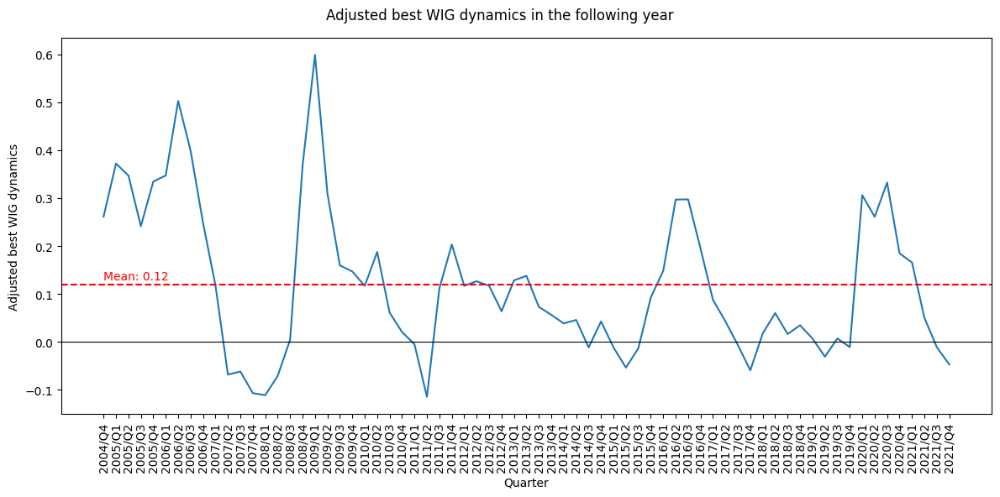

In [125]:
temp_df = dataset.filter(['quarter', 'adj_best_wig_dynamics_y']).groupby('quarter').mean()
temp_mean = temp_df.mean()[0]

fig, ax = plt.subplots(figsize=(12, 6))

sns.lineplot(
    data=temp_df,
    legend=False,
    ax=ax
)

ax.axhline(0, color='black', linewidth=.8)
ax.axhline(
    temp_df.mean()[0],
    color='red',
    linestyle='dashed'
)
ax.text(
    0, .13,
    f'Mean: {(temp_mean.round(2))}',
    color='red'
)

ax.tick_params(axis='x', labelrotation=90)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Adjusted best WIG dynamics')

plt.suptitle('Adjusted best WIG dynamics in the following year')

plt.tight_layout();

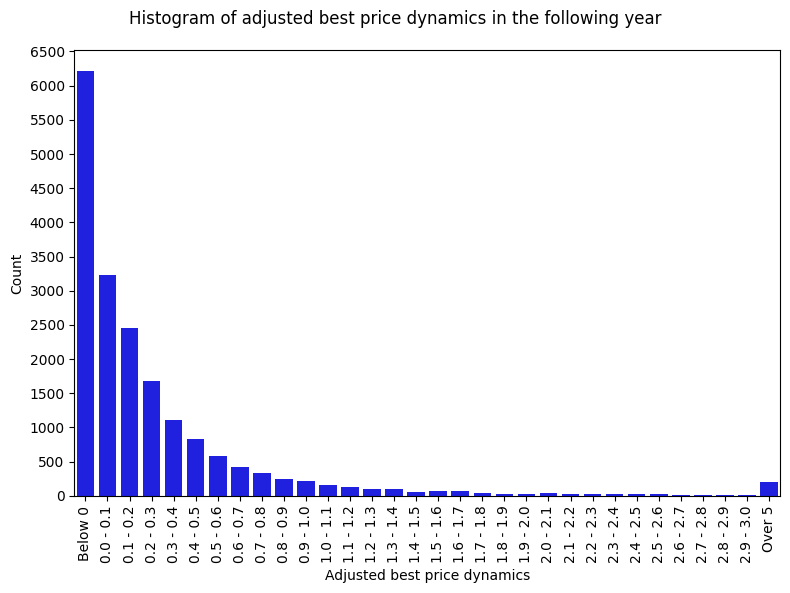

In [126]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        dataset.adj_best_price_dynamics_y,
        bins=[-.8] + list(np.arange(0, 3.1, .1)) + [67],
        labels=['Below 0']
            + [f'{round(i, 1)} - {round(i + 0.1, 1)}' for i in np.arange(0, 3, .1)]
            + ['Over 5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
plt.yticks(range(0, 7000, 500))

ax.set_xlabel('Adjusted best price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of adjusted best price dynamics in the following year')

plt.tight_layout();

Benjamin Graham recommended the portfolio of the minimum size from 10 (for his most defensive strategy) to 30. As we can see below, portfolios with treshold over 100% have long periods with their size below 10. On the other hand, portfolio with treshold equal 50% has size generally way over 30, but this gives a wide range of interesting companies.

In [127]:
# Temporary data frame with portfolio size depending on treshold
portfolio_df = pd.DataFrame(index=sorted(dataset.quarter.unique()))

for i in range(50, 225, 25):
    temp_price_df = dataset.filter(['quarter', 'adj_best_price_dynamics_y'])

    temp_price_df['sold_in_q'] = pd.Series(np.where(
        dataset.adj_best_price_dynamics_y > i/100,
        dataset.best_price_dynamics_in_q,
        dataset.price_dynamics_y_in_q
    ))

    temp_portfolio_df = pd.DataFrame(
        pd.Series(
            temp_price_df[
                temp_price_df.adj_best_price_dynamics_y > i/100
            ].groupby('quarter').quarter.count().reindex(
                sorted(dataset.quarter.unique())
            ).fillna(0), name='buy'
        )
    )
    temp_portfolio_df['sell'] = pd.Series(temp_price_df[
        temp_price_df.adj_best_price_dynamics_y > i/100
    ].groupby('sold_in_q').sold_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0))

    portfolio_df[f'Treshold: {i}%'] = (temp_portfolio_df.buy - temp_portfolio_df.sell).cumsum()

print('Size of portfolio in each quarter depending on treshold:')
portfolio_df

Size of portfolio in each quarter depending on treshold:


,Treshold: 50%,Treshold: 75%,Treshold: 100%,Treshold: 125%,Treshold: 150%,Treshold: 175%,Treshold: 200%
2004/Q4,26.00,14.00,10.00,8.00,7.00,7.00,4.00
2005/Q1,3.00,2.00,2.00,2.00,2.00,1.00,0.00
2005/Q2,6.00,5.00,5.00,4.00,4.00,3.00,2.00
2005/Q3,8.00,7.00,7.00,5.00,5.00,4.00,4.00
2005/Q4,76.00,60.00,52.00,38.00,34.00,26.00,25.00
...,...,...,...,...,...,...,...
2020/Q4,541.00,370.00,250.00,186.00,140.00,101.00,86.00
2021/Q1,320.00,196.00,112.00,79.00,61.00,40.00,30.00
2021/Q2,190.00,116.00,62.00,44.00,35.00,24.00,19.00
2021/Q3,106.00,64.00,39.00,26.00,21.00,19.00,15.00


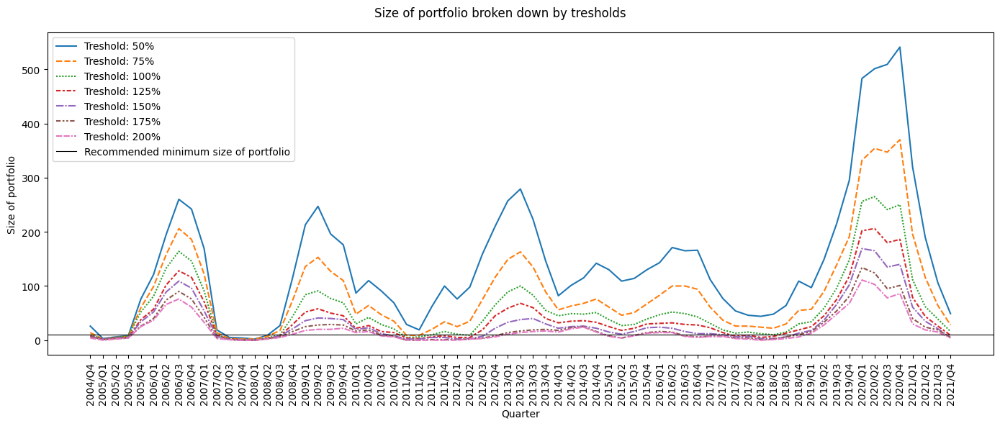

In [128]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio broken down by tresholds')

plt.tight_layout();

We should also pay attention to the sheer number of observations per quarter. It can easily be seen that in Q1-Q3 2005 and Q4 2021 only a few observations were available. As a result, it is likely that no strategy will be able to ensure that the portfolio is filled in all the quarters analysed, so we can make the somewhat looser assumption that the portfolio should have at least 10 companies in 80% of the periods analysed (i.e. in at least 55 quarters).

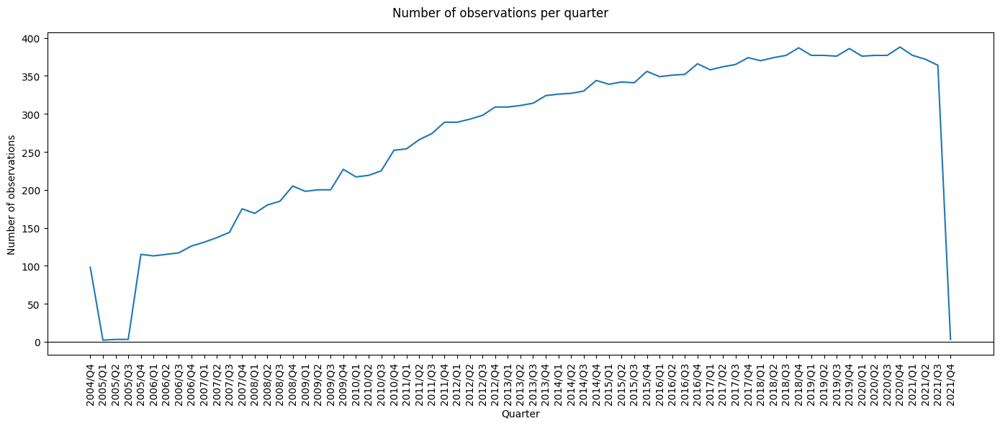

In [129]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=dataset.groupby('quarter').company_code.count(),
    ax=ax
)
ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Number of observations')

plt.suptitle('Number of observations per quarter')

plt.tight_layout();


Let's add **final_price_dynamics**, **final_wig_dynamics** and **interesting_investment** with treshold of 0.5 to the dataset - they would serve as temporary target features. The **final_price_dynamics** takes value of given treshold if **adj_best_price_dynamics_y** exceeds it and **price_dynamics_y** otherwise. Similarly works **final_wig_dynamics**. This logic is consistent with points 3. and 4. - we sell company if it reaches treshold or at the end of year regardless of its price. Finally, **interesting_company** is a variable which takes *Yes* if given company make a profit above the treshold, *Maybe* if company make a profit below the treshold and *No* if company make a loss.

*There is a huge gap between the 75th percentile (0.31) and maximum value (66.32) of **adj_best_price_dynamics_y**. However, such great increase in price values did happen in 2020 - the best example is MERCATOR, which price in 2019 was in the ballpark of a few PLNs, while in 2020 it skyrocketed to about 500 PLN. Although such observations may be seen as outliers, according to point 3. we sell company at given treshold anyway, so our investments would never achieve such high profit.*

In [130]:
print('The basic statistics of price and WIG dynamics:')
dataset[[
    'adj_best_price_dynamics_y',
    'adj_price_dynamics_y',
    'adj_best_wig_dynamics_y',
    'adj_wig_dynamics_y'
]].describe()

The basic statistics of price and WIG dynamics:


,adj_best_price_dynamics_y,adj_price_dynamics_y,adj_best_wig_dynamics_y,adj_wig_dynamics_y
count,18526.00,18526.00,18526.00,18526.00
mean,0.28,0.12,0.10,0.04
std,1.16,1.13,0.13,0.18
min,-0.80,-0.80,-0.11,-0.40
25%,-0.04,-0.22,0.00,-0.08
50%,0.09,-0.02,0.06,0.02
75%,0.33,0.23,0.17,0.15
max,66.32,66.32,0.60,0.60


In [131]:
# Adding final_price_dynamics, final_wig_dynamics and interesting_investment
final_dynamics = {
    'final_price_dynamics':pd.Series(
        np.where(
            dataset.adj_best_price_dynamics_y > .5,
            .5, dataset.adj_price_dynamics_y
        )
    ),
    'final_wig_dynamics':pd.Series(
        np.where(
            dataset.adj_best_wig_dynamics_y > .5,
            .5, dataset.adj_wig_dynamics_y
        )
    ),
    'sold_in_q':pd.Series(np.where(
        dataset.adj_best_price_dynamics_y > .5,
        dataset.best_price_dynamics_in_q,
        dataset.price_dynamics_y_in_q
    ))
}

dataset = pd.concat([dataset, pd.DataFrame(final_dynamics)], axis=1)


dataset['interesting_investment'] = pd.Categorical(
    pd.Series(
        np.where(
            dataset.final_price_dynamics == .5,
            'Yes', np.where(
                dataset.final_price_dynamics >= 0,
                'Maybe', 'No'
            )
        )
    ),
    categories=['No', 'Maybe', 'Yes'],
    ordered=True
)

Assuming the treshold at 0.5, there are 3010 interesting investments - about 16% of all observations. About 32% of observations made a profit below 50%. More than half of companies actually reported loss in the following year, with -0.8 as minimum **final_price_dynamics**. The mean **final_price_dynamics** is 0.01: if we randomly invest in a company and keep with points 3. and 4., we would make a profit of 1%.

In [132]:
print('The basic statistics of final price dynamics:')
print(dataset.final_price_dynamics.describe())
print('\nThe count of interesting companies:')
print(dataset.interesting_investment.value_counts())

The basic statistics of final price dynamics:
count   18526.00
mean        0.01
std         0.32
min        -0.80
25%        -0.22
50%        -0.02
75%         0.25
max         0.50
Name: final_price_dynamics, dtype: float64

The count of interesting companies:
No       9613
Maybe    5903
Yes      3010
Name: interesting_investment, dtype: int64


In [133]:
print('Percentage of companies which made a profit over 50%:', end=' ')
print(round(100 * len(dataset[dataset.interesting_investment == 'Yes']) / len(dataset), 2), end='%')
print('\nPercentage of companies which made a profit below 50%:', end=' ')
print(
    round(100 * len(dataset[dataset.interesting_investment == 'Maybe']) / len(dataset), 2), end='%'
)
print('\nPercentage of companies which made a loss:', end=' ')
print(round(100 * len(dataset[dataset.interesting_investment == 'No']) / len(dataset), 2), end='%')

Percentage of companies which made a profit over 50%: 16.25%
Percentage of companies which made a profit below 50%: 31.86%
Percentage of companies which made a loss: 51.89%

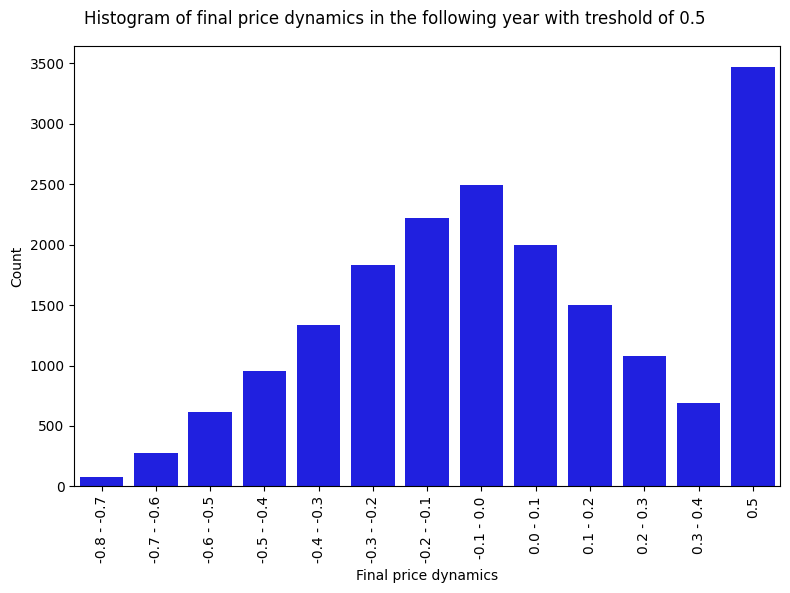

In [134]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        dataset.final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of final price dynamics in the following year with treshold of 0.5')

plt.tight_layout();

The average final WIG dynamics is much lower than average best WIG dynamics: 6% vs 12% respectively.

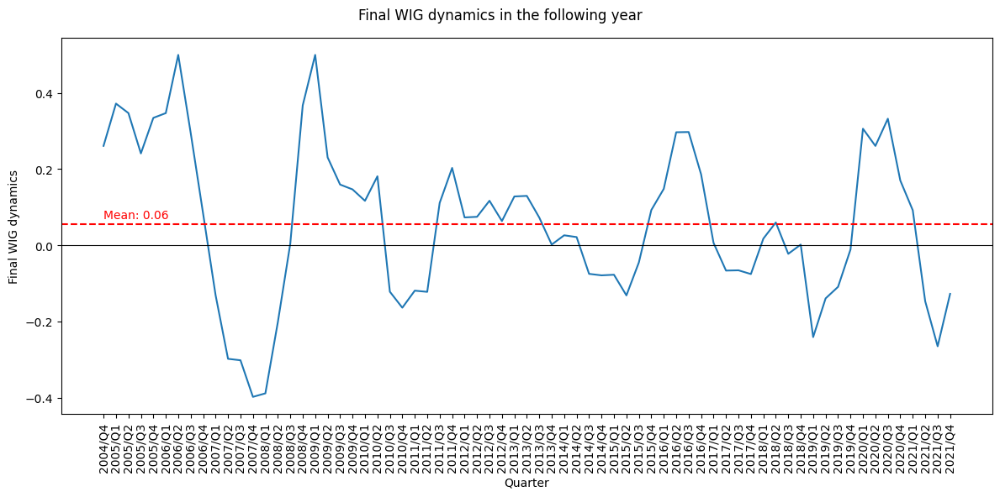

In [15]:
temp_df = dataset.filter(['quarter', 'final_wig_dynamics']).groupby('quarter').mean()
temp_mean = temp_df.mean()[0]

fig, ax = plt.subplots(figsize=(12, 6))

sns.lineplot(
    data=temp_df,
    legend=False,
    ax=ax
)

ax.axhline(0, color='black', linewidth=.8)
ax.axhline(
    temp_df.mean()[0],
    color='red',
    linestyle='dashed'
)
ax.text(
    0, .07,
    f'Mean: {(temp_mean.round(2))}',
    color='red'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Final WIG dynamics')

plt.suptitle('Final WIG dynamics in the following year')

plt.tight_layout();

# Joel Greenblatt's strategy

This strategy assumes, that we invest only in companies which:
- have capitalization greater than USD 50 million: stock market capitalization is the stock market value of a company, i.e. the current share price multiplied by the number of shares of the company outstanding;
- are at the top of combined ranking of EV/EBIT and ROIC indices in given quarter:
    - EV/EBIT: Enterprise value to operating earnings ratio, the ratio informs about the degree of coverage of the operating earnings with the value of the enterprise, the lower the value of the ratio, the more attractive the investment can be;
    - ROIC: EBIT to sum of equity and net financial debt ratio, the higher the value of the ratio, the more attractive the investment can be;
- they are home companies, i.e. they may be listed on given stock exchange, but they cannot be foreign companies;
- they are not from finance (investment, banking, debt_collecting, finance, capital_market, insurance, leasing_factoring) or home media industry (energy, fuels_gas).

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **capitalization_usd**: number of shares multiplied by price of share in USD, has to be higher than 50 000 000;
- **greenblatt_rank**: combined rank of EV/EBIT and ROIC (i.e. mean position from these two rankings), companies in top 10 in each quarter would be considered;
- **country**: two-letter abbreviation of country name, in this case only 'PL' would be included;
- **industry**: company's industry, excluding investment, banking, debt_collecting, finance, capital_market, insurance, leasing_factoring, energy, fuels_gas.
- **buy**: signal from Greenblatt's strategy, *Yes* if company should be bought, *No* otherwise.

In [16]:
# Excluded industry list
forbidden_industry = [
    'investment', 'banking', 'debt_collecting', 'finance', 'capital_market',
    'insurance', 'leasing_factoring', 'energy', 'fuels_gas'
]

# Filter data
greenblatt_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'capitalization_usd', 'greenblatt_rank', 'rank_ev_ebit', 'rank_roic',
    'ev_ebit', 'roic', 'country', 'industry'
])

# Add column 'buy' for observations, which meet strategy conditions
greenblatt_df['buy'] = np.where(
    (greenblatt_df.capitalization_usd > 50000000) &
    (greenblatt_df.greenblatt_rank <= 10) &
    (greenblatt_df.country == 'PL') &
    (~greenblatt_df.industry.isin(forbidden_industry)),
    'Yes', 'No'
)

greenblatt_df['sell_in_q'] = np.where(
    greenblatt_df.buy == 'Yes',
    greenblatt_df.best_price_dynamics_in_q,
    greenblatt_df.price_dynamics_y_in_q
)

greenblatt_df = greenblatt_df.dropna()

The analyzed subset contains 17519 observations (95% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 165 **interesting_investment** observations (3010 in original set vs 2845 in subset). However, the Greenblatt's strategy classified only 120 observations as worth buying - less than 1% of observations in this subdataset.

In [17]:
print('The basic statistics of final price dynamics in Greenblatt\'s strategy:')
print(greenblatt_df.final_price_dynamics.describe())
print('\nInteresting companies in Greenblatt\'s strategy:')
print(greenblatt_df.interesting_investment.value_counts())
print(f'\nNumber of buy signals from Greenblatt\'s strategy: {greenblatt_df.buy.value_counts()[1]}')

The basic statistics of final price dynamics in Greenblatt's strategy:
count   17519.00
mean        0.01
std         0.32
min        -0.80
25%        -0.22
50%        -0.02
75%         0.25
max         0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Greenblatt's strategy:
No       9127
Maybe    5547
Yes      2845
Name: interesting_investment, dtype: int64

Number of buy signals from Greenblatt's strategy: 120


Out of these 120 observations, only 25 were earlier classified as interesting investment. Besides, the strategy incorrectly classified 95 observations as those, which final price dynamics was equal 50%. The biggest problem, however, is that the strategy classified as worth buying as many as 73 observations that made a loss.

In [18]:
pd.crosstab(
    greenblatt_df.interesting_investment,
    greenblatt_df.buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from Greenblatt\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from Greenblatt's strategy:,No,Yes
Interesting investment:,,
No,9054,73
Maybe,5525,22
Yes,2820,25


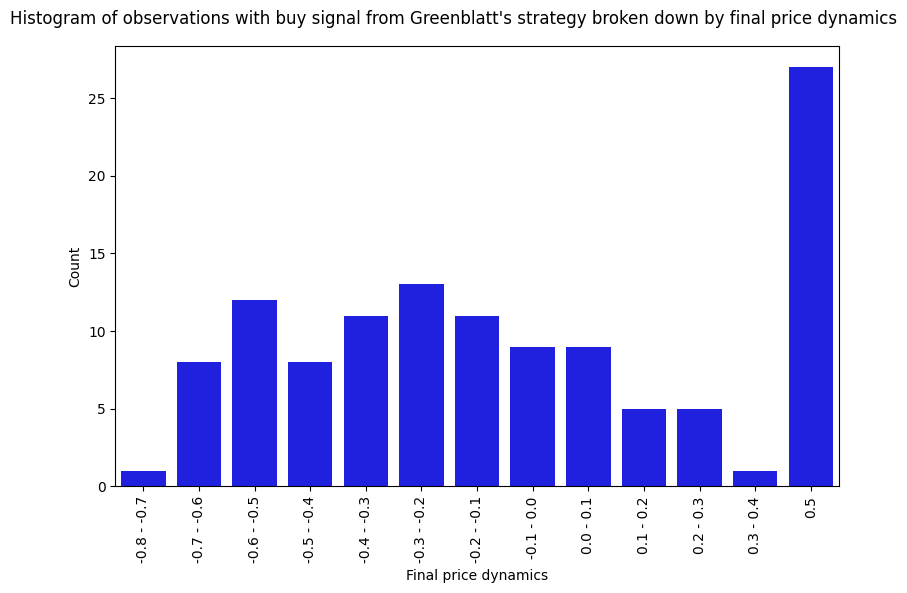

In [19]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        greenblatt_df[greenblatt_df.buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle(
    'Histogram of observations with buy signal from '\
    'Greenblatt\'s strategy broken down by final price dynamics'
)

plt.tight_layout();

The Greenblatt's strategy sent buy signal in 61 of the analyzed quarters and was profitable in only 1/3 of them. The strategy outperformed zero effort strategy (i.e. investing in WIG) in 25% of analyzed periods. The average return on the Greenblatt's stategy is negative (-8.9%), while for the zero effort strategy it is positive (5.6%). Moreover, there were 8 quarters, when there were no companies classified as worth buying. In effect, the portfolio reached the minimum size in only 3 quarters.

In [20]:
greenblatt_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean(),
    'Greenblatt\'s strategy':greenblatt_df[
        greenblatt_df.buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()
})

greenblatt_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        greenblatt_df[
            greenblatt_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        greenblatt_df[
            greenblatt_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
greenblatt_portfolio_df['Greenblatt\'s strategy'] = (
    greenblatt_portfolio_df.buy_in_q - greenblatt_portfolio_df.sell_in_q
).cumsum()
greenblatt_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(greenblatt_return_df, greenblatt_portfolio_df, 'Greenblatt\'s strategy')

Number of quarters with buy signal from Greenblatt's strategy: 61
Number of quarters with sufficient portfolio size: 3
Number of profitable quarters using Greenblatt's strategy: 22
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Greenblatt's strategy outperformed zero effort strategy: 17
Average return on Greenblatt's strategy: -8.9%
Average return on zero effort strategy: 5.6%


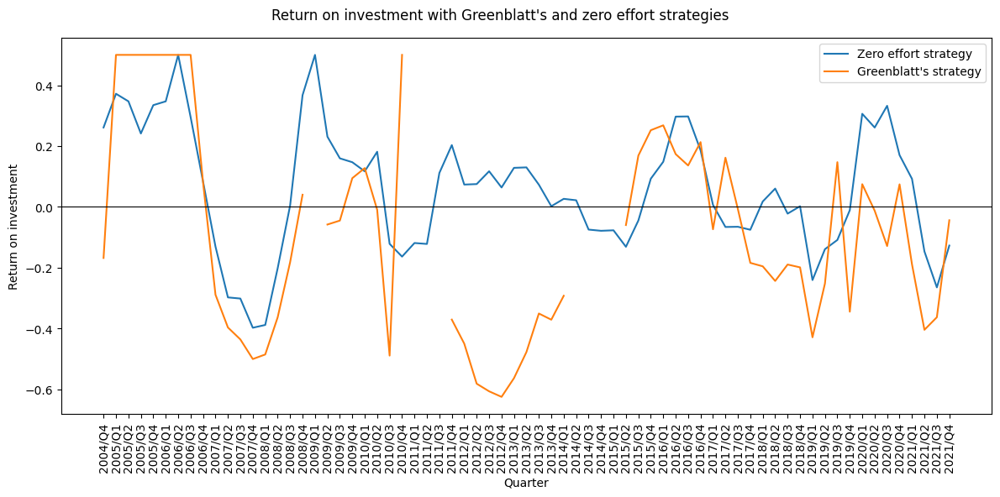

In [21]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    greenblatt_return_df.index,
    greenblatt_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Greenblatt\'s strategy'])

plt.suptitle('Return on investment with Greenblatt\'s and zero effort strategies')

plt.tight_layout();

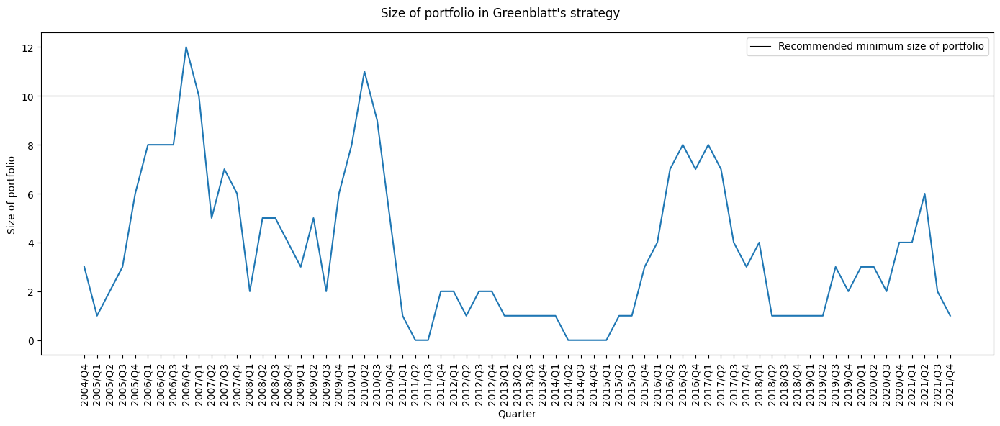

In [22]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=greenblatt_portfolio_df,
    legend=False,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Greenblatt\'s strategy')

plt.tight_layout();

The company's capitalization in USD is the first element of Greenblatt's strategy. The range of this feature is from USD 6.3 thousand to USD 75 billion with mean value of USD 411 million, though the median is USD 40 million. About 55% of observations fall below the strategy treshold of USD 50 million.

In [23]:
print('The basic statistics of capitalization in USD in Greenblatt\'s strategy:')
print(greenblatt_df.capitalization_usd.describe())
print('\nCapitalization in USD million in Greenblatt\'s strategy:')
print(pd.Series(np.where(
    greenblatt_df.capitalization_usd > 5e7,
    'Over USD 50 million', 'Below USD 50 million'
)).value_counts())

The basic statistics of capitalization in USD in Greenblatt's strategy:
count         17519.00
mean      410831261.65
std      1809888450.02
min            6306.89
25%        13775613.90
50%        39734853.49
75%       149477088.81
max     74944024919.08
Name: capitalization_usd, dtype: float64

Capitalization in USD million in Greenblatt's strategy:
Below USD 50 million    9654
Over USD 50 million     7865
dtype: int64


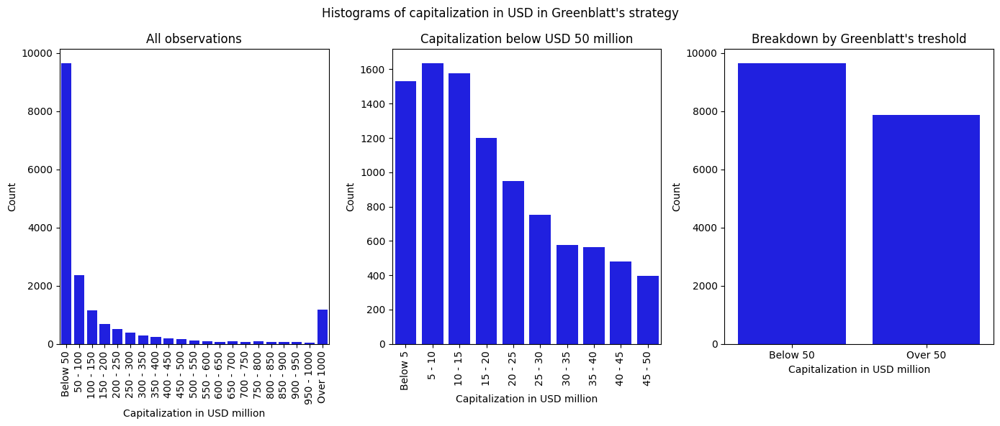

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        greenblatt_df.capitalization_usd,
        bins=list(np.arange(0, 10.5e8, 5e7)) + [7.5e10],
        labels=['Below 50'] + [f'{i} - {i+50}' for i in range(50, 1000, 50)] + ['Over 1000']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        greenblatt_df[greenblatt_df.capitalization_usd < 5e7].capitalization_usd,
        bins=list(np.arange(0, 5.5e7, 5e6)),
        labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        greenblatt_df.capitalization_usd,
        bins=[0, 5e7, 7.5e10],
        labels=['Below 50', 'Over 50']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of capitalization in USD in Greenblatt\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 50 million')
axs[2].set_title('Breakdown by Greenblatt\'s treshold')

plt.tight_layout();

The boxplots below indicate, that Greenblatt's treshold for capitalization in USD is not proper for analyzed dataset. The median final price dynamics is actually higher for companies with capitalization below USD 50 million then the rest (and even higher for companies with capitalization below USD 15 million). Moreover, there are number of intervals which should minimize losses a bit, i.e. have either minimum value or 75th percentile closer to 0 - however, all intervals contain some observations with negative final price dynamics.

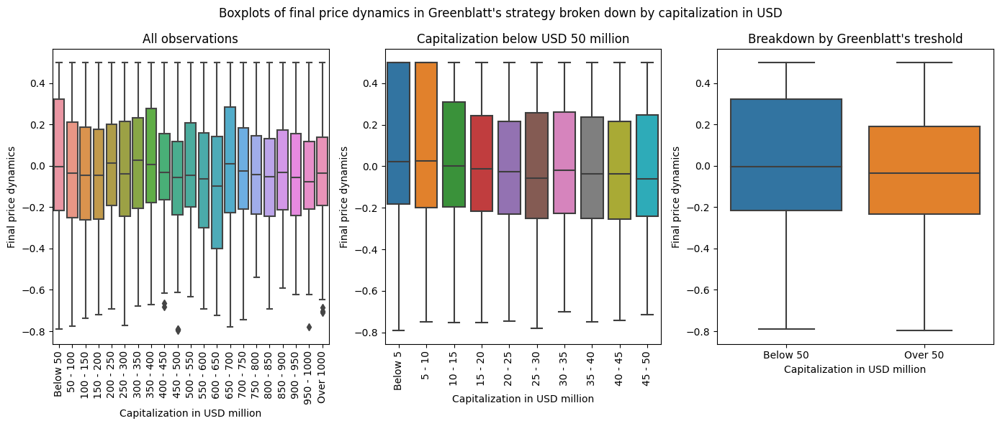

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        greenblatt_df.capitalization_usd,
        bins=list(np.arange(0, 10.5e8, 5e7)) + [7.5e10],
        labels=['Below 50'] + [f'{i} - {i+50}' for i in range(50, 1000, 50)] + ['Over 1000']
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        greenblatt_df[greenblatt_df.capitalization_usd < 5e7].capitalization_usd,
        bins=list(np.arange(0, 5.5e7, 5e6)),
        labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)]
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        greenblatt_df.capitalization_usd,
        bins=[0, 5e7, 7.5e10],
        labels=['Below 50', 'Over 50']
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle(
    'Boxplots of final price dynamics in Greenblatt\'s '\
    'strategy broken down by capitalization in USD'
)
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 50 million')
axs[2].set_title('Breakdown by Greenblatt\'s treshold')

plt.tight_layout();

Looking at proportion of interesting investments confirms that companies with capitalization below USD 50 million gave greater chance of return of investment of at least 50%. Especially observations with capitalization below USD 15 million - or even 5 million - are promising. Similarly, observations with capitalization below USD 10 million provides the lowest risk of loss.

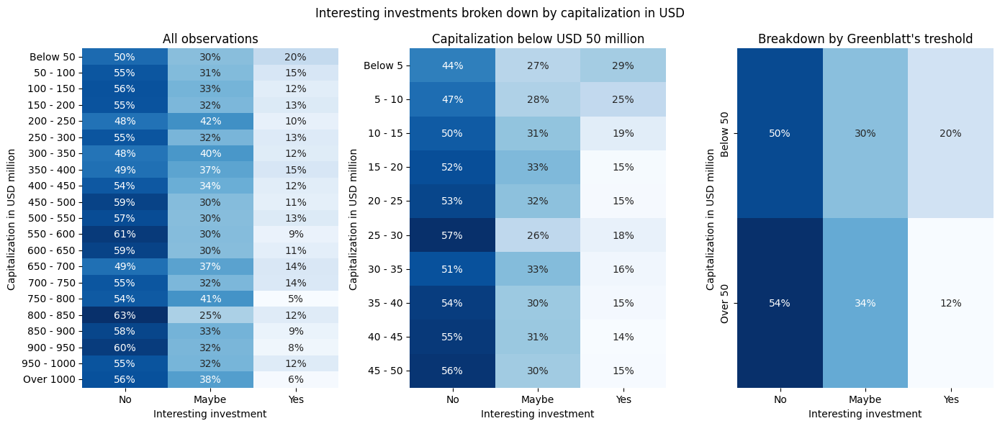

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.capitalization_usd,
            bins=list(np.arange(0, 10.5e8, 5e7)) + [7.5e10],
            labels=['Below 50'] + [f'{i} - {i+50}' for i in range(50, 1000, 50)] + ['Over 1000']
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df[greenblatt_df.capitalization_usd < 5e7].capitalization_usd,
            bins=list(np.arange(0, 5.5e7, 5e6)),
            labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)]
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.capitalization_usd,
            bins=[0, 5e7, 7.5e10],
            labels=['Below 50', 'Over 50']
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Capitalization in USD million')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by capitalization in USD')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 50 million')
axs[2].set_title('Breakdown by Greenblatt\'s treshold')

plt.tight_layout();

The position in Greenblatt's ranking is a very limiting variable - only 660 observations (less than 4% of whole subdataset) passed this constraint. This feature represents an average position in EV/EBIT ranking (the lower value of EV/EBIT the better, excluding negative values) and ROIC ranking (the higher value of ROIC the better), so we have to look also at these features to understand influence of Greenblatt's ranking.

In [27]:
print('Greenblatt\'s ranking:')
print(pd.Series(np.where(
    greenblatt_df.greenblatt_rank <= 10,
    'Below 11th position', 'Over 10th position'
)).value_counts())

Greenblatt's ranking:
Over 10th position     16859
Below 11th position      660
dtype: int64


As we can see in the boxplots below, the median and 75th percentile of final price dynamics grow slowly with lower position in Greenblatt's ranking. Simultaneously, in EV/EBIT and ROIC rankings the 2nd and 3rd quartiles decrease with lower position. This situation occurs because of construction of Greenblatt's ranking - it takes not only observations with top position in each ranking, but also those, which have good EV/EBIT value and worse ROIC value (or vice versa). In the result, the mediocre observations are taken into consideration.

Suprisingly, there are intervals at the end of EV/EBIT and ROIC rankings, which have similar interquartile range to those from the top. Similarly, the proportion of interesting investments are the highest for tops and bottoms of both rankings. In both cases there are negative values at the end of each ranking (i.e. EV/EBIT ranking is ascending, but negative values are moved to the end, ROIC ranking is descending, so negative values would be always at the end), so it may be a good idea to look at EV/EBIT and ROIC directly.

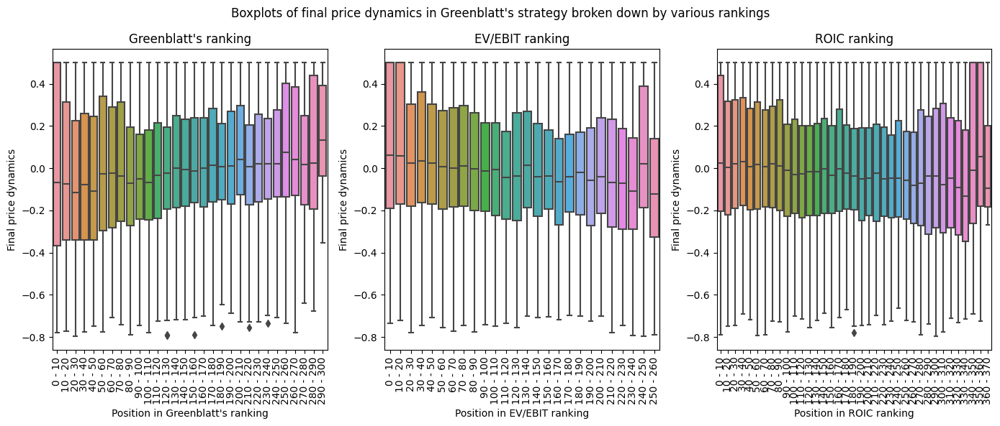

In [28]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        greenblatt_df.greenblatt_rank,
        bins=range(0, 310, 10),
        labels=[f'{i} - {i+10}' for i in range(0, 300, 10)]
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        greenblatt_df.rank_ev_ebit,
        bins=range(0, 270, 10),
        labels=[f'{i} - {i+10}' for i in range(0, 260, 10)]
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        greenblatt_df.rank_roic,
        bins=range(0, 380, 10),
        labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')

axs[0].set_xlabel('Position in Greenblatt\'s ranking')
axs[1].set_xlabel('Position in EV/EBIT ranking')
axs[2].set_xlabel('Position in ROIC ranking')

plt.suptitle(
    'Boxplots of final price dynamics in Greenblatt\'s '\
    'strategy broken down by various rankings'
)
axs[0].set_title('Greenblatt\'s ranking')
axs[1].set_title('EV/EBIT ranking')
axs[2].set_title('ROIC ranking')

plt.tight_layout();

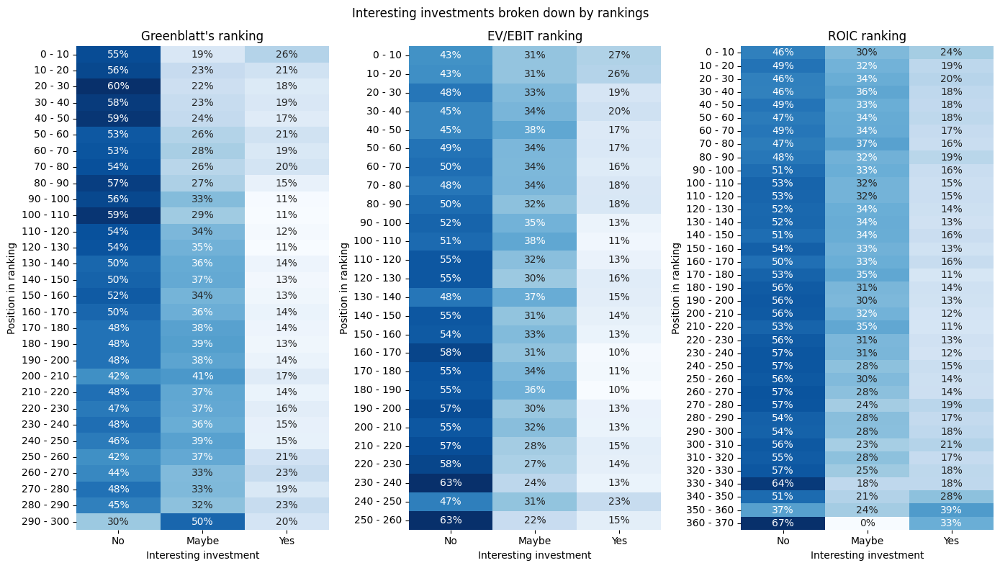

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.greenblatt_rank,
            bins=range(0, 310, 10),
            labels=[f'{i} - {i+10}' for i in range(0, 300, 10)]
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.rank_ev_ebit,
            bins=range(0, 270, 10),
            labels=[f'{i} - {i+10}' for i in range(0, 260, 10)]
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.rank_roic,
            bins=range(0, 380, 10),
            labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Position in ranking')

plt.suptitle('Interesting investments broken down by rankings')
axs[0].set_title('Greenblatt\'s ranking')
axs[1].set_title('EV/EBIT ranking')
axs[2].set_title('ROIC ranking')

plt.tight_layout();

About 1/5 of EV/EBIT values are negative and putting them at the bottom of EV/EBIT ranking may improve performance of observations with low ranking position. However, as this feature's boxplot suggests, the best values of EV/EBIT are in the interval of 0 - 4 (or, more conservatively, 0 - 2). These intervals provide also the highest chance of return on investment greater than 50%, as well as the lowest risk of making a loss.

In case of ROIC, the negative values may have better performance than some of positive intervals. However, the best chance of hitting interesting investment - and the lowest risk of making a loss - provides ROIC over 0.5. Such values represent less than 5% of the analyzed dataset.

In [30]:
print('The basic statistics of EV/EBIT and ROIC in Greenblatt\'s strategy:')
greenblatt_df[['ev_ebit', 'roic']].describe()

The basic statistics of EV/EBIT and ROIC in Greenblatt's strategy:


,ev_ebit,roic
count,17519.00,17519.00
mean,28.53,-0.00
std,1868.04,7.74
min,-56395.54,-713.13
25%,3.18,0.02
50%,9.02,0.09
75%,15.70,0.17
max,180275.63,232.49


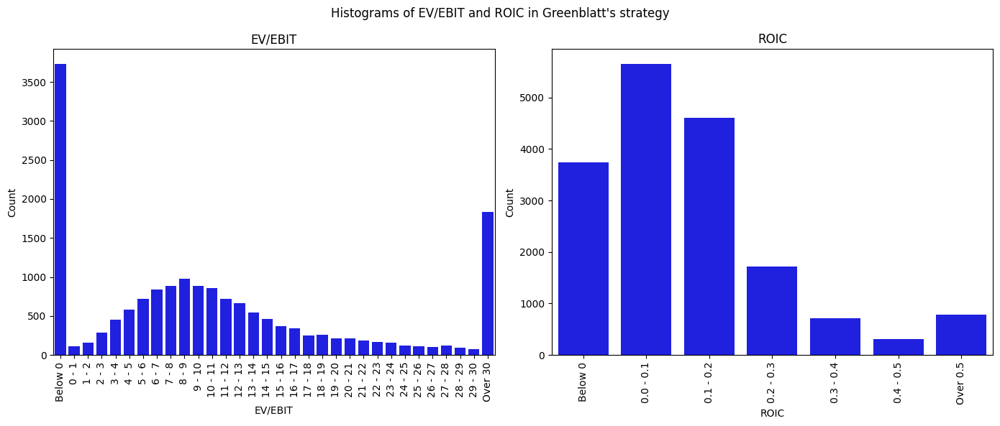

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        greenblatt_df.ev_ebit,
        bins=[-1e4] + list(range(0, 31)) + [2e4],
        labels=['Below 0'] + [f'{i} - {i+1}' for i in range(0, 30)] + ['Over 30']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        greenblatt_df.roic,
        bins=[-1e4] + list(np.arange(0, .6, .1)) + [2e4],
        labels=['Below 0']
            + [f'{round(i, 1)} - {round(i+.1, 1)}' for i in np.arange(0, .5, .1)]
            + ['Over 0.5']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Count')

axs[0].set_xlabel('EV/EBIT')
axs[1].set_xlabel('ROIC')

plt.suptitle('Histograms of EV/EBIT and ROIC in Greenblatt\'s strategy')
axs[0].set_title('EV/EBIT')
axs[1].set_title('ROIC')

plt.tight_layout();

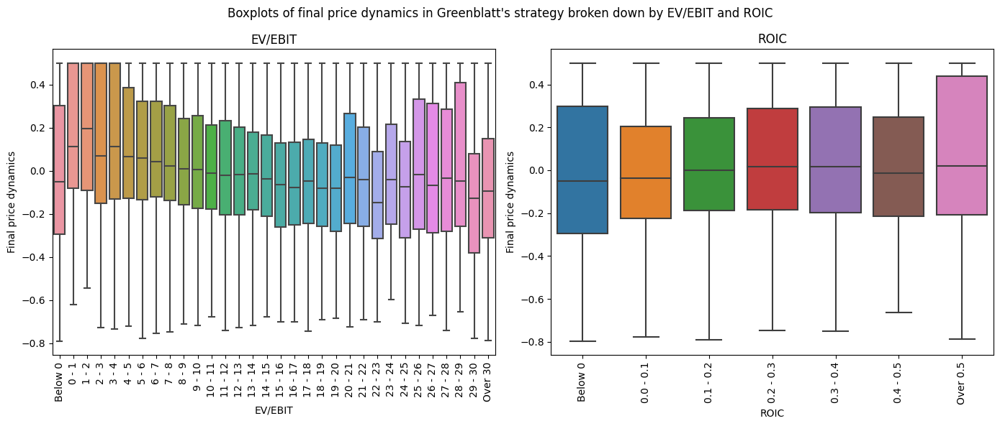

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        greenblatt_df.ev_ebit,
        bins=[-1e4] + list(range(0, 31)) + [2e4],
        labels=['Below 0'] + [f'{i} - {i+1}' for i in range(0, 30)] + ['Over 30']
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        greenblatt_df.roic,
        bins=[-1e4] + list(np.arange(0, .6, .1)) + [2e4],
        labels=['Below 0']
            + [f'{round(i, 1)} - {round(i+.1, 1)}' for i in np.arange(0, .5, .1)]
            + ['Over 0.5']
    ),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')
axs[0].set_xlabel('EV/EBIT')
axs[1].set_xlabel('ROIC')

plt.suptitle(
    'Boxplots of final price dynamics in Greenblatt\'s '\
    'strategy broken down by EV/EBIT and ROIC'
)
axs[0].set_title('EV/EBIT')
axs[1].set_title('ROIC')

plt.tight_layout();

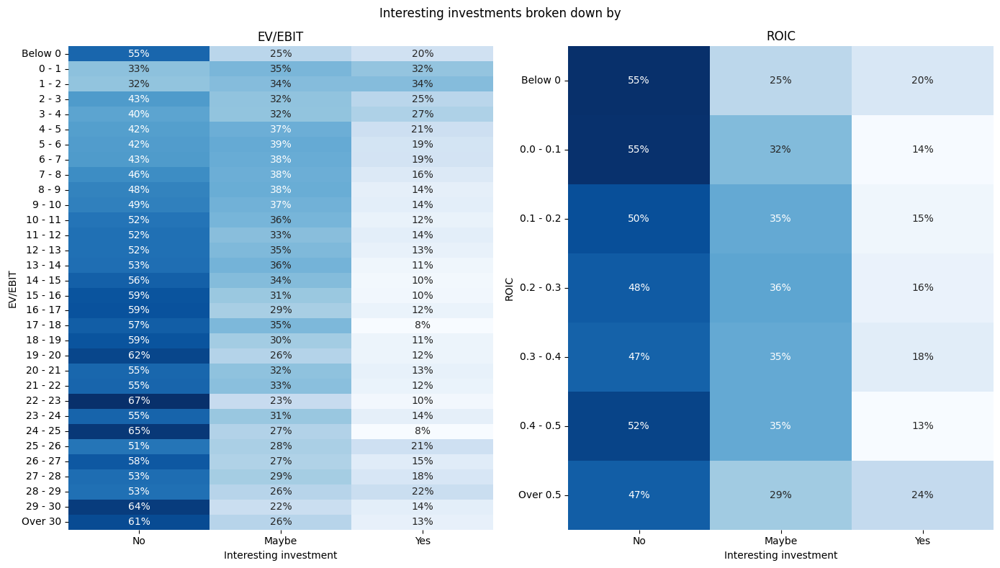

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.ev_ebit,
            bins=[-1e4] + list(range(0, 31)) + [2e4],
            labels=['Below 0'] + [f'{i} - {i+1}' for i in range(0, 30)] + ['Over 30']
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            greenblatt_df.roic,
            bins=[-1e4] + list(np.arange(0, .6, .1)) + [2e4],
            labels=['Below 0']
                + [f'{round(i, 1)} - {round(i+.1, 1)}' for i in np.arange(0, .5, .1)]
                + ['Over 0.5']
        ),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')

axs[0].set_ylabel('EV/EBIT')
axs[1].set_ylabel('ROIC')

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('EV/EBIT')
axs[1].set_title('ROIC')

plt.tight_layout();

The vast majority of observations concerned Polish companies (more than 90%). Among foreign companies, those from Luxembourg and the Netherlands prevailed. Home companies are comparable with average foreign company, though there are some companies from countries like Spain or Bulgaria, which performs better than Polish. It may be a good idea to use all countries to increase the number of observations with a buy signal.

In [34]:
print('Companies in Greenblatt\'s strategy:')
print(pd.Series(np.where(
    greenblatt_df.country == 'PL',
    'Home', 'Foreign'
)).value_counts())

Companies in Greenblatt's strategy:
Home       16333
Foreign     1186
dtype: int64


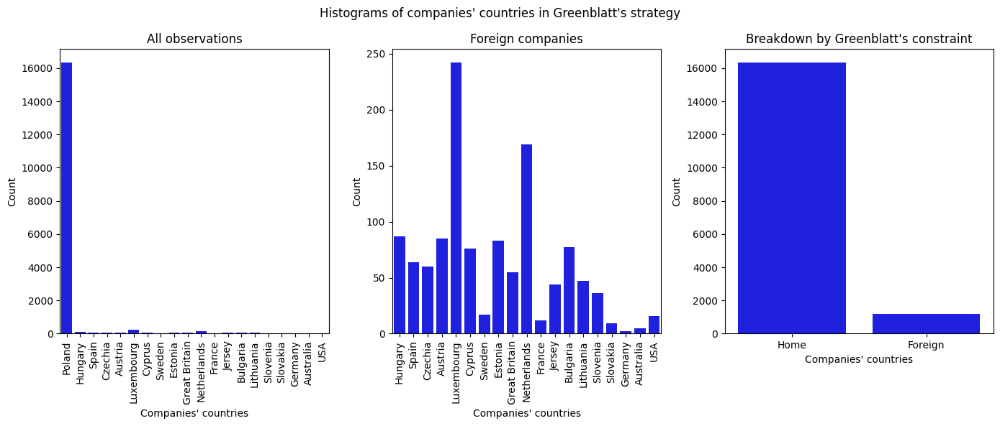

In [35]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=greenblatt_df.country,
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=greenblatt_df[greenblatt_df.country != 'PL'].country,
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.Series(np.where(
        greenblatt_df.country == 'PL',
        'Home', 'Foreign'
    )),
    color='blue',
    ax=axs[2]
)

axs[0].set_xticklabels([
    'Poland', 'Hungary', 'Spain', 'Czechia', 'Austria', 'Luxembourg', 'Cyprus',
    'Sweden', 'Estonia', 'Great Britain', 'Netherlands', 'France', 'Jersey',
    'Bulgaria', 'Lithuania', 'Slovenia', 'Slovakia', 'Germany', 'Australia', 'USA'
])

axs[1].set_xticklabels([
    'Hungary', 'Spain', 'Czechia', 'Austria', 'Luxembourg', 'Cyprus', 'Sweden',
    'Estonia', 'Great Britain', 'Netherlands', 'France', 'Jersey', 'Bulgaria',
    'Lithuania', 'Slovenia', 'Slovakia', 'Germany', 'Australia', 'USA'
])

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Companies\' countries')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of companies\' countries in Greenblatt\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Foreign companies')
axs[2].set_title('Breakdown by Greenblatt\'s constraint')

plt.tight_layout();

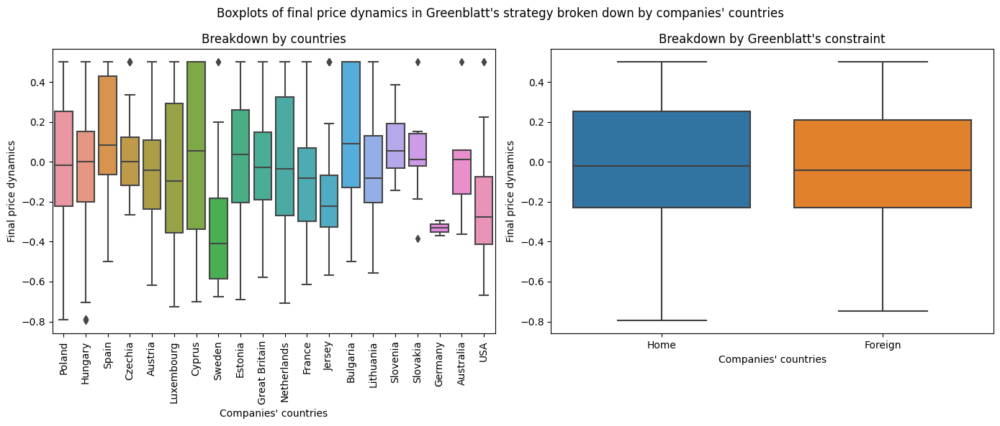

In [36]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=greenblatt_df.country,
    y=greenblatt_df.final_price_dynamics,
    ax=axs[0]
)
sns.boxplot(
    x=pd.Series(np.where(
        greenblatt_df.country == 'PL',
        'Home', 'Foreign'
    )),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[1]
)

axs[0].set_xticklabels([
    'Poland', 'Hungary', 'Spain', 'Czechia', 'Austria', 'Luxembourg', 'Cyprus',
    'Sweden', 'Estonia', 'Great Britain', 'Netherlands', 'France', 'Jersey',
    'Bulgaria', 'Lithuania', 'Slovenia', 'Slovakia', 'Germany', 'Australia', 'USA'
])

for i in range(2):
    axs[i].set_xlabel('Companies\' countries')
    axs[i].set_ylabel('Final price dynamics')
axs[0].tick_params(axis='x', labelrotation=90)

plt.suptitle('Boxplots of final price dynamics in Greenblatt\'s '\
    'strategy broken down by companies\' countries')
axs[0].set_title('Breakdown by countries')
axs[1].set_title('Breakdown by Greenblatt\'s constraint')

plt.tight_layout();

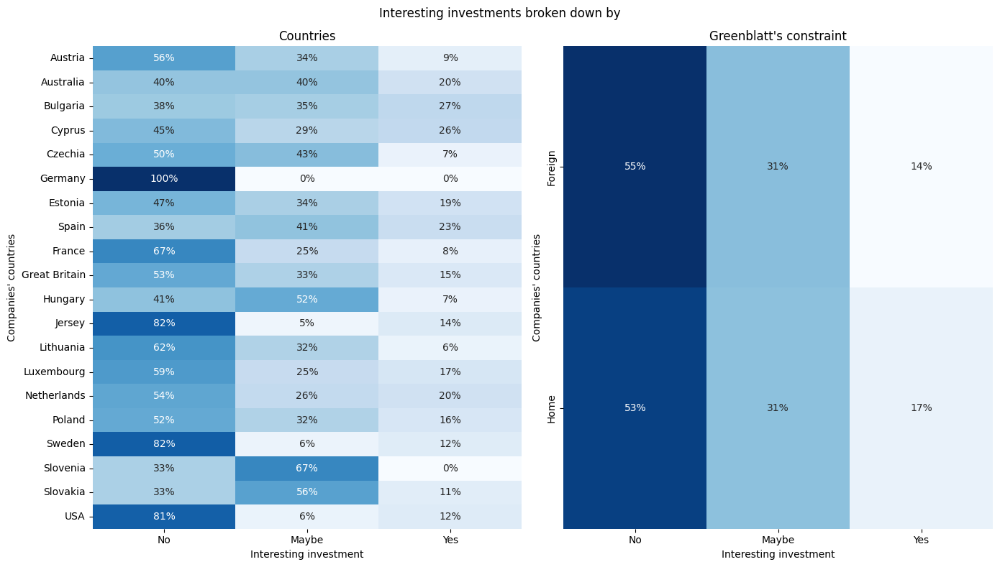

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        greenblatt_df.country,
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            greenblatt_df.country == 'PL',
            'Home', 'Foreign'
        )),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

axs[0].set_yticklabels([
    'Austria', 'Australia', 'Bulgaria', 'Cyprus', 'Czechia', 'Germany',
    'Estonia', 'Spain', 'France', 'Great Britain', 'Hungary', 'Jersey',
    'Lithuania', 'Luxembourg', 'Netherlands', 'Poland', 'Sweden',
    'Slovenia', 'Slovakia', 'USA'
])

for i in range(2):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Companies\' countries')
axs[0].tick_params(axis='y', labelrotation=0)

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('Countries')
axs[1].set_title('Greenblatt\'s constraint')

plt.tight_layout();

The case of industries is similar to countries - there is only small difference between average included and excluded observations. Similarly, we may use all industries to increase number of available observations.

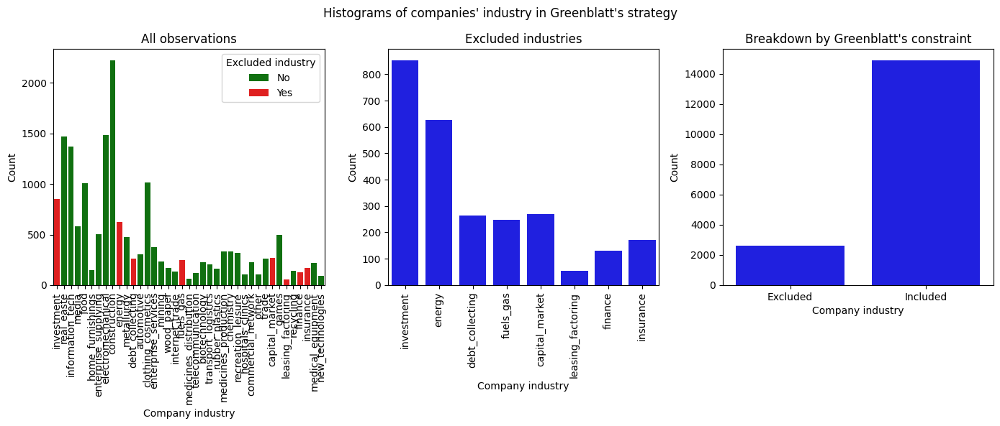

In [38]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=greenblatt_df.industry,
    hue=greenblatt_df.industry.isin(forbidden_industry),
    palette=['green', 'red'],
    dodge=False,
    ax=axs[0]
)

sns.countplot(
    x=greenblatt_df[greenblatt_df.industry.isin(forbidden_industry)].industry,
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.Series(np.where(
        greenblatt_df.industry.isin(forbidden_industry),
        'Excluded', 'Included'
    )),
    color='blue',
    ax=axs[2]
)

axs[0].legend(title='Excluded industry', labels=['No', 'Yes'])

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Company industry')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of companies\' industry in Greenblatt\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Excluded industries')
axs[2].set_title('Breakdown by Greenblatt\'s constraint')

plt.tight_layout();

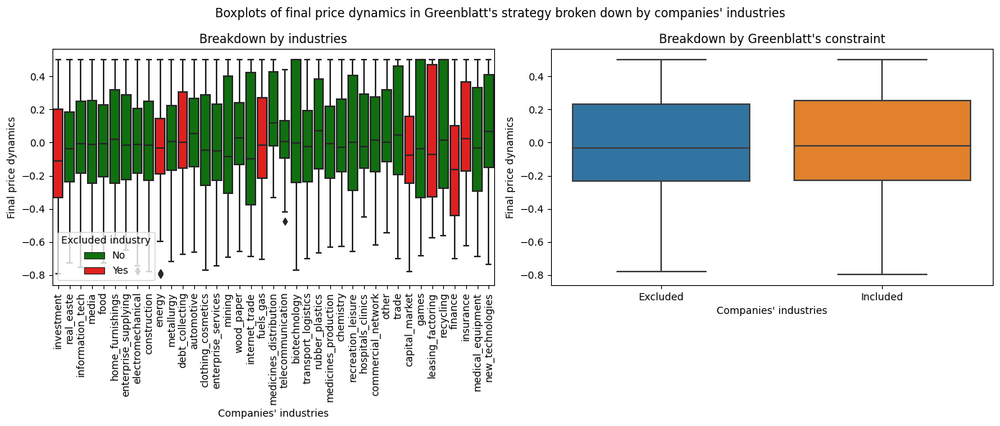

In [39]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=greenblatt_df.industry,
    y=greenblatt_df.final_price_dynamics,
    hue=greenblatt_df.industry.isin(forbidden_industry),
    palette=['green', 'red'],
    dodge=False,
    ax=axs[0]
)
sns.boxplot(
    x=pd.Series(np.where(
        greenblatt_df.industry.isin(forbidden_industry),
        'Excluded', 'Included'
    )),
    y=greenblatt_df.final_price_dynamics,
    ax=axs[1]
)

axs[0].legend(title='Excluded industry', labels=['No', 'Yes'], loc='lower left')

for i in range(2):
    axs[i].set_xlabel('Companies\' industries')
    axs[i].set_ylabel('Final price dynamics')
axs[0].tick_params(axis='x', labelrotation=90)

plt.suptitle('Boxplots of final price dynamics in Greenblatt\'s '\
    'strategy broken down by companies\' industries')
axs[0].set_title('Breakdown by industries')
axs[1].set_title('Breakdown by Greenblatt\'s constraint')

plt.tight_layout();

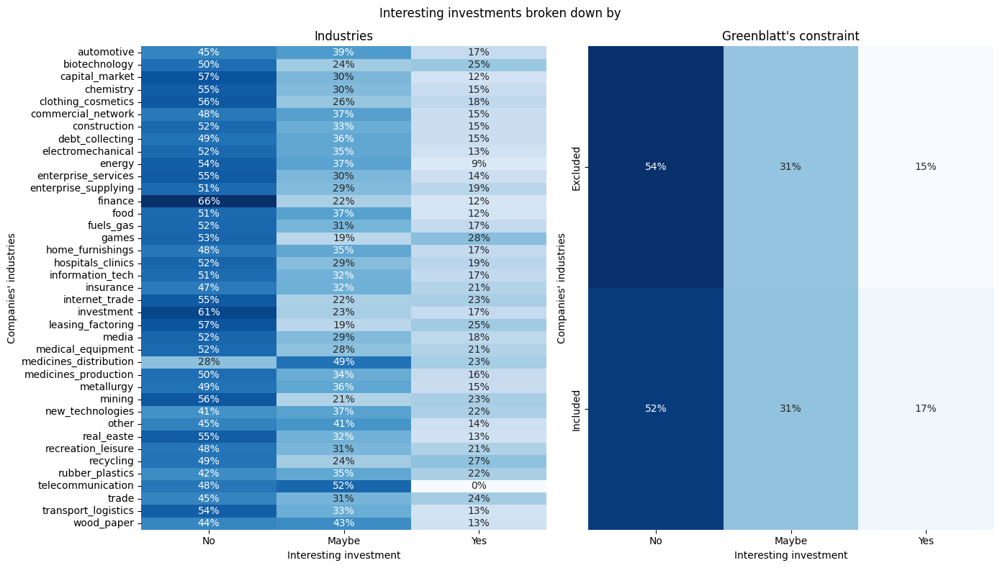

In [40]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        greenblatt_df.industry,
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            greenblatt_df.industry.isin(forbidden_industry),
            'Excluded', 'Included'
        )),
        greenblatt_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Companies\' industries')

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('Industries')
axs[1].set_title('Greenblatt\'s constraint')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed by Greenblatt, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. As we can see below, the best average return is provided by choosing companies with capitalization below USD 50 million, EV/EBIT between 0 and 3.8, as well as ROIC over 0.05.

In [41]:
greenblatt_mod_df = {
    'Capitalization in USD below:':[],
    'EV/EBIT between 0 and:':[],
    'ROIC over:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.linspace(5e6, 5e7, 10): # Capitalization in million USD
    for mod_2 in np.linspace(.1, 4, 40): # EV/EBIT
        for mod_3 in np.linspace(.5, 0, 11): # ROIC
            greenblatt_df['mod_buy'] = np.where(
                (greenblatt_df.capitalization_usd < mod_1) &
                (greenblatt_df.ev_ebit > 0) &
                (greenblatt_df.ev_ebit < mod_2) &
                (greenblatt_df.roic > mod_3),
                'Yes', 'No'
            )

            # Return on Modified Greenblatt\'s strategy
            greenblatt_return_df['Modified Greenblatt\'s strategy'] = greenblatt_df[
                greenblatt_df.mod_buy == 'Yes'
            ].groupby('quarter').final_price_dynamics.mean()
            avg_strategy_return = (
                100 * greenblatt_return_df['Modified Greenblatt\'s strategy'].mean()
            ).round(2)

            # If positive
            if avg_strategy_return > 0:

                # Size of portfolio in Modified Greenblatt\'s strategy
                greenblatt_portfolio_df['buy_in_q'] = pd.Series(
                    greenblatt_df[
                        greenblatt_df.mod_buy == 'Yes'
                    ].groupby('quarter').quarter.count().reindex(
                        sorted(dataset.quarter.unique())).fillna(0)
                )
                greenblatt_portfolio_df['sell_in_q'] = pd.Series(
                    greenblatt_df[
                        greenblatt_df.mod_buy == 'Yes'
                    ].groupby('sell_in_q').sell_in_q.count().reindex(
                        sorted(dataset.quarter.unique())).fillna(0)
                )

                greenblatt_portfolio_df['Modified Greenblatt\'s strategy'] = (
                    greenblatt_portfolio_df.buy_in_q - greenblatt_portfolio_df.sell_in_q
                ).cumsum()
                greenblatt_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                quarters_with_good_portfolio_size = greenblatt_portfolio_df[
                    greenblatt_portfolio_df['Modified Greenblatt\'s strategy'] >= 10
                ]['Modified Greenblatt\'s strategy'].count()

                # If number of quarters with good portfolio size > 55 (80% of all quarters)
                if quarters_with_good_portfolio_size > 55:

                    # Profitable quarters
                    quarters_profit_strat = greenblatt_return_df[
                        greenblatt_return_df['Modified Greenblatt\'s strategy'] > 0
                    ]['Modified Greenblatt\'s strategy'].count()

                    # Strategy > zero effort strategy
                    quarters_perform_strat = greenblatt_return_df[
                        greenblatt_return_df[
                            'Modified Greenblatt\'s strategy'
                        ] > greenblatt_return_df['Zero effort strategy']
                    ]['Modified Greenblatt\'s strategy'].count()

                    greenblatt_mod_df['Capitalization in USD below:'].append(mod_1)
                    greenblatt_mod_df['EV/EBIT between 0 and:'].append(mod_2)
                    greenblatt_mod_df['ROIC over:'].append(mod_3)
                    greenblatt_mod_df['Average return (%)'].append(avg_strategy_return)
                    greenblatt_mod_df[
                        'Number of quarters with portfolio size over 10'
                    ].append(quarters_with_good_portfolio_size)
                    greenblatt_mod_df['Number of profitable quarters'].append(quarters_profit_strat)
                    greenblatt_mod_df[
                        'Number of quarters in which strategy outperformed zero effort strategy'
                    ].append(quarters_perform_strat)

                    # Number of signals
                    signals = greenblatt_df.mod_buy.value_counts()[1]

                    # Crosstab
                    ctab = pd.crosstab(
                        greenblatt_df.interesting_investment,
                        greenblatt_df.mod_buy,
                        rownames=['Interesting investment:'],
                        colnames=['Buy signal from modified Greenblatt\'s strategy:']
                    ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                    # % of interesting_investment == Maybe or Yes
                    greenblatt_mod_df[
                        'Percentage of profitable investments'
                    ].append(round(100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals))
                    # % of interesting_investment == No
                    greenblatt_mod_df[
                        'Percentage of loss-making investments'
                    ].append(round(100 * ctab.iloc[0, 1] / signals))

greenblatt_mod_df = pd.DataFrame(greenblatt_mod_df)

print('Data frame with best modifications of Greenblatt\'s strategy:')
greenblatt_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Greenblatt's strategy:


,Capitalization in USD below:,EV/EBIT between 0 and:,ROIC over:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
3,50000000.00,3.80,0.05,9.71,57,40,35,63,37
4,50000000.00,3.80,0.00,9.51,57,40,36,63,37
1,45000000.00,4.00,0.05,9.15,57,41,35,63,37
8,50000000.00,4.00,0.05,9.12,59,40,34,63,37
2,45000000.00,4.00,0.00,8.98,57,41,34,63,37
9,50000000.00,4.00,0.00,8.93,59,40,33,63,37
0,45000000.00,4.00,0.10,8.87,56,40,34,63,37
5,50000000.00,3.90,0.05,8.86,57,40,31,63,37
7,50000000.00,4.00,0.10,8.71,58,40,34,63,37
6,50000000.00,3.90,0.00,8.65,57,40,32,63,37


The modified Greenblatt's strategy classified 598 observations as worth buying (120 in original strategy), with 219 (37%) of them making a loss. It is, however, an improvement in comparison with the original strategy, which 61% of signals indicated bad investments.

In [42]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
greenblatt_df['mod_buy'] = np.where(
    (greenblatt_df.capitalization_usd < 50000000) &
    (greenblatt_df.ev_ebit > 0) &
    (greenblatt_df.ev_ebit < 3.8) &
    (greenblatt_df.roic > .05),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Greenblatt\'s strategy: '\
    f'{greenblatt_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Greenblatt's strategy: 598


In [43]:
pd.crosstab(
    greenblatt_df.interesting_investment,
    greenblatt_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Greenblatt\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Greenblatt's strategy:,No,Yes
Interesting investment:,,
No,8908,219
Maybe,5365,182
Yes,2648,197


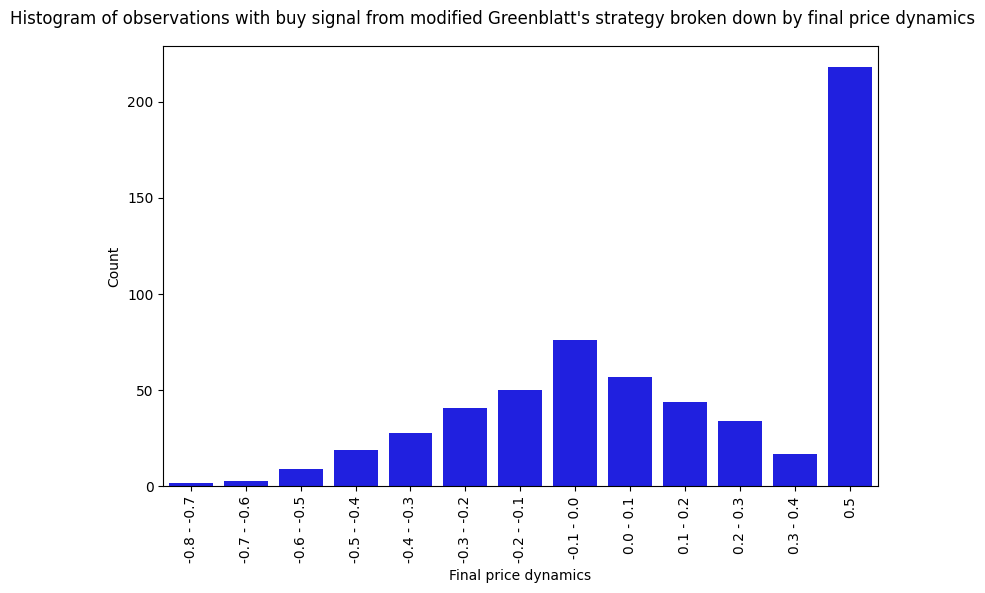

In [44]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        greenblatt_df[greenblatt_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified Greenblatt\'s '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified Greenblatt's strategy was profitable in 40 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 35 of analyzed periods. Moreover, the modified strategy brought the average profit of 9.71%, while the original strategy brought the average loss of -8.9%. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy.

In [45]:
greenblatt_return_df['Modified Greenblatt\'s strategy'] = greenblatt_df[
        greenblatt_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

greenblatt_portfolio_df['buy_in_q'] = pd.Series(
    greenblatt_df[
        greenblatt_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
greenblatt_portfolio_df['sell_in_q'] = pd.Series(
    greenblatt_df[
        greenblatt_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
greenblatt_portfolio_df['Modified Greenblatt\'s strategy'] = (
    greenblatt_portfolio_df.buy_in_q - greenblatt_portfolio_df.sell_in_q
).cumsum()
greenblatt_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(greenblatt_return_df, greenblatt_portfolio_df, 'Modified Greenblatt\'s strategy')

Number of quarters with buy signal from Modified Greenblatt's strategy: 62
Number of quarters with sufficient portfolio size: 57
Number of profitable quarters using Modified Greenblatt's strategy: 40
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Greenblatt's strategy outperformed zero effort strategy: 35
Average return on Modified Greenblatt's strategy: 9.71%
Average return on zero effort strategy: 5.6%


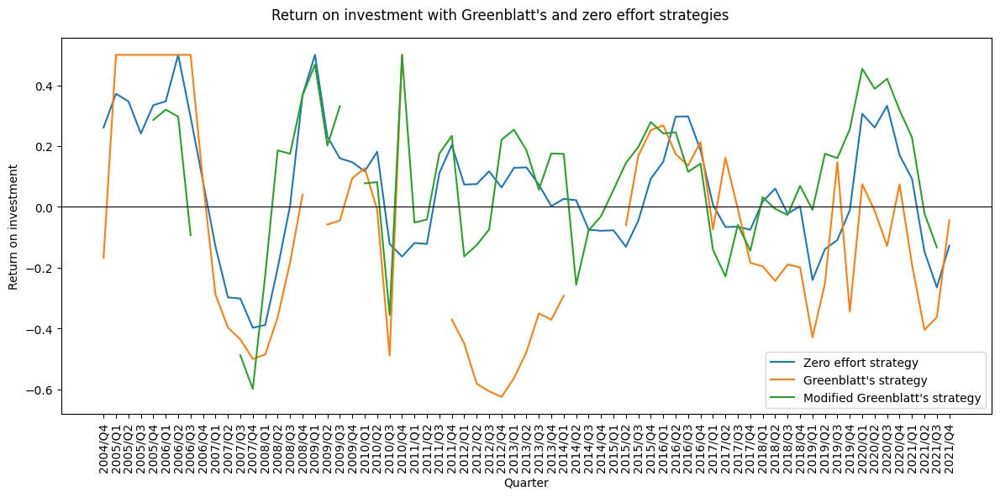

In [46]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    greenblatt_return_df.index,
    greenblatt_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=[
    'Zero effort strategy',
    'Greenblatt\'s strategy',
    'Modified Greenblatt\'s strategy'
])

plt.suptitle('Return on investment with Greenblatt\'s and zero effort strategies')

plt.tight_layout();

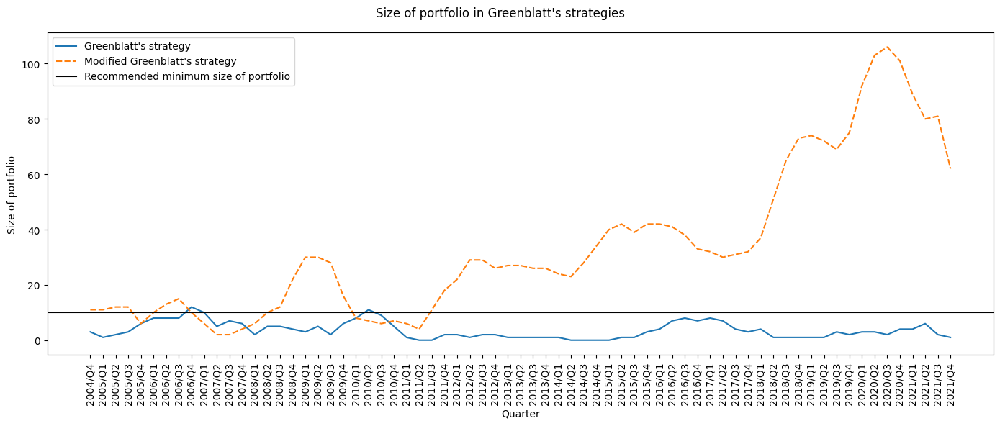

In [47]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=greenblatt_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(greenblatt_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Greenblatt\'s strategies')

plt.tight_layout();

# Martin Zweig's strategy

This strategy assumes, that we invest only in companies which:
- have net earnings y/y greater than 115%, where net earnings are sales revenues reduced by cost of revenue and taxes, year-on-year dynamics are considered;
- have sales revenues y/y greater than 115%, where sales revenues are understood as the sum of products, works, services, goods and materials sold and the unit selling price applicable to them, year-on-year dynamics are considered; 
- have net earnings in the last quarter greater than net earnings in the corresponding quarter of the previous year (e.g. for observation in Q3 2020 the net earnings in Q2 2020 have to be greater than net earnings in Q2 2019);
- have net earnings in two quarters ago greater than net earnings in the corresponding quarter of the previous year (e.g. for observation in Q3 2020 the net earnings in Q1 2020 have to be greater than net earnings in Q1 2019);
- have sales revenues in the last quarter greater than sales revenues in the corresponding quarter of the previous year;
- have sales revenues in two quarters ago greater than sales revenues in the corresponding quarter of the previous year;
- have relative strength from the last 6 months greater than 0, where relative strength shows how the price of an instrument behaves against the market, i.e. relative strength is price dynamics to WIG dynamics ratio;
- have price/earnings (P/E) ratio lower than doubled average price/earnings ratio for whole market in given quarter, P/E ratio determines the degree of profitability of buying the share in question, the lower the value of this indicator, the greater the chance that the company is undervalued.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **net_earnings**: various variables with net earnings values in different quarters;
- **sales_revenues**: various variables with sales revenues values in different quarters;
- **relative_strength_6m**: change of company's price in the last 6 months divided by change of Warsaw Stock Exchange Index value in the last 6 months;
- **price_earnings**: company's price divided by net earnings divided by number of shares;
- **avg_price_earnings**: average price/earnings ratio for whole market in given quarter;
- **buy**: signal from Zweig's strategy, *Yes* if company should be bought, *No* otherwise.

In [48]:
# Filter data
zweig_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'net_earnings_yy', 'net_earnings_1Q', 'net_earnings_2Q', 'net_earnings_5Q', 'net_earnings_6Q',
    'sales_revenues_yy', 'sales_revenues_1Q', 'sales_revenues_2Q', 'sales_revenues_5Q',
    'sales_revenues_6Q', 'relative_strength_6m', 'price_earnings', 'avg_price_earnings'
])

# Add column 'buy' for observations, which meet strategy conditions
zweig_df['buy'] = np.where(
    (zweig_df.net_earnings_yy > 0.15) &
    (zweig_df.sales_revenues_yy > 0.15) &
    (zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q) &
    (zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q) &
    (zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q) &
    (zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q) &
    (zweig_df.relative_strength_6m > 0) &
    (zweig_df.price_earnings < 2 * zweig_df.avg_price_earnings),
    'Yes', 'No'
)

zweig_df['sell_in_q'] = np.where(
    zweig_df.buy == 'Yes',
    zweig_df.best_price_dynamics_in_q,
    zweig_df.price_dynamics_y_in_q
)

zweig_df = zweig_df.dropna()


The analyzed subset contains 12179 observations (66% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 1283 **interesting_investment** observations (3010 in original set vs 1727 in subset). However, the Zweig's strategy classified 874 observations as worth buying. What is worse, 447 of them made a loss, and another 274 made a profit below 50%.

In [49]:
print('The basic statistics of final price dynamics in Zweig\'s strategy:')
print(zweig_df.final_price_dynamics.describe())
print('\nInteresting companies in Zweig\'s strategy:')
print(zweig_df.interesting_investment.value_counts())
print(f'\nNumber of buy signals from Zweig\'s strategy: {zweig_df.buy.value_counts()[1]}')

The basic statistics of final price dynamics in Zweig's strategy:
count   12179.00
mean        0.01
std         0.30
min        -0.79
25%        -0.20
50%        -0.01
75%         0.23
max         0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Zweig's strategy:
No       6319
Maybe    4133
Yes      1727
Name: interesting_investment, dtype: int64

Number of buy signals from Zweig's strategy: 874


In [50]:
pd.crosstab(
    zweig_df.interesting_investment,
    zweig_df.buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from Zweig\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from Zweig's strategy:,No,Yes
Interesting investment:,,
No,5872,447
Maybe,3859,274
Yes,1574,153


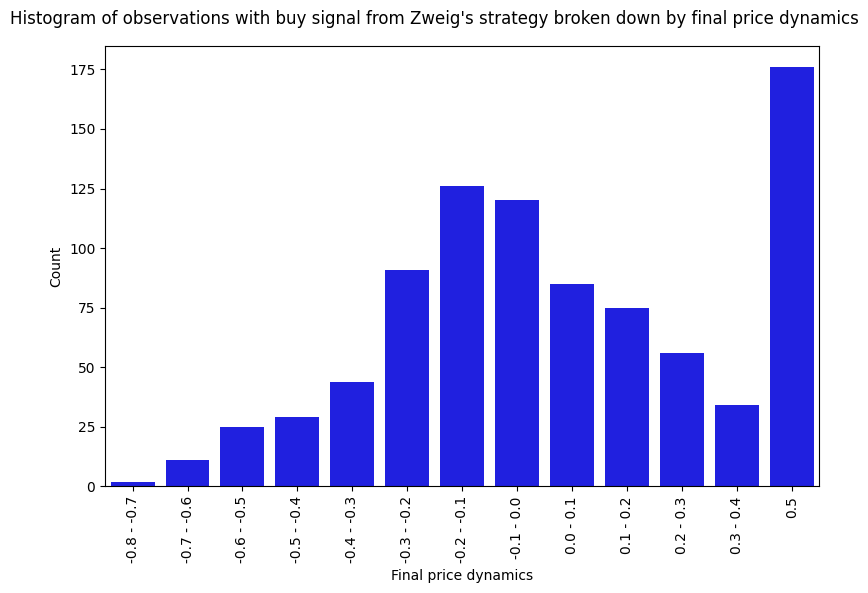

In [51]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        zweig_df[zweig_df.buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from Zweig\'s '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The Zweig's strategy was profitable in 57% of quarters and outperformed zero effort strategy (i.e. investing in WIG) in 51% of periods. The Zweig's stategy brought the positive average return of 6.69%. Moreover, there were 8 quarters, when there were no companies classified as worth buying and the strategy reached the sufficient portfolio size in 61 quarters.

In [52]:
zweig_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean(),
    'Zweig\'s strategy':zweig_df[
        zweig_df.buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()
})

zweig_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        zweig_df[
            zweig_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        zweig_df[
            zweig_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
zweig_portfolio_df['Zweig\'s strategy'] = (
    zweig_portfolio_df.buy_in_q - zweig_portfolio_df.sell_in_q
).cumsum()
zweig_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(zweig_return_df, zweig_portfolio_df, 'Zweig\'s strategy')

Number of quarters with buy signal from Zweig's strategy: 61
Number of quarters with sufficient portfolio size: 61
Number of profitable quarters using Zweig's strategy: 39
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Zweig's strategy outperformed zero effort strategy: 35
Average return on Zweig's strategy: 6.69%
Average return on zero effort strategy: 5.6%


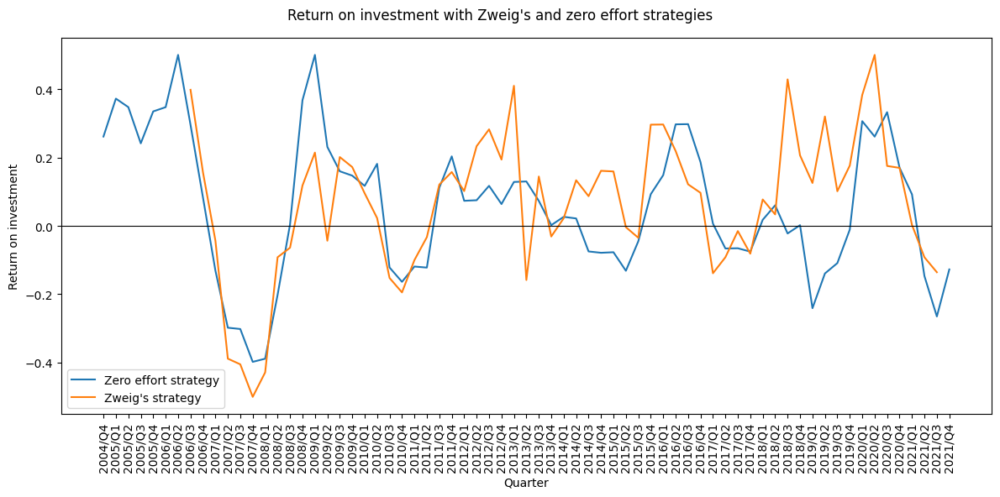

In [53]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    zweig_return_df.index,
    zweig_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Zweig\'s strategy'])

plt.suptitle('Return on investment with Zweig\'s and zero effort strategies')

plt.tight_layout();

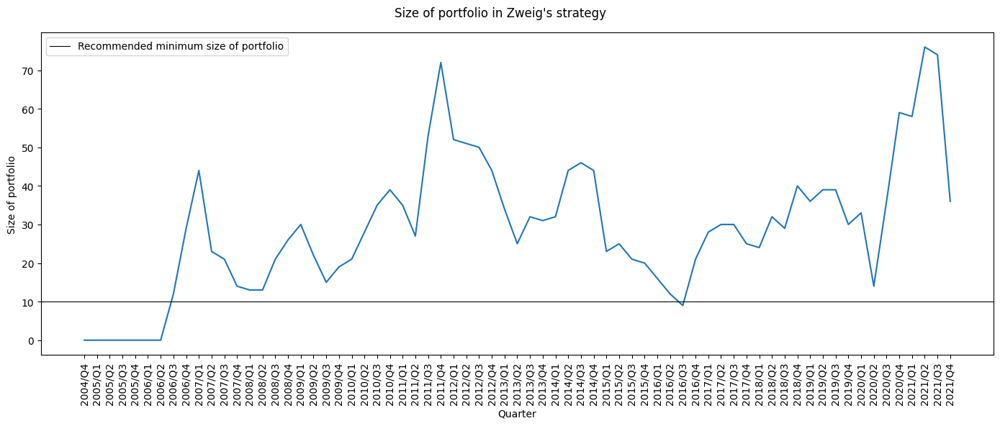

In [54]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=zweig_portfolio_df,
    legend=False,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Zweig\'s strategy')

plt.tight_layout();

The range of net earnings y/y feature is from -16083 to 3234 with mean value of 2.3, though the median is 0.15. 50% of observations met the criterion for this variable. However, more than 40% of observations had negative dynamics of net earnings.

The boxplots below indicate, that Zweig's treshold for net earnings y/y generally seems reasonable. Observations with values over 0.15 perform significantly better than those below this treshold. Moreover, they give greater chance of return of investment of at least 50% and the lowest risk of loss. We may possibly reduce the threshold slightly to secure a sufficiently full portfolio.

In [55]:
print('The basic statistics of net earnings y/y in Zweig\'s strategy:')
print(zweig_df.net_earnings_yy.describe())
print('\nNet earnings y/y in Zweig\'s strategy:')
print(pd.Series(np.where(
    zweig_df.net_earnings_yy > 0.15,
    'Over 115%', 'Below 115%'
)).value_counts())

The basic statistics of net earnings y/y in Zweig's strategy:
count    12179.00
mean         2.29
std        157.56
min     -16083.00
25%         -0.40
50%          0.15
75%          1.12
max       3234.00
Name: net_earnings_yy, dtype: float64

Net earnings y/y in Zweig's strategy:
Over 115%     6099
Below 115%    6080
dtype: int64


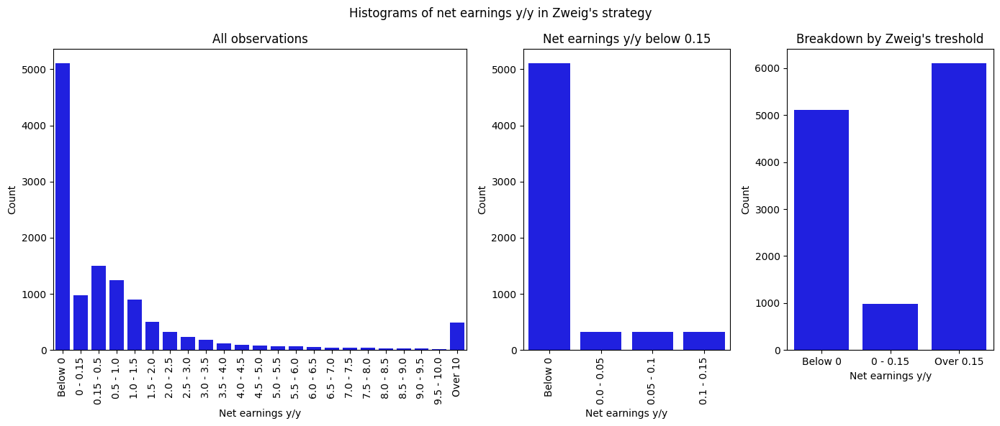

In [56]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1, 1]})

sns.countplot(
    x=pd.cut(
        zweig_df.net_earnings_yy,
        bins=[-2e4, 0, .15] + list(np.arange(.5, 10.5, .5)) + [4e3],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.5']
            + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        zweig_df[zweig_df.net_earnings_yy < .15].net_earnings_yy,
        bins=[-2e4] + list(np.arange(0, .2, .05)),
        labels=['Below 0'] + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        zweig_df.net_earnings_yy,
        bins=[-2e4, 0, 0.15, 4e3],
        labels=['Below 0', '0 - 0.15', 'Over 0.15']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net earnings y/y')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of net earnings y/y in Zweig\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

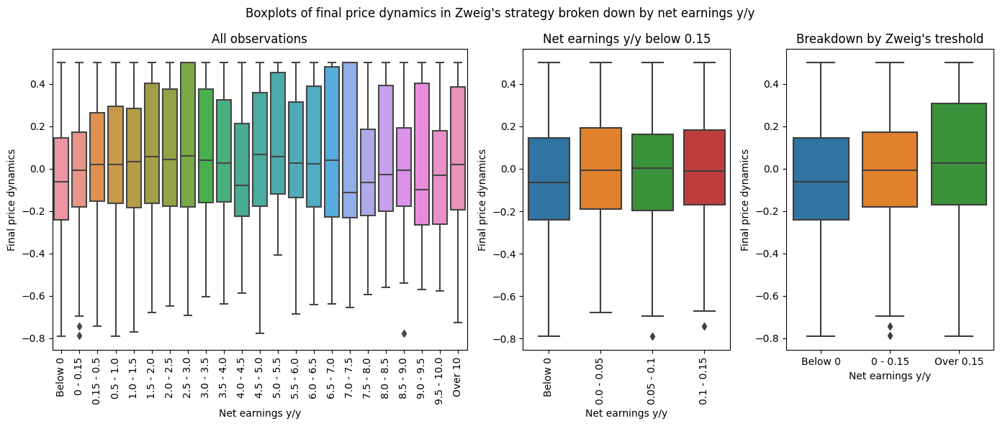

In [57]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1, 1]})

sns.boxplot(
    x=pd.cut(
        zweig_df.net_earnings_yy,
        bins=[-2e4, 0, .15] + list(np.arange(.5, 10.5, .5)) + [4e3],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.5']
            + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        zweig_df[zweig_df.net_earnings_yy < .15].net_earnings_yy,
        bins=[-2e4] + list(np.arange(0, .2, .05)),
        labels=['Below 0'] + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        zweig_df.net_earnings_yy,
        bins=[-2e4, 0, 0.15, 4e3],
        labels=['Below 0', '0 - 0.15', 'Over 0.15']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net earnings y/y')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Zweig\'s '\
    'strategy broken down by net earnings y/y')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

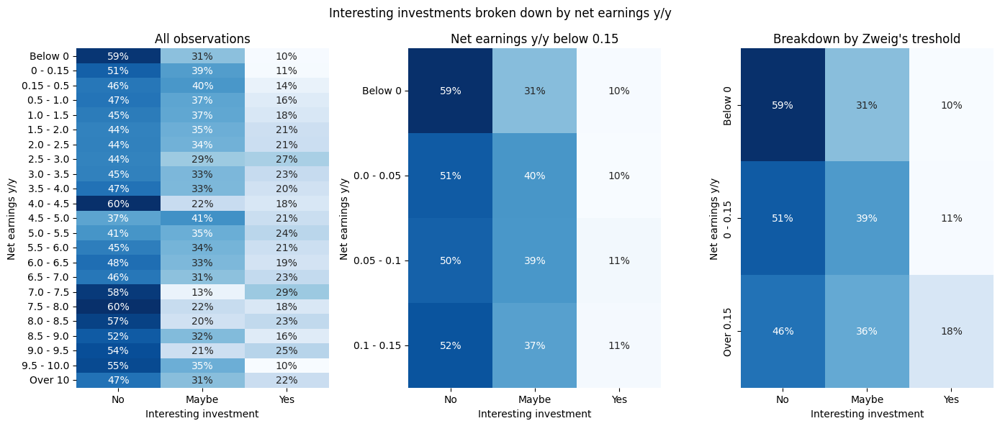

In [58]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.net_earnings_yy,
            bins=[-2e4, 0, .15] + list(np.arange(.5, 10.5, .5)) + [4e3],
            labels=['Below 0', '0 - 0.15', '0.15 - 0.5']
                + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df[zweig_df.net_earnings_yy < .15].net_earnings_yy,
            bins=[-2e4] + list(np.arange(0, .2, .05)),
            labels=['Below 0']
                + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.net_earnings_yy,
            bins=[-2e4, 0, 0.15, 4e3],
            labels=['Below 0', '0 - 0.15', 'Over 0.15']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Net earnings y/y')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by net earnings y/y')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

The range of sales revenues y/y feature is from -229 to 7744 with mean value of 1.95, though the median is 0.09. About 40% of observations meet the criteria for this variable. Moreover, 1/3 of observations had negative dynamics of sales revenues.

Similarly to net earnings y/y, the treshold for sales revenus y/y seems reasonable and here, too, it can be lowered slightly. Also, limiting the maximum value of this variable to 1.4 seems to be a good idea.

In [59]:
print('The basic statistics of sales revenues y/y in Zweig\'s strategy:')
print(zweig_df.sales_revenues_yy.describe())
print('\nSales revenues y/y in Zweig\'s strategy:')
print(pd.Series(np.where(
    zweig_df.sales_revenues_yy > 0.15,
    'Over 115%', 'Below 115%'
)).value_counts())

The basic statistics of sales revenues y/y in Zweig's strategy:
count   12179.00
mean        1.95
std        74.37
min      -229.28
25%        -0.05
50%         0.09
75%         0.28
max      7744.29
Name: sales_revenues_yy, dtype: float64

Sales revenues y/y in Zweig's strategy:
Below 115%    7299
Over 115%     4880
dtype: int64


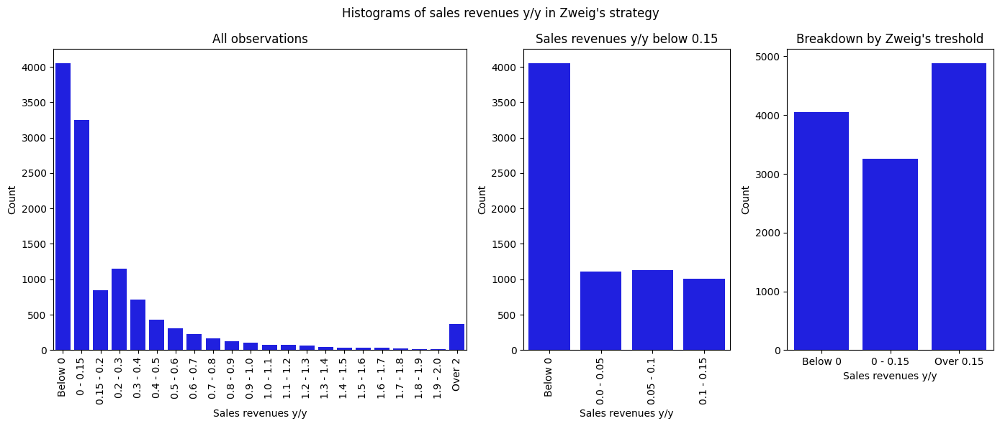

In [60]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1, 1]})

sns.countplot(
    x=pd.cut(
        zweig_df.sales_revenues_yy,
        bins=[-300, 0, .15] + list(np.arange(.2, 2.1, .1)) + [8000],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.2']
            + [f'{round(i,1)} - {round(i+.1, 1)}' for i in np.arange(.2, 2, .1)] + ['Over 2']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        zweig_df[zweig_df.sales_revenues_yy < .15].sales_revenues_yy,
        bins=[-300] + list(np.arange(0, .2, .05)),
        labels=['Below 0'] + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        zweig_df.sales_revenues_yy,
        bins=[-300, 0, 0.15, 8000],
        labels=['Below 0', '0 - 0.15', 'Over 0.15']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Sales revenues y/y')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of sales revenues y/y in Zweig\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Sales revenues y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

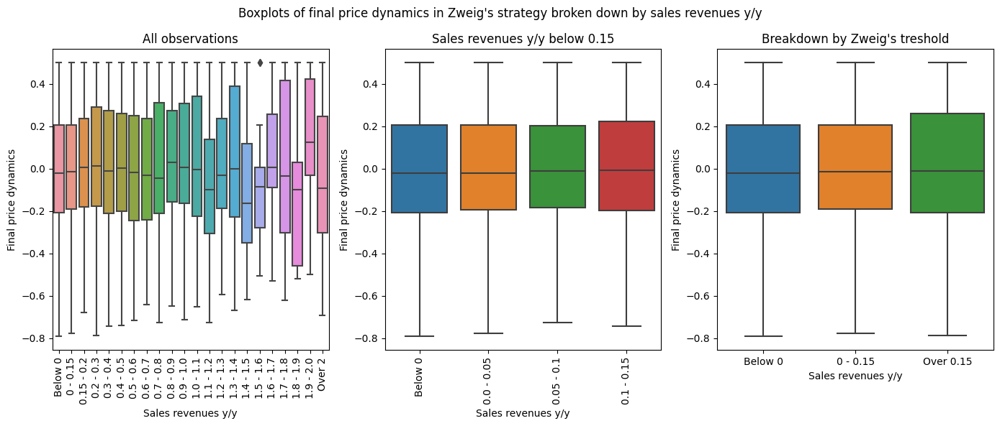

In [61]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        zweig_df.sales_revenues_yy,
        bins=[-300, 0, .15] + list(np.arange(.2, 2.1, .1)) + [8000],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.2']
            + [f'{round(i,1)} - {round(i+.1, 1)}' for i in np.arange(.2, 2, .1)] + ['Over 2']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        zweig_df[zweig_df.sales_revenues_yy < .15].sales_revenues_yy,
        bins=[-300] + list(np.arange(0, .2, .05)),
        labels=['Below 0'] + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        zweig_df.sales_revenues_yy,
        bins=[-300, 0, 0.15, 8000],
        labels=['Below 0', '0 - 0.15', 'Over 0.15']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Sales revenues y/y')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Zweig\'s '\
    'strategy broken down by sales revenues y/y')
axs[0].set_title('All observations')
axs[1].set_title('Sales revenues y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

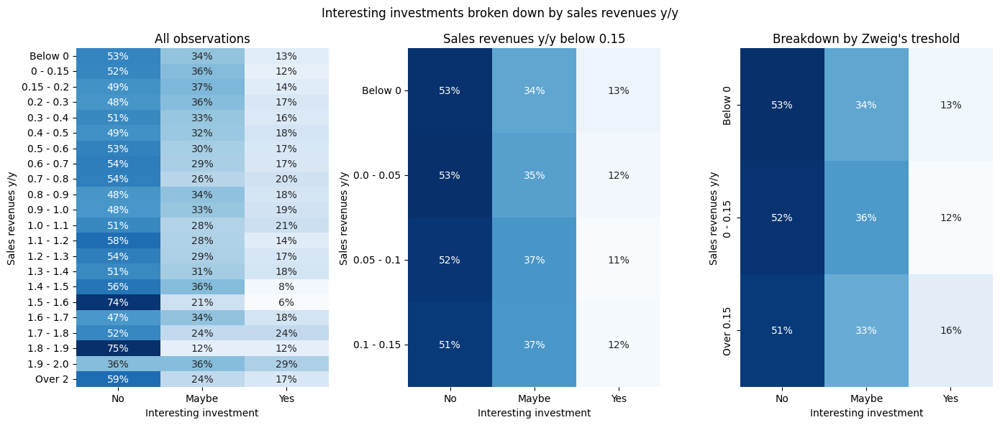

In [62]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.sales_revenues_yy,
            bins=[-300, 0, .15] + list(np.arange(.2, 2.1, .1)) + [8000],
            labels=['Below 0', '0 - 0.15', '0.15 - 0.2']
                + [f'{round(i,1)} - {round(i+.1, 1)}' for i in np.arange(.2, 2, .1)] + ['Over 2']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df[zweig_df.sales_revenues_yy < .15].sales_revenues_yy,
            bins=[-300] + list(np.arange(0, .2, .05)),
            labels=['Below 0']
                + [f'{round(i, 2)} - {round(i+.05, 2)}' for i in np.arange(0, .15, .05)]
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.sales_revenues_yy,
            bins=[-300, 0, 0.15, 8000],
            labels=['Below 0', '0 - 0.15', 'Over 0.15']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Sales revenues y/y')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by sales revenues y/y')
axs[0].set_title('All observations')
axs[1].set_title('Sales revenues y/y below 0.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

The next two criteria filter companies, which in last two quarters had higher net earnings than in the corresponding quarters the year before. There are 4786 observations which meet both criteria. Such companies performed only slightly better than those, which were not able to fullfill these criteria.

In [63]:
print('Observations with net earnings in previous quarter higher than net earnings 5 quarters ago:')
print(pd.Series(np.where(
    zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q,
    'Yes', 'No'
)).value_counts())

print('\nObservations with net earnings 2 quarters ago higher than net earnings 6 quarters ago:')
print(pd.Series(np.where(
    zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q,
    'Yes', 'No'
)).value_counts())

print('\nObservations which meet both criteria:')
print(pd.Series(np.where(
    (zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q)
    & (zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q),
    'Yes', 'No'
)).value_counts())

Observations with net earnings in previous quarter higher than net earnings 5 quarters ago:
Yes    7221
No     4958
dtype: int64

Observations with net earnings 2 quarters ago higher than net earnings 6 quarters ago:
Yes    7298
No     4881
dtype: int64

Observations which meet both criteria:
No     7393
Yes    4786
dtype: int64


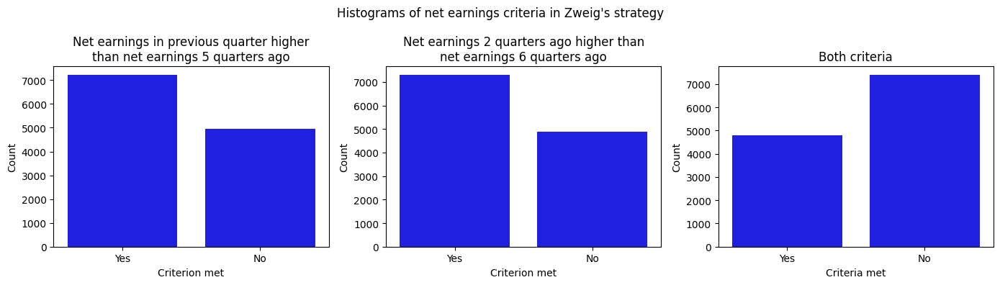

In [64]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

sns.countplot(
    x=pd.Series(np.where(
        zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q,
        'Yes', 'No'
    )),
    color='blue',
    order=['Yes', 'No'],
    ax=axs[0]
)

sns.countplot(
    x=pd.Series(np.where(
        zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.Series(np.where(
        (zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q)
        & (zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q),
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Criterion met')
    axs[i].set_ylabel('Count')
axs[2].set_xlabel('Criteria met')

plt.suptitle('Histograms of net earnings criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Net earnings in previous quarter higher than net earnings 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Net earnings 2 quarters ago higher than net earnings 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

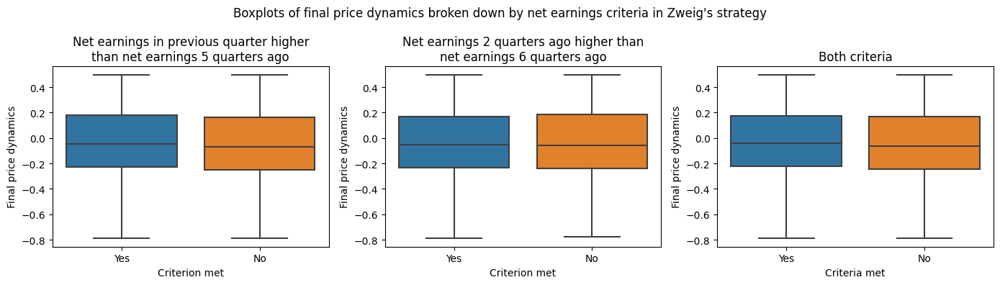

In [65]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

sns.boxplot(
    x=pd.Series(np.where(
        zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q,
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[0]
)

sns.boxplot(
    x=pd.Series(np.where(
        zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q,
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[1]
)

sns.boxplot(
    x=pd.Series(np.where(
        (zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q)
        & (zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q),
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Criterion met')
    axs[i].set_ylabel('Final price dynamics')
axs[2].set_xlabel('Criteria met')

plt.suptitle('Boxplots of final price dynamics broken down '\
    'by net earnings criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Net earnings in previous quarter higher than net earnings 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Net earnings 2 quarters ago higher than net earnings 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

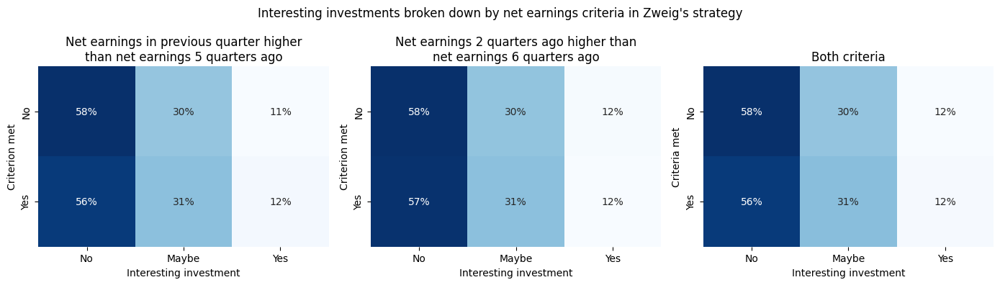

In [66]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q,
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q,
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (zweig_df.net_earnings_1Q > zweig_df.net_earnings_5Q)
            & (zweig_df.net_earnings_2Q > zweig_df.net_earnings_6Q),
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Criterion met')
axs[2].set_ylabel('Criteria met')

plt.suptitle('Interesting investments broken down by net '\
    'earnings criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Net earnings in previous quarter higher than net earnings 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Net earnings 2 quarters ago higher than net earnings 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

The next pair of criteria is similar to the previous - with the difference that it relates to sales revenue. There are 6539 observations which meet both criteria. Such companies performed better than those, which were not able to fullfill these criteria - with proportion of interesting investments higher by 2 percentage points and risk of bad investment lower by 3 percentage points.

In [67]:
print('Observations with sales revenues in previous quarter '\
    'higher than sales revenues 5 quarters ago:')
print(pd.Series(np.where(
    zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q,
    'Yes', 'No'
)).value_counts())

print('\nObservations with sales revenues 2 quarters ago higher '\
    'than sales revenues 6 quarters ago:')
print(pd.Series(np.where(
    zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q,
    'Yes', 'No'
)).value_counts())

print('\nObservations which meet both criteria:')
print(pd.Series(np.where(
    (zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q)
    & (zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q),
    'Yes', 'No'
)).value_counts())

Observations with sales revenues in previous quarter higher than sales revenues 5 quarters ago:
Yes    8179
No     4000
dtype: int64

Observations with sales revenues 2 quarters ago higher than sales revenues 6 quarters ago:
Yes    8180
No     3999
dtype: int64

Observations which meet both criteria:
Yes    6539
No     5640
dtype: int64


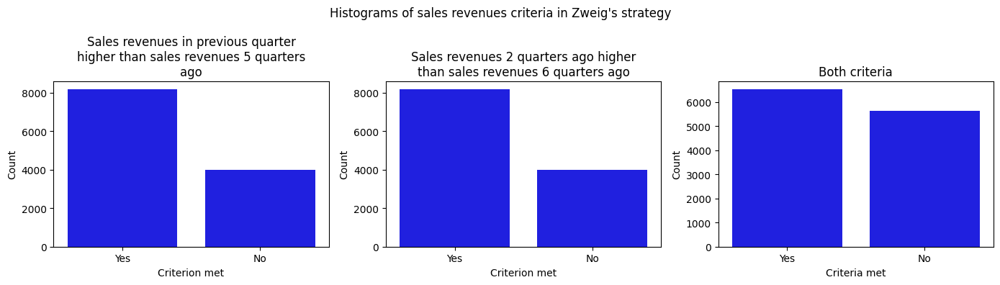

In [68]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

sns.countplot(
    x=pd.Series(np.where(
        zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.Series(np.where(
        zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.Series(np.where(
        (zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q)
        & (zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q),
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Criterion met')
    axs[i].set_ylabel('Count')
axs[2].set_xlabel('Criteria met')

plt.suptitle('Histograms of sales revenues criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Sales revenues in previous quarter higher than sales revenues 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Sales revenues 2 quarters ago higher than sales revenues 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

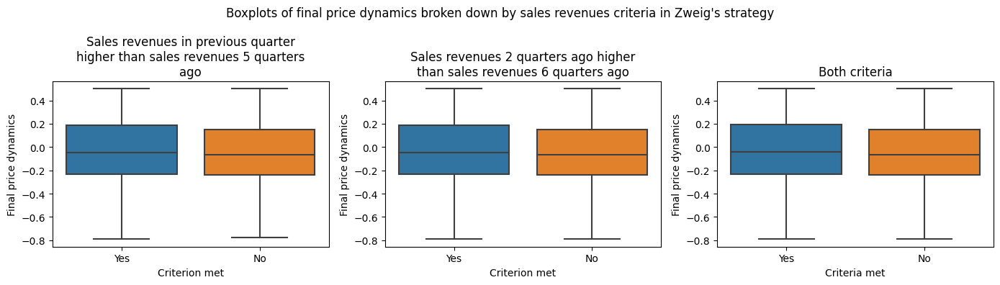

In [69]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

sns.boxplot(
    x=pd.Series(np.where(
        zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q,
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[0]
)

sns.boxplot(
    x=pd.Series(np.where(
        zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q,
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[1]
)

sns.boxplot(
    x=pd.Series(np.where(
        (zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q)
        & (zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q),
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    order=['Yes', 'No'],
    ax=axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Criterion met')
    axs[i].set_ylabel('Final price dynamics')
axs[2].set_xlabel('Criteria met')

plt.suptitle('Boxplots of final price dynamics broken down by '\
    'sales revenues criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Sales revenues in previous quarter higher than sales revenues 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Sales revenues 2 quarters ago higher than sales revenues 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

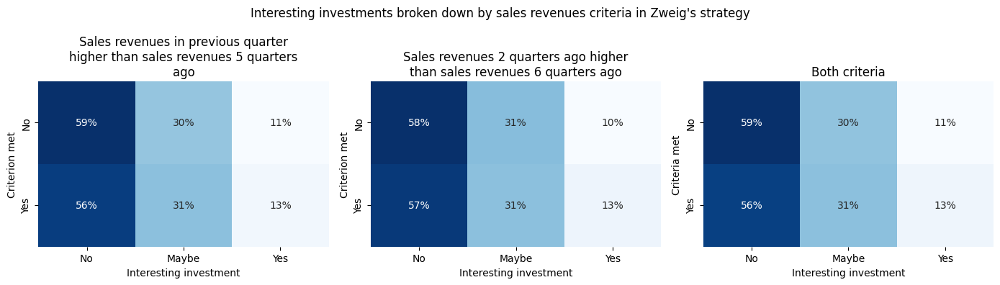

In [70]:
fig, axs = plt.subplots(1, 3, figsize=(14, 4))

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q,
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q,
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (zweig_df.sales_revenues_1Q > zweig_df.sales_revenues_5Q)
            & (zweig_df.sales_revenues_2Q > zweig_df.sales_revenues_6Q),
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Criterion met')
axs[2].set_ylabel('Criteria met')

plt.suptitle('Interesting investments broken down by '\
    'sales revenues criteria in Zweig\'s strategy')
axs[0].set_title(
    '\n'.join(
        wrap(
            'Sales revenues in previous quarter higher than sales revenues 5 quarters ago',
            40
        )
    )
)
axs[1].set_title(
    '\n'.join(
        wrap(
            'Sales revenues 2 quarters ago higher than sales revenues 6 quarters ago',
            40
        )
    )
)
axs[2].set_title('Both criteria')

plt.tight_layout();

The range of relative strength 6M feature is from -870 to 246 with mean value of 0.12 and median 0.57. Almost 60% of observations met the criterion for this variable. Such companies performed only slightly better than those, which were not able to fullfill these criteria. Changing the threshold for this variable will not improve significantly its performance.

In [72]:
print('The basic statistics of relative strength 6M in Zweig\'s strategy:')
print(zweig_df.relative_strength_6m.describe())
print('\nRelative strength 6M in Zweig\'s strategy:')
print(pd.Series(np.where(
    zweig_df.relative_strength_6m > 0,
    'Over 0', 'Below 0'
)).value_counts())

The basic statistics of relative strength 6M in Zweig's strategy:
count   12179.00
mean        0.12
std        14.52
min      -869.57
25%        -1.27
50%         0.57
75%         2.35
max       245.69
Name: relative_strength_6m, dtype: float64

Relative strength 6M in Zweig's strategy:
Over 0     7286
Below 0    4893
dtype: int64


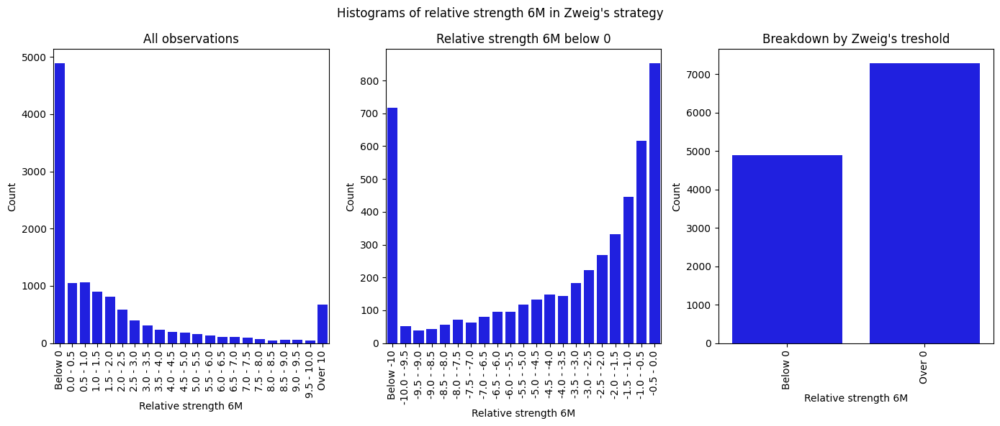

In [73]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        zweig_df.relative_strength_6m,
        bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
        labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        zweig_df[zweig_df.relative_strength_6m < 0].relative_strength_6m,
        bins=[-900] + list(np.arange(-10, .5, .5)),
        labels=['Below -10'] + [f'{i} - {i+.5}' for i in np.arange(-10, 0, .5)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        zweig_df.relative_strength_6m,
        bins=[-900, 0, 250],
        labels=['Below 0', 'Over 0']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Relative strength 6M')
    axs[i].set_ylabel('Count')

plt.suptitle('Histograms of relative strength 6M in Zweig\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Relative strength 6M below 0')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

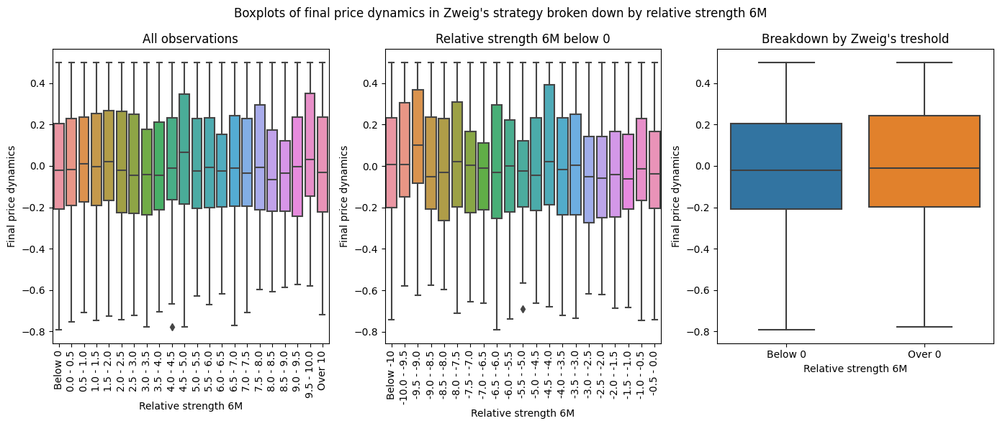

In [74]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        zweig_df.relative_strength_6m,
        bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
        labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        zweig_df[zweig_df.relative_strength_6m < 0].relative_strength_6m,
        bins=[-900] + list(np.arange(-10, .5, .5)),
        labels=['Below -10'] + [f'{i} - {i+.5}' for i in np.arange(-10, 0, .5)]
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        zweig_df.relative_strength_6m,
        bins=[-900, 0, 250],
        labels=['Below 0', 'Over 0']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Relative strength 6M')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Zweig\'s '\
    'strategy broken down by relative strength 6M')
axs[0].set_title('All observations')
axs[1].set_title('Relative strength 6M below 0')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

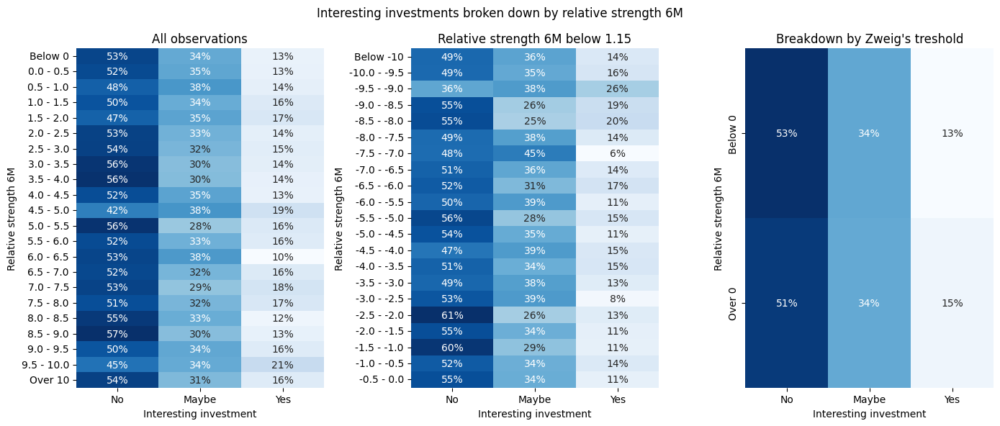

In [75]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.relative_strength_6m,
            bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
            labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df[zweig_df.relative_strength_6m < 0].relative_strength_6m,
            bins=[-900] + list(np.arange(-10, .5, .5)),
            labels=['Below -10'] + [f'{i} - {i+.5}' for i in np.arange(-10, 0, .5)]
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.relative_strength_6m,
            bins=[-900, 0, 250],
            labels=['Below 0', 'Over 0']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Relative strength 6M')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by relative strength 6M')
axs[0].set_title('All observations')
axs[1].set_title('Relative strength 6M below 1.15')
axs[2].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

The last criterion should filter out observations with very high P/E ratio. However, this is a very loose constraint - 94% of observations met this crtiterion. As the charts below indicate, excluded observations performed better than chosen by the strategy.

In general, this criterion does not make any sense - it chooses too many companies with high P/E ratio and, as can be seen in the first boxplot below, the final price dynamics decreased with incresing P/E ratio. Morevoer, the rule of thumb that is used is to choose companies with P/E ratio under 15 or even lower. Such approach excludes about half of observations. The seemingly better idea is to simply choose observations with P/E ratio lower than given value. The charts below indicate treshold of 4.

In [76]:
print('The basic statistics of P/E ratio and average P/E ratio in Zweig\'s strategy:')
print(zweig_df[['price_earnings', 'avg_price_earnings']].describe())
print('\nObservations with P/E ratio lower than doubled average P/E ratio for '\
    'whole market in given quarter in Zweig\'s strategy:')
print(pd.Series(np.where(
    zweig_df.price_earnings < 2 * zweig_df.avg_price_earnings,
    'Yes', 'No'
)).value_counts())

The basic statistics of P/E ratio and average P/E ratio in Zweig's strategy:
       price_earnings  avg_price_earnings
count        12179.00            12179.00
mean            62.23               58.83
std           1494.13               98.66
min              0.01               16.00
25%              7.75               26.06
50%             12.31               32.20
75%             20.76               50.65
max         130019.98              925.52

Observations with P/E ratio lower than doubled average P/E ratio for whole market in given quarter in Zweig's strategy:
Yes    11472
No       707
dtype: int64


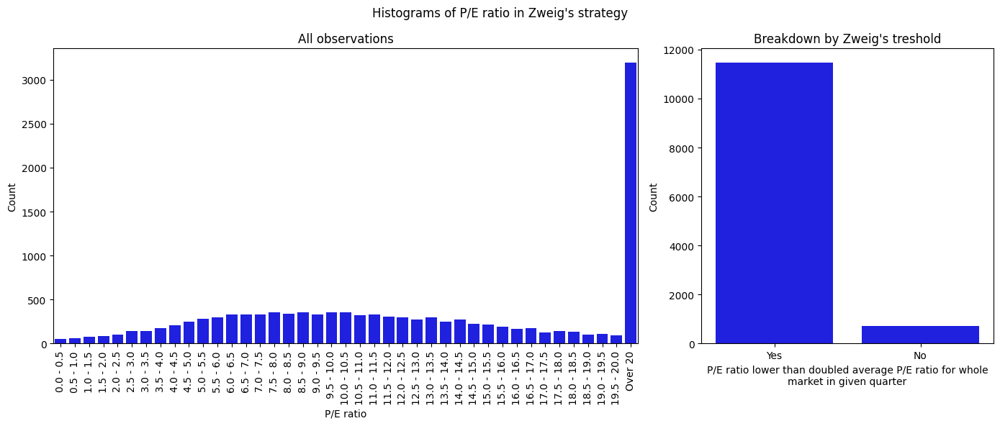

In [77]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.countplot(
    x=pd.cut(
        zweig_df.price_earnings,
        bins=list(np.arange(0, 20.5, .5)) + [2e5],
        labels=[f'{i} - {i+.5}' for i in np.arange(0, 20, .5)] + ['Over 20']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.Series(np.where(
        zweig_df.price_earnings < 2 * zweig_df.avg_price_earnings,
        'Yes', 'No'
    )),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].set_ylabel('Count')

axs[0].tick_params(axis='x', labelrotation=90)
axs[0].set_xlabel('P/E ratio')
axs[1].set_xlabel('\n'.join(wrap('P/E ratio lower than doubled '\
    'average P/E ratio for whole market in given quarter', 60)))

plt.suptitle('Histograms of P/E ratio in Zweig\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

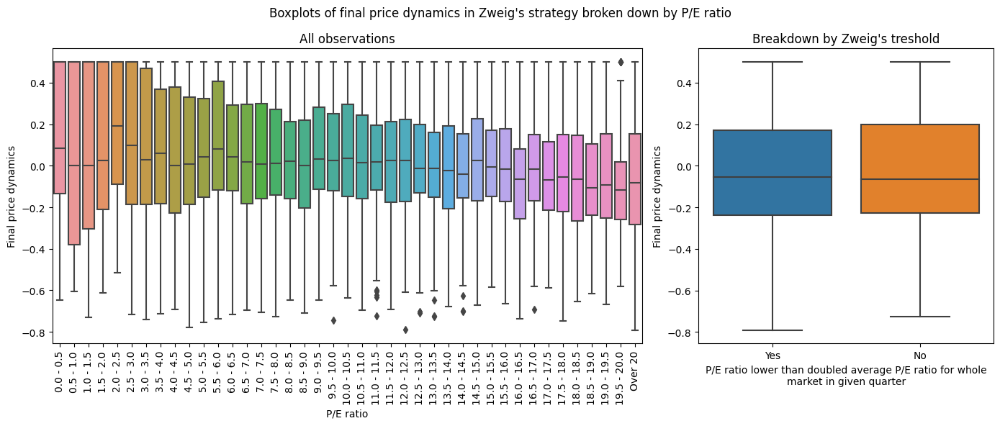

In [78]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.boxplot(
    x=pd.cut(
        zweig_df.price_earnings,
        bins=list(np.arange(0, 20.5, .5)) + [2e5],
        labels=[f'{i} - {i+.5}' for i in np.arange(0, 20, .5)] + ['Over 20']
    ),
    y=zweig_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.Series(np.where(
        zweig_df.price_earnings < 2 * zweig_df.avg_price_earnings,
        'Yes', 'No'
    )),
    y=zweig_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].set_ylabel('Final price dynamics')

axs[0].tick_params(axis='x', labelrotation=90)
axs[0].set_xlabel('P/E ratio')
axs[1].set_xlabel('\n'.join(wrap('P/E ratio lower than doubled '\
    'average P/E ratio for whole market in given quarter', 60)))

plt.suptitle('Boxplots of final price dynamics in Zweig\'s '\
    'strategy broken down by P/E ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

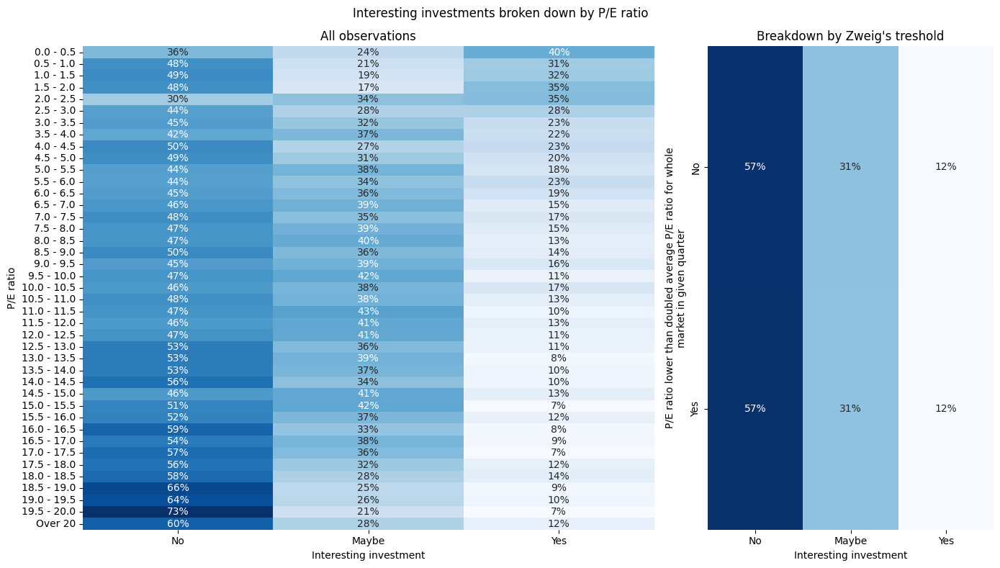

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8), gridspec_kw={'width_ratios': [2, 1]})

custom_heatmap(
    pd.crosstab(
        pd.cut(
            zweig_df.price_earnings,
            bins=list(np.arange(0, 20.5, .5)) + [2e5],
            labels=[f'{i} - {i+.5}' for i in np.arange(0, 20, .5)] + ['Over 20']
        ),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            zweig_df.price_earnings < 2 * zweig_df.avg_price_earnings,
            'Yes', 'No'
        )),
        zweig_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].set_xlabel('Interesting investment')

axs[0].set_ylabel('P/E ratio')
axs[1].set_ylabel('\n'.join(wrap('P/E ratio lower than doubled '\
    'average P/E ratio for whole market in given quarter', 60)))

plt.suptitle('Interesting investments broken down by P/E ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Zweig\'s treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed by Zweig, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. Unfortunately, the chosen criteria had to be loosened to qualify any strategies. In the end, the best results come from a selection of companies whose net earnings y/y are over 1, sales revenues y/y are between 0 and 0.5, as well as P/E ratio below 12. Such selection filled the portfolio in 56 quarters.

In [81]:
zweig_mod_df = {
    'Net earnings y/y over:':[],
    'Sales revenues y/y between 0 and:':[],
    'P/E ratio below:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.arange(0, 8.5, .5): # Net earnings y/y
    for mod_2 in np.arange(0, 1.5, .1): # Sales revenues y/y
        for mod_3 in range(1, 16): # P/E ratio
            zweig_df['mod_buy'] = np.where(
                (zweig_df.net_earnings_yy > mod_1) &
                (zweig_df.sales_revenues_yy > 0) &
                (zweig_df.sales_revenues_yy < mod_2) &
                (zweig_df.relative_strength_6m > 0) &
                (zweig_df.price_earnings < mod_3),
                'Yes', 'No'
            )

            if zweig_df[zweig_df.mod_buy == 'Yes'].shape[0] > 0:
                # Return on Modified Zweig\'s strategy
                zweig_return_df['Modified Zweig\'s strategy'] = zweig_df[
                    zweig_df.mod_buy == 'Yes'
                ].groupby('quarter').final_price_dynamics.mean()
                avg_strategy_return = (
                    100 * zweig_return_df['Modified Zweig\'s strategy'].mean()
                ).round(2)

                # If positive
                if avg_strategy_return > 0:

                    # Size of portfolio in Modified Zweig\'s strategy
                    zweig_portfolio_df['buy_in_q'] = pd.Series(
                        zweig_df[
                            zweig_df.mod_buy == 'Yes'
                        ].groupby('quarter').quarter.count().reindex(
                            sorted(dataset.quarter.unique())).fillna(0)
                    )
                    zweig_portfolio_df['sell_in_q'] = pd.Series(
                        zweig_df[
                            zweig_df.mod_buy == 'Yes'
                        ].groupby('sell_in_q').sell_in_q.count().reindex(
                            sorted(dataset.quarter.unique())).fillna(0)
                    )

                    zweig_portfolio_df['Modified Zweig\'s strategy'] = (
                        zweig_portfolio_df.buy_in_q - zweig_portfolio_df.sell_in_q
                    ).cumsum()
                    zweig_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                    quarters_with_good_portfolio_size = zweig_portfolio_df[
                        zweig_portfolio_df['Modified Zweig\'s strategy'] >= 10
                    ]['Modified Zweig\'s strategy'].count()

                    # If number of quarters with good portfolio size > 55 (80% of all quarters)
                    if quarters_with_good_portfolio_size >= 55:

                        # Profitable quarters
                        quarters_profit_strat = zweig_return_df[
                            zweig_return_df['Modified Zweig\'s strategy'] > 0
                        ]['Modified Zweig\'s strategy'].count()

                        # Strategy > zero effort strategy
                        quarters_perform_strat = zweig_return_df[
                            zweig_return_df[
                                'Modified Zweig\'s strategy'
                            ] > zweig_return_df['Zero effort strategy']
                        ]['Modified Zweig\'s strategy'].count()

                        zweig_mod_df['Net earnings y/y over:'].append(mod_1)
                        zweig_mod_df['Sales revenues y/y between 0 and:'].append(mod_2)
                        zweig_mod_df['P/E ratio below:'].append(mod_3)
                        zweig_mod_df['Average return (%)'].append(avg_strategy_return)
                        zweig_mod_df[
                            'Number of quarters with portfolio size over 10'
                        ].append(quarters_with_good_portfolio_size)
                        zweig_mod_df['Number of profitable quarters'].append(quarters_profit_strat)
                        zweig_mod_df[
                            'Number of quarters in which strategy outperformed zero effort strategy'
                        ].append(quarters_perform_strat)

                        # Number of signals
                        signals = zweig_df.mod_buy.value_counts()[1]

                        # Crosstab
                        ctab = pd.crosstab(
                            zweig_df.interesting_investment,
                            zweig_df.mod_buy,
                            rownames=['Interesting investment:'],
                            colnames=['Buy signal from modified Zweig\'s strategy:']
                        ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                        # % of interesting_investment == Maybe or Yes
                        zweig_mod_df[
                            'Percentage of profitable investments'
                        ].append(round(100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals))
                        # % of interesting_investment == No
                        zweig_mod_df[
                            'Percentage of loss-making investments'
                        ].append(round(100 * ctab.iloc[0, 1] / signals))

zweig_mod_df = pd.DataFrame(zweig_mod_df)

print('Data frame with best modifications of Zweig\'s strategy:')
zweig_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Zweig's strategy:


,Net earnings y/y over:,Sales revenues y/y between 0 and:,P/E ratio below:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
175,1.00,0.50,12,14.25,56,47,46,66,34
96,0.50,0.30,12,11.89,55,45,40,66,34
94,0.50,0.20,14,10.97,55,42,43,66,34
179,1.00,0.60,11,14.23,56,47,45,65,35
189,1.00,0.80,11,14.07,56,48,46,65,35
...,...,...,...,...,...,...,...,...,...
84,0.00,1.30,14,7.99,62,44,41,58,42
77,0.00,1.20,15,7.97,62,44,43,58,42
92,0.00,1.40,14,7.94,62,44,41,58,42
85,0.00,1.30,15,7.82,62,43,42,58,42


The modified Zweig's strategy classified 671 observations as worth buying (874 in original strategy), with 301 (45%) of them making a loss. It is, however, an improvement in comparison with the original strategy, which 51% of signals indicated bad investments.

In [82]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
zweig_df['mod_buy'] = np.where(
    (zweig_df.net_earnings_yy > 1) &
    (zweig_df.sales_revenues_yy > 0) &
    (zweig_df.sales_revenues_yy < .5) &
    (zweig_df.relative_strength_6m > 0) &
    (zweig_df.price_earnings < 12),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Zweig\'s strategy: '\
    f'{zweig_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Zweig's strategy: 572


In [83]:
pd.crosstab(
    zweig_df.interesting_investment,
    zweig_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Zweig\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Zweig's strategy:,No,Yes
Interesting investment:,,
No,6122,197
Maybe,3922,211
Yes,1563,164


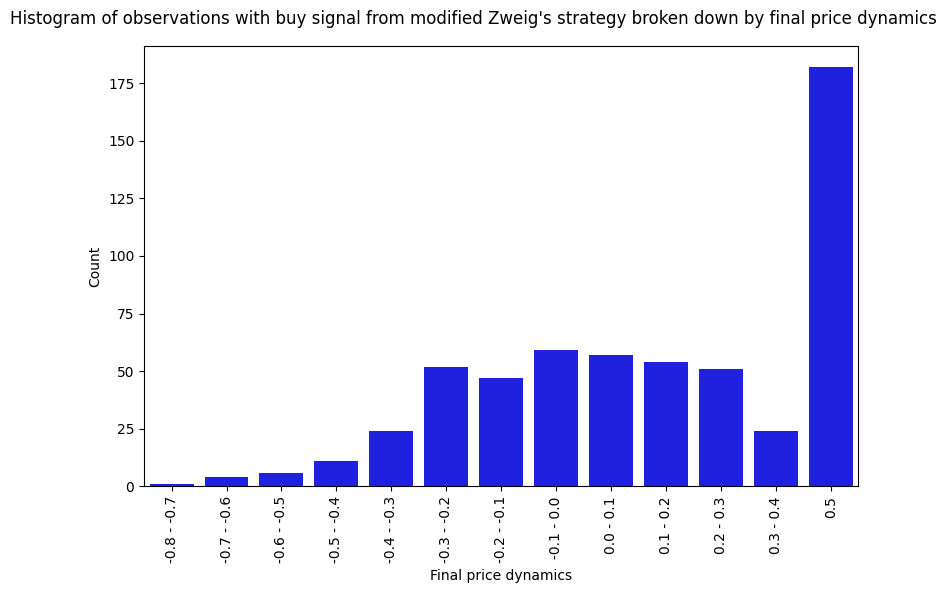

In [84]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        zweig_df[zweig_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from '\
    'modified Zweig\'s strategy broken down by final price dynamics')

plt.tight_layout();

The modified Zweig's strategy was profitable in 47 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 46 of analyzed periods. Moreover, the modified strategy brought the average profit of 14.23%, while the original strategy brought the average profit of 6.69%. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy.

In [85]:
zweig_return_df['Modified Zweig\'s strategy'] = zweig_df[
        zweig_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

zweig_portfolio_df['buy_in_q'] = pd.Series(
    zweig_df[
        zweig_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
zweig_portfolio_df['sell_in_q'] = pd.Series(
    zweig_df[
        zweig_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
zweig_portfolio_df['Modified Zweig\'s strategy'] = (
    zweig_portfolio_df.buy_in_q - zweig_portfolio_df.sell_in_q
).cumsum()
zweig_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(zweig_return_df, zweig_portfolio_df, 'Modified Zweig\'s strategy')

Number of quarters with buy signal from Modified Zweig's strategy: 58
Number of quarters with sufficient portfolio size: 56
Number of profitable quarters using Modified Zweig's strategy: 47
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Zweig's strategy outperformed zero effort strategy: 46
Average return on Modified Zweig's strategy: 14.25%
Average return on zero effort strategy: 5.6%


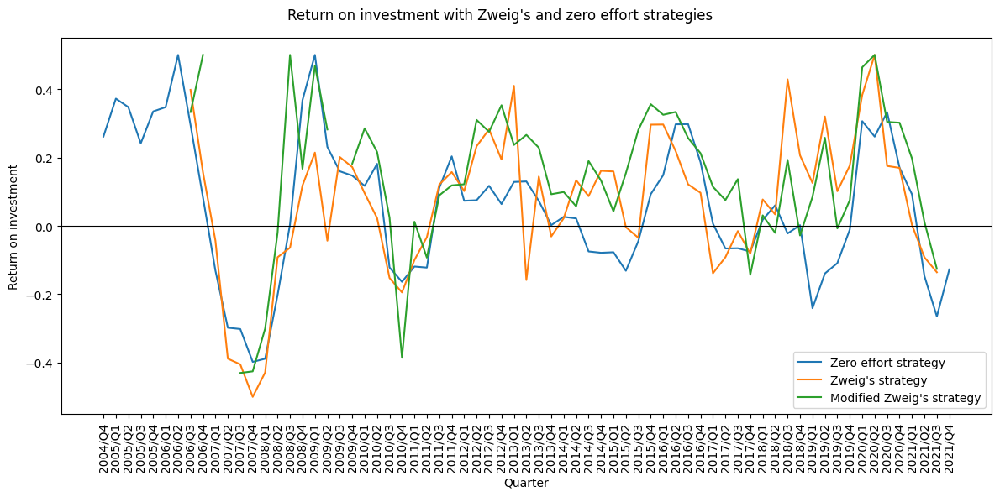

In [86]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    zweig_return_df.index,
    zweig_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Zweig\'s strategy', 'Modified Zweig\'s strategy'])

plt.suptitle('Return on investment with Zweig\'s and zero effort strategies')

plt.tight_layout();

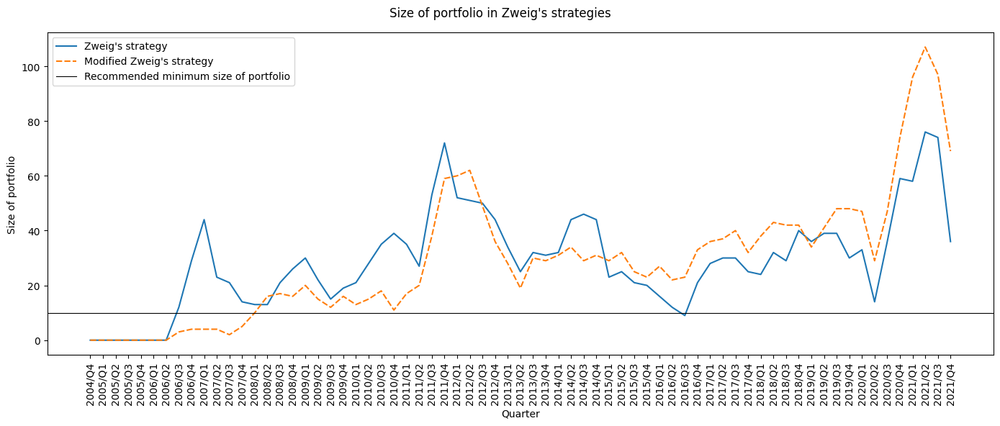

In [88]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=zweig_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(zweig_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Zweig\'s strategies')

plt.tight_layout();

# Charles Kirkpatrick's strategy

This strategy assumes, that we invest only in companies which:
- are at the top of descending ranking of relative strength from the last 6 months in given quarter, the higher the value the better;
- are at the top of descending ranking of EBIT y/y in given quarter, EBIT means: earnings before deducting interest and taxes, year-on-year dynamics are considered;
- are at the top of ascending ranking of price / sales revenues ratio in given quarter, this indicator tells investors how much to pay per unit of sales value realised by a company;
- have capitalization over USD 1 million.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **rank_relative_strength_6m**: ranking of change of company's price in the last 6 months divided by change of Warsaw Stock Exchange Index value in the last 6 months, companies in top 10 in each quarter would be considered;
- **rank_ebit_yy**: ranking of y/y dynamics of EBIT, companies in top 10 in each quarter would be considered;
- **rank_price_sales_revenues**: ranking of price / sales revenues ratio, companies in top 15 in each quarter would be considered;
- **capitalization_usd**: number of shares multiplied by price of share in USD, has to be higher than 1 000 000;
- **buy**: signal from Kirkpatrick's strategy, *Yes* if company should be bought, *No* otherwise.

In [89]:
# Filter data
kirkpatrick_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'rank_relative_strength_6m', 'rank_ebit_yy', 'rank_price_sales_revenues',
    'capitalization_usd', 'relative_strength_6m', 'ebit_yy', 'price_sales_revenues'
])

# Add column 'buy' for observations, which meet strategy conditions
kirkpatrick_df['buy'] = np.where(
    (kirkpatrick_df.rank_relative_strength_6m <= 10) &
    (kirkpatrick_df.rank_ebit_yy <= 10) &
    (kirkpatrick_df.rank_price_sales_revenues <= 15) &
    (kirkpatrick_df.capitalization_usd > 1000000),
    'Yes', 'No'
)

kirkpatrick_df['sell_in_q'] = np.where(
    kirkpatrick_df.buy == 'Yes',
    kirkpatrick_df.best_price_dynamics_in_q,
    kirkpatrick_df.price_dynamics_y_in_q
)

kirkpatrick_df = kirkpatrick_df.dropna()

The analyzed subset contains 16644 observations (90% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 383 **interesting_investment** observations (3010 in original set vs 2627 in subset). However, the Kirkpatrick's strategy classified only 9 observations as worth buying. There is little point in analysing such a small number of signals - even if they all occurred in one quarter, they would still fail to fill the portfolio at a minimum. We therefore turn to an analysis of the individual criteria.

In [90]:
print('The basic statistics of final price dynamics in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.final_price_dynamics.describe())
print('\nInteresting companies in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.interesting_investment.value_counts())
print('\nNumber of buy signals from Kirkpatrick\'s strategy: '\
    f'{kirkpatrick_df.buy.value_counts()[1]}')

The basic statistics of final price dynamics in Kirkpatrick's strategy:
count   16644.00
mean        0.01
std         0.32
min        -0.80
25%        -0.22
50%        -0.02
75%         0.24
max         0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Kirkpatrick's strategy:
No       8707
Maybe    5310
Yes      2627
Name: interesting_investment, dtype: int64

Number of buy signals from Kirkpatrick's strategy: 9


The position in relative strength 6M ranking is a very limiting constraint - only 585 observations (less than 4% of whole subdataset) were in the top 10 in any quarter. Such a narrow selection, however, does not affect the performance of this strategy well. Although 24% of the observations can be classified as interesting investments, as many as 55% of them resulted in a loss. Although observations with positions lower than 10 gave a lower chance of investing with a profit higher than 50%, on the other hand they also had a lower risk of loss.

As we remember from Zweig's analysis of the strategy, the relative strength of 6M can simply be higher than zero, so we will apply this criterion here too.

In [91]:
print('Relative strength 6M ranking:')
print(pd.Series(np.where(
    kirkpatrick_df.rank_relative_strength_6m <= 10,
    'Below 11th position', 'Over 10th position'
)).value_counts())
print('\nThe basic statistics of relative strength 6M in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.relative_strength_6m.describe())

Relative strength 6M ranking:
Over 10th position     16059
Below 11th position      585
dtype: int64

The basic statistics of relative strength 6M in Kirkpatrick's strategy:
count   16644.00
mean        0.19
std        24.09
min      -869.57
25%        -1.51
50%         0.53
75%         2.40
max      2441.38
Name: relative_strength_6m, dtype: float64


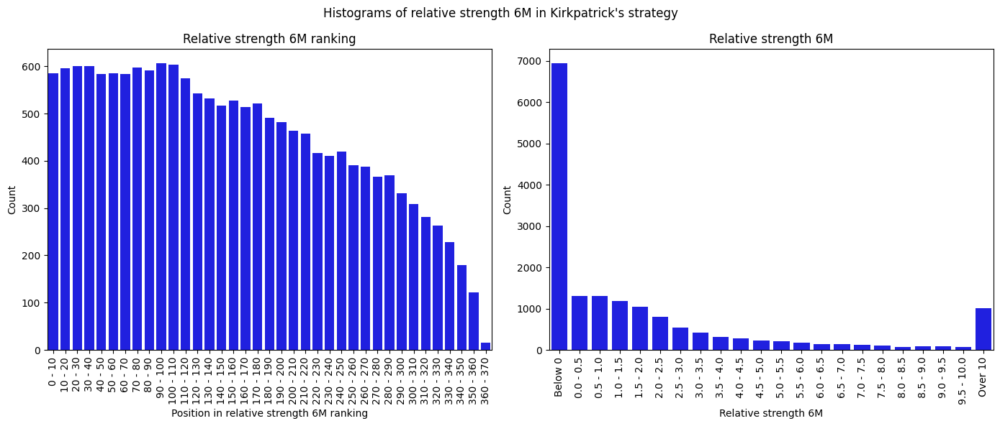

In [92]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.rank_relative_strength_6m,
        bins=list(range(0, 380, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.relative_strength_6m,
        bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
        labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Count')

axs[0].set_xlabel('Position in relative strength 6M ranking')
axs[1].set_xlabel('Relative strength 6M')

plt.suptitle('Histograms of relative strength 6M in Kirkpatrick\'s strategy')
axs[0].set_title('Relative strength 6M ranking')
axs[1].set_title('Relative strength 6M')

plt.tight_layout();

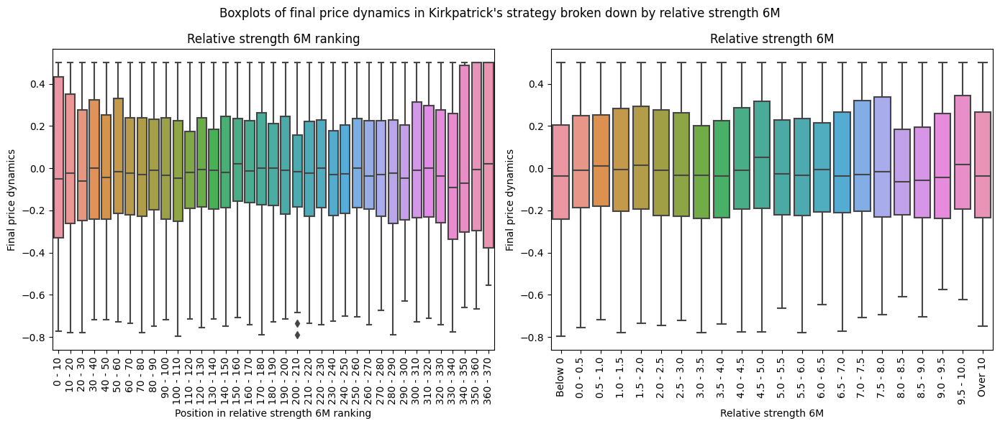

In [93]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.rank_relative_strength_6m,
        bins=list(range(0, 380, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.relative_strength_6m,
        bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
        labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')

axs[0].set_xlabel('Position in relative strength 6M ranking')
axs[1].set_xlabel('Relative strength 6M')

plt.suptitle('Boxplots of final price dynamics in Kirkpatrick\'s '\
    'strategy broken down by relative strength 6M')
axs[0].set_title('Relative strength 6M ranking')
axs[1].set_title('Relative strength 6M')

plt.tight_layout();

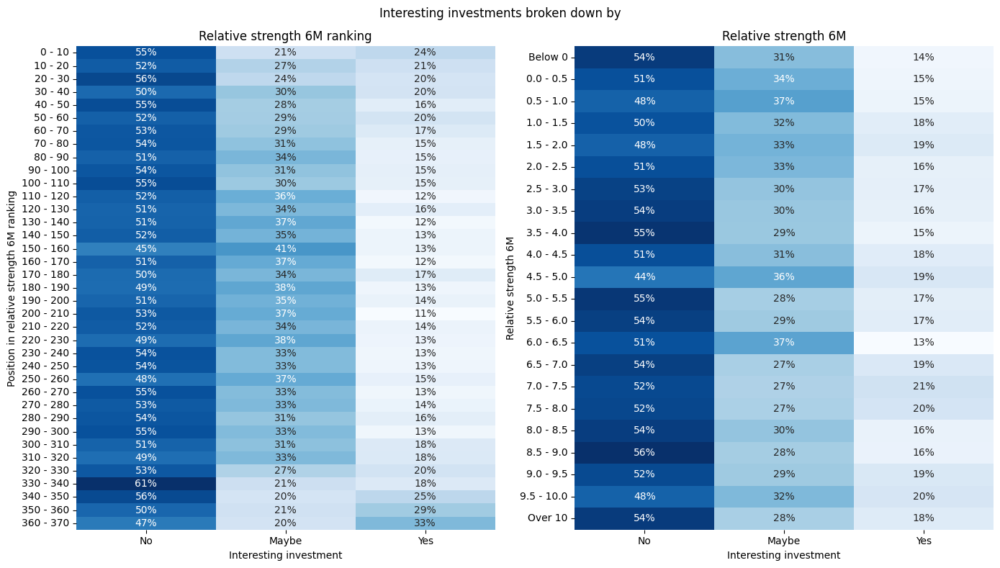

In [94]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.rank_relative_strength_6m,
            bins=list(range(0, 380, 10)),
            labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.relative_strength_6m,
            bins=[-900] + list(np.arange(0, 10.5, .5)) + [250],
            labels=['Below 0'] + [f'{i} - {i+.5}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')

axs[0].set_ylabel('Position in relative strength 6M ranking')
axs[1].set_ylabel('Relative strength 6M')

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('Relative strength 6M ranking')
axs[1].set_title('Relative strength 6M')

plt.tight_layout();

The EBIT y/y ranking position also limits the selection of companies. However, as we see in the charts below, observations in positions above 50th have a similar performance. We can therefore loosen this criterion and also select companies in positions lower than 10th.

In [95]:
print('EBIT y/y ranking:')
print(pd.Series(np.where(
    kirkpatrick_df.rank_ebit_yy <= 10,
    'Below 11th position', 'Over 10th position'
)).value_counts())
print('\nThe basic statistics of EBIT y/y in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.ebit_yy.describe())

EBIT y/y ranking:
Over 10th position     16043
Below 11th position      601
dtype: int64

The basic statistics of EBIT y/y in Kirkpatrick's strategy:
count   16644.00
mean        1.28
std        43.75
min     -1243.73
25%        -0.52
50%         0.09
75%         0.91
max      3810.50
Name: ebit_yy, dtype: float64


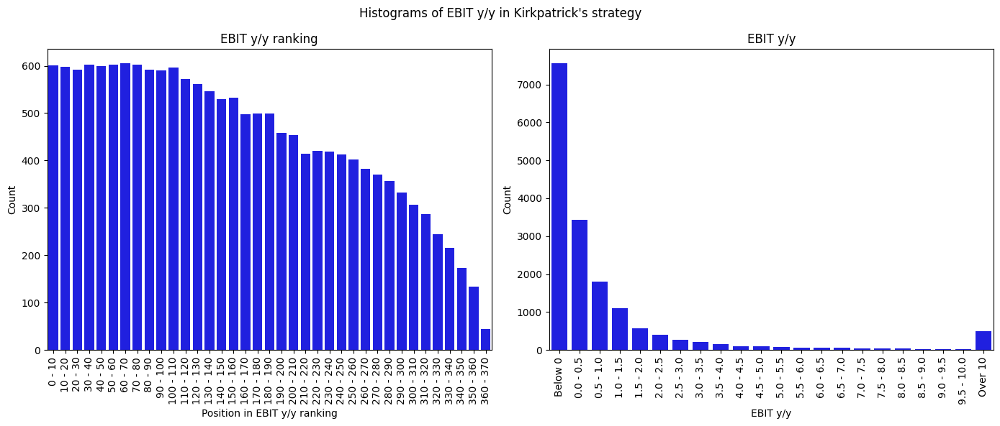

In [96]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.rank_ebit_yy,
        bins=list(range(0, 380, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.ebit_yy,
        bins=[-1300] + list(np.arange(0, 10.5, .5)) + [3900],
        labels=['Below 0']
            + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Count')

axs[0].set_xlabel('Position in EBIT y/y ranking')
axs[1].set_xlabel('EBIT y/y')

plt.suptitle('Histograms of EBIT y/y in Kirkpatrick\'s strategy')
axs[0].set_title('EBIT y/y ranking')
axs[1].set_title('EBIT y/y')

plt.tight_layout();

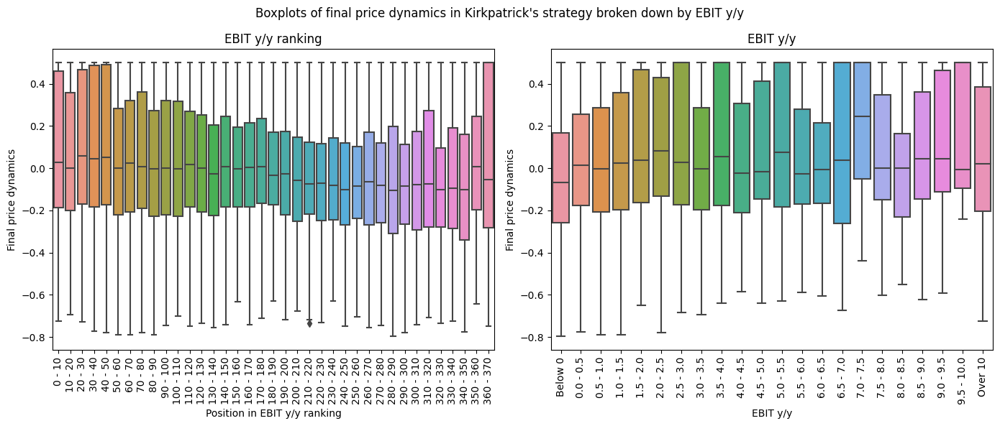

In [97]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.rank_ebit_yy,
        bins=list(range(0, 380, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.ebit_yy,
        bins=[-1300] + list(np.arange(0, 10.5, .5)) + [3900],
        labels=['Below 0']
            + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')

axs[0].set_xlabel('Position in EBIT y/y ranking')
axs[1].set_xlabel('EBIT y/y')

plt.suptitle('Boxplots of final price dynamics in Kirkpatrick\'s strategy broken down by EBIT y/y')
axs[0].set_title('EBIT y/y ranking')
axs[1].set_title('EBIT y/y')

plt.tight_layout();

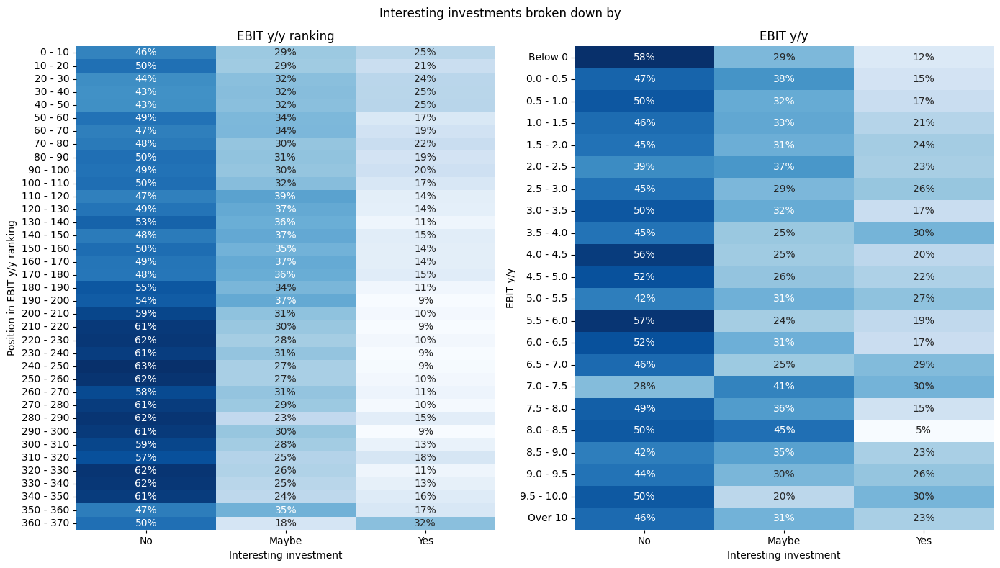

In [98]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.rank_ebit_yy,
            bins=list(range(0, 380, 10)),
            labels=[f'{i} - {i+10}' for i in range(0, 370, 10)]
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.ebit_yy,
            bins=[-1300] + list(np.arange(0, 10.5, .5)) + [3900],
            labels=['Below 0']
            + [f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')

axs[0].set_ylabel('Position in EBIT y/y ranking')
axs[1].set_ylabel('EBIT y/y')

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('EBIT y/y ranking')
axs[1].set_title('EBIT y/y')

plt.tight_layout();

Some 12% of the observations met another criterion - being in the top 15 of the price / sales revenues ratio ranking. The companies in the high ranking positions performed better than the rest, so we can keep this criterion unchanged - possibly loosening it a bit and also including observations from positions 15-30, should their number prove insufficient.

In [99]:
print('Price / sales revenues ratio ranking:')
print(pd.Series(np.where(
    kirkpatrick_df.rank_price_sales_revenues <= 15,
    'Below 16th position', 'Over 15th position'
)).value_counts())
print('\nThe basic statistics of price / sales revenues ratio in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.price_sales_revenues.describe())

Price / sales revenues ratio ranking:
Over 15th position     14570
Below 16th position     2074
dtype: int64

The basic statistics of price / sales revenues ratio in Kirkpatrick's strategy:
count    16644.00
mean        47.74
std       1924.22
min          0.00
25%          0.34
50%          0.71
75%          1.72
max     165200.00
Name: price_sales_revenues, dtype: float64


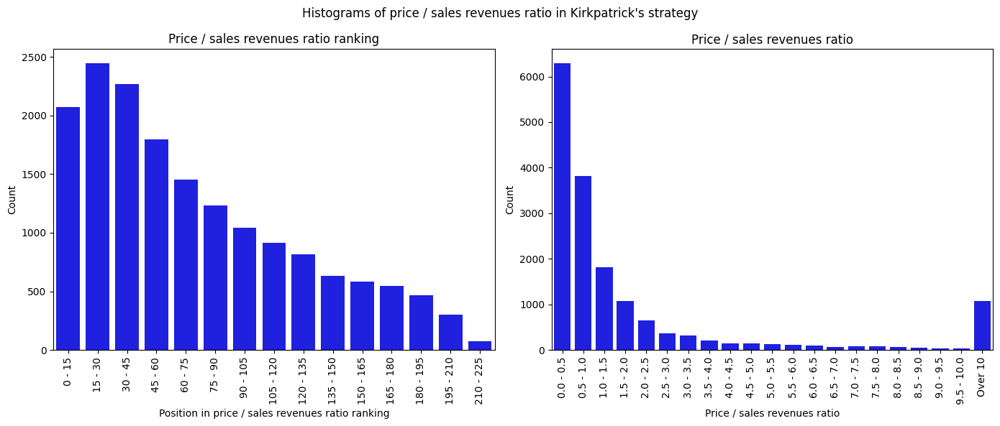

In [100]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.rank_price_sales_revenues,
        bins=list(range(0, 240, 15)),
        labels=[f'{i} - {i+15}' for i in range(0, 225, 15)]
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.price_sales_revenues,
        bins=list(np.arange(0, 10.5, .5)) + [166000],
        labels=[f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Count')

axs[0].set_xlabel('Position in price / sales revenues ratio ranking')
axs[1].set_xlabel('Price / sales revenues ratio')

plt.suptitle('Histograms of price / sales revenues ratio in Kirkpatrick\'s strategy')
axs[0].set_title('Price / sales revenues ratio ranking')
axs[1].set_title('Price / sales revenues ratio')

plt.tight_layout();

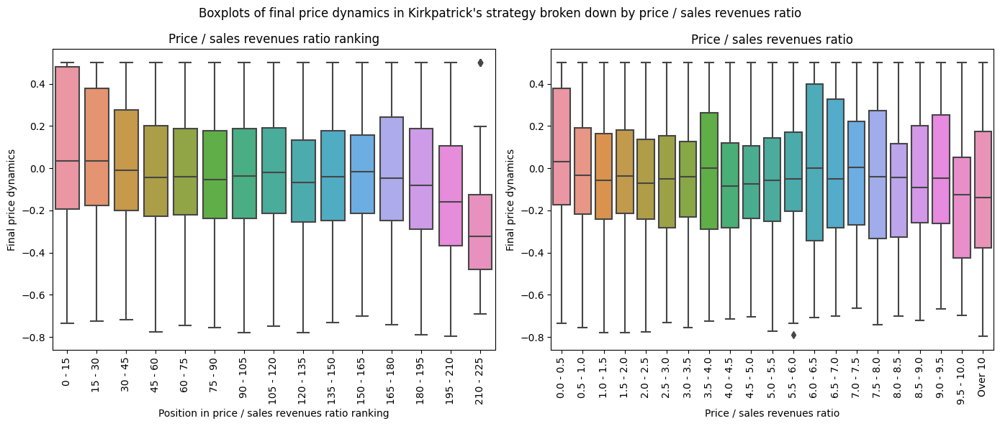

In [101]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.rank_price_sales_revenues,
        bins=list(range(0, 240, 15)),
        labels=[f'{i} - {i+15}' for i in range(0, 225, 15)]
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.price_sales_revenues,
        bins=list(np.arange(0, 10.5, .5)) + [166000],
        labels=[f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')

axs[0].set_xlabel('Position in price / sales revenues ratio ranking')
axs[1].set_xlabel('Price / sales revenues ratio')

plt.suptitle('Boxplots of final price dynamics in Kirkpatrick\'s '\
    'strategy broken down by price / sales revenues ratio')
axs[0].set_title('Price / sales revenues ratio ranking')
axs[1].set_title('Price / sales revenues ratio')

plt.tight_layout();

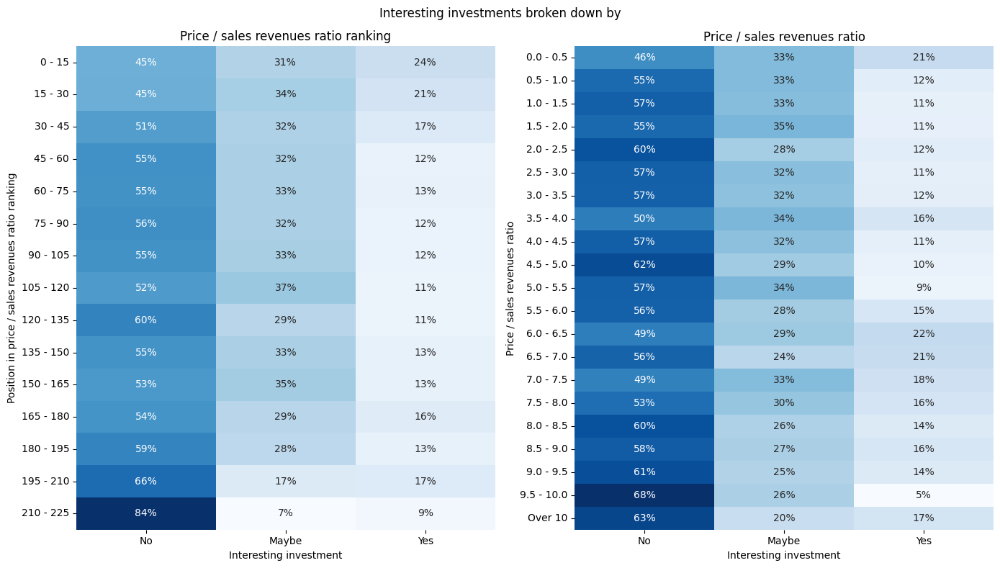

In [102]:
fig, axs = plt.subplots(1, 2, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.rank_price_sales_revenues,
            bins=list(range(0, 240, 15)),
            labels=[f'{i} - {i+15}' for i in range(0, 225, 15)]
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.price_sales_revenues,
            bins=list(np.arange(0, 10.5, .5)) + [166000],
            labels=[f'{round(i,1)} - {round(i+.5, 1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')

axs[0].set_ylabel('Position in price / sales revenues ratio ranking')
axs[1].set_ylabel('Price / sales revenues ratio')

plt.suptitle('Interesting investments broken down by')
axs[0].set_title('Price / sales revenues ratio ranking')
axs[1].set_title('Price / sales revenues ratio')

plt.tight_layout();

Kirkpatrick's last criterion is very loose - almost 99% of observations have a capitalization greater than USD 1 million. Nevertheless, the charts below suggest that it is the small-cap companies that perform significantly better than the others. However, there are too few of these, so we can select companies with capitalization of less than USD 5-10 million.

In [103]:
print('The basic statistics of capitalization in USD in Kirkpatrick\'s strategy:')
print(kirkpatrick_df.capitalization_usd.describe())
print('\nCapitalization in USD million in Kirkpatrick\'s strategy:')
print(pd.Series(np.where(
    kirkpatrick_df.capitalization_usd > 1e6,
    'Over USD 1 million', 'Below USD 1 million'
)).value_counts())

The basic statistics of capitalization in USD in Kirkpatrick's strategy:
count         16644.00
mean      408736125.29
std      1772586086.15
min            6306.89
25%        13557236.31
50%        39465575.78
75%       150334323.38
max     74944024919.08
Name: capitalization_usd, dtype: float64

Capitalization in USD million in Kirkpatrick's strategy:
Over USD 1 million     16442
Below USD 1 million      202
dtype: int64


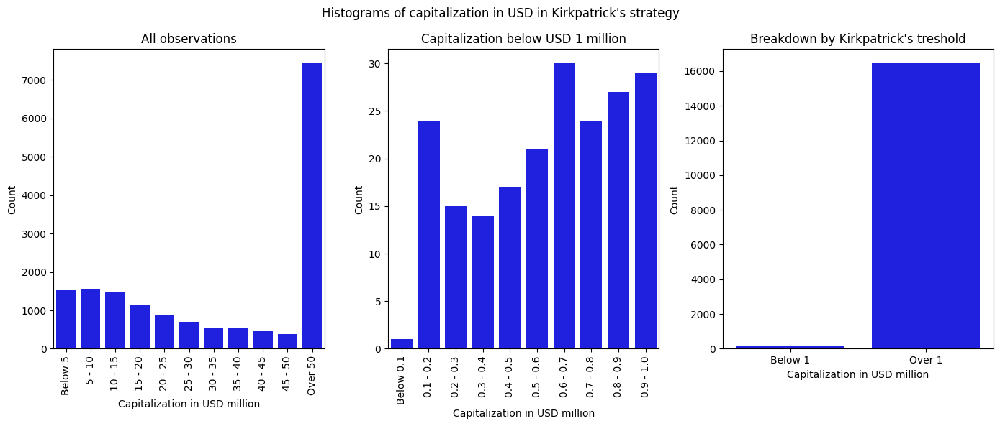

In [104]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.capitalization_usd,
        bins=list(np.arange(0, 5.5e7, 5e6)) + [7.5e10],
        labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)] + ['Over 50']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        kirkpatrick_df[kirkpatrick_df.capitalization_usd < 1e6].capitalization_usd,
        bins=list(np.arange(0, 1.1e6, 1e5)),
        labels=['Below 0.1'] + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(.1, 1, .1)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        kirkpatrick_df.capitalization_usd,
        bins=[0, 1e6, 7.5e10],
        labels=['Below 1', 'Over 1']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of capitalization in USD in Kirkpatrick\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 1 million')
axs[2].set_title('Breakdown by Kirkpatrick\'s treshold')

plt.tight_layout();

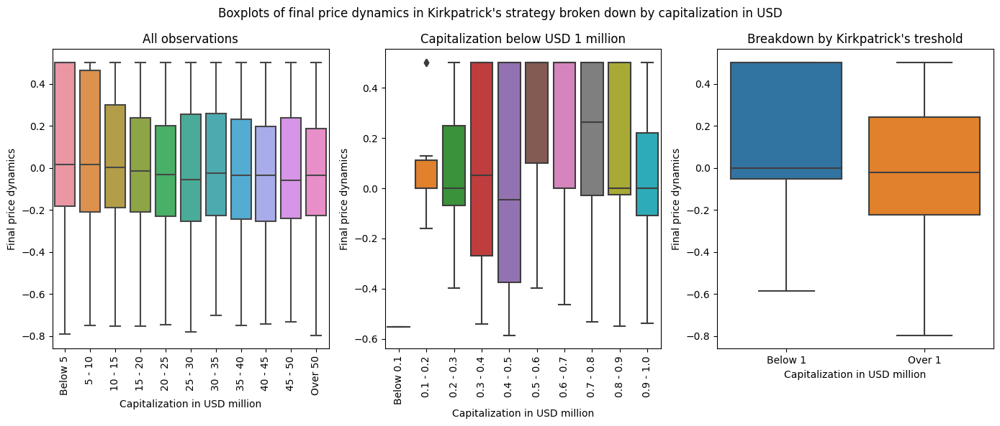

In [105]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.capitalization_usd,
        bins=list(np.arange(0, 5.5e7, 5e6)) + [7.5e10],
        labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)] + ['Over 50']
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df[kirkpatrick_df.capitalization_usd < 1e6].capitalization_usd,
        bins=list(np.arange(0, 1.1e6, 1e5)),
        labels=['Below 0.1'] + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(.1, 1, .1)]
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        kirkpatrick_df.capitalization_usd,
        bins=[0, 1e6, 7.5e10],
        labels=['Below 1', 'Over 1']
    ),
    y=kirkpatrick_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Kirkpatrick\'s '\
    'strategy broken down by capitalization in USD')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 1 million')
axs[2].set_title('Breakdown by Kirkpatrick\'s treshold')

plt.tight_layout();

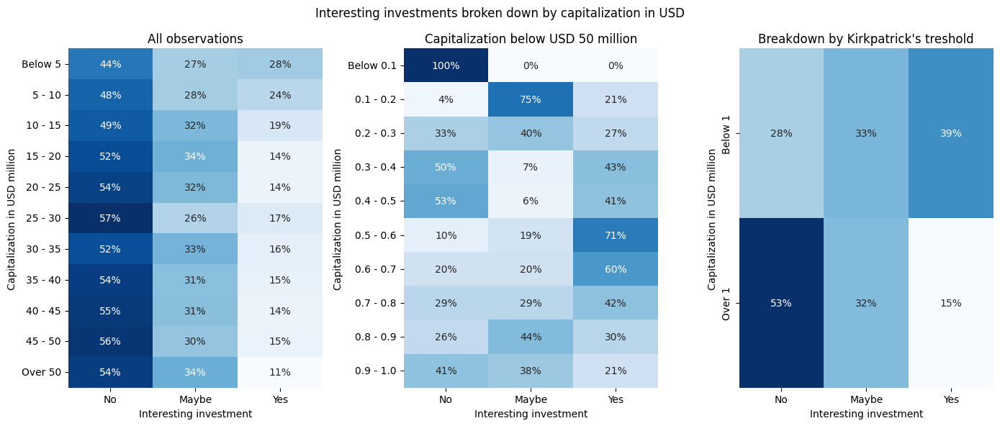

In [106]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.capitalization_usd,
            bins=list(np.arange(0, 5.5e7, 5e6)) + [7.5e10],
            labels=['Below 5'] + [f'{i} - {i+5}' for i in range(5, 50, 5)] + ['Over 50']
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df[kirkpatrick_df.capitalization_usd < 1e6].capitalization_usd,
            bins=list(np.arange(0, 1.1e6, 1e5)),
            labels=['Below 0.1'] + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(.1, 1, .1)]
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            kirkpatrick_df.capitalization_usd,
            bins=[0, 1e6, 7.5e10],
            labels=['Below 1', 'Over 1']
        ),
        kirkpatrick_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Capitalization in USD million')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by capitalization in USD')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 50 million')
axs[2].set_title('Breakdown by Kirkpatrick\'s treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed by Kirkpatrick, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. The best results are provided by choosing companies, which are in the top 40 of EBIT y/y ranking, the top 30 in price / sales revenues ranking, as well as have capitalization below USD 40 million.

In [107]:
kirkpatrick_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean()
})

kirkpatrick_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        kirkpatrick_df[
            kirkpatrick_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        kirkpatrick_df[
            kirkpatrick_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
kirkpatrick_portfolio_df['Kirkpatrick\'s strategy'] = (
    kirkpatrick_portfolio_df.buy_in_q - kirkpatrick_portfolio_df.sell_in_q
).cumsum()
kirkpatrick_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

In [108]:
kirkpatrick_mod_df = {
    'Position in EBIT y/y ranking over:':[],
    'Position in price / sales revenues ranking over:':[],
    'Capitalization in USD below:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in range(5, 55, 5): # EBIT y/y ranking
    for mod_2 in range(5, 35, 5): # Price / sales revenues ranking
        for mod_3 in np.linspace(5e6, 5e7, 10): # Capitalization
            kirkpatrick_df['mod_buy'] = np.where(
                (kirkpatrick_df.relative_strength_6m > 0) &
                (kirkpatrick_df.rank_ebit_yy <= mod_1) &
                (kirkpatrick_df.rank_price_sales_revenues <= mod_2) &
                (kirkpatrick_df.capitalization_usd < mod_3),
                'Yes', 'No'
            )

            if kirkpatrick_df[kirkpatrick_df.mod_buy == 'Yes'].shape[0] > 0:
                # Return on Modified Kirkpatrick\'s strategy
                kirkpatrick_return_df['Modified Kirkpatrick\'s strategy'] = kirkpatrick_df[
                    kirkpatrick_df.mod_buy == 'Yes'
                ].groupby('quarter').final_price_dynamics.mean()
                avg_strategy_return = (
                    100 * kirkpatrick_return_df['Modified Kirkpatrick\'s strategy'].mean()
                ).round(2)

                # If positive
                if avg_strategy_return > 0:

                    # Size of portfolio in Modified Kirkpatrick\'s strategy
                    kirkpatrick_portfolio_df['buy_in_q'] = pd.Series(
                        kirkpatrick_df[
                            kirkpatrick_df.mod_buy == 'Yes'
                        ].groupby('quarter').quarter.count().reindex(
                            sorted(dataset.quarter.unique())).fillna(0)
                    )
                    kirkpatrick_portfolio_df['sell_in_q'] = pd.Series(
                        kirkpatrick_df[
                            kirkpatrick_df.mod_buy == 'Yes'
                        ].groupby('sell_in_q').sell_in_q.count().reindex(
                            sorted(dataset.quarter.unique())).fillna(0)
                    )

                    kirkpatrick_portfolio_df['Modified Kirkpatrick\'s strategy'] = (
                        kirkpatrick_portfolio_df.buy_in_q - kirkpatrick_portfolio_df.sell_in_q
                    ).cumsum()
                    kirkpatrick_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                    quarters_with_good_portfolio_size = kirkpatrick_portfolio_df[
                        kirkpatrick_portfolio_df['Modified Kirkpatrick\'s strategy'] >= 10
                    ]['Modified Kirkpatrick\'s strategy'].count()

                    # If number of quarters with good portfolio size > 55 (80% of all quarters)
                    if quarters_with_good_portfolio_size > 55:

                        # Profitable quarters
                        quarters_profit_strat = kirkpatrick_return_df[
                            kirkpatrick_return_df['Modified Kirkpatrick\'s strategy'] > 0
                        ]['Modified Kirkpatrick\'s strategy'].count()

                        # Strategy > zero effort strategy
                        quarters_perform_strat = kirkpatrick_return_df[
                            kirkpatrick_return_df[
                                'Modified Kirkpatrick\'s strategy'
                            ] > kirkpatrick_return_df['Zero effort strategy']
                        ]['Modified Kirkpatrick\'s strategy'].count()

                        kirkpatrick_mod_df['Position in EBIT y/y ranking over:'].append(mod_1)
                        kirkpatrick_mod_df[
                            'Position in price / sales revenues ranking over:'].append(mod_2)
                        kirkpatrick_mod_df['Capitalization in USD below:'].append(mod_3)
                        kirkpatrick_mod_df['Average return (%)'].append(avg_strategy_return)
                        kirkpatrick_mod_df[
                            'Number of quarters with portfolio size over 10'
                        ].append(quarters_with_good_portfolio_size)
                        kirkpatrick_mod_df[
                            'Number of profitable quarters'].append(quarters_profit_strat)
                        kirkpatrick_mod_df[
                            'Number of quarters in which strategy outperformed zero effort strategy'
                        ].append(quarters_perform_strat)

                        # Number of signals
                        signals = kirkpatrick_df.mod_buy.value_counts()[1]

                        # Crosstab
                        ctab = pd.crosstab(
                            kirkpatrick_df.interesting_investment,
                            kirkpatrick_df.mod_buy,
                            rownames=['Interesting investment:'],
                            colnames=['Buy signal from modified Kirkpatrick\'s strategy:']
                        ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                        # % of interesting_investment == Maybe or Yes
                        kirkpatrick_mod_df[
                            'Percentage of profitable investments'
                        ].append(round(100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals))
                        # % of interesting_investment == No
                        kirkpatrick_mod_df[
                            'Percentage of loss-making investments'
                        ].append(round(100 * ctab.iloc[0, 1] / signals))

kirkpatrick_mod_df = pd.DataFrame(kirkpatrick_mod_df)

print('Data frame with best modifications of Kirkpatrick\'s strategy:')
kirkpatrick_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Kirkpatrick's strategy:


,Position in EBIT y/y ranking over:,Position in price / sales revenues ranking over:,Capitalization in USD below:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
2,40,30,40000000.00,18.02,57,46,44,70,30
3,40,30,45000000.00,17.71,58,47,44,70,30
1,40,30,35000000.00,17.65,56,45,44,70,30
4,40,30,50000000.00,17.53,59,46,44,70,30
7,45,30,25000000.00,16.25,57,45,39,70,30
16,50,25,45000000.00,18.08,59,48,42,69,31
10,45,30,40000000.00,17.57,58,47,42,69,31
22,50,30,40000000.00,17.51,61,48,43,69,31
0,35,30,50000000.00,17.46,56,45,44,69,31
11,45,30,45000000.00,17.35,59,48,41,69,31


The modified Kirkpatricks's strategy classified 303 observations as worth buying (9 in original strategy), with only 92 (30%) of them making a loss. This is the lowest percentage of mis-selected investments of the strategies analysed so far.

In [109]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
kirkpatrick_df['mod_buy'] = np.where(
    (kirkpatrick_df.relative_strength_6m > 0) &
    (kirkpatrick_df.rank_ebit_yy <= 40) &
    (kirkpatrick_df.rank_price_sales_revenues <= 30) &
    (kirkpatrick_df.capitalization_usd < 4e7),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Kirkpatrick\'s strategy: '\
    f'{kirkpatrick_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Kirkpatrick's strategy: 303


In [110]:
pd.crosstab(
    kirkpatrick_df.interesting_investment,
    kirkpatrick_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Kirkpatrick\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Kirkpatrick's strategy:,No,Yes
Interesting investment:,,
No,8615,92
Maybe,5217,93
Yes,2509,118


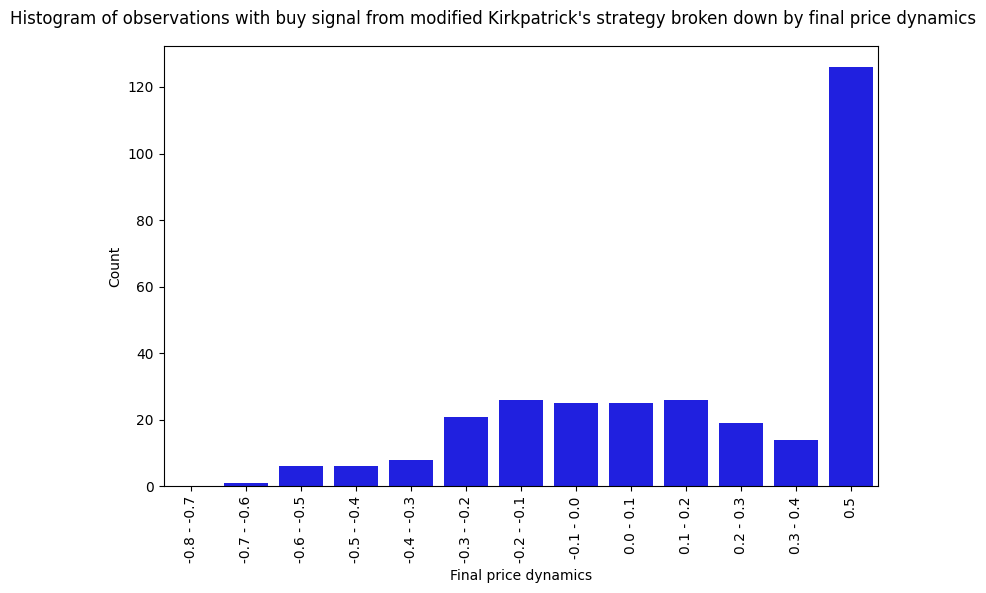

In [111]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        kirkpatrick_df[kirkpatrick_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified Kirkpatrick\'s '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified Kirkpatrick's strategy was profitable in 46 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 44 of analyzed periods. Moreover, the modified strategy brought the average profit of 18.02%, which is the best result of the strategies analysed so far. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy.

In [112]:
kirkpatrick_return_df['Modified Kirkpatrick\'s strategy'] = kirkpatrick_df[
        kirkpatrick_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

kirkpatrick_portfolio_df['buy_in_q'] = pd.Series(
    kirkpatrick_df[
        kirkpatrick_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
kirkpatrick_portfolio_df['sell_in_q'] = pd.Series(
    kirkpatrick_df[
        kirkpatrick_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
kirkpatrick_portfolio_df['Modified Kirkpatrick\'s strategy'] = (
    kirkpatrick_portfolio_df.buy_in_q - kirkpatrick_portfolio_df.sell_in_q
).cumsum()
kirkpatrick_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(kirkpatrick_return_df, kirkpatrick_portfolio_df, 'Modified Kirkpatrick\'s strategy')

Number of quarters with buy signal from Modified Kirkpatrick's strategy: 60
Number of quarters with sufficient portfolio size: 57
Number of profitable quarters using Modified Kirkpatrick's strategy: 46
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Kirkpatrick's strategy outperformed zero effort strategy: 44
Average return on Modified Kirkpatrick's strategy: 18.02%
Average return on zero effort strategy: 5.6%


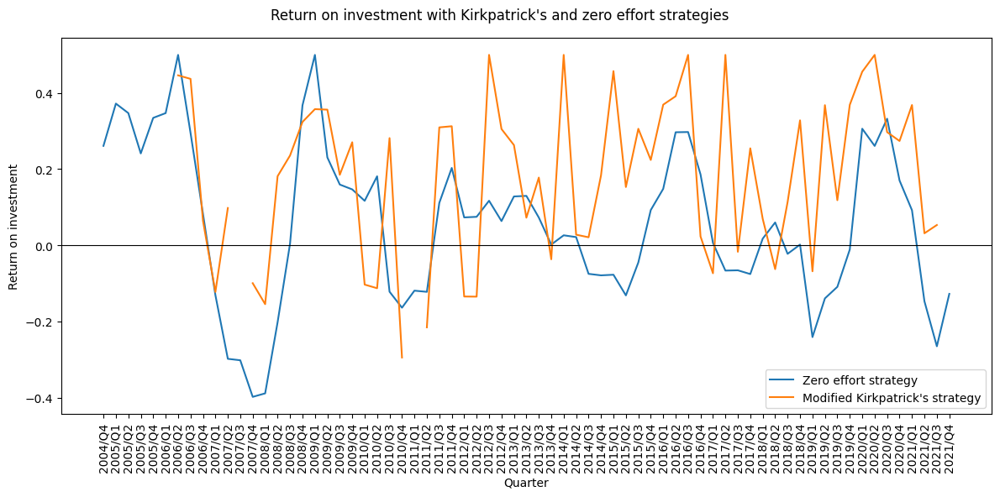

In [113]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    kirkpatrick_return_df.index,
    kirkpatrick_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Modified Kirkpatrick\'s strategy'])

plt.suptitle('Return on investment with Kirkpatrick\'s and zero effort strategies')

plt.tight_layout();

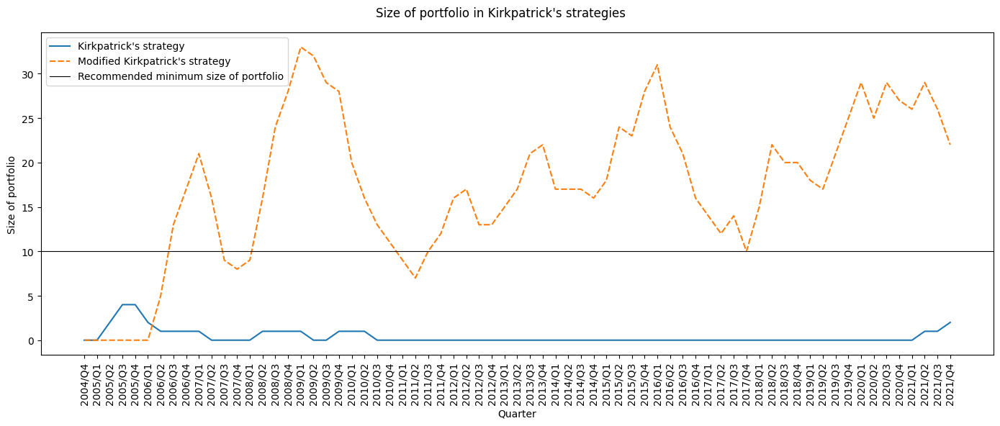

In [114]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=kirkpatrick_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(kirkpatrick_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Kirkpatrick\'s strategies')

plt.tight_layout();

# Peter Lynch's strategy

This strategy assumes, that we invest only in companies which:
- have PEG ratio (price / earnings / growth, P/E ratio to net earnings y/y) between 0 and 1, according to Lynch, applying an absolute limit to the P/E ratio (e.g below 15) can be very unfair to companies which are growing rapidly, as they can have a P/E ratio even around 30 and still be good investments, so we should relate P/E ratio to profit growth;
- have net earnings y/y between 115% and 130%, year-on-year dynamics are considered; 
- have capitalization below USD 1 billion.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **price_earnings_net_earnings_yy**: P/E ratio / net earnings y/y;
- **net_earnings_yy**: year-on-year dynamics of net earnings;
- **capitalization_usd**: number of shares multiplied by price of share in USD, has to be lower than 1 000 000 000;
- **buy**: signal from Lynch's strategy, *Yes* if company should be bought, *No* otherwise.

In [135]:
# Filter data
lynch_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'price_earnings_net_earnings_yy', 'net_earnings_yy', 'capitalization_usd'
])

# Add column 'buy' for observations, which meet strategy conditions
lynch_df['buy'] = np.where(
    (lynch_df.price_earnings_net_earnings_yy > 0) &
    (lynch_df.price_earnings_net_earnings_yy < 1) &
    (lynch_df.net_earnings_yy > .15) &
    (lynch_df.net_earnings_yy < .3) &
    (lynch_df.capitalization_usd < 1e9),
    'Yes', 'No'
)

lynch_df['sell_in_q'] = np.where(
    lynch_df.buy == 'Yes',
    lynch_df.best_price_dynamics_in_q,
    lynch_df.price_dynamics_y_in_q
)

lynch_df = lynch_df.dropna()

The analyzed subset contains 13506 observations (73% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 1042 **interesting_investment** observations (3010 in original set vs 1968 in subset). However, the Lynch's strategy did not classify any observations as worth buying. We therefore turn to an analysis of the individual criteria.

In [136]:
print('The basic statistics of final price dynamics in Lynch\'s strategy:')
print(lynch_df.final_price_dynamics.describe())
print('\nInteresting companies in Lynch\'s strategy:')
print(lynch_df.interesting_investment.value_counts())
print('\nNumber of buy signals from Lynch\'s strategy: '\
    f'{len(lynch_df) - lynch_df.buy.value_counts()[0]}')

The basic statistics of final price dynamics in Lynch's strategy:
count   13506.00
mean        0.01
std         0.31
min        -0.79
25%        -0.20
50%        -0.01
75%         0.24
max         0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Lynch's strategy:
No       6982
Maybe    4556
Yes      1968
Name: interesting_investment, dtype: int64

Number of buy signals from Lynch's strategy: 0


The range of PEG ratio feature is from -984413 to 520781 with mean value of -3.38, though the median is 2. Only about 5% of observations met the criterion for this variable. However, more than 41% of observations had negative ratio. The design of this variable means that values below zero should not be taken into account by us - they mean that the company had lower net earnings than the year before. Observations with a PEG ratio between 0 and 1 indeed perform best, however, their small number prompts us to also consider observations with values between 1 and 3, although they imply that profit growth is too small in relation to the P/E ratio.

In [137]:
print('The basic statistics of PEG ratio in Lynch\'s strategy:')
print(lynch_df.price_earnings_net_earnings_yy.describe())
print('\nPEG ratio in Lynch\'s strategy:')
print(pd.Series(np.where(
    (lynch_df.price_earnings_net_earnings_yy > 0) &
    (lynch_df.price_earnings_net_earnings_yy < 1),
    'Between 0 and 1', 'Outside (0, 1) interval'
)).value_counts())

The basic statistics of PEG ratio in Lynch's strategy:
count     13506.00
mean         -3.38
std        9858.19
min     -984413.60
25%         -24.19
50%           2.00
75%          22.25
max      520781.10
Name: price_earnings_net_earnings_yy, dtype: float64

PEG ratio in Lynch's strategy:
Outside (0, 1) interval    12789
Between 0 and 1              717
dtype: int64


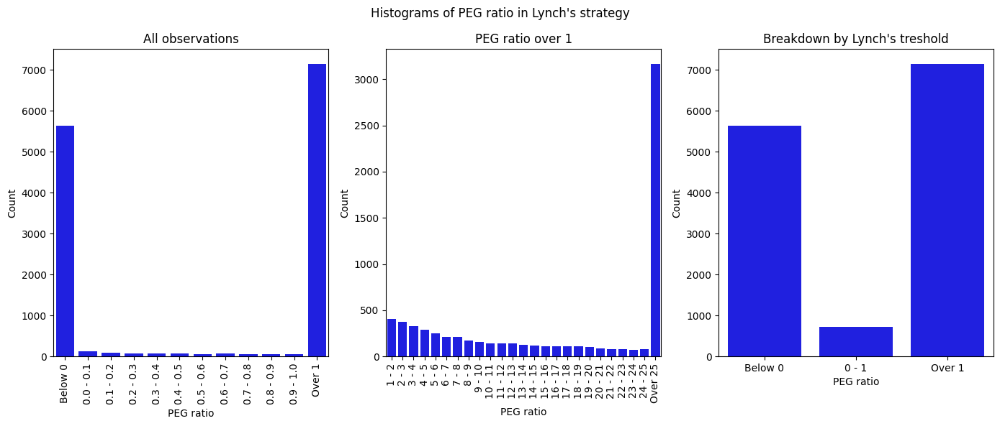

In [138]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        lynch_df.price_earnings_net_earnings_yy,
        bins=[-1e6] + list(np.arange(0, 1.1, .1)) + [1e6],
        labels=['Below 0']
        + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        lynch_df[lynch_df.price_earnings_net_earnings_yy > 1].price_earnings_net_earnings_yy,
        bins=list(range(1, 26)) + [1e6],
        labels=[f'{i} - {i+1}' for i in range(1, 25)] + ['Over 25']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        lynch_df.price_earnings_net_earnings_yy,
        bins=[-1e6, 0, 1, 1e6],
        labels=['Below 0', '0 - 1', 'Over 1']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('PEG ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of PEG ratio in Lynch\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('PEG ratio over 1')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

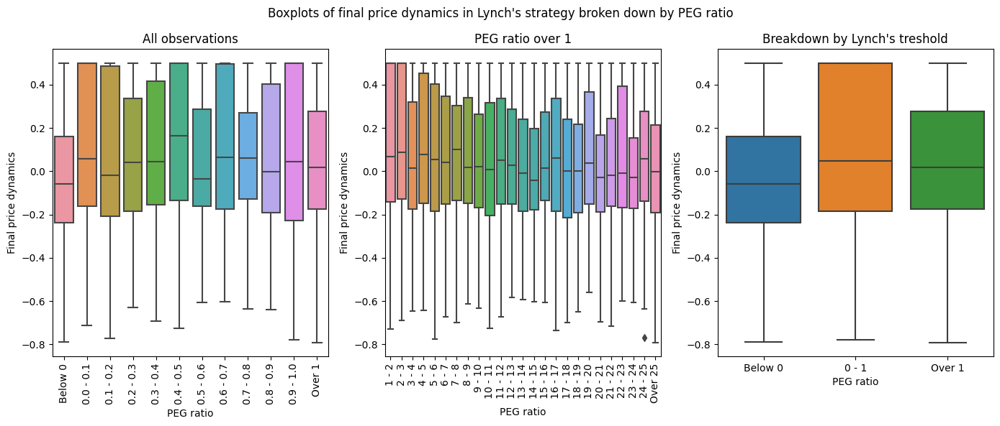

In [139]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        lynch_df.price_earnings_net_earnings_yy,
        bins=[-1e6] + list(np.arange(0, 1.1, .1)) + [1e6],
        labels=['Below 0']
        + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        lynch_df[lynch_df.price_earnings_net_earnings_yy > 1].price_earnings_net_earnings_yy,
        bins=list(range(1, 26)) + [1e6],
        labels=[f'{i} - {i+1}' for i in range(1, 25)] + ['Over 25']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        lynch_df.price_earnings_net_earnings_yy,
        bins=[-1e6, 0, 1, 1e6],
        labels=['Below 0', '0 - 1', 'Over 1']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('PEG ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Lynch\'s strategy broken down by PEG ratio')
axs[0].set_title('All observations')
axs[1].set_title('PEG ratio over 1')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

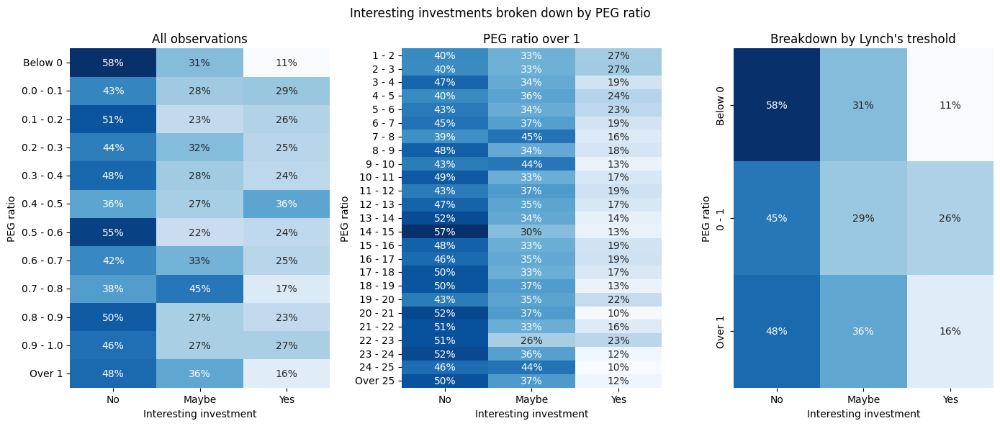

In [140]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.price_earnings_net_earnings_yy,
            bins=[-1e6] + list(np.arange(0, 1.1, .1)) + [1e6],
            labels=['Below 0']
            + [f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df[lynch_df.price_earnings_net_earnings_yy > 1].price_earnings_net_earnings_yy,
            bins=list(range(1, 26)) + [1e6],
            labels=[f'{i} - {i+1}' for i in range(1, 25)] + ['Over 25']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.price_earnings_net_earnings_yy,
            bins=[-1e6, 0, 1, 1e6],
            labels=['Below 0', '0 - 1', 'Over 1']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('PEG ratio')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by PEG ratio')
axs[0].set_title('All observations')
axs[1].set_title('PEG ratio over 1')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

The range of net earnings y/y feature is from -16083 to 3234 with mean value of 1.29, though the median is 0.15. 6% of observations met the criterion for this variable. However, more than 41% of observations had negative dynamics of net earnings.

The charts below prove that observations with net earnings y/y above 0.3 perform better. As we remember from Zweig's analysis of the strategy, considering simply positive values should ensure a profit - and sufficient portfolio fills.

In [141]:
print('The basic statistics of net earnings y/y in Lynch\'s strategy:')
print(lynch_df.net_earnings_yy.describe())
print('\nNet earnings y/y in Lynch\'s strategy:')
print(pd.Series(np.where(
    (lynch_df.net_earnings_yy > .15) &
    (lynch_df.net_earnings_yy < .3),
    'Between 115% and 130%', 'Outside (115%, 130%) interval'
)).value_counts())

The basic statistics of net earnings y/y in Lynch's strategy:
count    13506.00
mean         1.29
std        192.17
min     -16083.00
25%         -0.38
50%          0.15
75%          1.10
max       3234.00
Name: net_earnings_yy, dtype: float64

Net earnings y/y in Lynch's strategy:
Outside (115%, 130%) interval    12656
Between 115% and 130%              850
dtype: int64


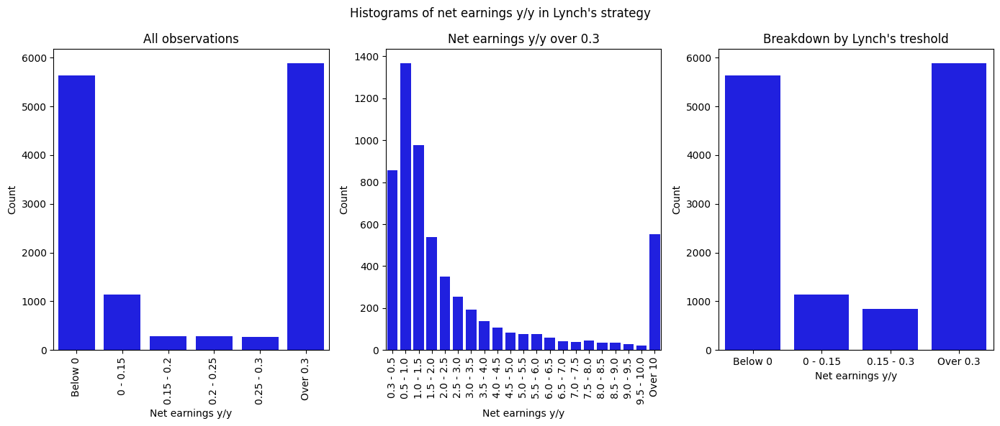

In [142]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        lynch_df.net_earnings_yy,
        bins=[-2e4, 0] + list(np.arange(.15, .35, .05)) + [4e3],
        labels=['Below 0', '0 - 0.15']
        + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(.15, .3, .05)] + ['Over 0.3']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        lynch_df[lynch_df.net_earnings_yy > .3].net_earnings_yy,
        bins=[.3] + list(np.arange(.5, 10.5, .5)) + [4e3],
        labels=['0.3 - 0.5']
        + [f'{round(i, 1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        lynch_df.net_earnings_yy,
        bins=[-2e4, 0, .15, .3, 4e3],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.3', 'Over 0.3']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net earnings y/y')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of net earnings y/y in Lynch\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y over 0.3')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

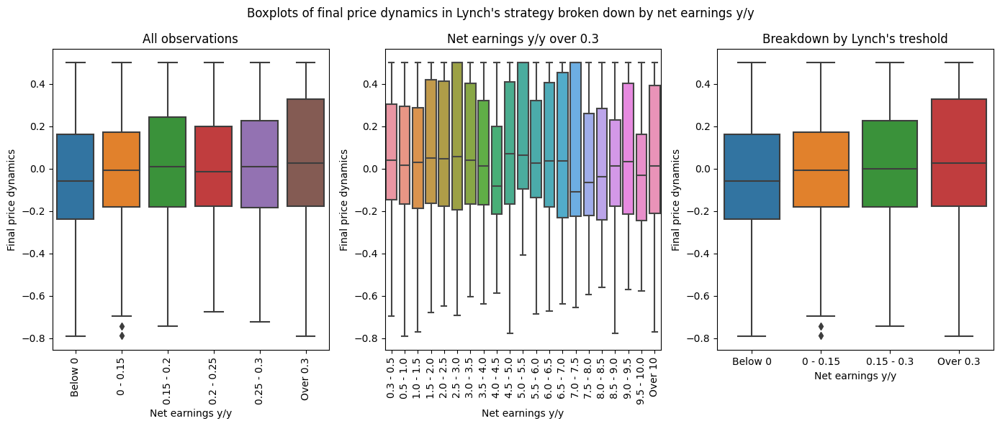

In [143]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        lynch_df.net_earnings_yy,
        bins=[-2e4, 0] + list(np.arange(.15, .35, .05)) + [4e3],
        labels=['Below 0', '0 - 0.15']
        + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(.15, .3, .05)] + ['Over 0.3']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        lynch_df[lynch_df.net_earnings_yy > .3].net_earnings_yy,
        bins=[.3] + list(np.arange(.5, 10.5, .5)) + [4e3],
        labels=['0.3 - 0.5']
        + [f'{round(i, 1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        lynch_df.net_earnings_yy,
        bins=[-2e4, 0, .15, .3, 4e3],
        labels=['Below 0', '0 - 0.15', '0.15 - 0.3', 'Over 0.3']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net earnings y/y')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Lynch\'s '\
    'strategy broken down by net earnings y/y')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y over 0.3')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

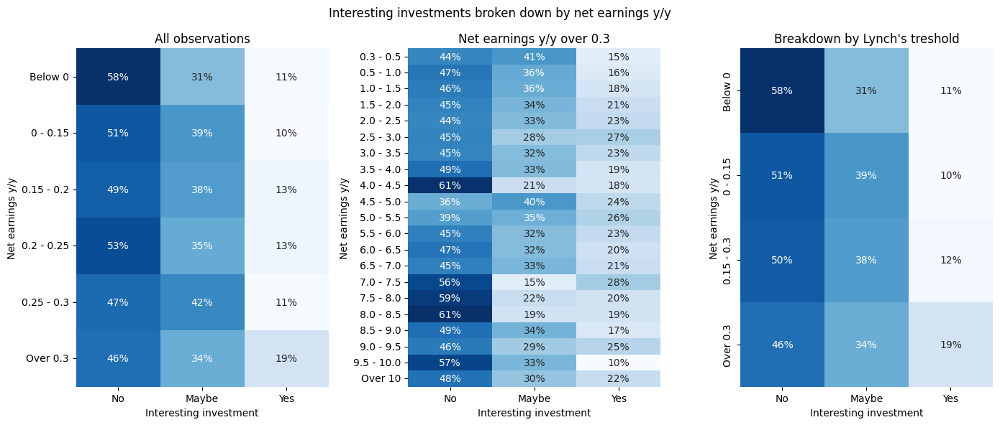

In [144]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.net_earnings_yy,
            bins=[-2e4, 0] + list(np.arange(.15, .35, .05)) + [4e3],
            labels=['Below 0', '0 - 0.15']
            + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(.15, .3, .05)] + ['Over 0.3']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df[lynch_df.net_earnings_yy > .3].net_earnings_yy,
            bins=[.3] + list(np.arange(.5, 10.5, .5)) + [4e3],
            labels=['0.3 - 0.5']
            + [f'{round(i, 1)} - {round(i+.5, 1)}' for i in np.arange(.5, 10, .5)] + ['Over 10']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.net_earnings_yy,
            bins=[-2e4, 0, .15, .3, 4e3],
            labels=['Below 0', '0 - 0.15', '0.15 - 0.3', 'Over 0.3']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Net earnings y/y')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by net earnings y/y')
axs[0].set_title('All observations')
axs[1].set_title('Net earnings y/y over 0.3')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

The company's capitalization in USD is the last element of Lynch's strategy. The range of this feature is from USD 124.4 thousand to USD 113 billion with mean value of USD 883 million, though the median is USD 61 million. About 88% of observations fall below the strategy treshold of USD 1 billion.

While companies meeting this criterion perform better than those with a capitalization of more than USD 1 billion, nevertheless, as we remember from Greenblatt's or Kirkpatrick's analyses of the strategy, the best performance was achieved by observations with a capitalization of less than 10-15 million.

In [145]:
print('The basic statistics of capitalization in USD in Lynch\'s strategy:')
print(lynch_df.capitalization_usd.describe())
print('\nCapitalization in USD million in Lynch\'s strategy:')
print(pd.Series(np.where(
    lynch_df.capitalization_usd < 1e9,
    'Below USD 1 billion', 'Over USD 1 billion'
)).value_counts())

The basic statistics of capitalization in USD in Lynch's strategy:
count          13506.00
mean       882620997.08
std       4370030400.12
min           124385.25
25%         19507236.33
50%         61139441.82
75%        255152196.82
max     112717565617.03
Name: capitalization_usd, dtype: float64

Capitalization in USD million in Lynch's strategy:
Below USD 1 billion    11934
Over USD 1 billion      1572
dtype: int64


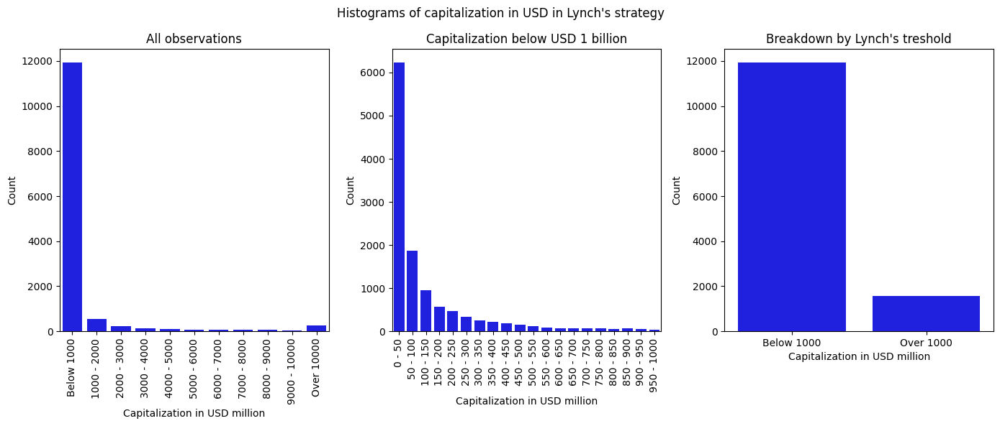

In [146]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        lynch_df.capitalization_usd,
        bins=[0] + list(np.arange(1e9, 11e9, 1e9)) + [1e12],
        labels=['Below 1000']
        + [f'{round(i)} - {round(i+ 1000)}' for i in np.arange(1000, 10000, 1000)] + ['Over 10000']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        lynch_df[lynch_df.capitalization_usd < 1e9].capitalization_usd,
        bins=list(np.arange(0, 105e7, 5e7)),
        labels=[f'{round(i)} - {round(i+50)}' for i in np.arange(0, 1000, 50)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        lynch_df.capitalization_usd,
        bins=[0, 1e9, 1e12],
        labels=['Below 1000', 'Over 1000']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of capitalization in USD in Lynch\'s strategy')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 1 billion')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

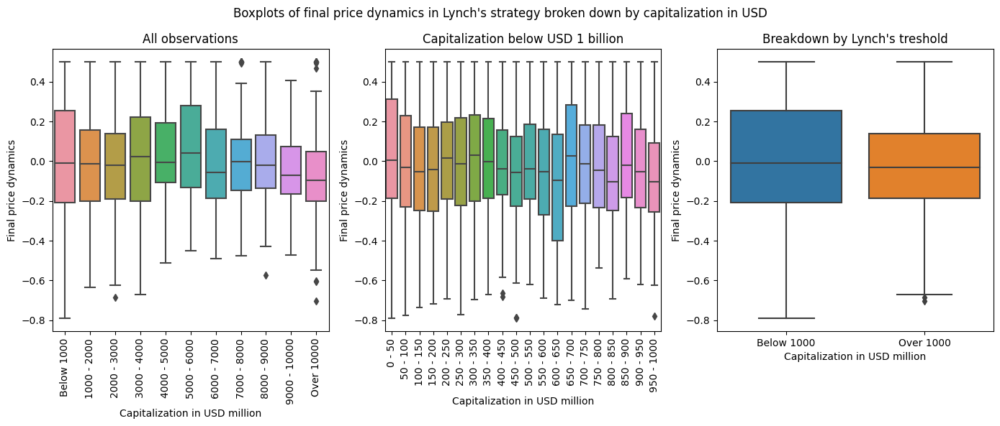

In [147]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        lynch_df.capitalization_usd,
        bins=[0] + list(np.arange(1e9, 11e9, 1e9)) + [1e12],
        labels=['Below 1000']
        + [f'{round(i)} - {round(i+ 1000)}' for i in np.arange(1000, 10000, 1000)] + ['Over 10000']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        lynch_df[lynch_df.capitalization_usd < 1e9].capitalization_usd,
        bins=list(np.arange(0, 105e7, 5e7)),
        labels=[f'{round(i)} - {round(i+50)}' for i in np.arange(0, 1000, 50)]
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        lynch_df.capitalization_usd,
        bins=[0, 1e9, 1e12],
        labels=['Below 1000', 'Over 1000']
    ),
    y=lynch_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Capitalization in USD million')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Lynch\'s '\
    'strategy broken down by capitalization in USD')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 1 billion')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

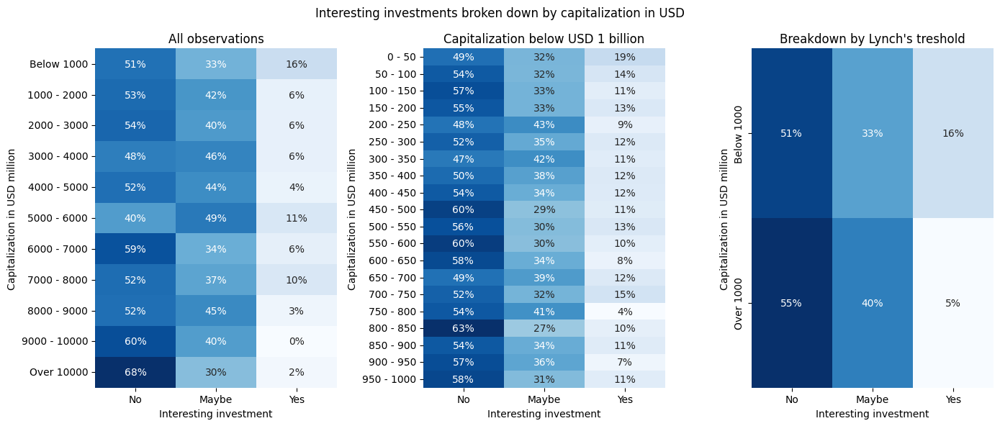

In [148]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.capitalization_usd,
            bins=[0] + list(np.arange(1e9, 11e9, 1e9)) + [1e12],
            labels=['Below 1000']
            + [f'{round(i)} - {round(i+ 1000)}' for i in np.arange(1000, 10000, 1000)]
            + ['Over 10000']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df[lynch_df.capitalization_usd < 1e9].capitalization_usd,
            bins=list(np.arange(0, 105e7, 5e7)),
            labels=[f'{round(i)} - {round(i+50)}' for i in np.arange(0, 1000, 50)]
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            lynch_df.capitalization_usd,
            bins=[0, 1e9, 1e12],
            labels=['Below 1000', 'Over 1000']
        ),
        lynch_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Capitalization in USD million')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by capitalization in USD')
axs[0].set_title('All observations')
axs[1].set_title('Capitalization below USD 1 billion')
axs[2].set_title('Breakdown by Lynch\'s treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed by Lynch, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. The best results are provided by choosing companies, which have PEG ratio between 0 and 3, positive net earnings y/y, as well as have capitalization below USD 25 million.

In [149]:
lynch_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean()
})

lynch_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        lynch_df[
            lynch_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        lynch_df[
            lynch_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
lynch_portfolio_df['Lynch\'s strategy'] = (
    lynch_portfolio_df.buy_in_q - lynch_portfolio_df.sell_in_q
).cumsum()
lynch_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

In [150]:
lynch_mod_df = {
    'PEG ratio between 0 and:':[],
    'Capitalization in USD below:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.arange(.1, 3.1, .1): # PEG ratio
    for mod_2 in np.linspace(5e6, 5e7, 10): # Capitalization
        lynch_df['mod_buy'] = np.where(
            (lynch_df.price_earnings_net_earnings_yy > 0) &
            (lynch_df.price_earnings_net_earnings_yy < mod_1) &
            (lynch_df.net_earnings_yy > 0) &
            (lynch_df.capitalization_usd < mod_2),
            'Yes', 'No'
        )

        if lynch_df[lynch_df.mod_buy == 'Yes'].shape[0] > 0:
            # Return on Modified Lynch\'s strategy
            lynch_return_df['Modified Lynch\'s strategy'] = lynch_df[
                lynch_df.mod_buy == 'Yes'
            ].groupby('quarter').final_price_dynamics.mean()
            avg_strategy_return = (
                100 * lynch_return_df['Modified Lynch\'s strategy'].mean()
            ).round(2)

            # If positive
            if avg_strategy_return > 0:

                # Size of portfolio in Modified Lynch\'s strategy
                lynch_portfolio_df['buy_in_q'] = pd.Series(
                    lynch_df[
                        lynch_df.mod_buy == 'Yes'
                    ].groupby('quarter').quarter.count().reindex(
                        sorted(dataset.quarter.unique())).fillna(0)
                )
                lynch_portfolio_df['sell_in_q'] = pd.Series(
                    lynch_df[
                        lynch_df.mod_buy == 'Yes'
                    ].groupby('sell_in_q').sell_in_q.count().reindex(
                        sorted(dataset.quarter.unique())).fillna(0)
                )

                lynch_portfolio_df['Modified Lynch\'s strategy'] = (
                    lynch_portfolio_df.buy_in_q - lynch_portfolio_df.sell_in_q
                ).cumsum()
                lynch_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                quarters_with_good_portfolio_size = lynch_portfolio_df[
                    lynch_portfolio_df['Modified Lynch\'s strategy'] >= 10
                ]['Modified Lynch\'s strategy'].count()

                # If number of quarters with good portfolio size > 55 (80% of all quarters)
                if quarters_with_good_portfolio_size > 55:

                    # Profitable quarters
                    quarters_profit_strat = lynch_return_df[
                        lynch_return_df['Modified Lynch\'s strategy'] > 0
                    ]['Modified Lynch\'s strategy'].count()

                    # Strategy > zero effort strategy
                    quarters_perform_strat = lynch_return_df[
                        lynch_return_df[
                            'Modified Lynch\'s strategy'] > lynch_return_df['Zero effort strategy']
                    ]['Modified Lynch\'s strategy'].count()

                    lynch_mod_df['PEG ratio between 0 and:'].append(mod_1)
                    lynch_mod_df['Capitalization in USD below:'].append(mod_2)
                    lynch_mod_df['Average return (%)'].append(avg_strategy_return)
                    lynch_mod_df[
                        'Number of quarters with portfolio size over 10'
                    ].append(quarters_with_good_portfolio_size)
                    lynch_mod_df['Number of profitable quarters'].append(quarters_profit_strat)
                    lynch_mod_df[
                        'Number of quarters in which strategy outperformed zero effort strategy'
                    ].append(quarters_perform_strat)

                    # Number of signals
                    signals = lynch_df.mod_buy.value_counts()[1]

                    # Crosstab
                    ctab = pd.crosstab(
                        lynch_df.interesting_investment,
                        lynch_df.mod_buy,
                        rownames=['Interesting investment:'],
                        colnames=['Buy signal from modified Lynch\'s strategy:']
                    ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                    # % of interesting_investment == Maybe or Yes
                    lynch_mod_df[
                        'Percentage of profitable investments'
                    ].append(round(100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals))
                    # % of interesting_investment == No
                    lynch_mod_df[
                        'Percentage of loss-making investments'
                    ].append(round(100 * ctab.iloc[0, 1] / signals))

lynch_mod_df = pd.DataFrame(lynch_mod_df)

print('Data frame with best modifications of Lynch\'s strategy:')
lynch_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Lynch's strategy:


,PEG ratio between 0 and:,Capitalization in USD below:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
57,3.00,25000000.00,12.06,56,47,45,65,35
51,2.90,25000000.00,11.98,56,45,45,65,35
58,3.00,30000000.00,10.70,57,45,44,65,35
41,2.70,30000000.00,10.69,56,43,45,65,35
46,2.80,30000000.00,10.44,56,41,45,65,35
...,...,...,...,...,...,...,...,...
14,2.00,50000000.00,10.79,58,40,42,63,37
21,2.20,45000000.00,10.79,59,40,43,63,37
1,1.60,50000000.00,10.77,56,39,40,63,37
26,2.30,50000000.00,10.75,59,40,42,63,37


The modified Lynch's strategy classified 663 observations as worth buying (0 in original strategy), with 230 (35%) of them making a loss and 241 (36%) of them making a profit over 50%. In this respect, the strategy is only slightly worse than, for the time being best, modified Kirkpatrick's strategy, of which 30% of buy signals would result in a loss and 39% would result in a profit above 50%.

In [151]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
lynch_df['mod_buy'] = np.where(
    (lynch_df.price_earnings_net_earnings_yy > 0) &
    (lynch_df.price_earnings_net_earnings_yy < 3) &
    (lynch_df.net_earnings_yy > 0) &
    (lynch_df.capitalization_usd < 25e6),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Lynch\'s strategy: '\
    f'{lynch_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Lynch's strategy: 663


In [152]:
pd.crosstab(
    lynch_df.interesting_investment,
    lynch_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Lynch\'s strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Lynch's strategy:,No,Yes
Interesting investment:,,
No,6752,230
Maybe,4364,192
Yes,1727,241


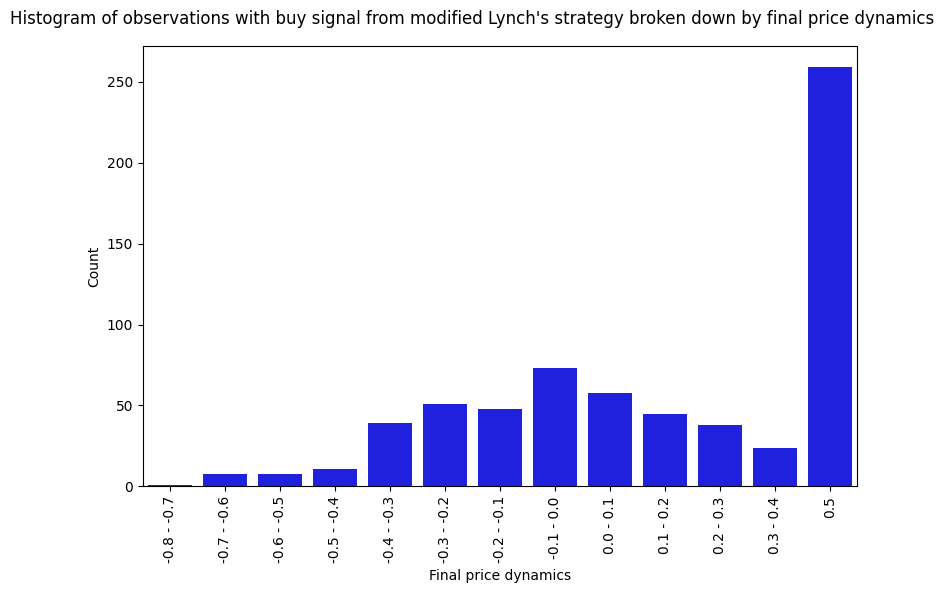

In [153]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        lynch_df[lynch_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified Lynch\'s '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified Lynch's strategy was profitable in 47 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 45 of analyzed periods. Moreover, the modified strategy brought the average profit of 12.06%, which is the third best result of the strategies analysed so far. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy.

Although the modified Lynch strategy produced a lower average profit than the modified Kirkpatrick strategy, it was profitable in an identical number of quarters (47) and outperformed the zero effort strategy in 45 quarters (46 for modified Kirkpatrick's).

In [154]:
lynch_return_df['Modified Lynch\'s strategy'] = lynch_df[
        lynch_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

lynch_portfolio_df['buy_in_q'] = pd.Series(
    lynch_df[
        lynch_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
lynch_portfolio_df['sell_in_q'] = pd.Series(
    lynch_df[
        lynch_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
lynch_portfolio_df['Modified Lynch\'s strategy'] = (
    lynch_portfolio_df.buy_in_q - lynch_portfolio_df.sell_in_q
).cumsum()
lynch_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(lynch_return_df, lynch_portfolio_df, 'Modified Lynch\'s strategy')

Number of quarters with buy signal from Modified Lynch's strategy: 62
Number of quarters with sufficient portfolio size: 56
Number of profitable quarters using Modified Lynch's strategy: 47
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Lynch's strategy outperformed zero effort strategy: 45
Average return on Modified Lynch's strategy: 12.06%
Average return on zero effort strategy: 5.6%


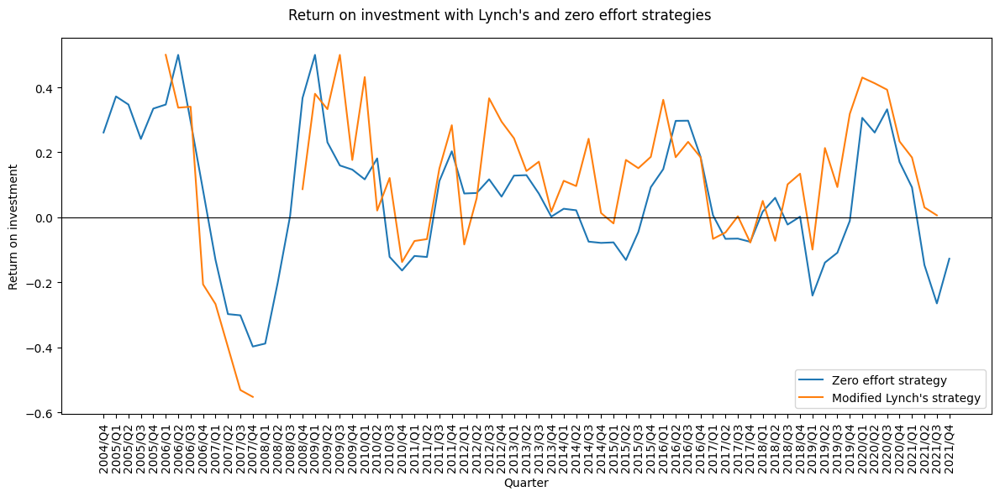

In [156]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    lynch_return_df.index,
    lynch_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Modified Lynch\'s strategy'])

plt.suptitle('Return on investment with Lynch\'s and zero effort strategies')

plt.tight_layout();

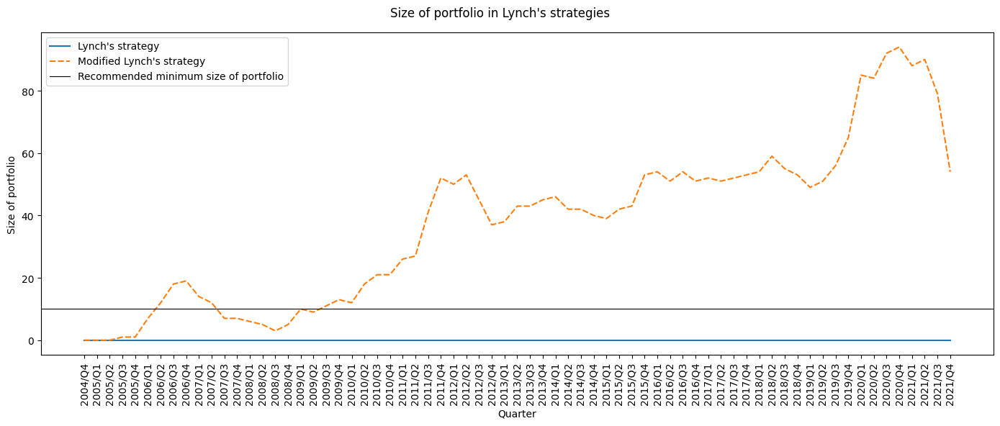

In [157]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=lynch_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(lynch_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Lynch\'s strategies')

plt.tight_layout();

# Price - Profitability - Debt (PPD) strategy

This strategy assumes, that we invest only in companies which:
- have price / book value ratio below 1, which should suggest that the company is undervalued;
- are at the top of ascending ranking of price / earnings ratio in given quarter;
- have ROCE (return on capital employed) over 0.07, ROCE is EBIT to core capital and determines the productivity and profitability of investments in which the entrepreneur's fixed capital is involved; 
- have net debt to EBIT below 0, i.e. have more cash than liabilities.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **price_book_value**: price / book value ratio, should be below 1;
- **rank_price_earnings**: P/E ratio ranking, should be in top 50;
- **roce**: ROCE, should be over 0.07;
- **net_debt_ebit**: net debt to EBIT ratio, should be below 0;
- **buy**: signal from PPD's strategy, *Yes* if company should be bought, *No* otherwise.

In [158]:
# Filter data
ppd_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'price_book_value', 'rank_price_earnings', 'price_earnings',
    'roce', 'net_debt_ebit'
])

# Add column 'buy' for observations, which meet strategy conditions
ppd_df['buy'] = np.where(
    (ppd_df.price_book_value < 1) &
    (ppd_df.rank_price_earnings <= 50) &
    (ppd_df.roce > .07) &
    (ppd_df.net_debt_ebit < 0),
    'Yes', 'No'
)

ppd_df['sell_in_q'] = np.where(
    ppd_df.buy == 'Yes',
    ppd_df.best_price_dynamics_in_q,
    ppd_df.price_dynamics_y_in_q
)

ppd_df = ppd_df.dropna()

The analyzed subset contains 13032 observations (70% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 1053 **interesting_investment** observations (3010 in original set vs 1957 in subset). However, the PPD strategy classified only 87 observations as worth buying. What is worse, 26 of them made a loss, and another 26 made a profit below 50%.

In [159]:
print('The basic statistics of final price dynamics in PPD strategy:')
print(ppd_df.final_price_dynamics.describe())
print('\nInteresting companies in PPD strategy:')
print(ppd_df.interesting_investment.value_counts())
print(f'\nNumber of buy signals from PPD strategy: {len(ppd_df) - ppd_df.buy.value_counts()[0]}')

The basic statistics of final price dynamics in PPD strategy:
count   13032.00
mean        0.02
std         0.31
min        -0.79
25%        -0.20
50%        -0.01
75%         0.24
max         0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in PPD strategy:
No       6712
Maybe    4363
Yes      1957
Name: interesting_investment, dtype: int64

Number of buy signals from PPD strategy: 87


In [160]:
pd.crosstab(
    ppd_df.interesting_investment,
    ppd_df.buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from PPD strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from PPD strategy:,No,Yes
Interesting investment:,,
No,6686,26
Maybe,4337,26
Yes,1922,35


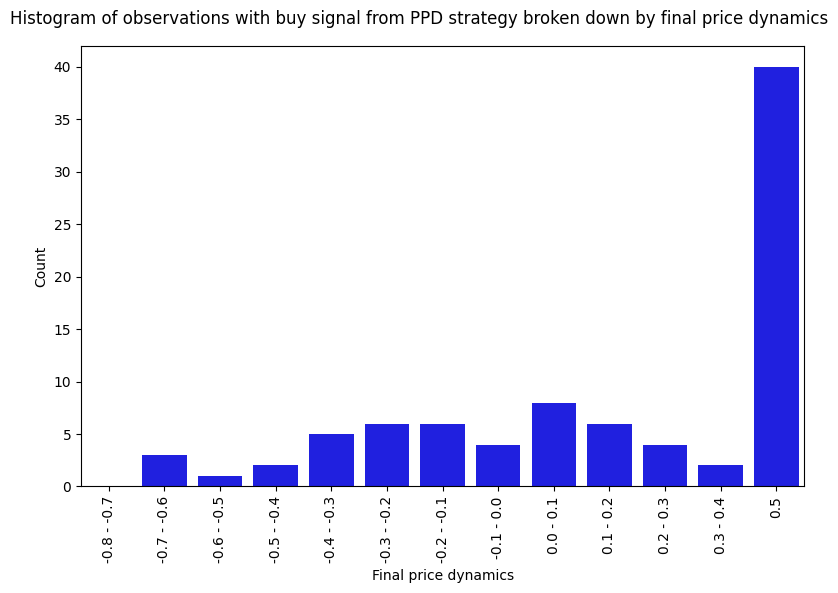

In [161]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        ppd_df[ppd_df.buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from PPD '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The PPD strategy was profitable in 46% of quarters and outperformed zero effort strategy (i.e. investing in WIG) in 38% of periods. The PPD stategy brought the positive average return of 14.12%. Moreover, there were 23 quarters, when there were no companies classified as worth buying and the strategy reached the sufficient portfolio size in only 2 quarters.

In [162]:
ppd_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean(),
    'PPD strategy':ppd_df[
        ppd_df.buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()
})

ppd_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        ppd_df[
            ppd_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        ppd_df[
            ppd_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
ppd_portfolio_df['PPD strategy'] = (
    ppd_portfolio_df.buy_in_q - ppd_portfolio_df.sell_in_q
).cumsum()
ppd_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(ppd_return_df, ppd_portfolio_df, 'PPD strategy')

Number of quarters with buy signal from PPD strategy: 47
Number of quarters with sufficient portfolio size: 2
Number of profitable quarters using PPD strategy: 34
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which PPD strategy outperformed zero effort strategy: 27
Average return on PPD strategy: 14.12%
Average return on zero effort strategy: 5.6%


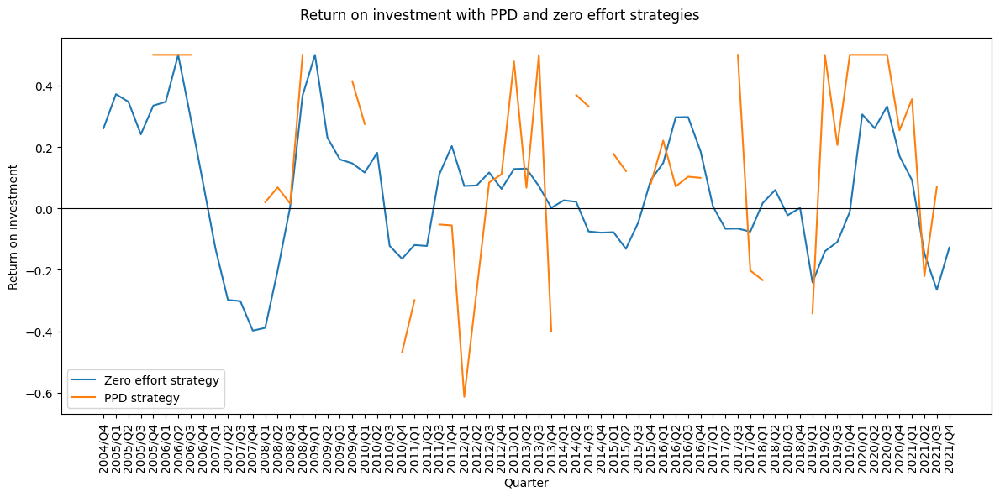

In [163]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    ppd_return_df.index,
    ppd_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'PPD strategy'])

plt.suptitle('Return on investment with PPD and zero effort strategies')

plt.tight_layout();

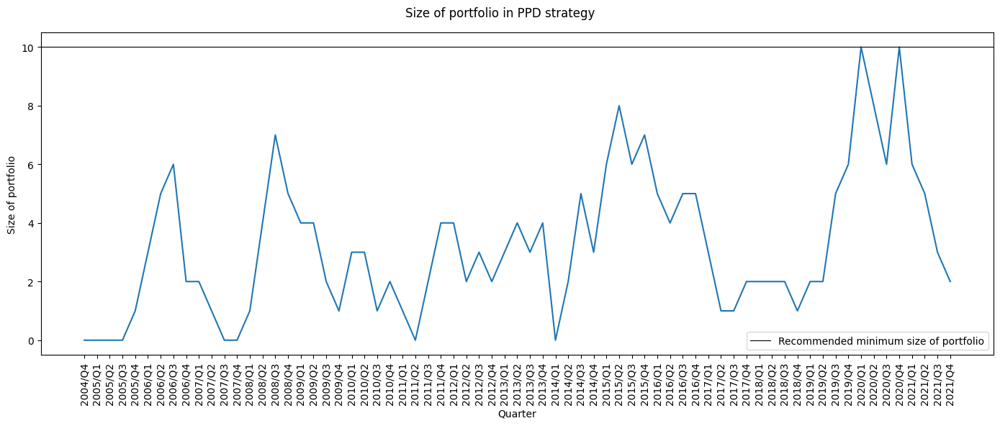

In [164]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=ppd_portfolio_df,
    legend=False,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in PPD strategy')

plt.tight_layout();

The range of price / book value ratio feature is from 0 to 13179 with mean value of 4.5, though the median is 1.26. 37% of observations met the criterion for this variable. Companies with a low ratio actually perform better than those with a price/book value ratio above 1. If possible, we should even try to lower this threshold further.

In [165]:
print('The basic statistics of price / book value ratio in PPD strategy:')
print(ppd_df.price_book_value.describe())
print('\nPrice / book value ratio in PPD strategy:')
print(pd.Series(np.where(
    ppd_df.price_book_value < 1,
    'Below 1', 'Over 1'
)).value_counts())

The basic statistics of price / book value ratio in PPD strategy:
count   13032.00
mean        4.50
std       145.55
min         0.01
25%         0.77
50%         1.26
75%         2.27
max     13178.55
Name: price_book_value, dtype: float64

Price / book value ratio in PPD strategy:
Over 1     8169
Below 1    4863
dtype: int64


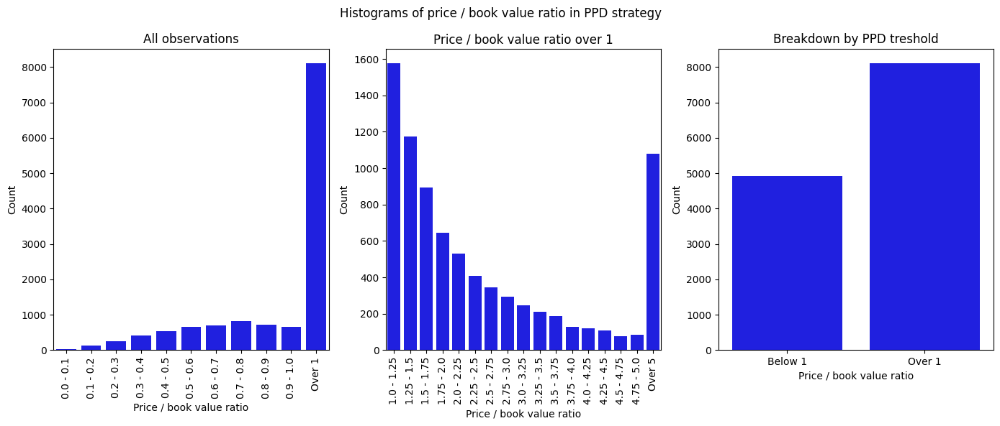

In [166]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        ppd_df.price_book_value,
        bins=list(np.arange(0, 1.1, .1)) + [1e6],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        ppd_df[ppd_df.price_book_value > 1].price_book_value,
        bins=list(np.arange(1, 5.25, .25)) + [1e6],
        labels=[f'{i} - {i+.25}' for i in np.arange(1, 5, .25)] + ['Over 5']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        ppd_df.price_book_value,
        bins=[0, 1, 1e6],
        labels=['Below 1', 'Over 1']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Price / book value ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of price / book value ratio in PPD strategy')
axs[0].set_title('All observations')
axs[1].set_title('Price / book value ratio over 1')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

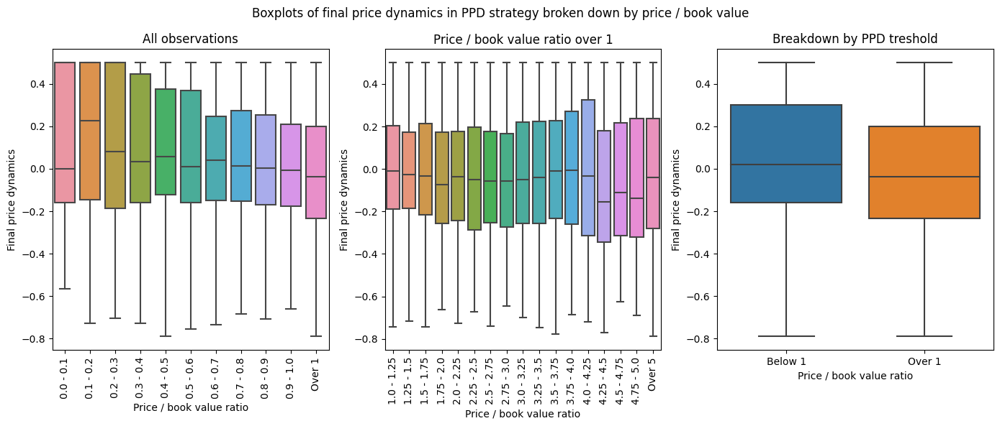

In [167]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        ppd_df.price_book_value,
        bins=list(np.arange(0, 1.1, .1)) + [1e6],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        ppd_df[ppd_df.price_book_value > 1].price_book_value,
        bins=list(np.arange(1, 5.25, .25)) + [1e6],
        labels=[f'{i} - {i+.25}' for i in np.arange(1, 5, .25)] + ['Over 5']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        ppd_df.price_book_value,
        bins=[0, 1, 1e6],
        labels=['Below 1', 'Over 1']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Price / book value ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in PPD strategy broken down by price / book value')
axs[0].set_title('All observations')
axs[1].set_title('Price / book value ratio over 1')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

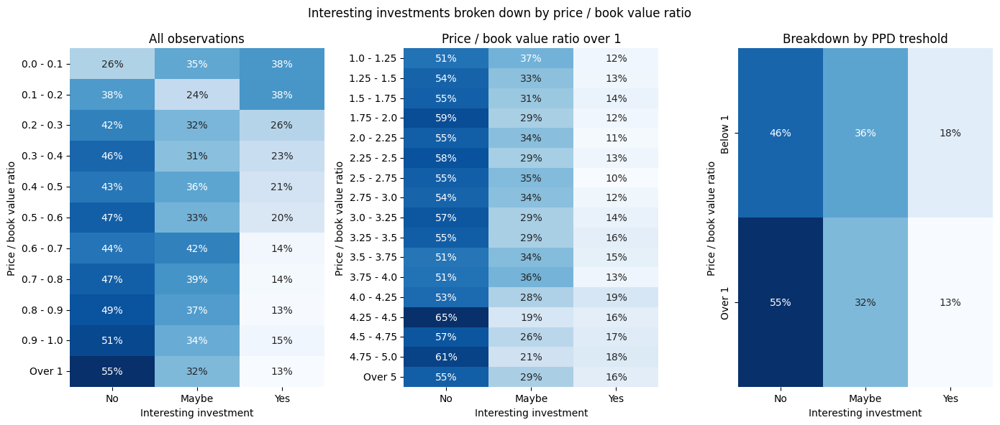

In [168]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.price_book_value,
            bins=list(np.arange(0, 1.1, .1)) + [1e6],
            labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 1, .1)] + ['Over 1']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df[ppd_df.price_book_value > 1].price_book_value,
            bins=list(np.arange(1, 5.25, .25)) + [1e6],
            labels=[f'{i} - {i+.25}' for i in np.arange(1, 5, .25)] + ['Over 5']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.price_book_value,
            bins=[0, 1, 1e6],
            labels=['Below 1', 'Over 1']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Price / book value ratio')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by price / book value ratio')
axs[0].set_title('All observations')
axs[1].set_title('Price / book value ratio over 1')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

Another criterion is the selection of companies with a low P/E ratio in a given quarter. 25% of observations are in the top 50 ranking in a given quarter. As with Zweig's strategy, it seems a more sensible idea to simply select companies by their P/E ratio (recall: the rule of thumb that is used is to choose companies with P/E ratios under 15 or even lower).

In [169]:
print('P/E ratio ranking:')
print(pd.Series(np.where(
    ppd_df.rank_price_earnings <= 50,
    'Below 50th position', 'Over 50th position'
)).value_counts())

print('\nThe basic statistics of P/E ratio in PPD strategy:')
print(ppd_df.price_earnings.describe())

P/E ratio ranking:
Over 50th position     9824
Below 50th position    3208
dtype: int64

The basic statistics of P/E ratio in PPD strategy:
count    13032.00
mean        57.77
std       1374.17
min          0.01
25%          7.95
50%         12.58
75%         21.34
max     130019.98
Name: price_earnings, dtype: float64


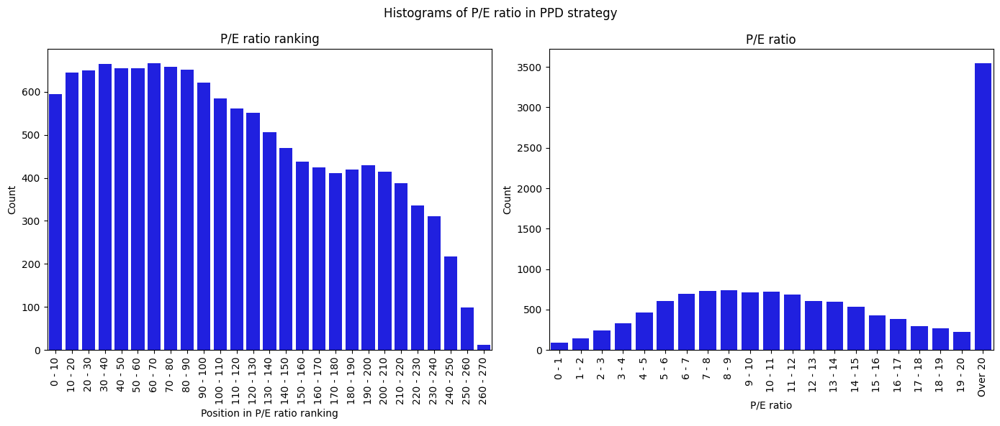

In [170]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        ppd_df.rank_price_earnings,
        bins=list(range(0, 280, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 270, 10)]
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        ppd_df.price_earnings,
        bins=list(range(21)) + [140000],
        labels=[f'{i} - {i+1}' for i in range(20)] + ['Over 20']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Count')

axs[0].set_xlabel('Position in P/E ratio ranking')
axs[1].set_xlabel('P/E ratio')

plt.suptitle('Histograms of P/E ratio in PPD strategy')
axs[0].set_title('P/E ratio ranking')
axs[1].set_title('P/E ratio')

plt.tight_layout();

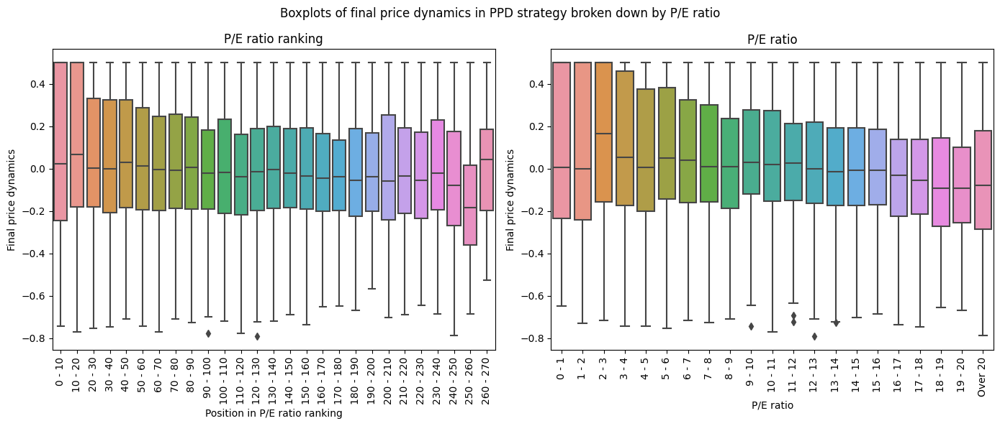

In [171]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        ppd_df.rank_price_earnings,
        bins=list(range(0, 280, 10)),
        labels=[f'{i} - {i+10}' for i in range(0, 270, 10)]
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        ppd_df.price_earnings,
        bins=list(range(21)) + [140000],
        labels=[f'{i} - {i+1}' for i in range(20)] + ['Over 20']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_ylabel('Final price dynamics')

axs[0].set_xlabel('Position in P/E ratio ranking')
axs[1].set_xlabel('P/E ratio')

plt.suptitle('Boxplots of final price dynamics in PPD strategy broken down by P/E ratio')
axs[0].set_title('P/E ratio ranking')
axs[1].set_title('P/E ratio')

plt.tight_layout();

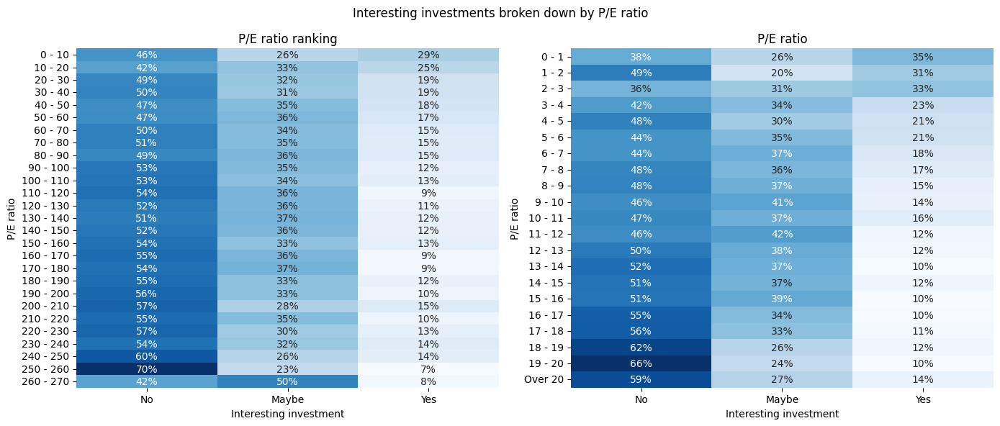

In [172]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.rank_price_earnings,
            bins=list(range(0, 280, 10)),
            labels=[f'{i} - {i+10}' for i in range(0, 270, 10)]
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.price_earnings,
            bins=list(range(21)) + [140000],
            labels=[f'{i} - {i+1}' for i in range(20)] + ['Over 20']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('P/E ratio')

plt.suptitle('Interesting investments broken down by P/E ratio')
axs[0].set_title('P/E ratio ranking')
axs[1].set_title('P/E ratio')

plt.tight_layout();

The range of ROCE feature is from -184 to 1306 with mean value of 3.48, though the median is 0.46. 76% of observations met the criterion for this variable and 12% of them were negative. The proposed threshold of 0.07 looks reasonable. Observations with values above the threshold yield better results, and there are also enough of them to ensure that the portfolio is filled.

In [173]:
print('The basic statistics of ROCE in PPD strategy:')
print(ppd_df.roce.describe())
print('\nROCE in PPD strategy:')
print(pd.Series(np.where(
    ppd_df.roce > .07,
    'Over 0.07', 'Below 0.07'
)).value_counts())

The basic statistics of ROCE in PPD strategy:
count   13032.00
mean        3.48
std        23.46
min      -184.17
25%         0.08
50%         0.46
75%         1.90
max      1305.98
Name: roce, dtype: float64

ROCE in PPD strategy:
Over 0.07     9872
Below 0.07    3160
dtype: int64


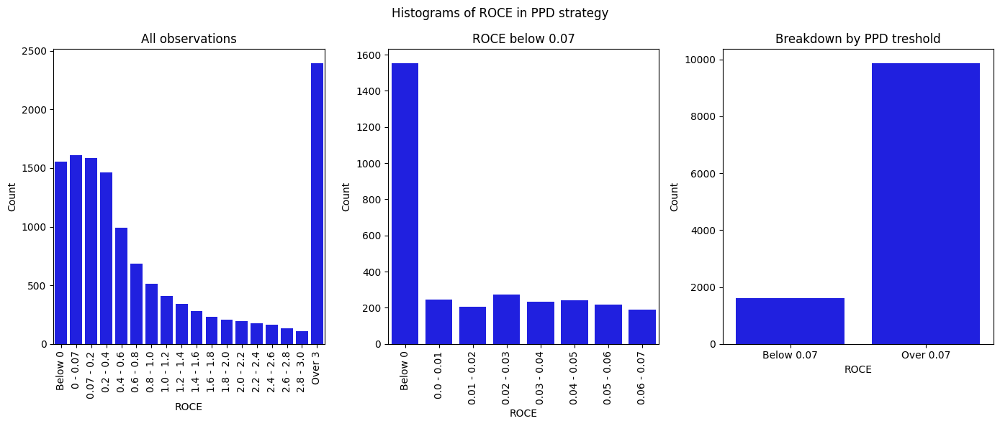

In [174]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        ppd_df.roce,
        bins=[-200, 0, .07] + list(np.arange(.2, 3.2, .2)) + [1e6],
        labels=['Below 0', '0 - 0.07', '0.07 - 0.2']
        + [f'{round(i,1)} - {round(i+.2,1)}' for i in np.arange(.2, 3, .2)] + ['Over 3']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        ppd_df[ppd_df.roce < .07].roce,
        bins=[-200] + list(np.linspace(0, .07, 8)),
        labels=['Below 0'] + [f'{round(i,2)} - {round(i+.01,2)}' for i in np.linspace(0, .06, 7)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        ppd_df.roce,
        bins=[0, .07, 1e6],
        labels=['Below 0.07', 'Over 0.07']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('ROCE')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of ROCE in PPD strategy')
axs[0].set_title('All observations')
axs[1].set_title('ROCE below 0.07')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

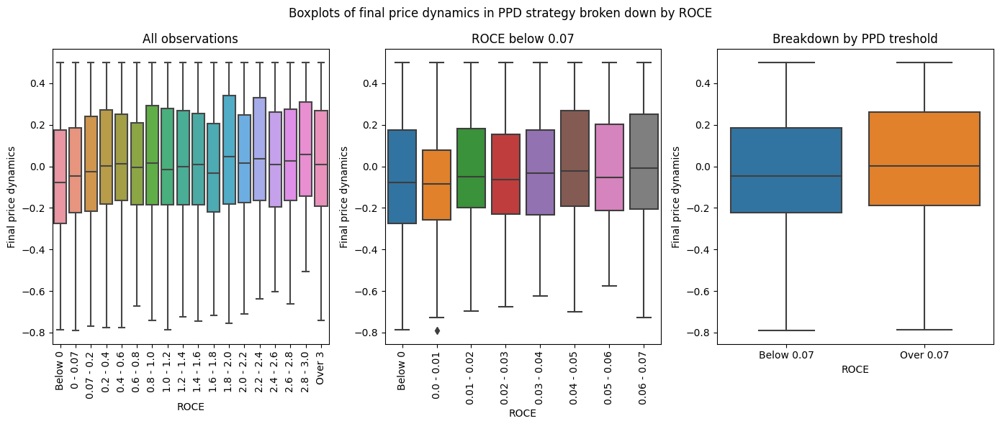

In [175]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        ppd_df.roce,
        bins=[-200, 0, .07] + list(np.arange(.2, 3.2, .2)) + [1e6],
        labels=['Below 0', '0 - 0.07', '0.07 - 0.2']
        + [f'{round(i,1)} - {round(i+.2,1)}' for i in np.arange(.2, 3, .2)] + ['Over 3']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        ppd_df[ppd_df.roce < .07].roce,
        bins=[-200] + list(np.linspace(0, .07, 8)),
        labels=['Below 0'] + [f'{round(i,2)} - {round(i+.01,2)}' for i in np.linspace(0, .06, 7)]
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        ppd_df.roce,
        bins=[0, .07, 1e6],
        labels=['Below 0.07', 'Over 0.07']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('ROCE')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in PPD strategy broken down by ROCE')
axs[0].set_title('All observations')
axs[1].set_title('ROCE below 0.07')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

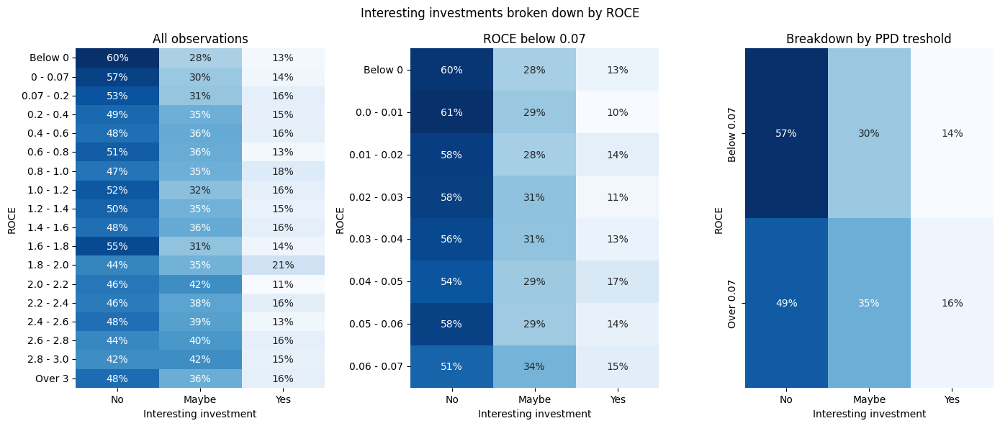

In [176]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.roce,
            bins=[-200, 0, .07] + list(np.arange(.2, 3.2, .2)) + [1e6],
            labels=['Below 0', '0 - 0.07', '0.07 - 0.2']
            + [f'{round(i,1)} - {round(i+.2,1)}' for i in np.arange(.2, 3, .2)] + ['Over 3']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df[ppd_df.roce < .07].roce,
            bins=[-200] + list(np.linspace(0, .07, 8)),
            labels=['Below 0']
            + [f'{round(i,2)} - {round(i+.01,2)}' for i in np.linspace(0, .06, 7)]
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.roce,
            bins=[0, .07, 1e6],
            labels=['Below 0.07', 'Over 0.07']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('ROCE')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by ROCE')
axs[0].set_title('All observations')
axs[1].set_title('ROCE below 0.07')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

The range of net debt / EBIT feature is from -44 million to 48 million with mean value of 21893, though the median is 13512. 21% of observations met the criterion for this variable. The charts below show that it is nevertheless companies with net debt / EBIT higher than 0 that are doing better. However, we can look for a different range, e.g. from - 20000 to 20000, in which the majority of interesting companies are located.

In [177]:
print('The basic statistics of net debt / EBIT in PPD strategy:')
print(ppd_df.net_debt_ebit.describe())
print('\nNet debt / EBIT in PPD strategy:')
print(pd.Series(np.where(
    ppd_df.net_debt_ebit < 0,
    'Below 0', 'Over 0'
)).value_counts())

The basic statistics of net debt / EBIT in PPD strategy:
count       13032.00
mean        21893.28
std        696770.57
min     -43922000.00
25%          1937.90
50%         13512.34
75%         32540.06
max      47654500.00
Name: net_debt_ebit, dtype: float64

Net debt / EBIT in PPD strategy:
Over 0     10325
Below 0     2707
dtype: int64


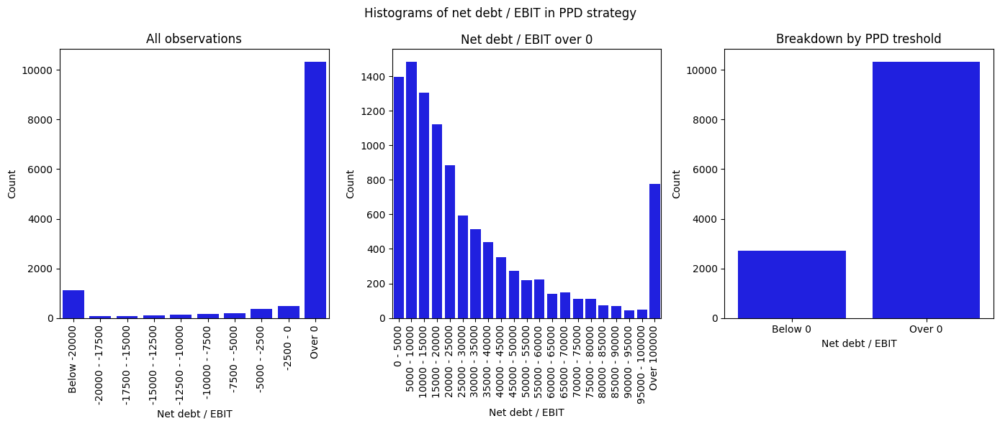

In [178]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        ppd_df.net_debt_ebit,
        bins=[-5e7] + list(range(-20000, 2500, 2500)) + [5e7],
        labels=['Below -20000'] + [f'{i} - {i+2500}' for i in range(-20000, 0, 2500)] + ['Over 0']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        ppd_df[ppd_df.net_debt_ebit > 0].net_debt_ebit,
        bins=list(range(0, 105000, 5000)) + [5e7],
        labels=[f'{i} - {i+5000}' for i in range(0, 100000, 5000)] + ['Over 100000']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        ppd_df.net_debt_ebit,
        bins=[-5e7, 0, 5e7],
        labels=['Below 0', 'Over 0']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net debt / EBIT')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of net debt / EBIT in PPD strategy')
axs[0].set_title('All observations')
axs[1].set_title('Net debt / EBIT over 0')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

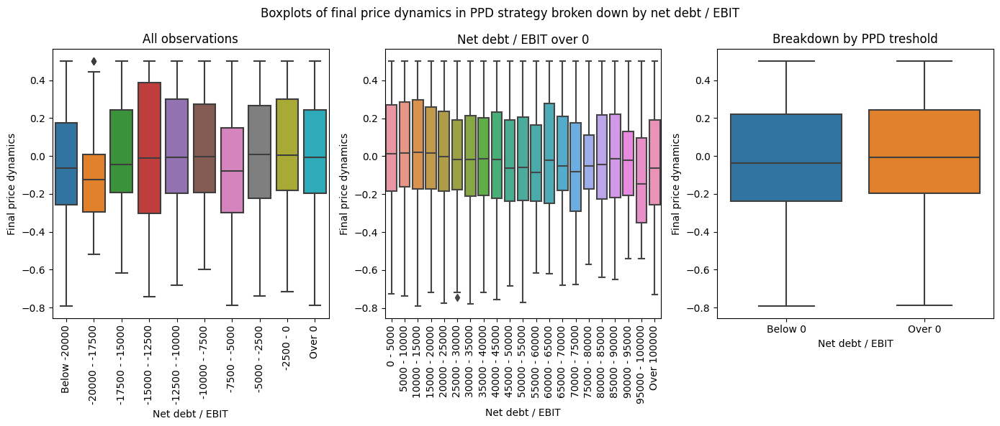

In [179]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        ppd_df.net_debt_ebit,
        bins=[-5e7] + list(range(-20000, 2500, 2500)) + [5e7],
        labels=['Below -20000'] + [f'{i} - {i+2500}' for i in range(-20000, 0, 2500)] + ['Over 0']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        ppd_df[ppd_df.net_debt_ebit > 0].net_debt_ebit,
        bins=list(range(0, 105000, 5000)) + [5e7],
        labels=[f'{i} - {i+5000}' for i in range(0, 100000, 5000)] + ['Over 100000']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        ppd_df.net_debt_ebit,
        bins=[-5e7, 0, 5e7],
        labels=['Below 0', 'Over 0']
    ),
    y=ppd_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Net debt / EBIT')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in PPD strategy broken down by net debt / EBIT')
axs[0].set_title('All observations')
axs[1].set_title('Net debt / EBIT over 0')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

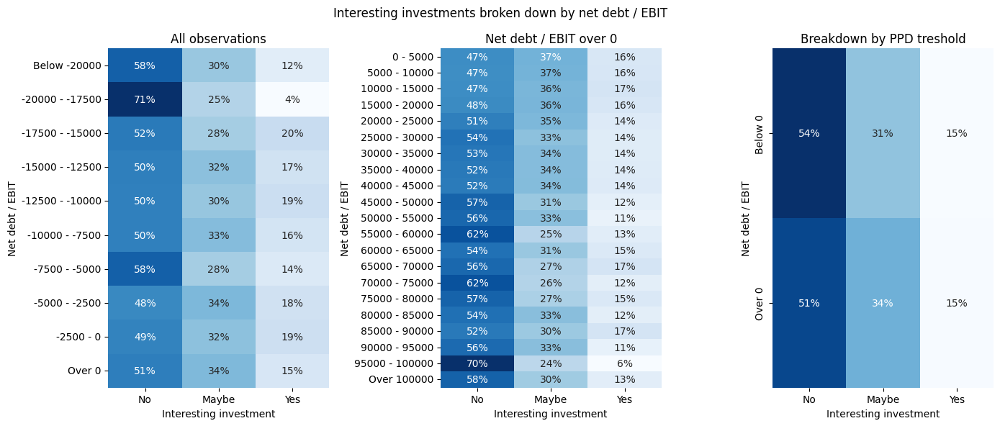

In [180]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.net_debt_ebit,
            bins=[-5e7] + list(range(-20000, 2500, 2500)) + [5e7],
            labels=['Below -20000']
            + [f'{i} - {i+2500}' for i in range(-20000, 0, 2500)] + ['Over 0']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df[ppd_df.net_debt_ebit > 0].net_debt_ebit,
            bins=list(range(0, 105000, 5000)) + [5e7],
            labels=[f'{i} - {i+5000}' for i in range(0, 100000, 5000)] + ['Over 100000']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            ppd_df.net_debt_ebit,
            bins=[-5e7, 0, 5e7],
            labels=['Below 0', 'Over 0']
        ),
        ppd_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Net debt / EBIT')
axs[i].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by net debt / EBIT')
axs[0].set_title('All observations')
axs[1].set_title('Net debt / EBIT over 0')
axs[2].set_title('Breakdown by PPD treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed in PPD strategy, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. The best results are provided by choosing companies, which have price / book value ratio below 1, P/E ratio below 13, ROCE over 0.07, as well as net debt / EBIT between -15000 and 15000.

In [181]:
ppd_mod_df = {
    'Price / book value ratio below:':[],
    'P/E ratio below:':[],
    'Net debt / EBIT between:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.arange(.1, 1.1, .1): # Price / book value ratio
    for mod_2 in range(1, 16): # P/E ratio
        for mod_3 in range(-20000, 5000, 5000): # Net debt / EBIT (over)
            for mod_4 in range(0, 25000, 5000): # Net debt / EBIT (below)
                ppd_df['mod_buy'] = np.where(
                    (ppd_df.price_book_value < mod_1) &
                    (ppd_df.price_earnings < mod_2) &
                    (ppd_df.roce > .07) &
                    (ppd_df.net_debt_ebit > mod_3) &
                    (ppd_df.net_debt_ebit < mod_4),
                    'Yes', 'No'
                )

                if ppd_df[ppd_df.mod_buy == 'Yes'].shape[0] > 0:
                    # Return on Modified PPD strategy
                    ppd_return_df['Modified PPD strategy'] = ppd_df[
                        ppd_df.mod_buy == 'Yes'
                    ].groupby('quarter').final_price_dynamics.mean()
                    avg_strategy_return = (
                        100 * ppd_return_df['Modified PPD strategy'].mean()
                    ).round(2)

                    # If positive
                    if avg_strategy_return > 0:

                        # Size of portfolio in Modified PPD strategy
                        ppd_portfolio_df['buy_in_q'] = pd.Series(
                            ppd_df[
                                ppd_df.mod_buy == 'Yes'
                            ].groupby('quarter').quarter.count().reindex(
                                sorted(dataset.quarter.unique())).fillna(0)
                        )
                        ppd_portfolio_df['sell_in_q'] = pd.Series(
                            ppd_df[
                                ppd_df.mod_buy == 'Yes'
                            ].groupby('sell_in_q').sell_in_q.count().reindex(
                                sorted(dataset.quarter.unique())).fillna(0)
                        )

                        ppd_portfolio_df['Modified PPD strategy'] = (
                            ppd_portfolio_df.buy_in_q - ppd_portfolio_df.sell_in_q
                        ).cumsum()
                        ppd_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                        quarters_with_good_portfolio_size = ppd_portfolio_df[
                            ppd_portfolio_df['Modified PPD strategy'] >= 10
                        ]['Modified PPD strategy'].count()

                        # If number of quarters with good portfolio size > 55 (80% of all quarters)
                        if quarters_with_good_portfolio_size > 55:

                            # Profitable quarters
                            quarters_profit_strat = ppd_return_df[
                                ppd_return_df['Modified PPD strategy'] > 0
                            ]['Modified PPD strategy'].count()

                            # Strategy > zero effort strategy
                            quarters_perform_strat = ppd_return_df[
                                ppd_return_df[
                                    'Modified PPD strategy'] > ppd_return_df['Zero effort strategy']
                            ]['Modified PPD strategy'].count()

                            ppd_mod_df['Price / book value ratio below:'].append(mod_1)
                            ppd_mod_df['P/E ratio below:'].append(mod_2)
                            ppd_mod_df['Net debt / EBIT between:'].append(f'{mod_3} - {mod_4}')
                            ppd_mod_df['Average return (%)'].append(avg_strategy_return)
                            ppd_mod_df[
                                'Number of quarters with portfolio size over 10'
                            ].append(quarters_with_good_portfolio_size)
                            ppd_mod_df[
                                'Number of profitable quarters'].append(quarters_profit_strat)
                            ppd_mod_df[
                                'Number of quarters in which strategy '\
                                'outperformed zero effort strategy'
                            ].append(quarters_perform_strat)

                            # Number of signals
                            signals = ppd_df.mod_buy.value_counts()[1]

                            # Crosstab
                            ctab = pd.crosstab(
                                ppd_df.interesting_investment,
                                ppd_df.mod_buy,
                                rownames=['Interesting investment:'],
                                colnames=['Buy signal from modified PPD strategy:']
                            ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                            # % of interesting_investment == Maybe or Yes
                            ppd_mod_df[
                                'Percentage of profitable investments'
                            ].append(round(100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals))
                            # % of interesting_investment == No
                            ppd_mod_df[
                                'Percentage of loss-making investments'
                            ].append(round(100 * ctab.iloc[0, 1] / signals))

ppd_mod_df = pd.DataFrame(ppd_mod_df)

print('Data frame with best modifications of PPD strategy:')
ppd_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of PPD strategy:


,Price / book value ratio below:,P/E ratio below:,Net debt / EBIT between:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
4,1.00,13,-15000 - 15000,12.21,56,45,38,65,35
2,1.00,13,-20000 - 15000,12.16,56,45,38,65,35
9,1.00,14,-15000 - 15000,11.85,56,46,40,65,35
1,1.00,12,-15000 - 20000,11.84,56,46,39,65,35
7,1.00,14,-20000 - 15000,11.81,56,46,40,65,35
11,1.00,14,-10000 - 15000,11.57,56,46,39,65,35
6,1.00,13,-10000 - 20000,11.21,56,47,37,65,35
13,1.00,14,-5000 - 20000,11.02,56,46,38,65,35
12,1.00,14,-10000 - 20000,10.90,56,47,38,65,35
20,1.00,15,-5000 - 20000,10.83,56,43,38,65,35


The modified PPD strategy classified 951 observations as worth buying (87 in original strategy), with 336 (35%) of them making a loss and 231 (24%) of them making a profit over 50%. These proportions are worse than in the original strategy, but remember that it had more than ten times fewer buy signals.

In [182]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
ppd_df['mod_buy'] = np.where(
    (ppd_df.price_book_value < 1) &
    (ppd_df.price_earnings < 13) &
    (ppd_df.roce > .07) &
    (ppd_df.net_debt_ebit > -15000) &
    (ppd_df.net_debt_ebit < 15000),
    'Yes', 'No'
)

print(f'\nNumber of buy signals from modified PPD strategy: {ppd_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified PPD strategy: 951


In [183]:
pd.crosstab(
    ppd_df.interesting_investment,
    ppd_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified PPD strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified PPD strategy:,No,Yes
Interesting investment:,,
No,6376,336
Maybe,3979,384
Yes,1726,231


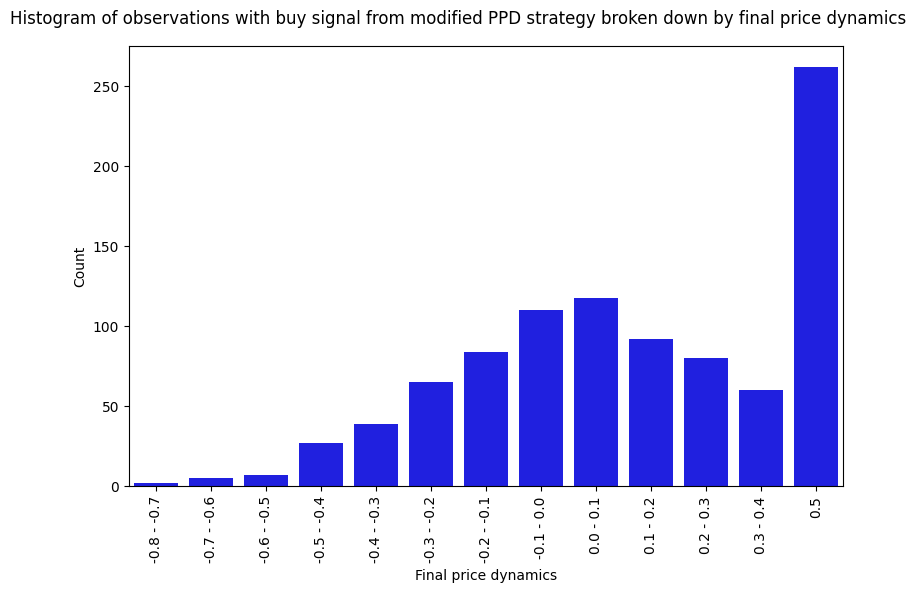

In [184]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        ppd_df[ppd_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified PPD '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified PPD strategy was profitable in 45 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 38 of analyzed periods. Moreover, the modified strategy brought the average profit of 12.21%. Again, this is slightly lower than the original strategy (14.12%), however, the modification has ensured that the portfolio is adequately filled and has had more profitable quarters.

In [185]:
ppd_return_df['Modified PPD strategy'] = ppd_df[
        ppd_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

ppd_portfolio_df['buy_in_q'] = pd.Series(
    ppd_df[
        ppd_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
ppd_portfolio_df['sell_in_q'] = pd.Series(
    ppd_df[
        ppd_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
ppd_portfolio_df['Modified PPD strategy'] = (
    ppd_portfolio_df.buy_in_q - ppd_portfolio_df.sell_in_q
).cumsum()
ppd_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(ppd_return_df, ppd_portfolio_df, 'Modified PPD strategy')

Number of quarters with buy signal from Modified PPD strategy: 61
Number of quarters with sufficient portfolio size: 56
Number of profitable quarters using Modified PPD strategy: 45
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified PPD strategy outperformed zero effort strategy: 38
Average return on Modified PPD strategy: 12.21%
Average return on zero effort strategy: 5.6%


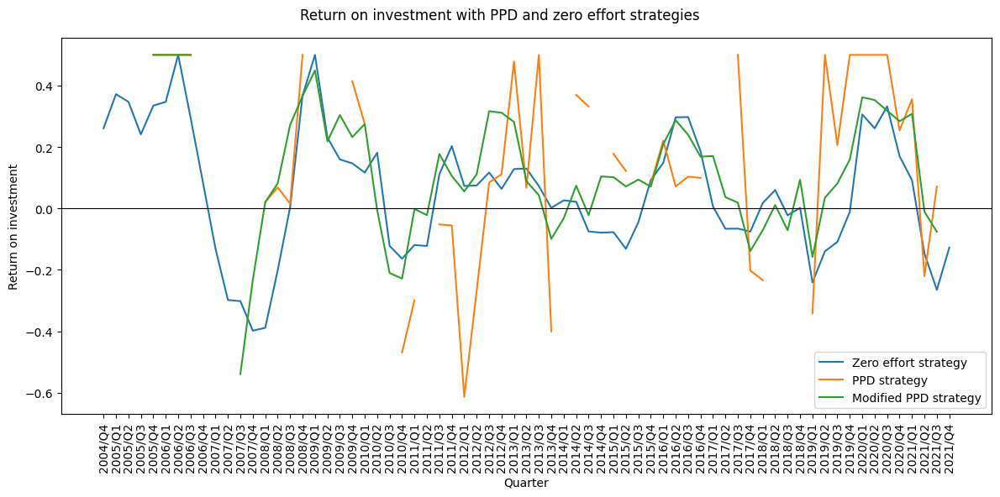

In [186]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    ppd_return_df.index,
    ppd_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'PPD strategy', 'Modified PPD strategy'])

plt.suptitle('Return on investment with PPD and zero effort strategies')

plt.tight_layout();

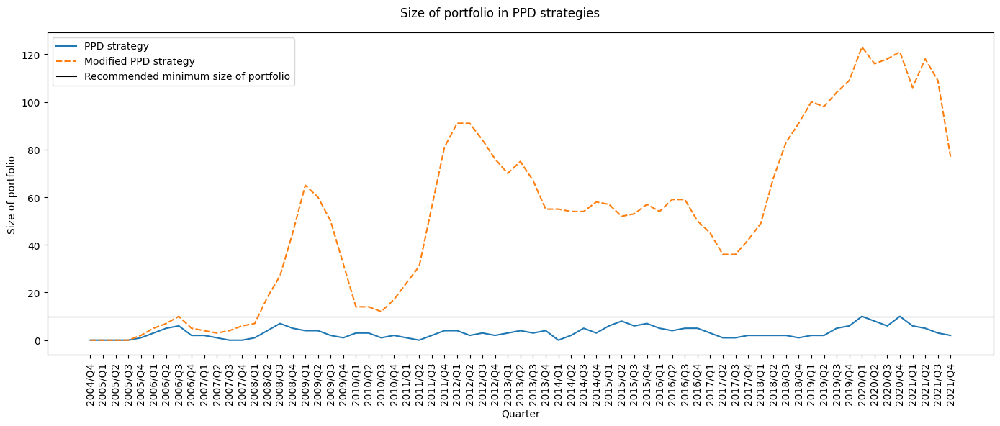

In [187]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=ppd_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(ppd_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in PPD strategies')

plt.tight_layout();

# Benjamin Graham's defensive strategy

This strategy assumes, that we invest only in companies which:
- have sales revenues from the last year greater than USD 100 million;
- have current assets to short term liabilities ratio greater or equal to 2;
- have long term liabilities to net working capital ratio lower or equal to 1;
- their share prices have risen continuously over the past 10 years;
- have paid dividends continuously for the last 20 years;
- have sum of earnings per share from the last 10 years to current earnings per share lower or equal to 3;
- have price to average earnings per share from the last 10 years ratio lower or equal to 15;
- have price to Graham's book value ratio lower or equal to 1.5 (compared to regular book value, Graham only took into account current assets);
- have P/E ratio lower or equal to 15.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **sales_revenues_1Y_usd**: sales revenues from the last four quarters in USD, should be over 100 million;
- **current_assets_short_term_liabilities**: current assets to short term liabilities ratio, should be over 2;
- **long_term_liabilities_net_working_capital**: long term liabilities to net working capital ratio, should be below 1;
- **continuous_price_growth**: number of quarters with continuous price growth, should be over 40;
- **continuous_dividend**: number of quarters with continuously paid dividend (i.e. if in a given year the dividend was paid, the company gets 4 points to that index), should be over 80;
- **sum_earnings_price_10Y_price_earnings**: sum of earnings per share from the last 10 years to current earnings per share ratio, should be below 3;
- **price_avg_earnings_share_10Y**: price to average earnings per share from the last 10 years ratio, should be below 15;
- **price_graham_book_value**: price to Graham's book value ratio, should be below 1.5;
- **price_earnings**: P/E ratio, should be below 15;
- **buy**: signal from Graham's defensive strategy, *Yes* if company should be bought, *No* otherwise.

In [188]:
# Filter data
graham_def_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'sales_revenues_1Y_usd', 'current_assets_short_term_liabilities',
    'long_term_liabilities_net_working_capital', 'continuous_price_growth',
    'continuous_dividend', 'sum_earnings_share_10Y_earnings_per_share',
    'sum_earnings_share_9Y_earnings_per_share', 'sum_earnings_share_8Y_earnings_per_share',
    'sum_earnings_share_7Y_earnings_per_share', 'sum_earnings_share_6Y_earnings_per_share',
    'sum_earnings_share_5Y_earnings_per_share', 'sum_earnings_share_4Y_earnings_per_share',
    'sum_earnings_share_3Y_earnings_per_share', 'sum_earnings_share_2Y_earnings_per_share',
    'sum_earnings_share_1Y_earnings_per_share', 'price_avg_earnings_share_10Y',
    'price_avg_earnings_share_9Y', 'price_avg_earnings_share_8Y',
    'price_avg_earnings_share_7Y', 'price_avg_earnings_share_6Y',
    'price_avg_earnings_share_5Y', 'price_avg_earnings_share_4Y',
    'price_avg_earnings_share_3Y', 'price_avg_earnings_share_2Y',
    'price_avg_earnings_share_1Y', 'price_graham_book_value', 'price_earnings'
])

# Add column 'buy' for observations, which meet strategy conditions
graham_def_df['buy'] = np.where(
    (graham_def_df.sales_revenues_1Y_usd > 1e8) &
    (graham_def_df.current_assets_short_term_liabilities >= 2) &
    (graham_def_df.long_term_liabilities_net_working_capital <= 1) &
    (graham_def_df.continuous_price_growth >= 40) &
    (graham_def_df.continuous_dividend >= 80) &
    (graham_def_df.sum_earnings_share_10Y_earnings_per_share <= 3) &
    (graham_def_df.price_avg_earnings_share_10Y <= 15) &
    (graham_def_df.price_graham_book_value <= 1.5) &
    (graham_def_df.price_earnings <= 15),
    'Yes', 'No'
)

graham_def_df['sell_in_q'] = np.where(
    graham_def_df.buy == 'Yes',
    graham_def_df.best_price_dynamics_in_q,
    graham_def_df.price_dynamics_y_in_q
)

graham_def_df = graham_def_df.dropna(subset=[
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'sales_revenues_1Y_usd', 'current_assets_short_term_liabilities',
    'long_term_liabilities_net_working_capital', 'continuous_price_growth',
    'continuous_dividend', 'sum_earnings_share_1Y_earnings_per_share',
    'price_avg_earnings_share_1Y', 'price_graham_book_value', 'price_earnings'
])

Graham's strategy was developed on the basis of decades-long observations of the NYSE. The WSE, on the other hand, has been in existence for just over 30 years, while the dataset analysed covers 17 years. Consequently, the analysis of only companies that may have existed on the stock market for more than 10 or 20 years is too restrictive.

The analyzed subset contains only 5563 observations (30% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 2284 **interesting_investment** observations (3010 in original set vs 726 in subset). However, the Graham's defensive strategy did not classify any observations as worth buying. We therefore turn to an analysis of the individual criteria.

In [189]:
print('The basic statistics of final price dynamics in Graham\'s defensive strategy:')
print(graham_def_df.final_price_dynamics.describe())
print('\nInteresting companies in Graham\'s defensive strategy:')
print(graham_def_df.interesting_investment.value_counts())
print('\nNumber of buy signals from Graham\'s defensive strategy: '\
    f'{len(graham_def_df) - graham_def_df.buy.value_counts()[0]}')

The basic statistics of final price dynamics in Graham's defensive strategy:
count   5563.00
mean       0.02
std        0.30
min       -0.78
25%       -0.19
50%       -0.01
75%        0.22
max        0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Graham's defensive strategy:
No       2805
Maybe    2032
Yes       726
Name: interesting_investment, dtype: int64

Number of buy signals from Graham's defensive strategy: 0


The range of sales revenues from the last year feature is from -223 to to almost 40 million with mean value of 359710, though the median is 88566. No observations met the criterion for this variable and two observations have negative value.

As we can see, not a single observation even came close to the threshold and, moreover, most of them had sales revenues below USD 1 million. Values between USD 0.8 million - USD 1 million appear to have a better performance, however, this is not confirmed for higher values. Due to the small number of observations available to fill the portfolio, we can discard at most the negative observations.

In [190]:
print('The basic statistics of sales revenues from the last year in Graham\'s defensive strategy:')
print(graham_def_df.sales_revenues_1Y_usd.describe())
print('\nSales revenues from the last year in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.sales_revenues_1Y_usd > 1e8,
    'Over USD 100 million', 'Below USD 100 million'
)).value_counts())

The basic statistics of sales revenues from the last year in Graham's defensive strategy:
count       5563.00
mean      359710.38
std      1759437.76
min         -223.50
25%        31937.54
50%        88565.77
75%       254471.73
max     38984143.43
Name: sales_revenues_1Y_usd, dtype: float64

Sales revenues from the last year in Graham's defensive strategy:
Below USD 100 million    5563
dtype: int64


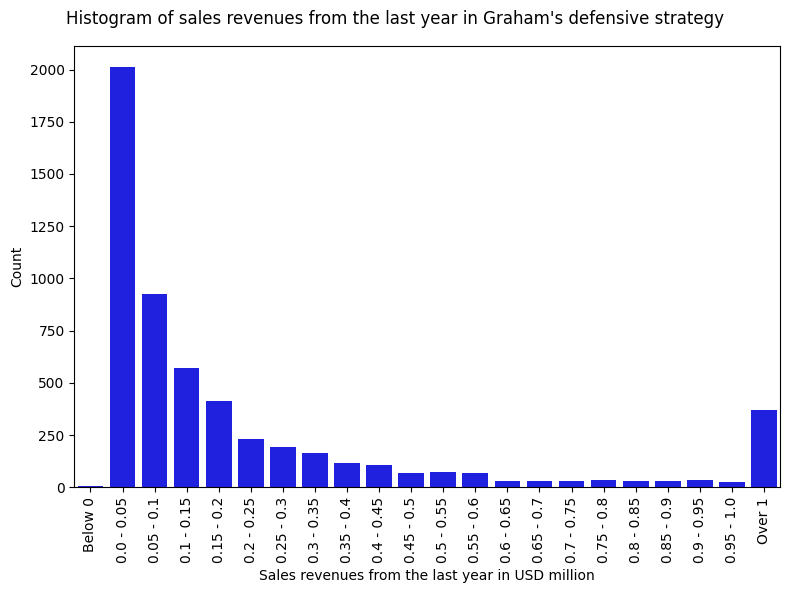

In [191]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.sales_revenues_1Y_usd,
        bins=[-300] + list(np.arange(0, 1050000, 50000)) + [1e8],
        labels=['Below 0']
        + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(0, 1, .05)] + ['Over 1']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Sales revenues from the last year in USD million')
ax.set_ylabel('Count')

plt.suptitle('Histogram of sales revenues from the last year in Graham\'s defensive strategy')

plt.tight_layout();

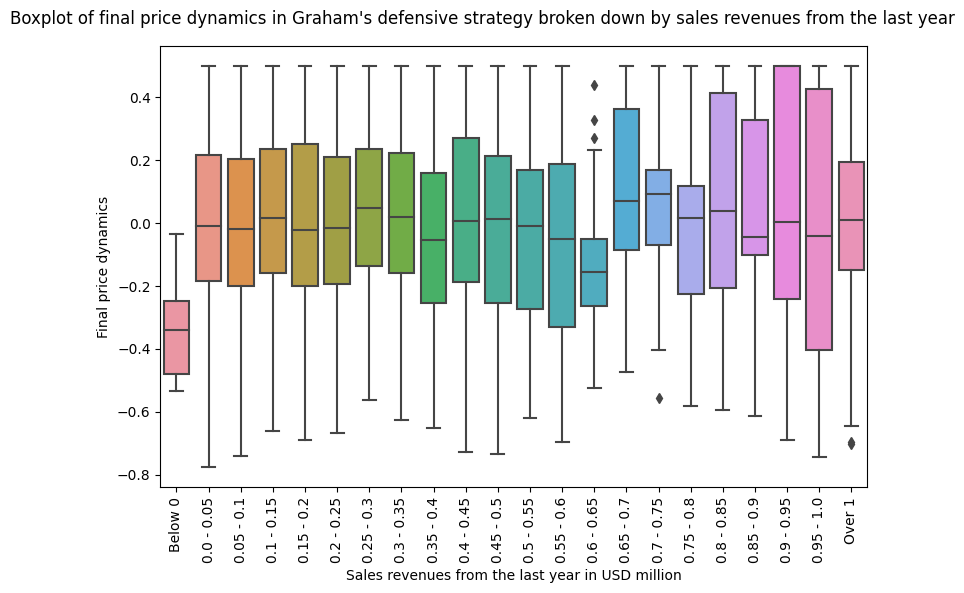

In [192]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.sales_revenues_1Y_usd,
        bins=[-300] + list(np.arange(0, 1050000, 50000)) + [1e8],
        labels=['Below 0']
        + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(0, 1, .05)] + ['Over 1']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Sales revenues from the last year in USD million')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s defensive '\
    'strategy broken down by sales revenues from the last year')

plt.tight_layout();

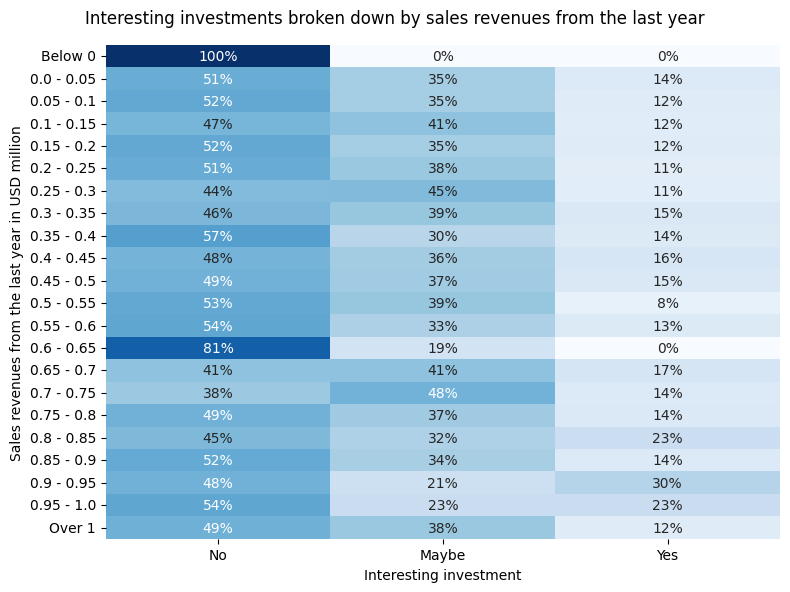

In [193]:
fig, ax = plt.subplots(figsize=(8, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.sales_revenues_1Y_usd,
            bins=[-300] + list(np.arange(0, 1050000, 50000)) + [1e8],
            labels=['Below 0']
            + [f'{round(i,2)} - {round(i+.05,2)}' for i in np.arange(0, 1, .05)] + ['Over 1']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.tick_params(axis='y', labelrotation=0)
ax.set_xlabel('Interesting investment')
ax.set_ylabel('Sales revenues from the last year in USD million')

plt.suptitle('Interesting investments broken down by sales revenues from the last year')

plt.tight_layout();

The range of current assets to short term liabilities ratio feature is from 1.02 to to almost 221 with mean value of 2.98, though the median is 1.98. 49% of observations met the criterion for this variable. Observations with a value of this indicator below 2 actually perform slightly better, nevertheless not better enough to set a different threshold for this variable. Final price dynamics performs similarly for most ranges of this feature, so we can omit it from further analysis.

In [194]:
print('The basic statistics of current assets to '\
    'short term liabilities ratio in Graham\'s defensive strategy:')
print(graham_def_df.current_assets_short_term_liabilities.describe())
print('\nCurrent assets to short term liabilities '\
    'ratio from the last year in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.current_assets_short_term_liabilities >= 2,
    'Over 2', 'Below 2'
)).value_counts())

The basic statistics of current assets to short term liabilities ratio in Graham's defensive strategy:
count   5563.00
mean       2.98
std        5.27
min        1.02
25%        1.49
50%        1.98
75%        2.97
max      220.68
Name: current_assets_short_term_liabilities, dtype: float64

Current assets to short term liabilities ratio from the last year in Graham's defensive strategy:
Below 2    2846
Over 2     2717
dtype: int64


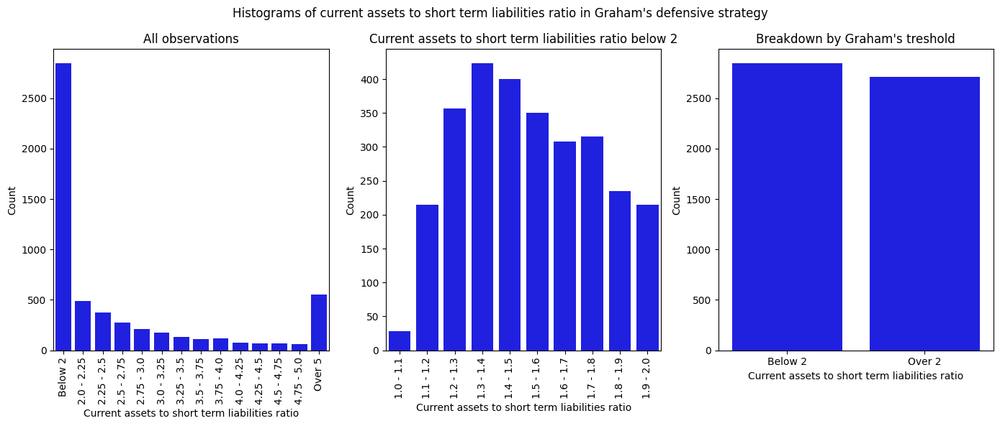

In [195]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.current_assets_short_term_liabilities,
        bins=[1] + list(np.arange(2, 5.25, .25)) + [150],
        labels=['Below 2']
        + [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(2, 5, .25)] + ['Over 5']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_def_df[
            graham_def_df.current_assets_short_term_liabilities < 2
        ].current_assets_short_term_liabilities,
        bins=list(np.arange(1, 2.1, .1)),
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 2, .1)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.current_assets_short_term_liabilities,
        bins=[0, 2, 150],
        labels=['Below 2', 'Over 2']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Current assets to short term liabilities ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of current assets to short term liabilities '\
    'ratio in Graham\'s defensive strategy')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 2')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

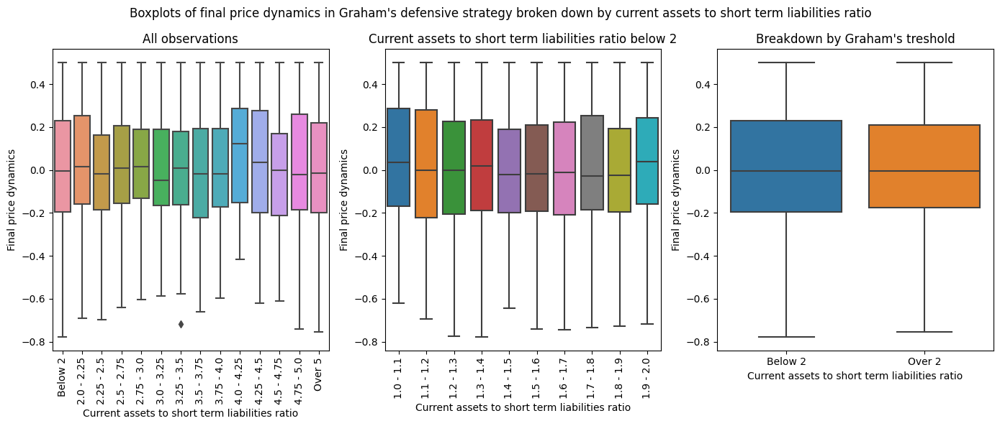

In [196]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.current_assets_short_term_liabilities,
        bins=[1] + list(np.arange(2, 5.25, .25)) + [150],
        labels=['Below 2']
        + [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(2, 5, .25)] + ['Over 5']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df[
            graham_def_df.current_assets_short_term_liabilities < 2
        ].current_assets_short_term_liabilities,
        bins=list(np.arange(1, 2.1, .1)),
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 2, .1)]
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.current_assets_short_term_liabilities,
        bins=[0, 2, 150],
        labels=['Below 2', 'Over 2']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Current assets to short term liabilities ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Graham\'s defensive '\
    'strategy broken down by current assets to short term liabilities ratio')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 2')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

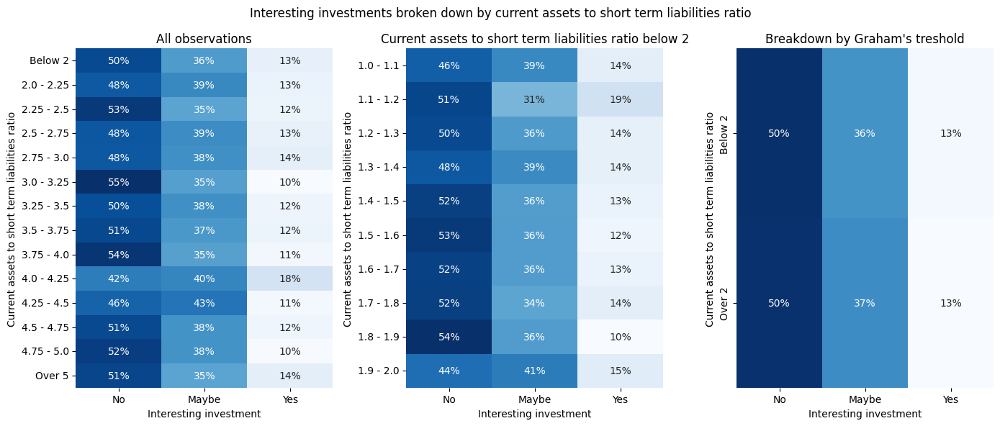

In [197]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.current_assets_short_term_liabilities,
            bins=[1] + list(np.arange(2, 5.25, .25)) + [150],
            labels=['Below 2']
            + [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(2, 5, .25)] + ['Over 5']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df[
                graham_def_df.current_assets_short_term_liabilities < 2
            ].current_assets_short_term_liabilities,
            bins=list(np.arange(1, 2.1, .1)),
            labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 2, .1)]
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.current_assets_short_term_liabilities,
            bins=[0, 2, 150],
            labels=['Below 2', 'Over 2']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Current assets to short term liabilities ratio')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by current '\
    'assets to short term liabilities ratio')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 2')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

The range of long term liabilities to net working capital ratio feature is from -8.48 to to 0.12 with mean value of -0.0012, though the median is 0.00029. All of the observations met the criterion for this variable. It turns out that most of the observations ranged from 0 to 0.001, so definitely below the threshold. We can observe that the performance of the investments decreases significantly for values above 0.0009 - so we can try to lower the threshold for this variable.

In [198]:
print('The basic statistics of long term liabilities to net '\
    'working capital ratio in Graham\'s defensive strategy:')
print(graham_def_df.long_term_liabilities_net_working_capital.describe())
print('\nLong term liabilities to net working capital ratio '\
    'from the last year in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.long_term_liabilities_net_working_capital <= 1,
    'Below 1', 'Over 1'
)).value_counts())

The basic statistics of long term liabilities to net working capital ratio in Graham's defensive strategy:
count   5563.00
mean      -0.00
std        0.11
min       -8.48
25%        0.00
50%        0.00
75%        0.00
max        0.12
Name: long_term_liabilities_net_working_capital, dtype: float64

Long term liabilities to net working capital ratio from the last year in Graham's defensive strategy:
Below 1    5563
dtype: int64


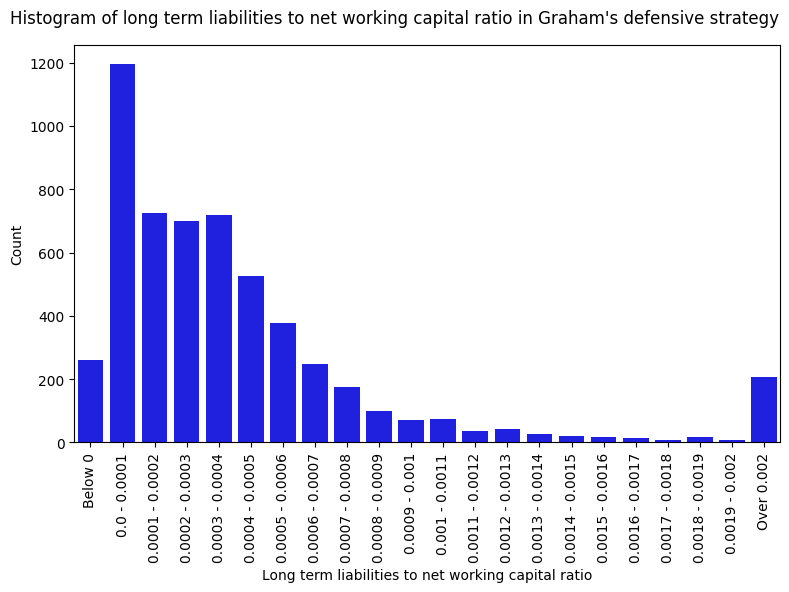

In [201]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.long_term_liabilities_net_working_capital,
        bins=[-10] + list(np.arange(0, .0021, .0001)) + [.1],
        labels=['Below 0']
        + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)] + ['Over 0.002']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Long term liabilities to net working capital ratio')
ax.set_ylabel('Count')

plt.suptitle('Histogram of long term liabilities to net working '\
    'capital ratio in Graham\'s defensive strategy')

plt.tight_layout();

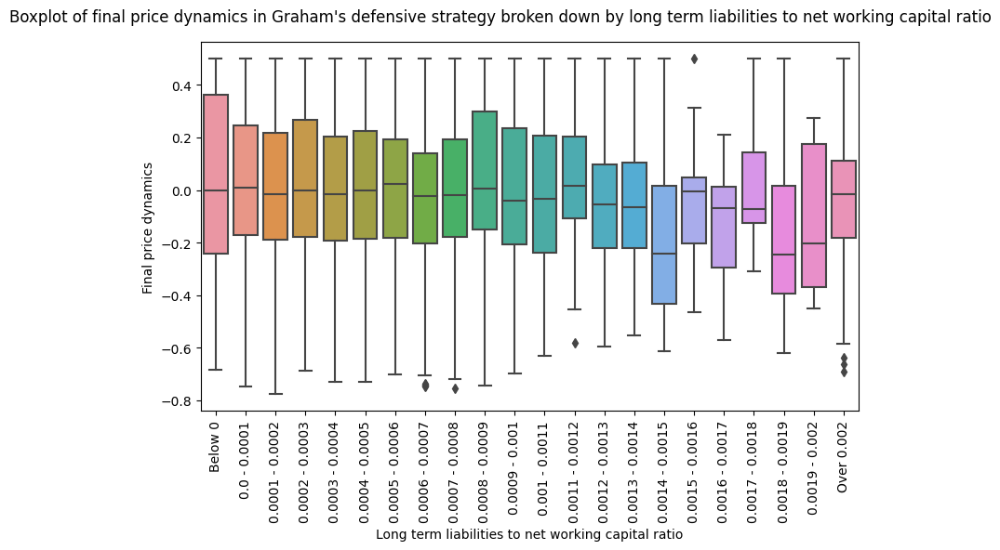

In [202]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.long_term_liabilities_net_working_capital,
        bins=[-10] + list(np.arange(0, .0021, .0001)) + [.1],
        labels=['Below 0']
        + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)] + ['Over 0.002']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Long term liabilities to net working capital ratio')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s defensive strategy '\
    'broken down by long term liabilities to net working capital ratio')

plt.tight_layout();

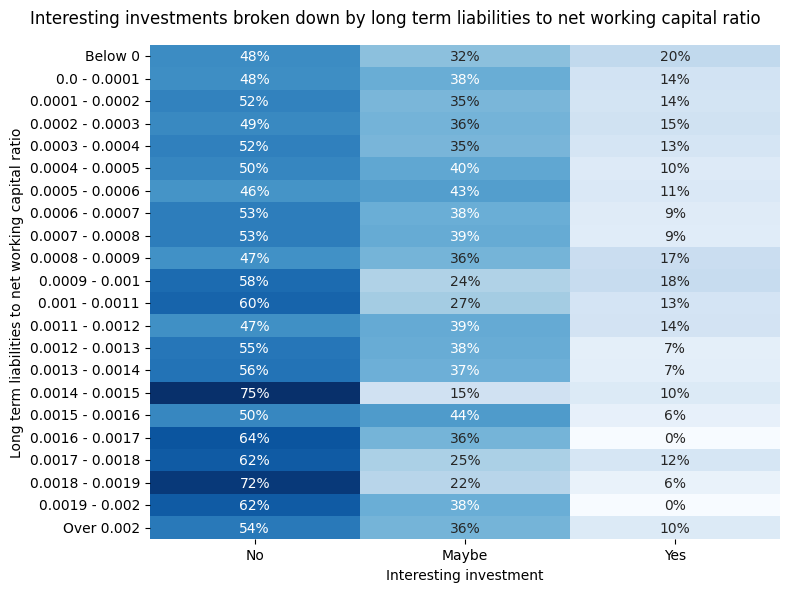

In [203]:
fig, ax = plt.subplots(figsize=(8, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.long_term_liabilities_net_working_capital,
            bins=[-10] + list(np.arange(0, .0021, .0001)) + [.1],
            labels=['Below 0']
            + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)]
            + ['Over 0.002']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.tick_params(axis='y', labelrotation=0)
ax.set_xlabel('Interesting investment')
ax.set_ylabel('Long term liabilities to net working capital ratio')

plt.suptitle('Interesting investments broken down by long '\
    'term liabilities to net working capital ratio')

plt.tight_layout();

Another variable determines the number of quarters with a continuously increasing share price. None of the observations exceeded the threshold of 40 quarters, the longest period of continuous growth is 12 quarters, and 48% of observations showed a value of 0. Investment performance is inconclusive, and the analysis is hampered by the small number of observations for more than 6 quarters. Nevertheless, this variable may be useful when formulating a modified strategy.

In [204]:
print('The basic statistics of continuous price growth in Graham\'s defensive strategy:')
print(graham_def_df.continuous_price_growth.describe())
print('\nContinuous price growth in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.continuous_price_growth > 40,
    'Over 40 quarters', 'Below 40 quarters'
)).value_counts())

The basic statistics of continuous price growth in Graham's defensive strategy:
count   5563.00
mean       1.18
std        1.62
min        0.00
25%        0.00
50%        1.00
75%        2.00
max       12.00
Name: continuous_price_growth, dtype: float64

Continuous price growth in Graham's defensive strategy:
Below 40 quarters    5563
dtype: int64


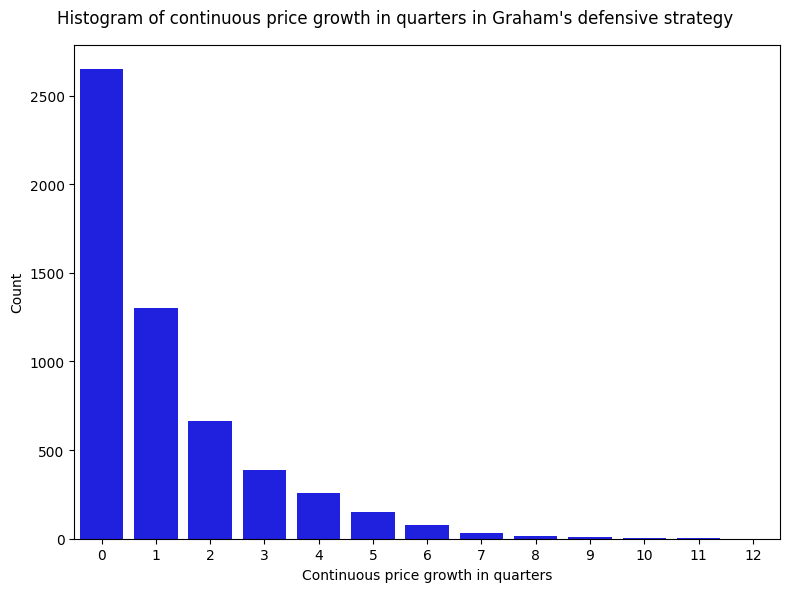

In [205]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=graham_def_df.continuous_price_growth,
    color='blue',
    ax=ax
)

ax.set_xticklabels(range(13))
ax.set_xlabel('Continuous price growth in quarters')
ax.set_ylabel('Count')

plt.suptitle('Histogram of continuous price growth in quarters in Graham\'s defensive strategy')

plt.tight_layout();

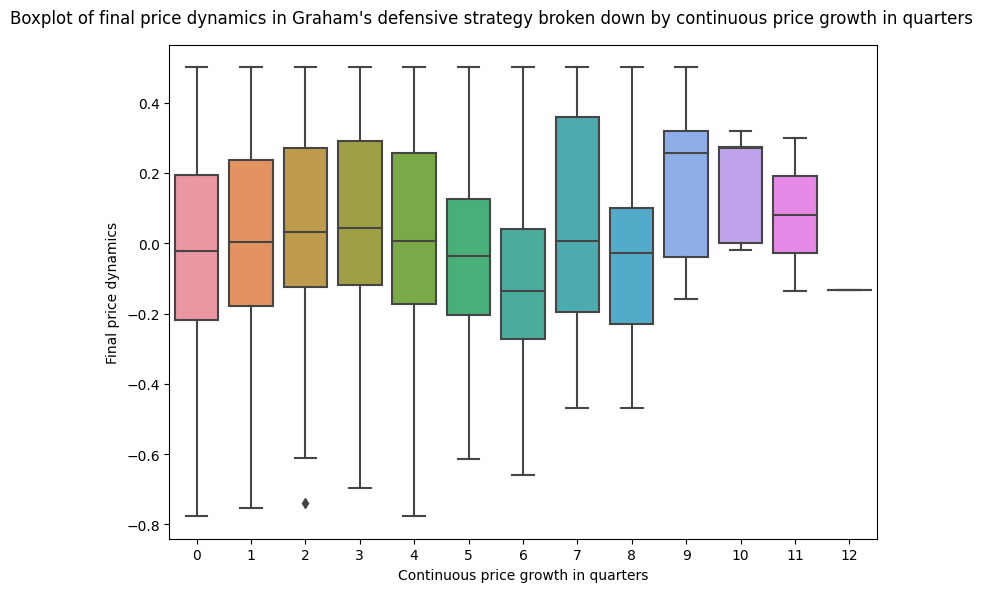

In [206]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    x=graham_def_df.continuous_price_growth,
    y=graham_def_df.final_price_dynamics,
    ax=ax
)

ax.set_xticklabels(range(13))
ax.set_xlabel('Continuous price growth in quarters')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s defensive '\
    'strategy broken down by continuous price growth in quarters')

plt.tight_layout();

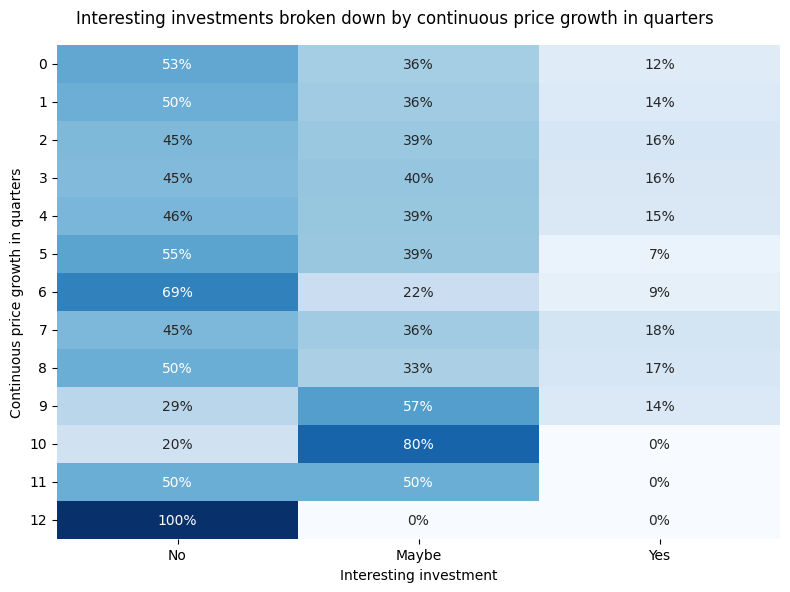

In [207]:
fig, ax = plt.subplots(figsize=(8, 6))

custom_heatmap(
    pd.crosstab(
        graham_def_df.continuous_price_growth,
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.set_yticklabels(range(13))
ax.tick_params(axis='y', labelrotation=0)
ax.set_xlabel('Interesting investment')
ax.set_ylabel('Continuous price growth in quarters')

plt.suptitle('Interesting investments broken down by continuous price growth in quarters')

plt.tight_layout();

A similar variable is **continuous_dividend**, which denotes the number of quarters with continuous dividend payments (i.e. if in 2020 the company paid a dividend for the first time, Q1 2021 will receive a value of 1, Q2 2021 a value of 2, etc.). The range of this variable is from 0 to 87, with only 11 observations managing to exceed the threshold of 80 quarters. As with the previous variable, the results are inconclusive and a lower threshold will need to be found. What is noticeable, however, is that companies paying dividends continuously for more than 10 years (40 quarters) hardly achieve share price increases higher than 50% (except for those that have paid dividends for 77-80 quarters). At the same time, investments in shares of companies paying dividends for 65-76 quarters were overwhelmingly loss-making.

In [208]:
print('The basic statistics of continuous price growth in Graham\'s defensive strategy:')
print(graham_def_df.continuous_dividend.describe())
print('\nContinuous price growth in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.continuous_dividend > 80,
    'Over 80 quarters', 'Below 80 quarters'
)).value_counts())

The basic statistics of continuous price growth in Graham's defensive strategy:
count   5563.00
mean       8.60
std       13.84
min        0.00
25%        0.00
50%        1.00
75%       12.00
max       87.00
Name: continuous_dividend, dtype: float64

Continuous price growth in Graham's defensive strategy:
Below 80 quarters    5552
Over 80 quarters       11
dtype: int64


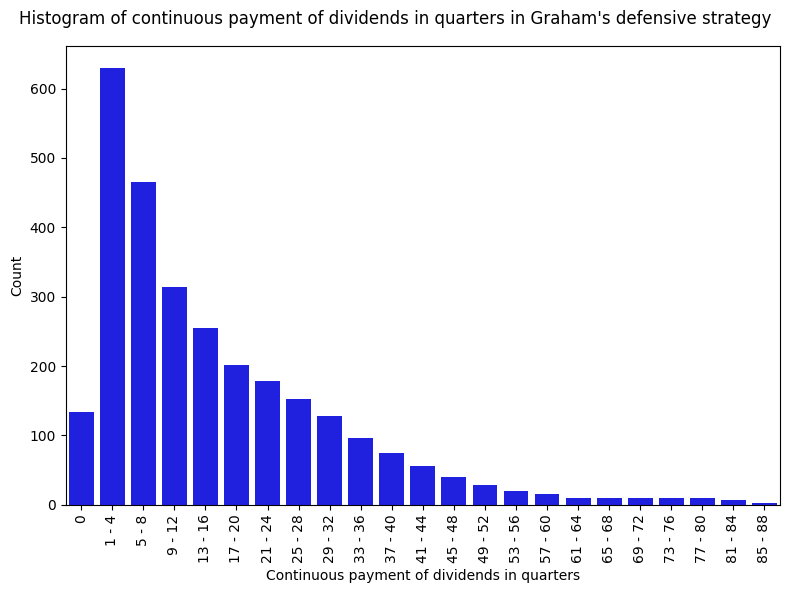

In [209]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.continuous_dividend,
        bins=[0] + list(range(1, 93, 4)),
        labels=[0] + [f'{i} - {i+3}' for i in range(1, 89, 4)]
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Continuous payment of dividends in quarters')
ax.set_ylabel('Count')

plt.suptitle('Histogram of continuous payment of '\
    'dividends in quarters in Graham\'s defensive strategy')

plt.tight_layout();

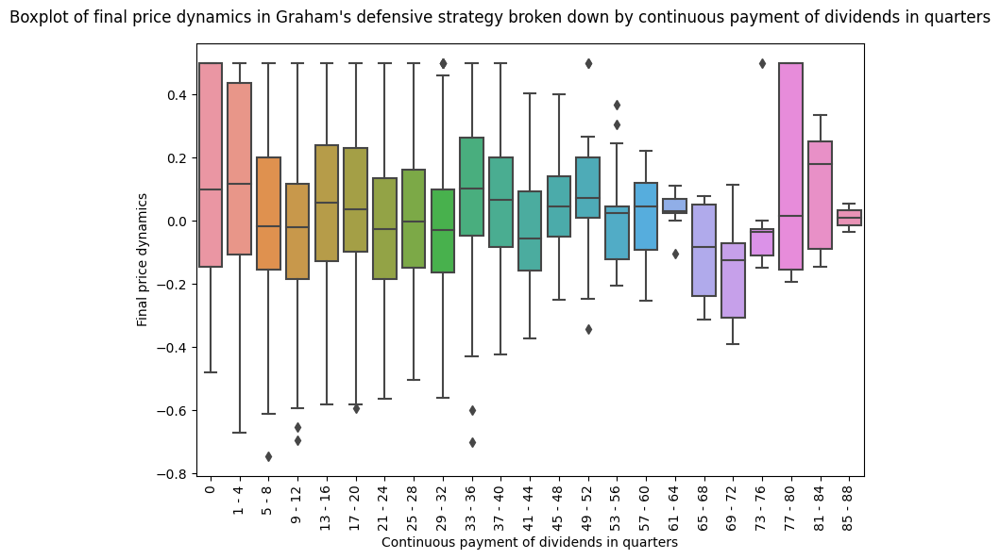

In [210]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.continuous_dividend,
        bins=[0] + list(range(1, 93, 4)),
        labels=[0] + [f'{i} - {i+3}' for i in range(1, 89, 4)]
    ),
    y=graham_def_df.final_price_dynamics,
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Continuous payment of dividends in quarters')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s '\
    'defensive strategy broken down by continuous payment of dividends in quarters')

plt.tight_layout();

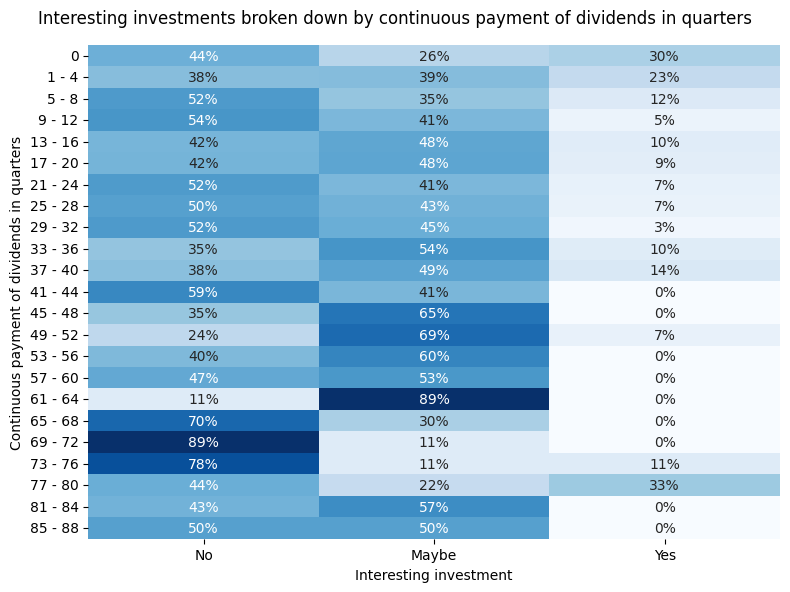

In [211]:
fig, ax = plt.subplots(figsize=(8, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.continuous_dividend,
            bins=[0] + list(range(1, 93, 4)),
            labels=[0] + [f'{i} - {i+3}' for i in range(1, 89, 4)]
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.tick_params(axis='y', labelrotation=0)
ax.set_xlabel('Interesting investment')
ax.set_ylabel('Continuous payment of dividends in quarters')

plt.suptitle('Interesting investments broken down by continuous payment of dividends in quarters')

plt.tight_layout();

The next variable is particularly complex. It represents the ratio of total earnings per share over the last 10 years to the current value of earnings per share. However, the already current size of observations available for the strategy under analysis is small (especially compared to other strategies), and the choice of companies for which such data is available is even more limiting. In order to keep the size of the analysed set reasonable, we will check other variants of this variable: three-year, two-year and one-year.

In [212]:
find_cols = [col for col in graham_def_df.columns if 'sum_earnings' in col]

print('Number of observations available for each period:')
graham_def_df[find_cols].count()

Number of observations available for each period:


sum_earnings_share_10Y_earnings_per_share    1314
sum_earnings_share_9Y_earnings_per_share     1677
sum_earnings_share_8Y_earnings_per_share     2065
sum_earnings_share_7Y_earnings_per_share     2486
sum_earnings_share_6Y_earnings_per_share     2941
sum_earnings_share_5Y_earnings_per_share     3442
sum_earnings_share_4Y_earnings_per_share     3933
sum_earnings_share_3Y_earnings_per_share     4424
sum_earnings_share_2Y_earnings_per_share     4969
sum_earnings_share_1Y_earnings_per_share     5563
dtype: int64

Among the variables analysed, only very few observations met the criteria. Increasing the threshold (e.g. to 10), we see that for a period of 1 year, the variable behaves reasonably (performing best for values between 0 and 10 and getting progressively worse as the indicator increases). In contrast, for periods 2 and 3 years, observations with a low value of the indicator perform very badly, but suddenly improve in the next interval. Due to these inconsistencies, we choose the one-year version of the variable for further analysis and will try to find a suitable threshold for it.

In [213]:
print('The basic statistics of sum of earnings per share from the previous 1, 2 and 3 years '\
    'to current earnings per share in Graham\'s defensive strategy:')
graham_def_df[[
    'sum_earnings_share_1Y_earnings_per_share',
    'sum_earnings_share_2Y_earnings_per_share',
    'sum_earnings_share_3Y_earnings_per_share',
]].describe()

The basic statistics of sum of earnings per share from the previous 1, 2 and 3 years to current earnings per share in Graham's defensive strategy:


,sum_earnings_share_1Y_earnings_per_share,sum_earnings_share_2Y_earnings_per_share,sum_earnings_share_3Y_earnings_per_share
count,5563.00,4969.00,4424.00
mean,105.94,220.46,334.12
std,413.74,969.34,1523.14
min,0.96,1.92,4.05
25%,31.15,58.96,85.31
50%,47.70,93.21,135.98
75%,76.14,148.33,220.87
max,15393.50,28857.00,39004.00


In [214]:
print('Sum of earnings per share from the previous year to current '\
    'earnings per share in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.sum_earnings_share_1Y_earnings_per_share <= 3,
    'Below 3', 'Over 3'
)).value_counts())
print('\nSum of earnings per share from the previous two years to '\
    'current earnings per share in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.sum_earnings_share_2Y_earnings_per_share <= 3,
    'Below 3', 'Over 3'
)).value_counts())
print('\nSum of earnings per share from the previous three years to '\
    'current earnings per share in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.sum_earnings_share_3Y_earnings_per_share <= 3,
    'Below 3', 'Over 3'
)).value_counts())

Sum of earnings per share from the previous year to current earnings per share in Graham's defensive strategy:
Over 3     5540
Below 3      23
dtype: int64

Sum of earnings per share from the previous two years to current earnings per share in Graham's defensive strategy:
Over 3     5555
Below 3       8
dtype: int64

Sum of earnings per share from the previous three years to current earnings per share in Graham's defensive strategy:
Over 3    5563
dtype: int64


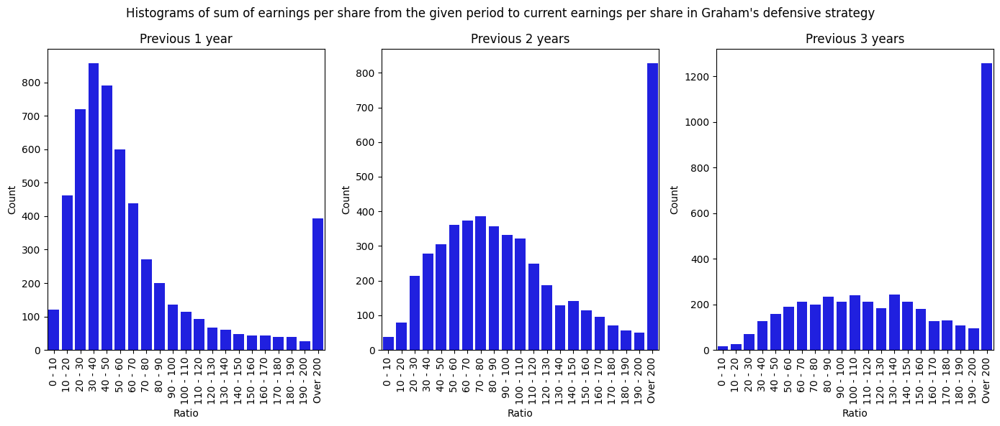

In [215]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_1Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_2Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_3Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Ratio')
    axs[i].set_ylabel('Count')

plt.suptitle('Histograms of sum of earnings per share from the given period to '\
    'current earnings per share in Graham\'s defensive strategy')
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

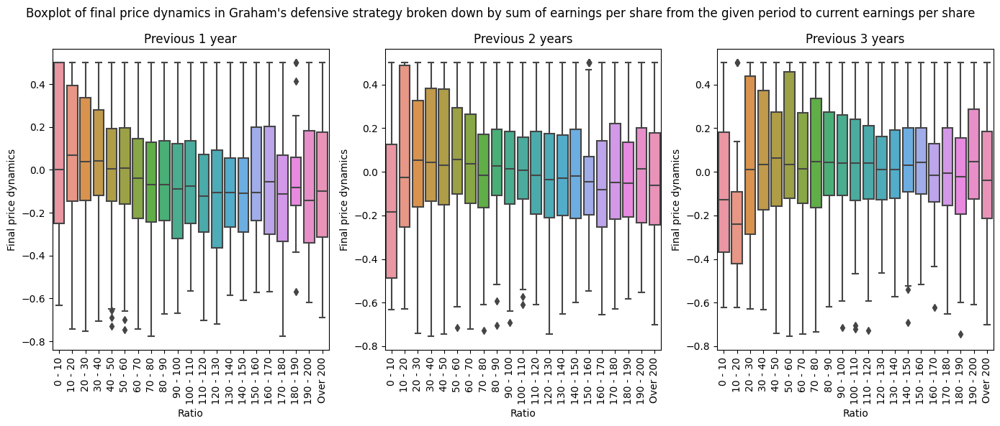

In [216]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_1Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_2Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.sum_earnings_share_3Y_earnings_per_share,
        bins=list(range(0, 210, 10)) + [5e4],
        labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Ratio')
    axs[i].set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s defensive strategy broken down by '\
    'sum of earnings per share from the given period to current earnings per share')
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

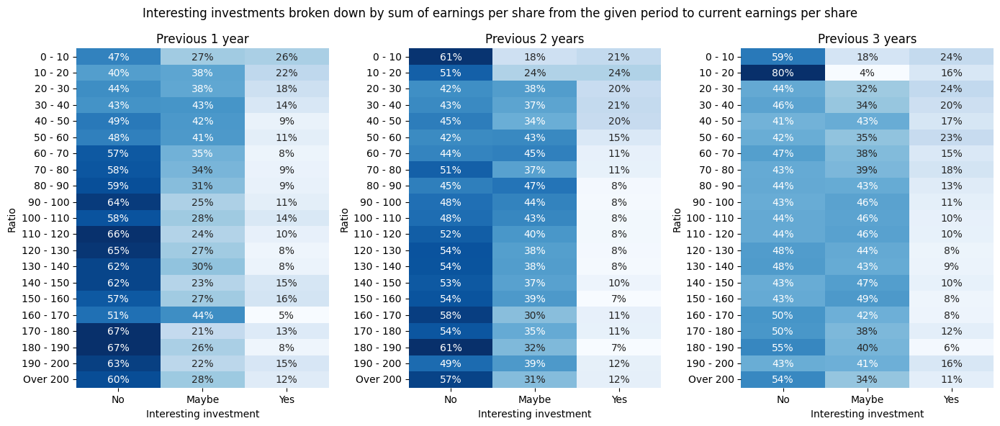

In [217]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.sum_earnings_share_1Y_earnings_per_share,
            bins=list(range(0, 210, 10)) + [5e4],
            labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.sum_earnings_share_2Y_earnings_per_share,
            bins=list(range(0, 210, 10)) + [5e4],
            labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.sum_earnings_share_3Y_earnings_per_share,
            bins=list(range(0, 210, 10)) + [5e4],
            labels=[f'{i} - {i+10}' for i in range(0, 200, 10)] + ['Over 200']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Ratio')

plt.suptitle('Interesting investments broken down by sum of earnings per '\
    'share from the given period to current earnings per share')
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

Another variable represents the ratio of the current price to the average earnings per share over the last 10 years. Its problem is identical to the previous variable and its solution is also the same - we will choose variants of this variable for 1, 2 and 3 years.

In the one-year variant, only one observation exceeds the threshold with a value of 15 (however, not by much, as it is 16), and this proportion changes in the subsequent variables. In the two-year variant, 89% of observations meet the criterion, while in the three-year variant, 80% do.

Again, the one-year variant seems to be the most interesting to analyse, as it has the highest number of observations - and is, moreover, consistent with the choice of variant of the previous variable. The performance of this variable deteriorates slightly as its value increases above 0.4 (but still remains at an acceptable level), before improving again above 1.5. However, more than half of the observations are in the 0.4 - 1.5 range. As a result, the only reasonable solution seems to be to omit this variable, as attempts to optimise it will inevitably lead to a reduction in the number of investments to a level insufficient to fill the portfolio.

In [218]:
find_cols = [col for col in graham_def_df.columns if 'price_avg' in col]

print('Number of observations available for each period:')
graham_def_df[find_cols].count()

Number of observations available for each period:


price_avg_earnings_share_10Y    1314
price_avg_earnings_share_9Y     1677
price_avg_earnings_share_8Y     2065
price_avg_earnings_share_7Y     2486
price_avg_earnings_share_6Y     2941
price_avg_earnings_share_5Y     3442
price_avg_earnings_share_4Y     3933
price_avg_earnings_share_3Y     4424
price_avg_earnings_share_2Y     4969
price_avg_earnings_share_1Y     5563
dtype: int64

In [219]:
print('The basic statistics of price to average earnings per share from '\
    'the previous 1, 2 and 3 years in Graham\'s defensive strategy:')
graham_def_df[[
    'price_avg_earnings_share_1Y',
    'price_avg_earnings_share_2Y',
    'price_avg_earnings_share_3Y',
]].describe()

The basic statistics of price to average earnings per share from the previous 1, 2 and 3 years in Graham's defensive strategy:


,price_avg_earnings_share_1Y,price_avg_earnings_share_2Y,price_avg_earnings_share_3Y
count,5563.00,4969.00,4424.00
mean,1.09,1.12,1.13
std,0.46,0.59,0.67
min,0.13,0.11,0.10
25%,0.87,0.84,0.82
50%,1.03,1.04,1.03
75%,1.22,1.29,1.32
max,16.00,23.34,24.51


In [220]:
print('Price to average earnings per share from the previous year in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.price_avg_earnings_share_1Y <= 15,
    'Below 15', 'Over 15'
)).value_counts())
print('\nPrice to average earnings per share from the previous '\
    'two years in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.price_avg_earnings_share_2Y <= 15,
    'Below 15', 'Over 15'
)).value_counts())
print('\nPrice to average earnings per share from the previous '\
    'three years in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.price_avg_earnings_share_3Y <= 15,
    'Below 15', 'Over 15'
)).value_counts())

Price to average earnings per share from the previous year in Graham's defensive strategy:
Below 15    5562
Over 15        1
dtype: int64

Price to average earnings per share from the previous two years in Graham's defensive strategy:
Below 15    4968
Over 15      595
dtype: int64

Price to average earnings per share from the previous three years in Graham's defensive strategy:
Below 15    4423
Over 15     1140
dtype: int64


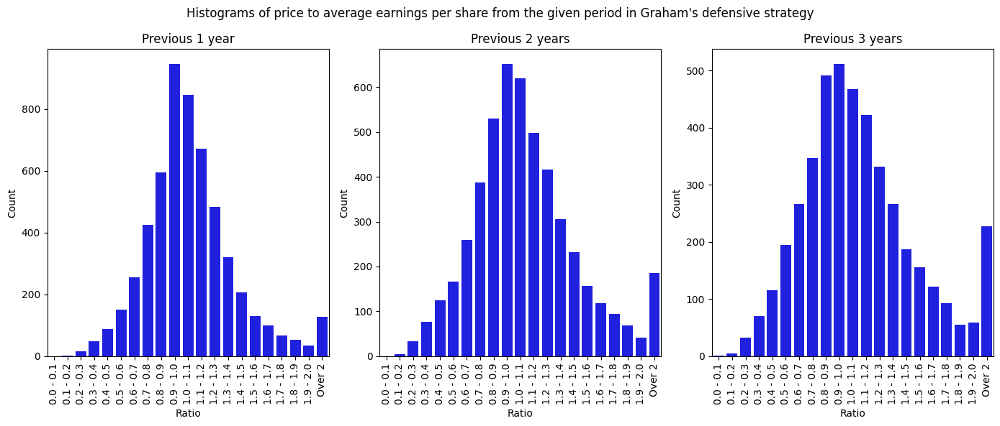

In [221]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_1Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_2Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_3Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Ratio')
    axs[i].set_ylabel('Count')

plt.suptitle('Histograms of price to average earnings per share '\
    'from the given period in Graham\'s defensive strategy')
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

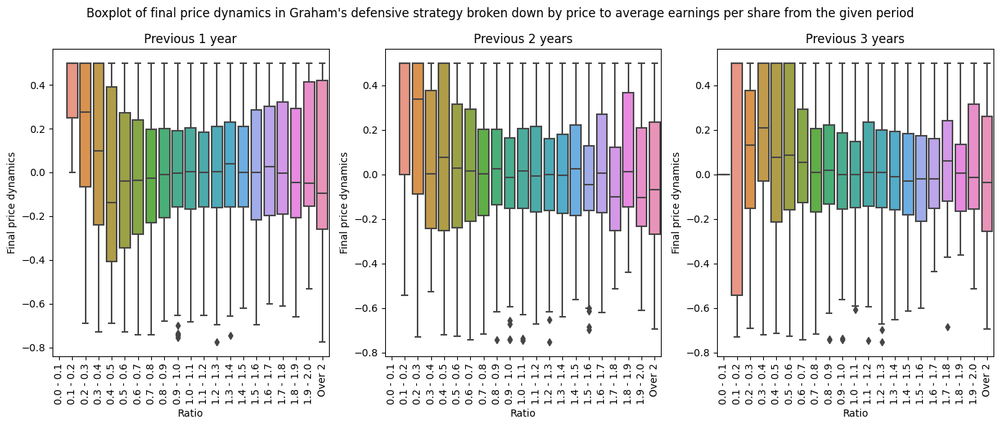

In [222]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_1Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_2Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_avg_earnings_share_3Y,
        bins=list(np.arange(0, 2.1, .1)) + [25],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Ratio')
    axs[i].set_ylabel('Final price dynamics')

plt.suptitle(
    'Boxplot of final price dynamics in Graham\'s defensive '\
    'strategy broken down by price to average earnings per share from the given period'
)
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

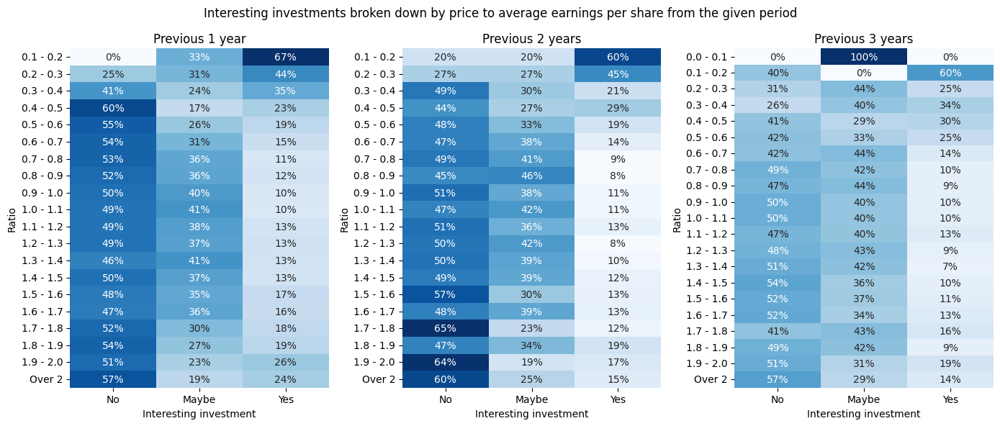

In [223]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_avg_earnings_share_1Y,
            bins=list(np.arange(0, 2.1, .1)) + [25],
            labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_avg_earnings_share_2Y,
            bins=list(np.arange(0, 2.1, .1)) + [25],
            labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_avg_earnings_share_3Y,
            bins=list(np.arange(0, 2.1, .1)) + [25],
            labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(0, 2, .1)] + ['Over 2']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Ratio')

plt.suptitle('Interesting investments broken down by price '\
    'to average earnings per share from the given period')
axs[0].set_title('Previous 1 year')
axs[1].set_title('Previous 2 years')
axs[2].set_title('Previous 3 years')

plt.tight_layout();

The range of price to Graham's book value (P/GBV) ratio feature is from 0.03 to to almost 15473 with mean value of 23.27, though the median is 4.8. Only 15% of observations met the criterion for this variable. Observations with a value of this indicator below 1.5 perform clearly better than the others. Nevertheless, due to their small number, we will have to raise this threshold slightly.

In [224]:
print('The basic statistics of P/GBV ratio in Graham\'s defensive strategy:')
print(graham_def_df.price_graham_book_value.describe())
print('\nP/GBV ratio in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.price_graham_book_value <= 1.5,
    'Below 1.5', 'Over 1.5'
)).value_counts())

The basic statistics of P/GBV ratio in Graham's defensive strategy:
count    5563.00
mean       23.27
std       284.79
min         0.03
25%         2.26
50%         4.80
75%        10.48
max     15472.58
Name: price_graham_book_value, dtype: float64

P/GBV ratio in Graham's defensive strategy:
Over 1.5     4738
Below 1.5     825
dtype: int64


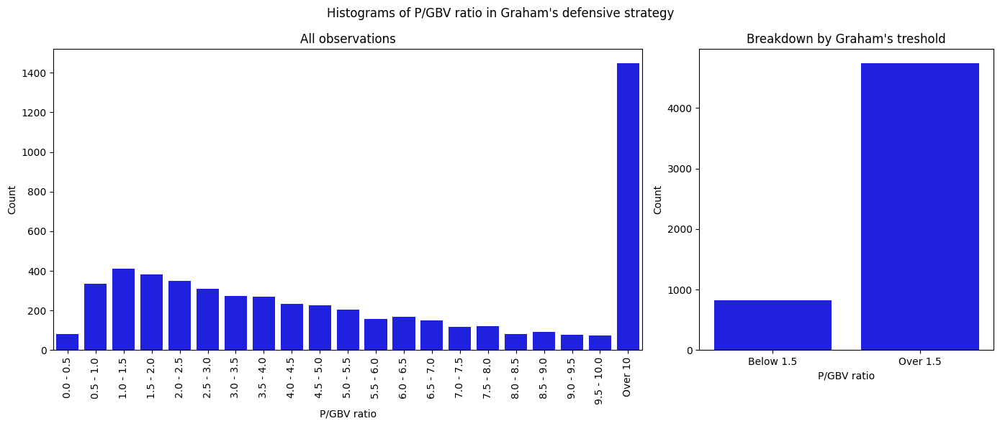

In [225]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.countplot(
    x=pd.cut(
        graham_def_df.price_graham_book_value,
        bins=list(np.arange(0, 10.5, .5)) + [16000],
        labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.price_graham_book_value,
        bins=[0, 1.5, 16000],
        labels=['Below 1.5', 'Over 1.5']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/GBV ratio')
    axs[i].set_ylabel('Count')
axs[1].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of P/GBV ratio in Graham\'s defensive strategy')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

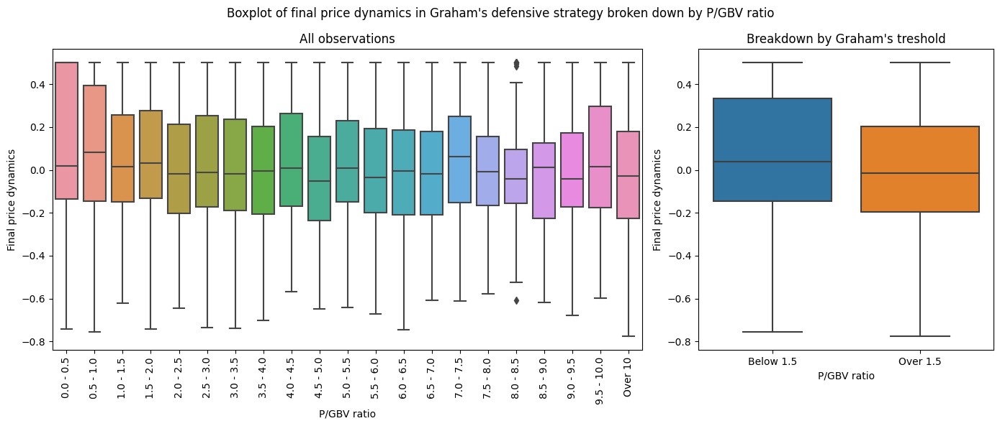

In [226]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_graham_book_value,
        bins=list(np.arange(0, 10.5, .5)) + [16000],
        labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_graham_book_value,
        bins=[0, 1.5, 16000],
        labels=['Below 1.5', 'Over 1.5']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/GBV ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[1].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplot of final price dynamics in '\
    'Graham\'s defensive strategy broken down by P/GBV ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

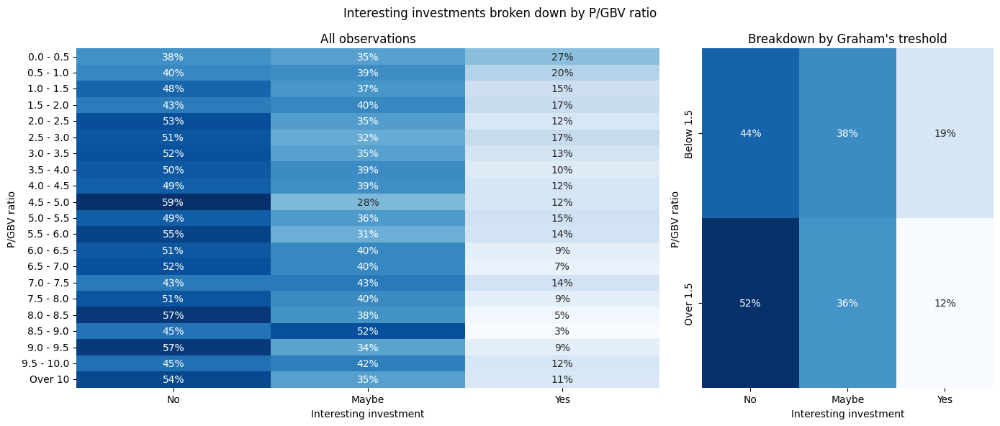

In [227]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_graham_book_value,
            bins=list(np.arange(0, 10.5, .5)) + [16000],
            labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_graham_book_value,
            bins=[0, 1.5, 16000],
            labels=['Below 1.5', 'Over 1.5']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('P/GBV ratio')
axs[0].tick_params(axis='y', labelrotation=0)

plt.suptitle('Interesting investments broken down by P/GBV ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

The range of P/E ratio feature is from 0.11 to to almost 5482 with mean value of 26.21, though the median is 12.31. 64% of observations met the criterion for this variable. As in previous analyses, observations with a value of less than 15 on this indicator perform significantly better. Since we have a relatively large number of observations meeting this criterion in this case, we can try to tighten it even further. Investments with a P/E ratio below 1 perform less well, nevertheless this may be influenced by their small number.

In [228]:
print('The basic statistics of P/E ratio in Graham\'s defensive strategy:')
print(graham_def_df.price_earnings.describe())
print('\nP/E ratio in Graham\'s defensive strategy:')
print(pd.Series(np.where(
    graham_def_df.price_earnings <= 15,
    'Below 15', 'Over 15'
)).value_counts())

The basic statistics of P/E ratio in Graham's defensive strategy:
count   5563.00
mean      26.21
std      114.56
min        0.11
25%        8.11
50%       12.31
75%       19.09
max     5481.68
Name: price_earnings, dtype: float64

P/E ratio in Graham's defensive strategy:
Below 15    3537
Over 15     2026
dtype: int64


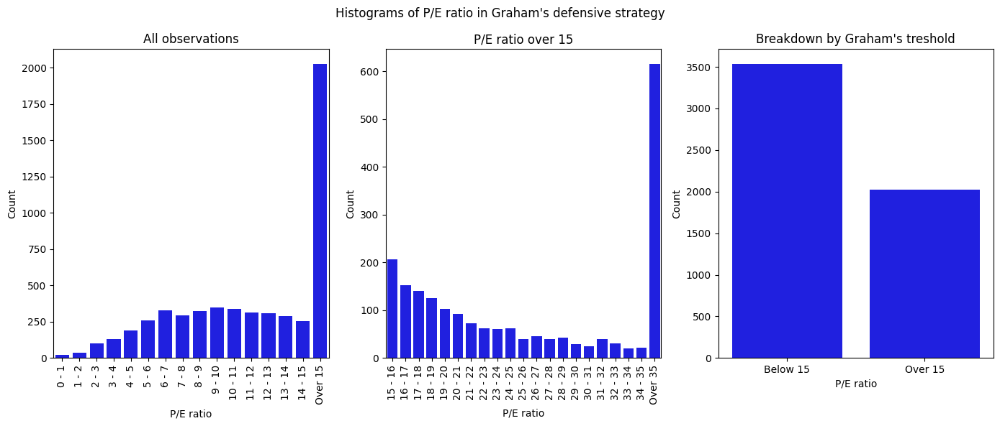

In [229]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df.price_earnings,
        bins=list(range(16)) + [5500],
        labels=[f'{i} - {i+1}' for i in range(15)] + ['Over 15']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_def_df[graham_def_df.price_earnings > 15].price_earnings,
        bins=list(range(15, 36)) + [5500],
        labels=[f'{i} - {i+1}' for i in range(15, 35)] + ['Over 35']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_def_df.price_earnings,
        bins=[0, 15, 5500],
        labels=['Below 15', 'Over 15']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/E ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of P/E ratio in Graham\'s defensive strategy')
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 15')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

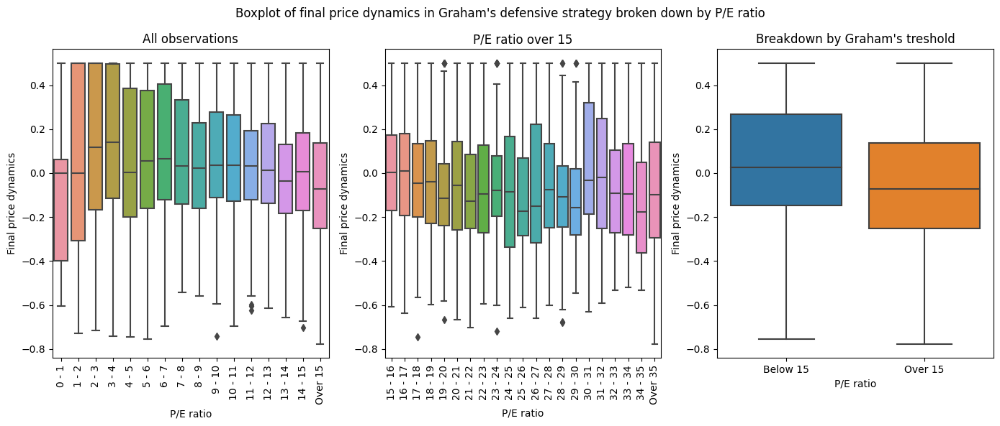

In [230]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_earnings,
        bins=list(range(16)) + [5500],
        labels=[f'{i} - {i+1}' for i in range(15)] + ['Over 15']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df[graham_def_df.price_earnings > 15].price_earnings,
        bins=list(range(15, 36)) + [5500],
        labels=[f'{i} - {i+1}' for i in range(15, 35)] + ['Over 35']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_def_df.price_earnings,
        bins=[0, 15, 5500],
        labels=['Below 15', 'Over 15']
    ),
    y=graham_def_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/E ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)
plt.suptitle(
    'Boxplot of final price dynamics in Graham\'s defensive strategy broken down by P/E ratio'
)
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 15')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

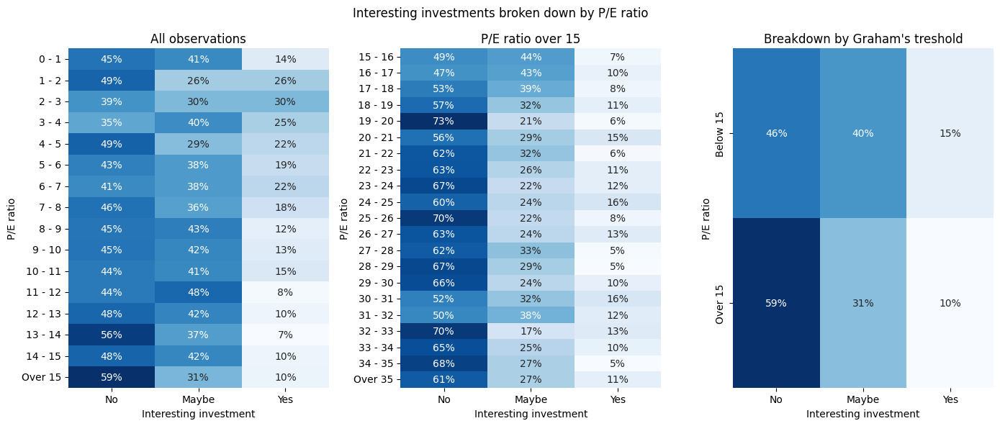

In [231]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_earnings,
            bins=list(range(16)) + [5500],
            labels=[f'{i} - {i+1}' for i in range(15)] + ['Over 15']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df[graham_def_df.price_earnings > 15].price_earnings,
            bins=list(range(15, 36)) + [5500],
            labels=[f'{i} - {i+1}' for i in range(15, 35)] + ['Over 35']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_def_df.price_earnings,
            bins=[0, 15, 5500],
            labels=['Below 15', 'Over 15']
        ),
        graham_def_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('P/E ratio')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by P/E ratio')
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 15')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed in Graham's defensive strategy, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters). The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. The best results are provided by choosing companies, which have:
- long term liabilities to net working capital between 0 and 0.0006,
- paid dividend in the previous year,
- total earnings per share from previous year to current earnings per share below 70,
- P/GBV ratio below 4,
- P/E ratio below 15.

We can also reject the analysis of continuous price increases - we had to take all observations into account.

In [232]:
graham_def_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean()
})

graham_def_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        graham_def_df[
            graham_def_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        graham_def_df[
            graham_def_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
graham_def_portfolio_df['Graham\'s defensive strategy'] = (
    graham_def_portfolio_df.buy_in_q - graham_def_portfolio_df.sell_in_q
).cumsum()
graham_def_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

In [235]:
graham_def_mod_df = {
    'Long term liabilities to net working capital between 0 and:':[],
    'Continuous price growth for at least:':[],
    'Continuous dividend payments for at least:':[],
    'Total earnings per share from previous year to current earnings per share below:':[],
    'P/GBV ratio below:':[],
    'P/E ratio below:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.arange(.0001, .0021, .0001): # long_term_liabilities_net_working_capital
    for mod_2 in range(4): # continuous_price_growth
        for mod_3 in range(1, 21, 4): # continuous_dividend
            for mod_4 in range(30, 110, 10): # sum_earnings_share_1Y_earnings_per_share
                for mod_5 in np.arange(.5, 4.5, .5): # price_graham_book_value
                    for mod_6 in range(5, 20, 5): # price_earnings
                        graham_def_df['mod_buy'] = np.where(
                            (graham_def_df.sales_revenues_1Y_usd > 0) &
                            (graham_def_df.long_term_liabilities_net_working_capital > 0) &
                            (graham_def_df.long_term_liabilities_net_working_capital <= mod_1) &
                            (graham_def_df.continuous_price_growth >= mod_2) &
                            (graham_def_df.continuous_dividend >= mod_3) &
                            (graham_def_df.sum_earnings_share_1Y_earnings_per_share <= mod_4) &
                            (graham_def_df.price_graham_book_value <= mod_5) &
                            (graham_def_df.price_earnings <= mod_6),
                            'Yes', 'No'
                        )

                        if graham_def_df[graham_def_df.mod_buy == 'Yes'].shape[0] > 0:
                            # Return on Modified Graham\'s defensive strategy
                            graham_def_return_df[
                                'Modified Graham\'s defensive strategy'
                            ] = graham_def_df[
                                graham_def_df.mod_buy == 'Yes'
                            ].groupby('quarter').final_price_dynamics.mean()
                            avg_strategy_return = (
                                100 * graham_def_return_df[
                                    'Modified Graham\'s defensive strategy'].mean()
                            ).round(2)

                            # If positive
                            if avg_strategy_return > 0:

                                # Size of portfolio in Modified Graham\'s defensive strategy
                                graham_def_portfolio_df['buy_in_q'] = pd.Series(
                                    graham_def_df[
                                        graham_def_df.mod_buy == 'Yes'
                                    ].groupby('quarter').quarter.count().reindex(
                                        sorted(dataset.quarter.unique())).fillna(0)
                                )
                                graham_def_portfolio_df['sell_in_q'] = pd.Series(
                                    graham_def_df[
                                        graham_def_df.mod_buy == 'Yes'
                                    ].groupby('sell_in_q').sell_in_q.count().reindex(
                                        sorted(dataset.quarter.unique())).fillna(0)
                                )

                                graham_def_portfolio_df[
                                    'Modified Graham\'s defensive strategy'
                                ] = (
                                    graham_def_portfolio_df.buy_in_q
                                    - graham_def_portfolio_df.sell_in_q
                                ).cumsum()
                                graham_def_portfolio_df.drop(
                                    ['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                                quarters_with_good_portfolio_size = graham_def_portfolio_df[
                                    graham_def_portfolio_df[
                                        'Modified Graham\'s defensive strategy'] >= 10
                                ]['Modified Graham\'s defensive strategy'].count()

                                # If number of quarters with good portfolio
                                # size > 55 (~80% of all quarters)
                                if quarters_with_good_portfolio_size >= 55:

                                    # Profitable quarters
                                    quarters_profit_strat = graham_def_return_df[
                                        graham_def_return_df[
                                            'Modified Graham\'s defensive strategy'] > 0
                                    ]['Modified Graham\'s defensive strategy'].count()

                                    # Strategy > zero effort strategy
                                    quarters_perform_strat = graham_def_return_df[
                                        graham_def_return_df[
                                            'Modified Graham\'s defensive strategy'
                                        ] > graham_def_return_df['Zero effort strategy']
                                    ]['Modified Graham\'s defensive strategy'].count()

                                    graham_def_mod_df[
                                        'Long term liabilities to net working '\
                                            'capital between 0 and:'
                                    ].append(mod_1)
                                    graham_def_mod_df[
                                        'Continuous price growth for at least:'].append(mod_2)
                                    graham_def_mod_df[
                                        'Continuous dividend payments for at least:'
                                    ].append(mod_3)
                                    graham_def_mod_df[
                                        'Total earnings per share from previous year to '\
                                            'current earnings per share below:'].append(mod_4)
                                    graham_def_mod_df[
                                        'P/GBV ratio below:'].append(mod_5)
                                    graham_def_mod_df[
                                        'P/E ratio below:'].append(mod_6)
                                    graham_def_mod_df[
                                        'Average return (%)'].append(avg_strategy_return)
                                    graham_def_mod_df[
                                        'Number of quarters with portfolio size over 10'
                                    ].append(quarters_with_good_portfolio_size)
                                    graham_def_mod_df[
                                        'Number of profitable quarters'
                                    ].append(quarters_profit_strat)
                                    graham_def_mod_df[
                                        'Number of quarters in which strategy '\
                                            'outperformed zero effort strategy'
                                    ].append(quarters_perform_strat)

                                    # Number of signals
                                    signals = graham_def_df.mod_buy.value_counts()[1]

                                    # Crosstab
                                    ctab = pd.crosstab(
                                        graham_def_df.interesting_investment,
                                        graham_def_df.mod_buy,
                                        rownames=['Interesting investment:'],
                                        colnames=[
                                            'Buy signal from modified Graham\'s '\
                                                'defensive strategy:']
                                    ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                                    # % of interesting_investment == Maybe or Yes
                                    graham_def_mod_df[
                                        'Percentage of profitable investments'
                                    ].append(
                                        round(
                                            100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals
                                        )
                                    )
                                    # % of interesting_investment == No
                                    graham_def_mod_df[
                                        'Percentage of loss-making investments'
                                    ].append(round(100 * ctab.iloc[0, 1] / signals))

graham_def_mod_df = pd.DataFrame(graham_def_mod_df)

print('Data frame with best modifications of Graham\'s defensive strategy:')
graham_def_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Graham's defensive strategy:


,Long term liabilities to net working capital between 0 and:,Continuous price growth for at least:,Continuous dividend payments for at least:,Total earnings per share from previous year to current earnings per share below:,P/GBV ratio below:,P/E ratio below:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
5,0.00,0,1,70,4.00,15,8.50,55,40,38,62,38
9,0.00,0,1,70,4.00,15,8.49,55,40,38,62,38
7,0.00,0,1,90,4.00,15,8.47,55,41,39,62,38
21,0.00,0,1,70,4.00,15,8.47,55,40,38,62,38
11,0.00,0,1,90,4.00,15,8.46,55,41,39,62,38
...,...,...,...,...,...,...,...,...,...,...,...,...
1,0.00,0,1,70,4.00,15,8.55,55,40,40,61,39
3,0.00,0,1,90,4.00,15,8.51,55,40,40,61,39
2,0.00,0,1,80,4.00,15,8.49,55,40,40,61,39
4,0.00,0,1,100,4.00,15,8.28,55,40,40,61,39


The modified Graham's defensive strategy classified 852 observations as worth buying (0 in original strategy), with 325 (38%) of them making a loss and 144 (17%) of them making a profit over 50%. The strategy primarily targeted observations with a profit of less than 50%.

In [238]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
graham_def_df['mod_buy'] = np.where(
    (graham_def_df.sales_revenues_1Y_usd > 0) &
    (graham_def_df.long_term_liabilities_net_working_capital > 0) &
    (graham_def_df.long_term_liabilities_net_working_capital <= .0006) &
    (graham_def_df.continuous_dividend >= 1) &
    (graham_def_df.sum_earnings_share_1Y_earnings_per_share <= 70) &
    (graham_def_df.price_graham_book_value <= 4) &
    (graham_def_df.price_earnings <= 15),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Graham\'s defensive strategy: '\
    f'{graham_def_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Graham's defensive strategy: 852


In [239]:
pd.crosstab(
    graham_def_df.interesting_investment,
    graham_def_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Graham\'s defensive strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Graham's defensive strategy:,No,Yes
Interesting investment:,,
No,2480,325
Maybe,1649,383
Yes,582,144


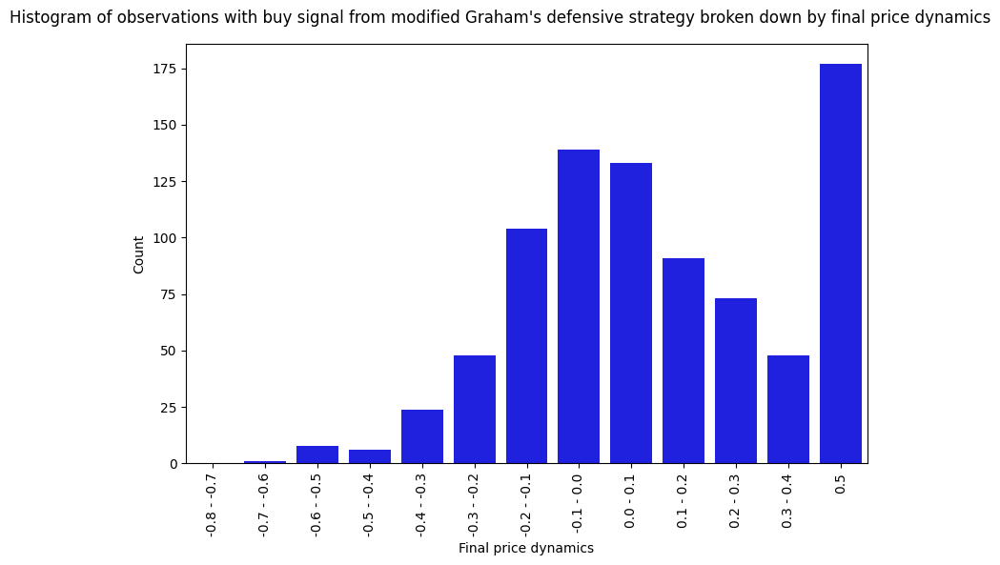

In [240]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_def_df[graham_def_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified Graham\'s defensive '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified Graham's defensive strategy was profitable in 40 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 38 of analyzed periods. Moreover, the modified strategy brought the average profit of 8.5%. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy. The strategy, even after modifications, ranks in the middle of the pack.

In [241]:
graham_def_return_df['Modified Graham\'s defensive strategy'] = graham_def_df[
        graham_def_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

graham_def_portfolio_df['buy_in_q'] = pd.Series(
    graham_def_df[
        graham_def_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
graham_def_portfolio_df['sell_in_q'] = pd.Series(
    graham_def_df[
        graham_def_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
graham_def_portfolio_df['Modified Graham\'s defensive strategy'] = (
    graham_def_portfolio_df.buy_in_q - graham_def_portfolio_df.sell_in_q
).cumsum()
graham_def_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(
    graham_def_return_df, graham_def_portfolio_df, 'Modified Graham\'s defensive strategy')

Number of quarters with buy signal from Modified Graham's defensive strategy: 58
Number of quarters with sufficient portfolio size: 55
Number of profitable quarters using Modified Graham's defensive strategy: 40
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Graham's defensive strategy outperformed zero effort strategy: 38
Average return on Modified Graham's defensive strategy: 8.5%
Average return on zero effort strategy: 5.6%


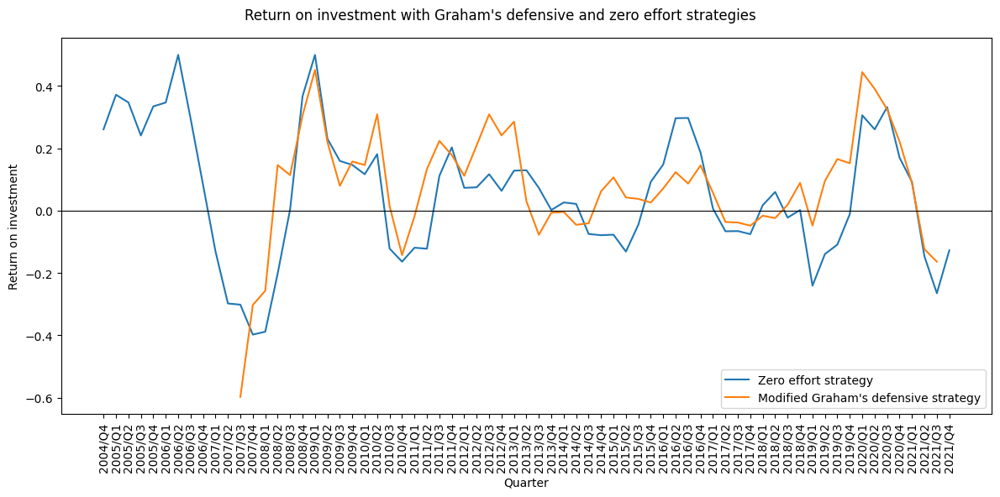

In [242]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    graham_def_return_df.index,
    graham_def_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Modified Graham\'s defensive strategy'])

plt.suptitle('Return on investment with Graham\'s defensive and zero effort strategies')

plt.tight_layout();

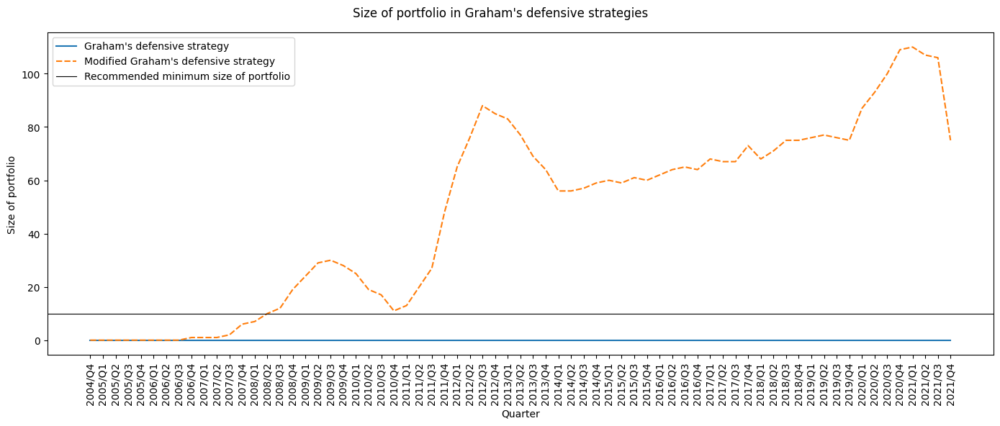

In [243]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=graham_def_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(graham_def_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Graham\'s defensive strategies')

plt.tight_layout();

# Benjamin Graham's entrepreneurial strategy

This strategy assumes, that we invest only in companies which:
- have current assets to short term liabilities ratio greater or equal to 1.5;
- have long term liabilities to net working capital ratio lower or equal to 1.1;
- had positive net earnings in each year up to five years back;
- have current net earnings greater than net earnings five years ago;
- have paid dividend in the previous year;
- have price to Graham's book value ratio lower or equal to 1.2 (compared to regular book value, Graham only took into account current assets);
- have P/E ratio lower or equal to 10.

For this strategy the following variables would be used:
- **final_price_dynamics** and **interesting_investment**: target variable described above;
- **final_wig_dynamics**: benchmark feature;
- **current_assets_short_term_liabilities**: current assets to short term liabilities ratio, should be over 1.5;
- **long_term_liabilities_net_working_capital**: long term liabilities to net working capital ratio, should be below 1.1;
- **pos_net_earnings_1Y**, **pos_net_earnings_2Y**, **pos_net_earnings_3Y**, **pos_net_earnings_4Y**, **pos_net_earnings_5Y**: positive net earnings in the previous year, two, three, four and five years ago, should be equal 1;
- **net_earnings**, **net_earnings_5Y**: net earnings in current year and five years ago;
- **dividend_1Y**: dividend paid in the previous year, should be equal 1;
- **price_graham_book_value**: price to Graham's book value ratio, should be below 1.2;
- **price_earnings**: P/E ratio, should be below 10;
- **buy**: signal from Graham's entrepreneurial strategy, *Yes* if company should be bought, *No* otherwise.

In [244]:
# Filter data
graham_ent_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'current_assets_short_term_liabilities', 'long_term_liabilities_net_working_capital',
    'pos_net_earnings_1Y', 'pos_net_earnings_2Y', 'pos_net_earnings_3Y', 'pos_net_earnings_4Y',
    'pos_net_earnings_5Y', 'net_earnings', 'net_earnings_1Y', 'net_earnings_2Y',
    'net_earnings_3Y', 'net_earnings_4Y', 'net_earnings_5Y', 'dividend_1Y',
    'price_graham_book_value', 'price_earnings'
])

# Add column 'buy' for observations, which meet strategy conditions
graham_ent_df['buy'] = np.where(
    (graham_ent_df.current_assets_short_term_liabilities >= 1.5) &
    (graham_ent_df.long_term_liabilities_net_working_capital <= 1.1) &
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.pos_net_earnings_2Y == 1) &
    (graham_ent_df.pos_net_earnings_3Y == 1) &
    (graham_ent_df.pos_net_earnings_4Y == 1) &
    (graham_ent_df.pos_net_earnings_5Y == 1) &
    (graham_ent_df.dividend_1Y == 1) &
    (graham_ent_df.net_earnings > graham_ent_df.net_earnings_5Y) &
    (graham_ent_df.price_graham_book_value <= 1.2) &
    (graham_ent_df.price_earnings <= 10),
    'Yes', 'No'
)

graham_ent_df['sell_in_q'] = np.where(
    graham_ent_df.buy == 'Yes',
    graham_ent_df.best_price_dynamics_in_q,
    graham_ent_df.price_dynamics_y_in_q
)

graham_ent_df = graham_ent_df.dropna(subset=[
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    'current_assets_short_term_liabilities', 'long_term_liabilities_net_working_capital',
    'pos_net_earnings_1Y', 'dividend_1Y', 'net_earnings', 'net_earnings_1Y',
    'price_graham_book_value', 'price_earnings'
])

The analyzed subset contains only 4907 observations (26% of original dataset). The distribution of **final_price_dynamics** is close to original set. The subset omitted 2396 **interesting_investment** observations (3010 in original set vs 614 in subset). However, the Graham's entrepreneurial strategy classified only 2 observations as worth buying. This strategy is proving to be as restrictive as the defensive version. However, some of the variables are shared, which will facilitate the analysis of this subset.

In [245]:
print('The basic statistics of final price dynamics in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.final_price_dynamics.describe())
print('\nInteresting companies in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.interesting_investment.value_counts())
print('\nNumber of buy signals from Graham\'s entrepreneurial strategy: '\
    f'{len(graham_ent_df) - graham_ent_df.buy.value_counts()[0]}')

The basic statistics of final price dynamics in Graham's entrepreneurial strategy:
count   4907.00
mean       0.03
std        0.28
min       -0.75
25%       -0.17
50%        0.00
75%        0.22
max        0.50
Name: final_price_dynamics, dtype: float64

Interesting companies in Graham's entrepreneurial strategy:
No       2403
Maybe    1890
Yes       614
Name: interesting_investment, dtype: int64

Number of buy signals from Graham's entrepreneurial strategy: 2


The range of current assets to short term liabilities ratio feature is from 1.02 to to almost 100 with mean value of 2.84, though the median is 1.95. 74% of observations met the criterion for this variable. Observations with a value of this indicator below 1.5 actually perform slightly better, nevertheless not better enough to set a different threshold for this variable. Final price dynamics performs similarly for most ranges of this feature, so we can omit it from further analysis.

In [246]:
print('The basic statistics of current assets to '\
    'short term liabilities ratio in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.current_assets_short_term_liabilities.describe())
print('\nCurrent assets to short term liabilities '\
    'ratio from the last year in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    graham_ent_df.current_assets_short_term_liabilities >= 1.5,
    'Over 1.5', 'Below 1.5'
)).value_counts())

The basic statistics of current assets to short term liabilities ratio in Graham's entrepreneurial strategy:
count   4907.00
mean       2.84
std        3.65
min        1.02
25%        1.48
50%        1.95
75%        2.92
max       99.44
Name: current_assets_short_term_liabilities, dtype: float64

Current assets to short term liabilities ratio from the last year in Graham's entrepreneurial strategy:
Over 1.5     3625
Below 1.5    1282
dtype: int64


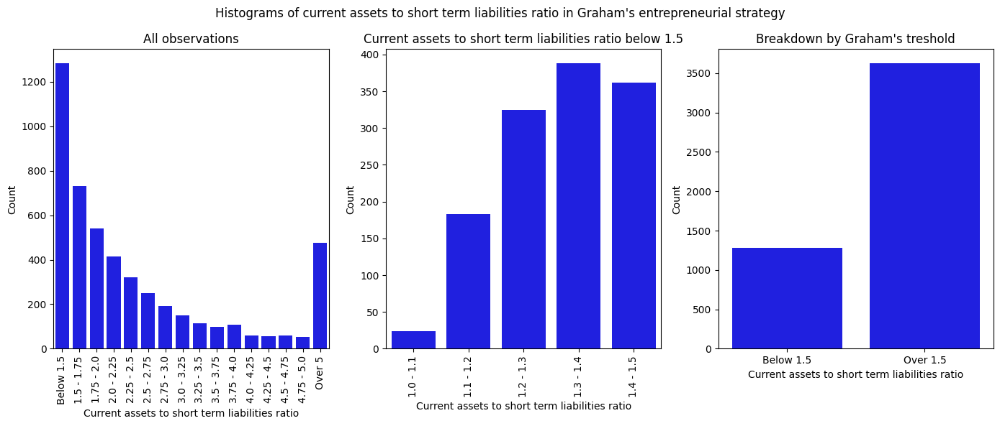

In [247]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_ent_df.current_assets_short_term_liabilities,
        bins=[1] + list(np.arange(1.5, 5.25, .25)) + [150],
        labels=['Below 1.5']
        + [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(1.5, 5, .25)] + ['Over 5']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_ent_df[
            graham_ent_df.current_assets_short_term_liabilities < 1.5
        ].current_assets_short_term_liabilities,
        bins=list(np.arange(1, 1.6, .1))[:-1],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 1.5, .1)]
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_ent_df.current_assets_short_term_liabilities,
        bins=[0, 1.5, 150],
        labels=['Below 1.5', 'Over 1.5']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Current assets to short term liabilities ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of current assets to short term liabilities '\
    'ratio in Graham\'s entrepreneurial strategy')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 1.5')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

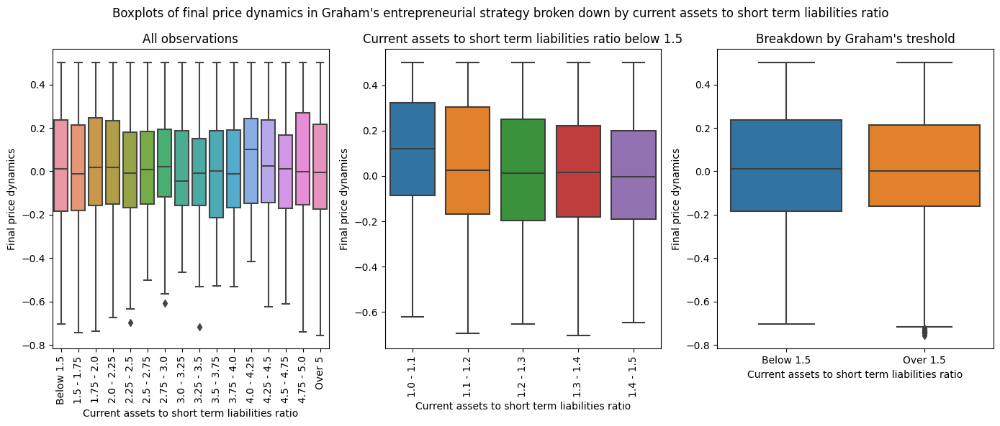

In [248]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_ent_df.current_assets_short_term_liabilities,
        bins=[1] + list(np.arange(1.5, 5.25, .25)) + [150],
        labels=['Below 1.5']
        + [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(1.5, 5, .25)] + ['Over 5']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_ent_df[
            graham_ent_df.current_assets_short_term_liabilities < 1.5
        ].current_assets_short_term_liabilities,
        bins=list(np.arange(1, 1.6, .1))[:-1],
        labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 1.5, .1)]
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_ent_df.current_assets_short_term_liabilities,
        bins=[0, 1.5, 150],
        labels=['Below 1.5', 'Over 1.5']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('Current assets to short term liabilities ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplots of final price dynamics in Graham\'s entrepreneurial '\
    'strategy broken down by current assets to short term liabilities ratio')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 1.5')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

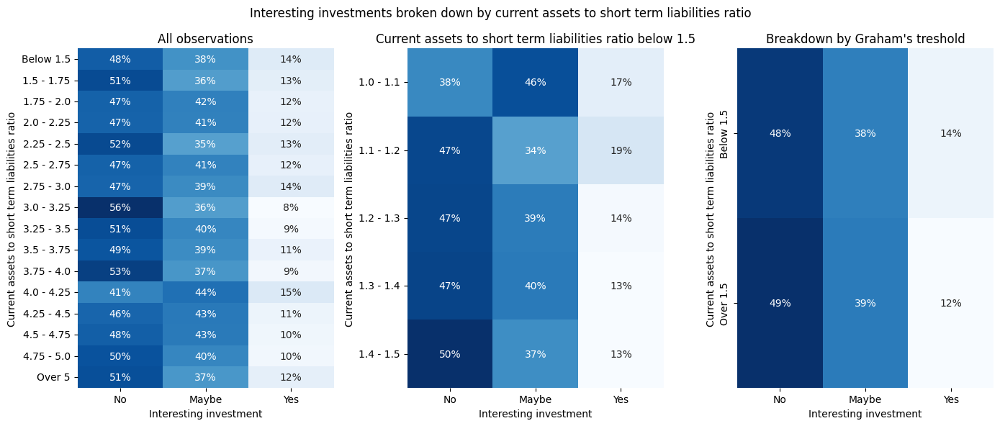

In [249]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
			graham_ent_df.current_assets_short_term_liabilities,
			bins=[1] + list(np.arange(1.5, 5.25, .25)) + [150],
			labels=['Below 1.5']
			+ [f'{round(i,2)} - {round(i+.25,2)}' for i in np.arange(1.5, 5, .25)] + ['Over 5']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
			graham_ent_df[
				graham_ent_df.current_assets_short_term_liabilities < 1.5
			].current_assets_short_term_liabilities,
			bins=list(np.arange(1, 1.6, .1))[:-1],
			labels=[f'{round(i,1)} - {round(i+.1,1)}' for i in np.arange(1, 1.5, .1)]
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
			graham_ent_df.current_assets_short_term_liabilities,
			bins=[0, 1.5, 150],
			labels=['Below 1.5', 'Over 1.5']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='y', labelrotation=0)
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('Current assets to short term liabilities ratio')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by current '\
    'assets to short term liabilities ratio')
axs[0].set_title('All observations')
axs[1].set_title('Current assets to short term liabilities ratio below 1.5')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

The range of long term liabilities to net working capital ratio feature is from -8.48 to to 0.12 with mean value of -0.0015, though the median is 0.0003. All of the observations met the criterion for this variable. It turns out that most of the observations ranged from 0 to 0.001, so definitely below the threshold. We can observe that the performance of the investments decreases significantly for values above 0.0009 - so we can try to lower the threshold for this variable.

In [250]:
print('The basic statistics of long term liabilities to net '\
    'working capital ratio in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.long_term_liabilities_net_working_capital.describe())
print('\nLong term liabilities to net working capital ratio '\
    'from the last year in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    graham_ent_df.long_term_liabilities_net_working_capital <= 1.1,
    'Below 1.1', 'Over 1.1'
)).value_counts())

The basic statistics of long term liabilities to net working capital ratio in Graham's entrepreneurial strategy:
count   4907.00
mean      -0.00
std        0.12
min       -8.48
25%        0.00
50%        0.00
75%        0.00
max        0.12
Name: long_term_liabilities_net_working_capital, dtype: float64

Long term liabilities to net working capital ratio from the last year in Graham's entrepreneurial strategy:
Below 1.1    4907
dtype: int64


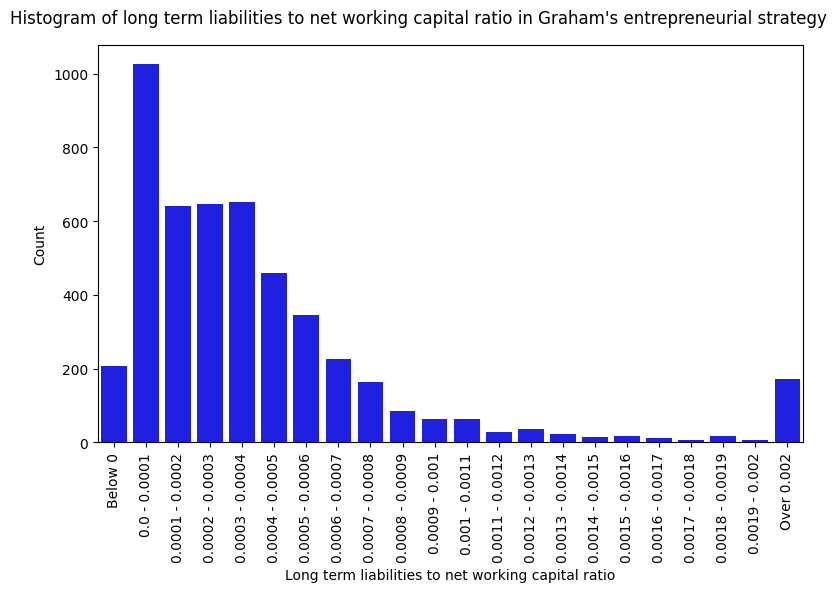

In [253]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_ent_df.long_term_liabilities_net_working_capital,
        bins=[-10] + list(np.arange(0, .0021, .0001)) + [.2],
        labels=['Below 0']
        + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)] + ['Over 0.002']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Long term liabilities to net working capital ratio')
ax.set_ylabel('Count')

plt.suptitle('Histogram of long term liabilities to net working '\
    'capital ratio in Graham\'s entrepreneurial strategy')

plt.tight_layout();

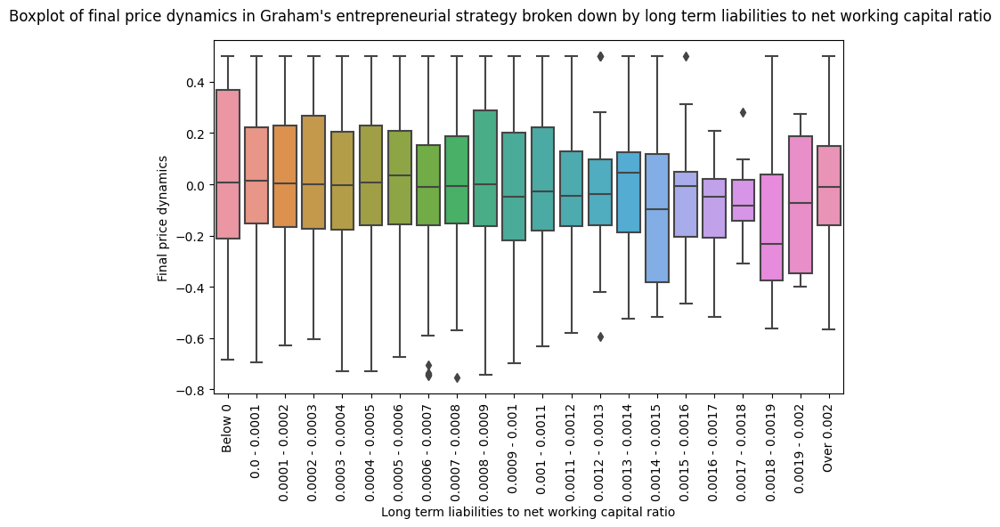

In [254]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.boxplot(
    x=pd.cut(
        graham_ent_df.long_term_liabilities_net_working_capital,
        bins=[-10] + list(np.arange(0, .0021, .0001)) + [.2],
        labels=['Below 0']
        + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)] + ['Over 0.002']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)
ax.set_xlabel('Long term liabilities to net working capital ratio')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s entrepreneurial strategy '\
    'broken down by long term liabilities to net working capital ratio')

plt.tight_layout();

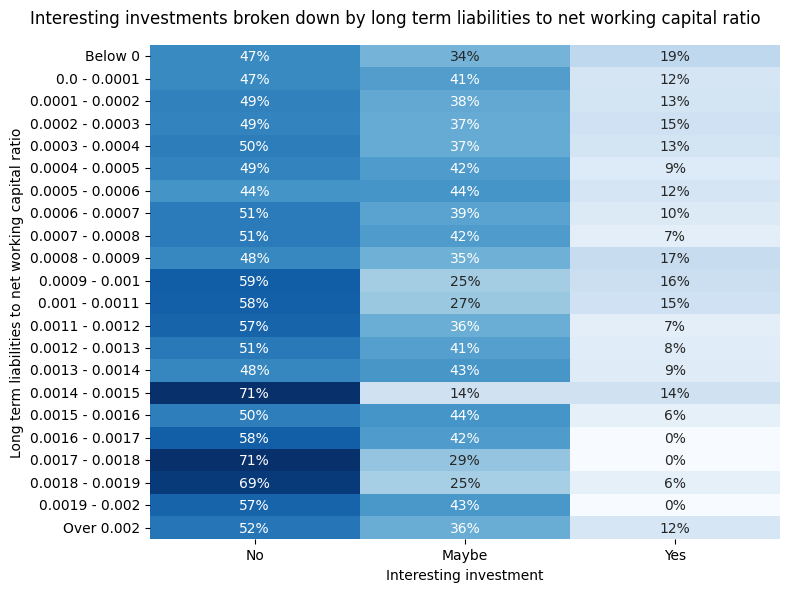

In [255]:
fig, ax = plt.subplots(figsize=(8, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_ent_df.long_term_liabilities_net_working_capital,
            bins=[-10] + list(np.arange(0, .0021, .0001)) + [.2],
            labels=['Below 0']
            + [f'{round(i,4)} - {round(i+.0001,4)}' for i in np.arange(0, .002, .0001)]
            + ['Over 0.002']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.tick_params(axis='y', labelrotation=0)
ax.set_xlabel('Interesting investment')
ax.set_ylabel('Long term liabilities to net working capital ratio')

plt.suptitle('Interesting investments broken down by long '\
    'term liabilities to net working capital ratio')

plt.tight_layout();

Another criterion is that the company should show positive net earnings in each of the previous five years. Only 21% of the observations meet this condition, while the percentage increases as the number of years decreases and is 29%, 39%, 49% and 65% for the 4, 3, 2 and 1 year versions respectively.

The charts below show that companies that have reported positive net earnings in each year for the previous 5 and 4 years actually perform slightly better. Likewise, companies that simply had positive net earnings in the previous year, while in the 3 and 2 year versions this fact did not affect performance. This criterion is somewhat restrictive, so if it limits the number of buy signals too much, we will use the 4-year or even 1-year version.

In [256]:
print('Net earnings from the 5 previous years in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.pos_net_earnings_2Y == 1) &
    (graham_ent_df.pos_net_earnings_3Y == 1) &
    (graham_ent_df.pos_net_earnings_4Y == 1) &
    (graham_ent_df.pos_net_earnings_5Y == 1),
    'Positive', 'Negative'
)).value_counts())
print('\nNet earnings from the 4 previous years in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.pos_net_earnings_2Y == 1) &
    (graham_ent_df.pos_net_earnings_3Y == 1) &
    (graham_ent_df.pos_net_earnings_4Y == 1),
    'Positive', 'Negative'
)).value_counts())
print('\nNet earnings from the 3 previous years in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.pos_net_earnings_2Y == 1) &
    (graham_ent_df.pos_net_earnings_3Y == 1),
    'Positive', 'Negative'
)).value_counts())
print('\nNet earnings from the 2 previous years in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.pos_net_earnings_2Y == 1),
    'Positive', 'Negative'
)).value_counts())
print('\nNet earnings from the previous year in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    graham_ent_df.pos_net_earnings_1Y == 1,
    'Positive', 'Negative'
)).value_counts())

Net earnings from the 5 previous years in Graham's entrepreneurial strategy:
Negative    3859
Positive    1048
dtype: int64

Net earnings from the 4 previous years in Graham's entrepreneurial strategy:
Negative    3500
Positive    1407
dtype: int64

Net earnings from the 3 previous years in Graham's entrepreneurial strategy:
Negative    2993
Positive    1914
dtype: int64

Net earnings from the 2 previous years in Graham's entrepreneurial strategy:
Negative    2501
Positive    2406
dtype: int64

Net earnings from the previous year in Graham's entrepreneurial strategy:
Positive    3200
Negative    1707
dtype: int64


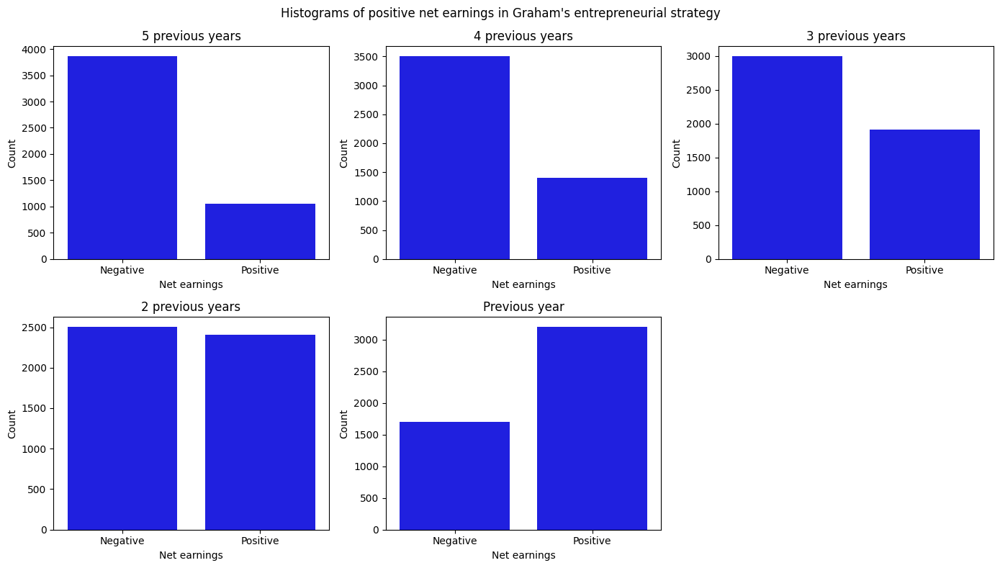

In [257]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

sns.countplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1) &
        (graham_ent_df.pos_net_earnings_4Y == 1) &
        (graham_ent_df.pos_net_earnings_5Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    color='blue',
    ax=axs[0, 0]
)

sns.countplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1) &
        (graham_ent_df.pos_net_earnings_4Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    color='blue',
    ax=axs[0, 1]
)

sns.countplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    color='blue',
    ax=axs[0, 2]
)

sns.countplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    color='blue',
    ax=axs[1, 0]
)

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.pos_net_earnings_1Y == 1,
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    color='blue',
    ax=axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_xlabel('Net earnings')
        axs[i, j].set_ylabel('Count')

plt.suptitle('Histograms of positive net earnings in Graham\'s entrepreneurial strategy')
axs[0, 0].set_title('5 previous years')
axs[0, 1].set_title('4 previous years')
axs[0, 2].set_title('3 previous years')
axs[1, 0].set_title('2 previous years')
axs[1, 1].set_title('Previous year')

axs[1, 2].axis('off')

plt.tight_layout();

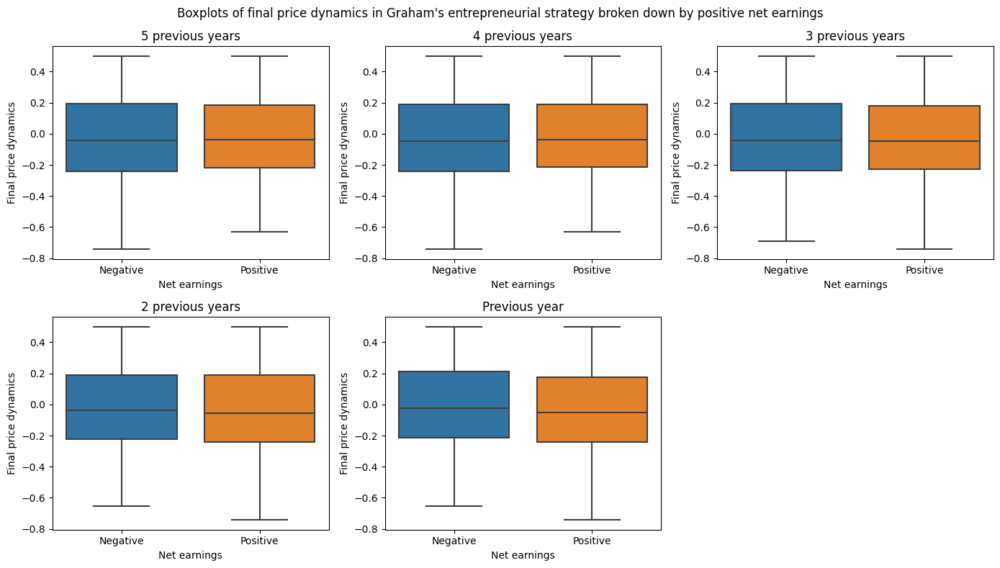

In [258]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

sns.boxplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1) &
        (graham_ent_df.pos_net_earnings_4Y == 1) &
        (graham_ent_df.pos_net_earnings_5Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 0]
)

sns.boxplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1) &
        (graham_ent_df.pos_net_earnings_4Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 1]
)

sns.boxplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1) &
        (graham_ent_df.pos_net_earnings_3Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 2]
)

sns.boxplot(
    x=pd.Series(np.where(
        (graham_ent_df.pos_net_earnings_1Y == 1) &
        (graham_ent_df.pos_net_earnings_2Y == 1),
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1, 0]
)

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.pos_net_earnings_1Y == 1,
        'Positive', 'Negative'
    )),
    order=['Negative', 'Positive'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_xlabel('Net earnings')
        axs[i, j].set_ylabel('Final price dynamics')

plt.suptitle('Boxplots of final price dynamics in Graham\'s entrepreneurial '\
    'strategy broken down by positive net earnings')
axs[0, 0].set_title('5 previous years')
axs[0, 1].set_title('4 previous years')
axs[0, 2].set_title('3 previous years')
axs[1, 0].set_title('2 previous years')
axs[1, 1].set_title('Previous year')

axs[1, 2].axis('off')

plt.tight_layout();

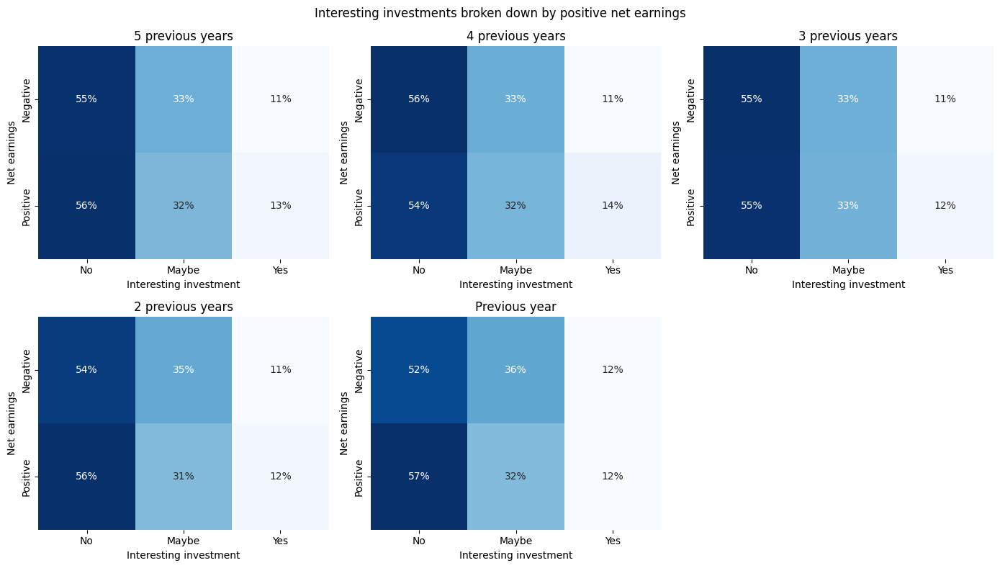

In [259]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (graham_ent_df.pos_net_earnings_1Y == 1) &
            (graham_ent_df.pos_net_earnings_2Y == 1) &
            (graham_ent_df.pos_net_earnings_3Y == 1) &
            (graham_ent_df.pos_net_earnings_4Y == 1) &
            (graham_ent_df.pos_net_earnings_5Y == 1),
            'Positive', 'Negative'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (graham_ent_df.pos_net_earnings_1Y == 1) &
            (graham_ent_df.pos_net_earnings_2Y == 1) &
            (graham_ent_df.pos_net_earnings_3Y == 1) &
            (graham_ent_df.pos_net_earnings_4Y == 1),
            'Positive', 'Negative'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 1]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (graham_ent_df.pos_net_earnings_1Y == 1) &
            (graham_ent_df.pos_net_earnings_2Y == 1) &
            (graham_ent_df.pos_net_earnings_3Y == 1),
            'Positive', 'Negative'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 2]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            (graham_ent_df.pos_net_earnings_1Y == 1) &
            (graham_ent_df.pos_net_earnings_2Y == 1),
            'Positive', 'Negative'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1, 0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.pos_net_earnings_1Y == 1,
            'Positive', 'Negative'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_xlabel('Interesting investment')
        axs[i, j].set_ylabel('Net earnings')

plt.suptitle('Interesting investments broken down by positive net earnings')
axs[0, 0].set_title('5 previous years')
axs[0, 1].set_title('4 previous years')
axs[0, 2].set_title('3 previous years')
axs[1, 0].set_title('2 previous years')
axs[1, 1].set_title('Previous year')

axs[1, 2].axis('off')

plt.tight_layout();

The next criterion is also related to net earnings: it requires that current earnings are higher than those of five years ago. However, only 4% of the observations meet this condition, while for the 4, 3, 2 and 1 year versions, 14%, 28%, 46% and 65% respectively.

The charts below demonstrate that such a criterion does indeed have an impact on the company's performance for the 5, 4 and 3 year versions - in particular, comparing current net earnings with those 4 years earlier significantly reduces the proportion of investments making a loss. In contrast, for the 2 and 1 year versions the differences are small.

In [260]:
print('Current net earnings greater than net earnings 5 years ago:')
print(pd.Series(np.where(
    graham_ent_df.net_earnings > graham_ent_df.net_earnings_5Y,
    'Yes', 'No'
)).value_counts())
print('\nCurrent net earnings greater than net earnings 4 years ago:')
print(pd.Series(np.where(
    graham_ent_df.net_earnings > graham_ent_df.net_earnings_4Y,
    'Yes', 'No'
)).value_counts())
print('\nCurrent net earnings greater than net earnings 3 years ago:')
print(pd.Series(np.where(
    graham_ent_df.net_earnings > graham_ent_df.net_earnings_3Y,
    'Yes', 'No'
)).value_counts())
print('\nCurrent net earnings greater than net earnings 2 years ago:')
print(pd.Series(np.where(
    graham_ent_df.net_earnings > graham_ent_df.net_earnings_2Y,
    'Yes', 'No'
)).value_counts())
print('\nCurrent net earnings greater than net earnings 1 year ago:')
print(pd.Series(np.where(
    graham_ent_df.net_earnings > graham_ent_df.net_earnings_1Y,
    'Yes', 'No'
)).value_counts())

Current net earnings greater than net earnings 5 years ago:
No     4695
Yes     212
dtype: int64

Current net earnings greater than net earnings 4 years ago:
No     4234
Yes     673
dtype: int64

Current net earnings greater than net earnings 3 years ago:
No     3509
Yes    1398
dtype: int64

Current net earnings greater than net earnings 2 years ago:
No     2628
Yes    2279
dtype: int64

Current net earnings greater than net earnings 1 year ago:
Yes    3184
No     1723
dtype: int64


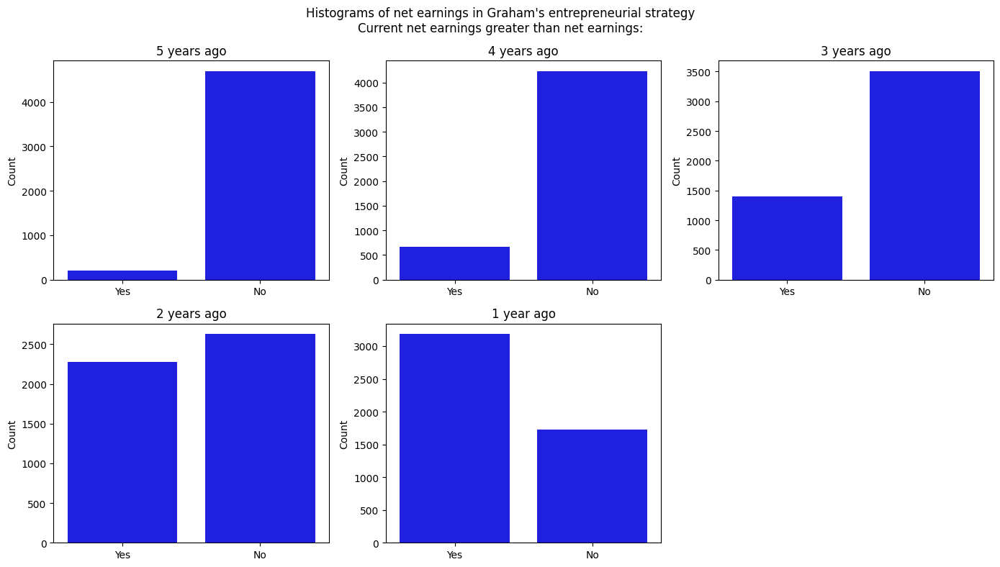

In [261]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_5Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[0, 0]
)

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_4Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[0, 1]
)

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_3Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[0, 2]
)

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_2Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[1, 0]
)

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_1Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_ylabel('Count')

plt.suptitle('Histograms of net earnings in Graham\'s entrepreneurial strategy'\
    '\nCurrent net earnings greater than net earnings:')
axs[0, 0].set_title('5 years ago')
axs[0, 1].set_title('4 years ago')
axs[0, 2].set_title('3 years ago')
axs[1, 0].set_title('2 years ago')
axs[1, 1].set_title('1 year ago')

axs[1, 2].axis('off')

plt.tight_layout();

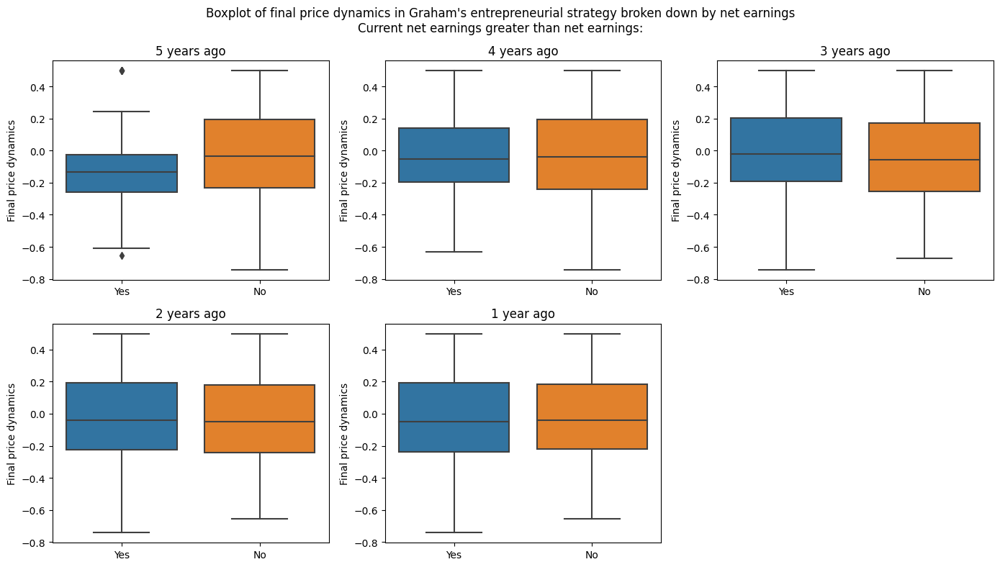

In [262]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_5Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 0]
)

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_4Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 1]
)

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_3Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0, 2]
)

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_2Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1, 0]
)

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.net_earnings > graham_ent_df.net_earnings_1Y,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s entrepreneurial strategy '\
    'broken down by net earnings'\
    '\nCurrent net earnings greater than net earnings:')
axs[0, 0].set_title('5 years ago')
axs[0, 1].set_title('4 years ago')
axs[0, 2].set_title('3 years ago')
axs[1, 0].set_title('2 years ago')
axs[1, 1].set_title('1 year ago')

axs[1, 2].axis('off')

plt.tight_layout();

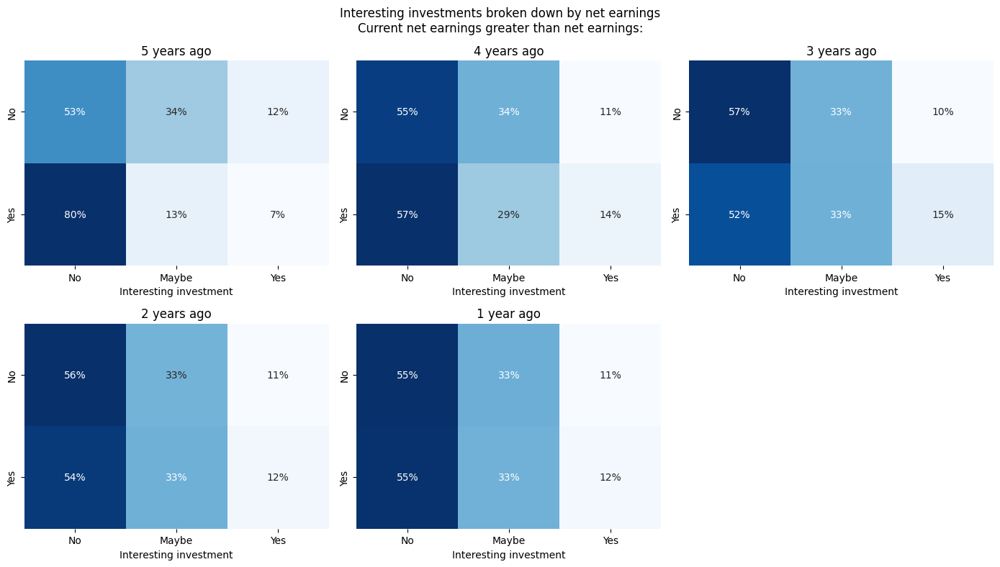

In [263]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.net_earnings > graham_ent_df.net_earnings_5Y,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.net_earnings > graham_ent_df.net_earnings_4Y,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 1]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.net_earnings > graham_ent_df.net_earnings_3Y,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0, 2]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.net_earnings > graham_ent_df.net_earnings_2Y,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1, 0]
)

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.net_earnings > graham_ent_df.net_earnings_1Y,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1, 1]
)

for i in range(2):
    for j in range(3):
        axs[i, j].set_xlabel('Interesting investment')
        axs[i, j].set_ylabel('')

plt.suptitle('Interesting investments broken down by net earnings'\
    '\nCurrent net earnings greater than net earnings:')
axs[0, 0].set_title('5 years ago')
axs[0, 1].set_title('4 years ago')
axs[0, 2].set_title('3 years ago')
axs[1, 0].set_title('2 years ago')
axs[1, 1].set_title('1 year ago')

axs[1, 2].axis('off')

plt.tight_layout();

53% of observations met another criterion: the company should have paid a dividend in the previous year. Such companies had a lower percentage of loss-making investments.

In [264]:
print('Dividend paid in the previous year:')
print(pd.Series(np.where(
    graham_ent_df.dividend_1Y == 1,
    'Yes', 'No'
)).value_counts())

Dividend paid in the previous year:
Yes    2606
No     2301
dtype: int64


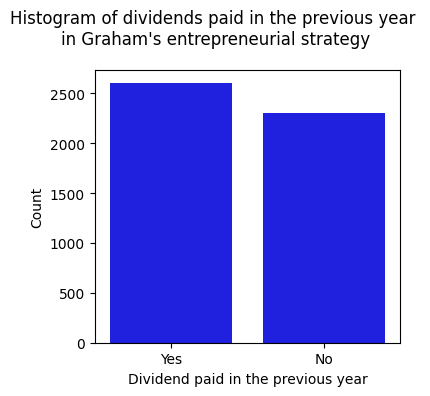

In [265]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.countplot(
    x=pd.Series(np.where(
        graham_ent_df.dividend_1Y == 1,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    color='blue',
    ax=ax
)

ax.set_xlabel('Dividend paid in the previous year')
ax.set_ylabel('Count')

plt.suptitle('Histogram of dividends paid in the previous year '\
    '\nin Graham\'s entrepreneurial strategy')

plt.tight_layout();

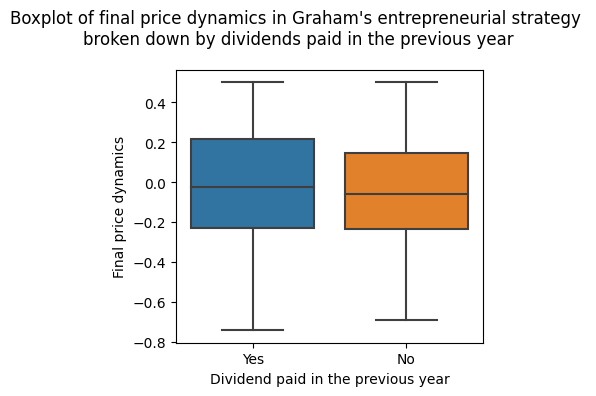

In [266]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.boxplot(
    x=pd.Series(np.where(
        graham_ent_df.dividend_1Y == 1,
        'Yes', 'No'
    )),
    order=['Yes', 'No'],
    y=graham_ent_df.final_price_dynamics,
    ax=ax
)

ax.set_xlabel('Dividend paid in the previous year')
ax.set_ylabel('Final price dynamics')

plt.suptitle('Boxplot of final price dynamics in Graham\'s entrepreneurial strategy '\
    '\nbroken down by dividends paid in the previous year')

plt.tight_layout();

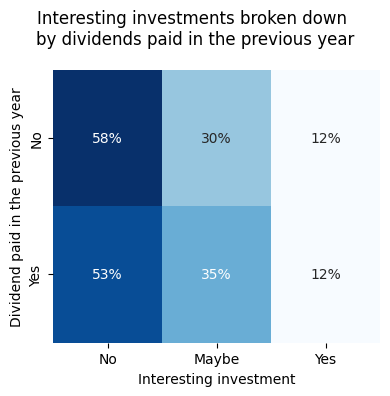

In [267]:
fig, ax = plt.subplots(figsize=(4, 4))

custom_heatmap(
    pd.crosstab(
        pd.Series(np.where(
            graham_ent_df.dividend_1Y == 1,
            'Yes', 'No'
        )),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    ax
)

ax.set_xlabel('Interesting investment')
ax.set_ylabel('Dividend paid in the previous year')

plt.suptitle('Interesting investments broken down \nby dividends paid in the previous year')

plt.tight_layout();

The range of price to Graham's book value (P/GBV) ratio feature is from 0.03 to to almost 15473 with mean value of 21.86, though the median is 4.61. Only 10% of observations met the criterion for this variable. As with the defensive strategy, observations with a low value for this indicator performed significantly better than others. Again, however, we will need to raise the threshold to increase the number of buy signals.

In [268]:
print('The basic statistics of P/GBV ratio in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.price_graham_book_value.describe())
print('\nP/GBV ratio in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    graham_ent_df.price_graham_book_value <= 1.2,
    'Below 1.2', 'Over 1.2'
)).value_counts())

The basic statistics of P/GBV ratio in Graham's entrepreneurial strategy:
count    4907.00
mean       21.86
std       261.67
min         0.03
25%         2.17
50%         4.61
75%         9.96
max     15472.58
Name: price_graham_book_value, dtype: float64

P/GBV ratio in Graham's entrepreneurial strategy:
Over 1.2     4398
Below 1.2     509
dtype: int64


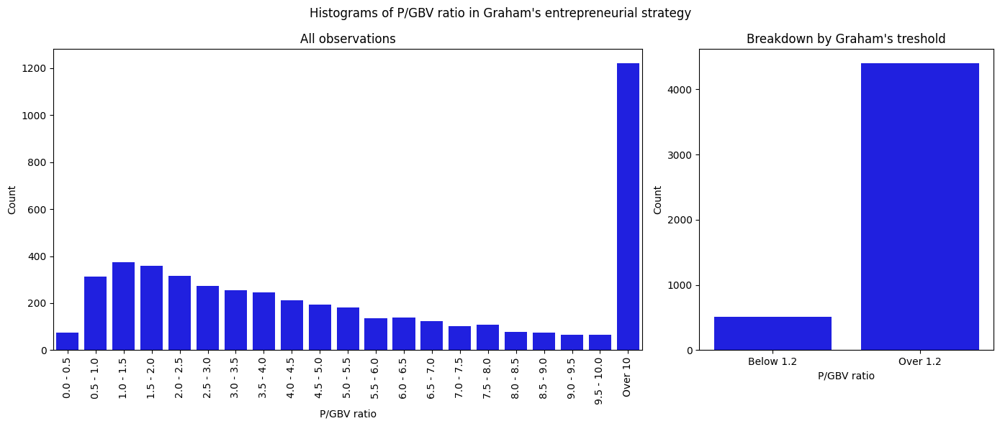

In [269]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.countplot(
    x=pd.cut(
        graham_ent_df.price_graham_book_value,
        bins=list(np.arange(0, 10.5, .5)) + [16000],
        labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_ent_df.price_graham_book_value,
        bins=[0, 1.2, 16000],
        labels=['Below 1.2', 'Over 1.2']
    ),
    color='blue',
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/GBV ratio')
    axs[i].set_ylabel('Count')
axs[1].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of P/GBV ratio in Graham\'s entrepreneurial strategy')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

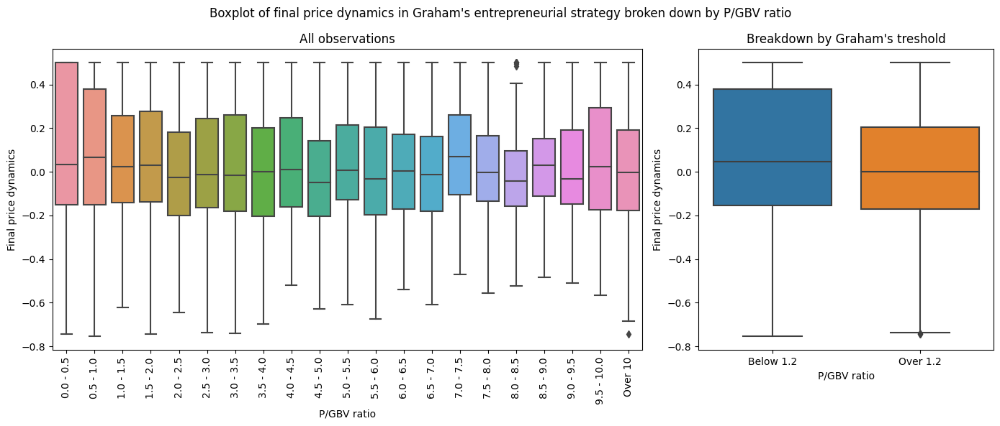

In [270]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.boxplot(
    x=pd.cut(
        graham_ent_df.price_graham_book_value,
        bins=list(np.arange(0, 10.5, .5)) + [16000],
        labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_ent_df.price_graham_book_value,
        bins=[0, 1.2, 16000],
        labels=['Below 1.2', 'Over 1.2']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1]
)

for i in range(2):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/GBV ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[1].tick_params(axis='x', labelrotation=0)

plt.suptitle('Boxplot of final price dynamics in '\
    'Graham\'s entrepreneurial strategy broken down by P/GBV ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

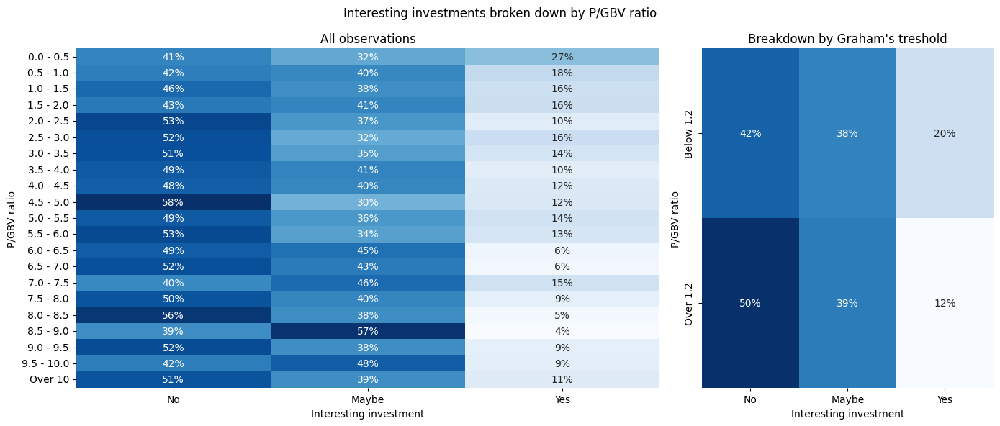

In [271]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [2, 1]})

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_ent_df.price_graham_book_value,
            bins=list(np.arange(0, 10.5, .5)) + [16000],
            labels=[f'{round(i,1)} - {round(i+.5,1)}' for i in np.arange(0, 10, .5)] + ['Over 10']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_ent_df.price_graham_book_value,
            bins=[0, 1.2, 16000],
            labels=['Below 1.2', 'Over 1.2']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

for i in range(2):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('P/GBV ratio')
axs[0].tick_params(axis='y', labelrotation=0)

plt.suptitle('Interesting investments broken down by P/GBV ratio')
axs[0].set_title('All observations')
axs[1].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

The range of P/E ratio feature is from 0.11 to to 130020 with mean value of 61.19, though the median is 11.98. 38% of observations met the criterion for this variable. The distribution of interesting investments is very similar to the defensive strategy, so similarly we will look for observations with as low a P/E ratio as possible.

In [272]:
print('The basic statistics of P/E ratio in Graham\'s entrepreneurial strategy:')
print(graham_ent_df.price_earnings.describe())
print('\nP/E ratio in Graham\'s entrepreneurial strategy:')
print(pd.Series(np.where(
    graham_ent_df.price_earnings <= 10,
    'Below 10', 'Over 10'
)).value_counts())

The basic statistics of P/E ratio in Graham's entrepreneurial strategy:
count     4907.00
mean        61.19
std       1881.58
min          0.11
25%          7.92
50%         11.98
75%         18.18
max     130019.98
Name: price_earnings, dtype: float64

P/E ratio in Graham's entrepreneurial strategy:
Over 10     3044
Below 10    1863
dtype: int64


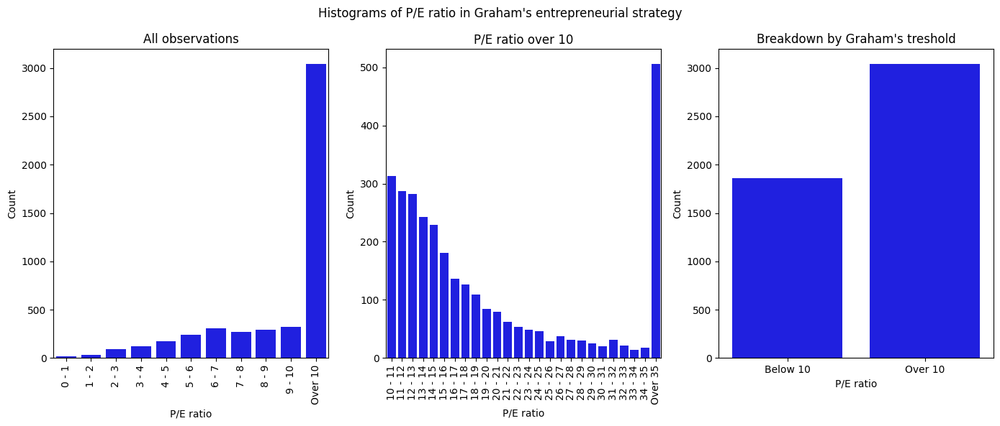

In [273]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.countplot(
    x=pd.cut(
        graham_ent_df.price_earnings,
        bins=list(range(11)) + [150000],
        labels=[f'{i} - {i+1}' for i in range(10)] + ['Over 10']
    ),
    color='blue',
    ax=axs[0]
)

sns.countplot(
    x=pd.cut(
        graham_ent_df[graham_ent_df.price_earnings > 10].price_earnings,
        bins=list(range(10, 36)) + [150000],
        labels=[f'{i} - {i+1}' for i in range(10, 35)] + ['Over 35']
    ),
    color='blue',
    ax=axs[1]
)

sns.countplot(
    x=pd.cut(
        graham_ent_df.price_earnings,
        bins=[0, 10, 150000],
        labels=['Below 10', 'Over 10']
    ),
    color='blue',
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/E ratio')
    axs[i].set_ylabel('Count')
axs[2].tick_params(axis='x', labelrotation=0)

plt.suptitle('Histograms of P/E ratio in Graham\'s entrepreneurial strategy')
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 10')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

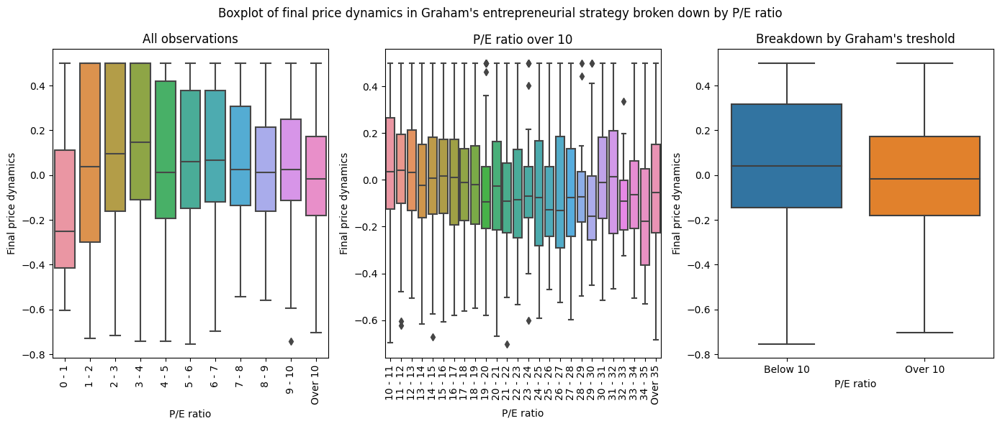

In [274]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

sns.boxplot(
    x=pd.cut(
        graham_ent_df.price_earnings,
        bins=list(range(11)) + [150000],
        labels=[f'{i} - {i+1}' for i in range(10)] + ['Over 10']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[0]
)

sns.boxplot(
    x=pd.cut(
        graham_ent_df[graham_ent_df.price_earnings > 10].price_earnings,
        bins=list(range(10, 36)) + [150000],
        labels=[f'{i} - {i+1}' for i in range(10, 35)] + ['Over 35']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[1]
)

sns.boxplot(
    x=pd.cut(
        graham_ent_df.price_earnings,
        bins=[0, 10, 150000],
        labels=['Below 10', 'Over 10']
    ),
    y=graham_ent_df.final_price_dynamics,
    ax=axs[2]
)

for i in range(3):
    axs[i].tick_params(axis='x', labelrotation=90)
    axs[i].set_xlabel('P/E ratio')
    axs[i].set_ylabel('Final price dynamics')
axs[2].tick_params(axis='x', labelrotation=0)
plt.suptitle(
    'Boxplot of final price dynamics in Graham\'s entrepreneurial strategy broken down by P/E ratio'
)
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 10')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

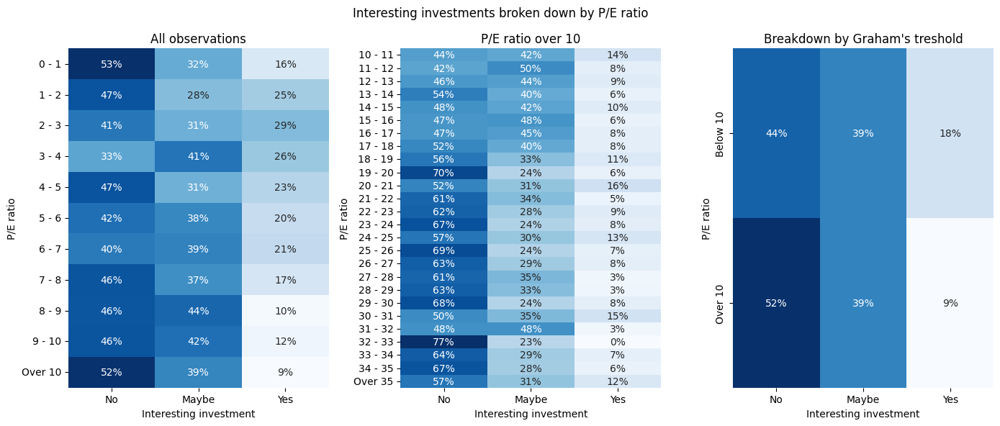

In [275]:
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_ent_df.price_earnings,
            bins=list(range(11)) + [150000],
            labels=[f'{i} - {i+1}' for i in range(10)] + ['Over 10']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[0]
)

custom_heatmap(
    pd.crosstab(
        pd.cut(
            graham_ent_df[graham_ent_df.price_earnings > 10].price_earnings,
            bins=list(range(10, 36)) + [150000],
            labels=[f'{i} - {i+1}' for i in range(10, 35)] + ['Over 35']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[1]
)

custom_heatmap(
    pd.crosstab(
            pd.cut(
            graham_ent_df.price_earnings,
            bins=[0, 10, 150000],
            labels=['Below 10', 'Over 10']
        ),
        graham_ent_df.interesting_investment,
        normalize='index'
    ).reindex(['No', 'Maybe', 'Yes'], axis=1),
    axs[2]
)

for i in range(3):
    axs[i].set_xlabel('Interesting investment')
    axs[i].set_ylabel('P/E ratio')
axs[2].tick_params(axis='y', labelrotation=90)

plt.suptitle('Interesting investments broken down by P/E ratio')
axs[0].set_title('All observations')
axs[1].set_title('P/E ratio over 10')
axs[2].set_title('Breakdown by Graham\'s treshold')

plt.tight_layout();

By adopting the above assumptions regarding the indicators proposed in Graham's entrepreneurial strategy, we can check what value ranges we should adopt for each variable. The general assumption is that the strategies should bring positive profits on average and meet the requirement of minimum portfolio filling (i.e. at least 10 companies in each quarter) in at least 80% of the analyzed period (i.e. in at least 55 quarters) - unfortunately, the data set is so small for this strategy that we have to loosen this criterion and select strategies that have filled the portfolio in at least 50 quarters. The preferred strategy will firstly have the lowest percentage of buy signals that end in a loss, and secondly the highest possible average return on investment. The best results are provided by choosing companies, which have:
- long term liabilities to net working capital between 0 and 0.0002,
- positive earnings in the previous year,
- current net earnings greater than net earnings 1 year ago,
- P/GBV ratio below 4,
- P/E ratio below 15.

In [276]:
graham_ent_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean()
})

graham_ent_portfolio_df = pd.DataFrame({
    'buy_in_q':pd.Series(
        graham_ent_df[
            graham_ent_df.buy == 'Yes'
        ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
    'sell_in_q':pd.Series(
        graham_ent_df[
            graham_ent_df.buy == 'Yes'
        ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
    ),
})
graham_ent_portfolio_df['Graham\'s entrepreneurial strategy'] = (
    graham_ent_portfolio_df.buy_in_q - graham_ent_portfolio_df.sell_in_q
).cumsum()
graham_ent_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

In [280]:
graham_ent_mod_df = {
    'Long term liabilities to net working capital between 0 and:':[],
    'Positive net earnings in each of the previous:':[],
    'Current net earnings greater than net earnings:':[],
    'P/GBV ratio below:':[],
    'P/E ratio below:':[],
    'Average return (%)':[],
    'Number of quarters with portfolio size over 10':[],
    'Number of profitable quarters':[],
    'Number of quarters in which strategy outperformed zero effort strategy':[],
    'Percentage of profitable investments':[],
    'Percentage of loss-making investments':[]
}

for mod_1 in np.arange(.0001, .0031, .0001): # long_term_liabilities_net_working_capital
    for mod_2 in range(1, 6): # pos_net_earnings
        for mod_3 in range(1, 6): # net_earnings
            for mod_4 in np.arange(.5, 5.5, .5): # price_graham_book_value
                for mod_5 in range(5, 20, 5): # price_earnings
                    graham_ent_df['mod_buy'] = np.where(
                        (graham_ent_df.long_term_liabilities_net_working_capital > 0) &
                        (graham_ent_df.long_term_liabilities_net_working_capital <= mod_1) &
                        (
                            (
                                (graham_ent_df.pos_net_earnings_1Y == 1) &
                                (mod_2 == 1)
                            ) |
                            (
                                (graham_ent_df.pos_net_earnings_1Y == 1) &
                                (graham_ent_df.pos_net_earnings_2Y == 1) &
                                (mod_2 == 2)
                            ) |
                            (
                                (graham_ent_df.pos_net_earnings_1Y == 1) &
                                (graham_ent_df.pos_net_earnings_2Y == 1) &
                                (graham_ent_df.pos_net_earnings_3Y == 1) &
                                (mod_2 == 3)
                            ) |
                            (
                                (graham_ent_df.pos_net_earnings_1Y == 1) &
                                (graham_ent_df.pos_net_earnings_2Y == 1) &
                                (graham_ent_df.pos_net_earnings_3Y == 1) &
                                (graham_ent_df.pos_net_earnings_4Y == 1) &
                                (mod_2 == 4)
                            ) |
                            (
                                (graham_ent_df.pos_net_earnings_1Y == 1) &
                                (graham_ent_df.pos_net_earnings_2Y == 1) &
                                (graham_ent_df.pos_net_earnings_3Y == 1) &
                                (graham_ent_df.pos_net_earnings_4Y == 1) &
                                (graham_ent_df.pos_net_earnings_5Y == 1) &
                                (mod_2 == 5)
                            )
                        ) &
                        (graham_ent_df.net_earnings > graham_ent_df[f'net_earnings_{mod_3}Y']) &
                        (graham_ent_df.price_graham_book_value <= mod_4) &
                        (graham_ent_df.price_earnings <= mod_5),
                        'Yes', 'No'
                    )

                    if graham_ent_df[graham_ent_df.mod_buy == 'Yes'].shape[0] > 0:
                        # Return on Modified Graham\'s entrepreneurial strategy
                        graham_ent_return_df[
                            'Modified Graham\'s entrepreneurial strategy'
                        ] = graham_ent_df[
                            graham_ent_df.mod_buy == 'Yes'
                        ].groupby('quarter').final_price_dynamics.mean()
                        avg_strategy_return = (
                            100 * graham_ent_return_df[
                                'Modified Graham\'s entrepreneurial strategy'].mean()
                        ).round(2)

                        # If positive
                        if avg_strategy_return > 0:

                            # Size of portfolio in Modified Graham\'s entrepreneurial strategy
                            graham_ent_portfolio_df['buy_in_q'] = pd.Series(
                                graham_ent_df[
                                    graham_ent_df.mod_buy == 'Yes'
                                ].groupby('quarter').quarter.count().reindex(
                                    sorted(dataset.quarter.unique())).fillna(0)
                            )
                            graham_ent_portfolio_df['sell_in_q'] = pd.Series(
                                graham_ent_df[
                                    graham_ent_df.mod_buy == 'Yes'
                                ].groupby('sell_in_q').sell_in_q.count().reindex(
                                    sorted(dataset.quarter.unique())).fillna(0)
                            )

                            graham_ent_portfolio_df[
                                'Modified Graham\'s entrepreneurial strategy'
                            ] = (
                                graham_ent_portfolio_df.buy_in_q
                                - graham_ent_portfolio_df.sell_in_q
                            ).cumsum()
                            graham_ent_portfolio_df.drop(
                                ['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

                            quarters_with_good_portfolio_size = graham_ent_portfolio_df[
                                graham_ent_portfolio_df[
                                    'Modified Graham\'s entrepreneurial strategy'] >= 10
                            ]['Modified Graham\'s entrepreneurial strategy'].count()

                            # If number of quarters with good portfolio
                            # size > 50 (~70% of all quarters)
                            if quarters_with_good_portfolio_size > 50:

                                # Profitable quarters
                                quarters_profit_strat = graham_ent_return_df[
                                    graham_ent_return_df[
                                        'Modified Graham\'s entrepreneurial strategy'] > 0
                                ]['Modified Graham\'s entrepreneurial strategy'].count()

                                # Strategy > zero effort strategy
                                quarters_perform_strat = graham_ent_return_df[
                                    graham_ent_return_df[
                                        'Modified Graham\'s entrepreneurial strategy'
                                    ] > graham_ent_return_df['Zero effort strategy']
                                ]['Modified Graham\'s entrepreneurial strategy'].count()

                                graham_ent_mod_df[
                                    'Long term liabilities to net working '\
                                        'capital between 0 and:'
                                ].append(mod_1)
                                graham_ent_mod_df[
                                    'Positive net earnings in each of the previous:'].append(mod_2)
                                graham_ent_mod_df[
                                    'Current net earnings greater than net earnings:'].append(mod_3)
                                graham_ent_mod_df[
                                    'P/GBV ratio below:'].append(mod_4)
                                graham_ent_mod_df[
                                    'P/E ratio below:'].append(mod_5)
                                graham_ent_mod_df[
                                    'Average return (%)'].append(avg_strategy_return)
                                graham_ent_mod_df[
                                    'Number of quarters with portfolio size over 10'
                                ].append(quarters_with_good_portfolio_size)
                                graham_ent_mod_df[
                                    'Number of profitable quarters'
                                ].append(quarters_profit_strat)
                                graham_ent_mod_df[
                                    'Number of quarters in which strategy '\
                                        'outperformed zero effort strategy'
                                ].append(quarters_perform_strat)

                                # Number of signals
                                signals = graham_ent_df.mod_buy.value_counts()[1]

                                # Crosstab
                                ctab = pd.crosstab(
                                    graham_ent_df.interesting_investment,
                                    graham_ent_df.mod_buy,
                                    rownames=['Interesting investment:'],
                                    colnames=[
                                        'Buy signal from modified Graham\'s '\
                                            'entrepreneurial strategy:']
                                ).reindex(['No', 'Maybe', 'Yes'], axis=0)

                                # % of interesting_investment == Maybe or Yes
                                graham_ent_mod_df[
                                    'Percentage of profitable investments'
                                ].append(
                                    round(
                                        100 * (ctab.iloc[1, 1] + ctab.iloc[2, 1]) / signals
                                    )
                                )
                                # % of interesting_investment == No
                                graham_ent_mod_df[
                                    'Percentage of loss-making investments'
                                ].append(round(100 * ctab.iloc[0, 1] / signals))

graham_ent_mod_df = pd.DataFrame(graham_ent_mod_df)

print('Data frame with best modifications of Graham\'s entrepreneurial strategy:')
graham_ent_mod_df.sort_values(
    ['Percentage of loss-making investments', 'Average return (%)'], ascending=[True, False])

Data frame with best modifications of Graham's entrepreneurial strategy:


,Long term liabilities to net working capital between 0 and:,Positive net earnings in each of the previous:,Current net earnings greater than net earnings:,P/GBV ratio below:,P/E ratio below:,Average return (%),Number of quarters with portfolio size over 10,Number of profitable quarters,Number of quarters in which strategy outperformed zero effort strategy,Percentage of profitable investments,Percentage of loss-making investments
0,0.00,1,1,4.00,15,9.45,51,38,36,64,36
1,0.00,1,1,4.50,15,9.00,53,40,38,63,37
3,0.00,1,1,4.00,15,8.41,52,38,34,62,38
2,0.00,1,1,5.00,15,8.22,53,39,37,62,38
12,0.00,1,1,5.00,10,8.09,51,36,35,62,38
...,...,...,...,...,...,...,...,...,...,...,...
192,0.00,1,1,5.00,15,5.58,54,35,31,59,41
200,0.00,1,1,5.00,15,5.58,54,35,31,59,41
208,0.00,1,1,5.00,15,5.58,54,35,31,59,41
41,0.00,2,1,4.50,15,4.99,51,37,29,59,41


The modified Graham's entrepreneurial strategy classified 371 observations as worth buying (0 in original strategy), with 134 (36%) of them making a loss and 61 (16%) of them making a profit over 50%. These are comparable results to the defensive strategy, similarly this one primarily targeted observations with a profit of less than 50%.

In [283]:
# Add column 'mod_buy' for observations, which meet modified strategy conditions
graham_ent_df['mod_buy'] = np.where(
    (graham_ent_df.long_term_liabilities_net_working_capital > 0) &
    (graham_ent_df.long_term_liabilities_net_working_capital <= .0002) &
    (graham_ent_df.pos_net_earnings_1Y == 1) &
    (graham_ent_df.net_earnings > graham_ent_df.net_earnings_1Y) &
    (graham_ent_df.price_graham_book_value <= 4) &
    (graham_ent_df.price_earnings <= 15),
    'Yes', 'No'
)

print('\nNumber of buy signals from modified Graham\'s entrepreneurial strategy: '\
    f'{graham_ent_df.mod_buy.value_counts()[1]}')


Number of buy signals from modified Graham's entrepreneurial strategy: 371


In [284]:
pd.crosstab(
    graham_ent_df.interesting_investment,
    graham_ent_df.mod_buy,
    rownames=['Interesting investment:'],
    colnames=['Buy signal from modified Graham\'s entrepreneurial strategy:']
).reindex(['No', 'Maybe', 'Yes'], axis=0)

Buy signal from modified Graham's entrepreneurial strategy:,No,Yes
Interesting investment:,,
No,2269,134
Maybe,1714,176
Yes,553,61


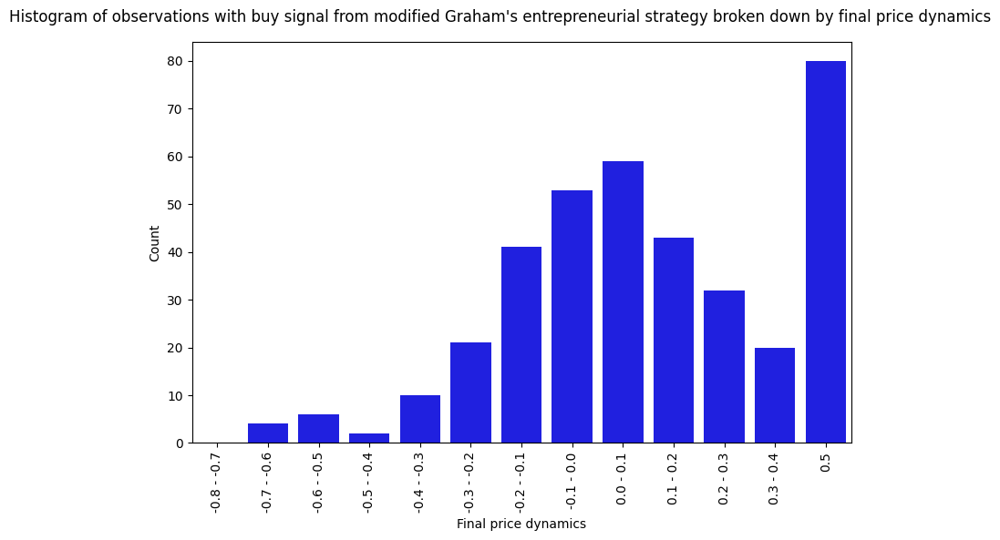

In [285]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.countplot(
    x=pd.cut(
        graham_ent_df[graham_ent_df.mod_buy == 'Yes'].final_price_dynamics,
        bins=list(np.linspace(-.8, .5, 14)),
        labels=[f'{round(i, 1)} - {round(i + .1, 1)}' for i in np.linspace(-.8, .3, 12)] + ['0.5']
    ),
    color='blue',
    ax=ax
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Final price dynamics')
ax.set_ylabel('Count')

plt.suptitle('Histogram of observations with buy signal from modified Graham\'s entrepreneurial '\
    'strategy broken down by final price dynamics')

plt.tight_layout();

The modified Graham's defensive strategy was profitable in 38 of analyzed quarters and outperformed zero effort strategy (i.e. investing in WIG) in 36 of analyzed periods. Moreover, the modified strategy brought the average profit of 9.45%. The average return on investment using the modified strategy is also higher than average profit from the zero growth strategy. Again, the strategy achieved comparable results to its defensive variant.

In [286]:
graham_ent_return_df['Modified Graham\'s entrepreneurial strategy'] = graham_ent_df[
        graham_ent_df.mod_buy == 'Yes'
    ].groupby('quarter').final_price_dynamics.mean()

graham_ent_portfolio_df['buy_in_q'] = pd.Series(
    graham_ent_df[
        graham_ent_df.mod_buy == 'Yes'
    ].groupby('quarter').quarter.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
graham_ent_portfolio_df['sell_in_q'] = pd.Series(
    graham_ent_df[
        graham_ent_df.mod_buy == 'Yes'
    ].groupby('sell_in_q').sell_in_q.count().reindex(sorted(dataset.quarter.unique())).fillna(0)
)
graham_ent_portfolio_df['Modified Graham\'s entrepreneurial strategy'] = (
    graham_ent_portfolio_df.buy_in_q - graham_ent_portfolio_df.sell_in_q
).cumsum()
graham_ent_portfolio_df.drop(['buy_in_q', 'sell_in_q'], axis=1, inplace=True)

strategy_stat(
    graham_ent_return_df, graham_ent_portfolio_df, 'Modified Graham\'s entrepreneurial strategy')

Number of quarters with buy signal from Modified Graham's entrepreneurial strategy: 55
Number of quarters with sufficient portfolio size: 51
Number of profitable quarters using Modified Graham's entrepreneurial strategy: 38
Number of profitable quarters using zero effort strategy: 43
Number of quarters in which Modified Graham's entrepreneurial strategy outperformed zero effort strategy: 36
Average return on Modified Graham's entrepreneurial strategy: 9.45%
Average return on zero effort strategy: 5.6%


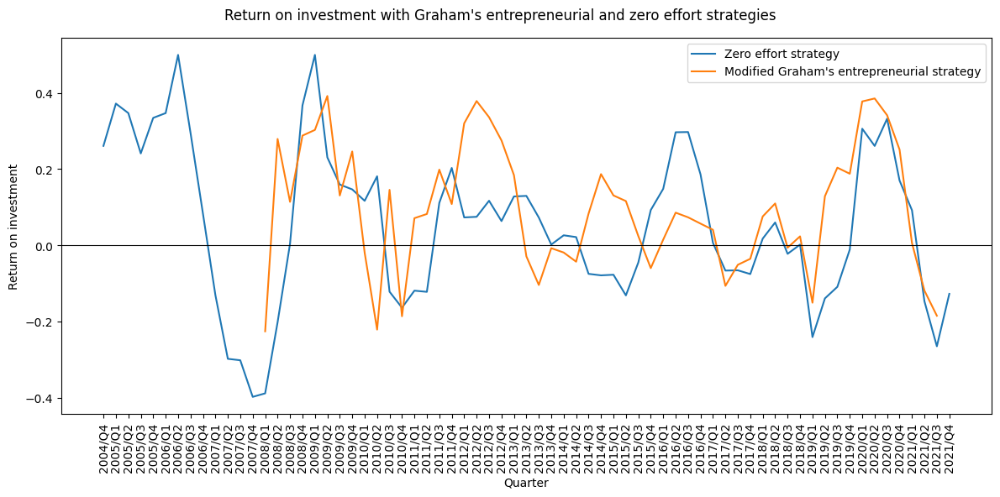

In [287]:
fig, ax = plt.subplots(figsize=(12, 6))

plt.plot(
    graham_ent_return_df.index,
    graham_ent_return_df
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

ax.legend(labels=['Zero effort strategy', 'Modified Graham\'s entrepreneurial strategy'])

plt.suptitle('Return on investment with Graham\'s entrepreneurial and zero effort strategies')

plt.tight_layout();

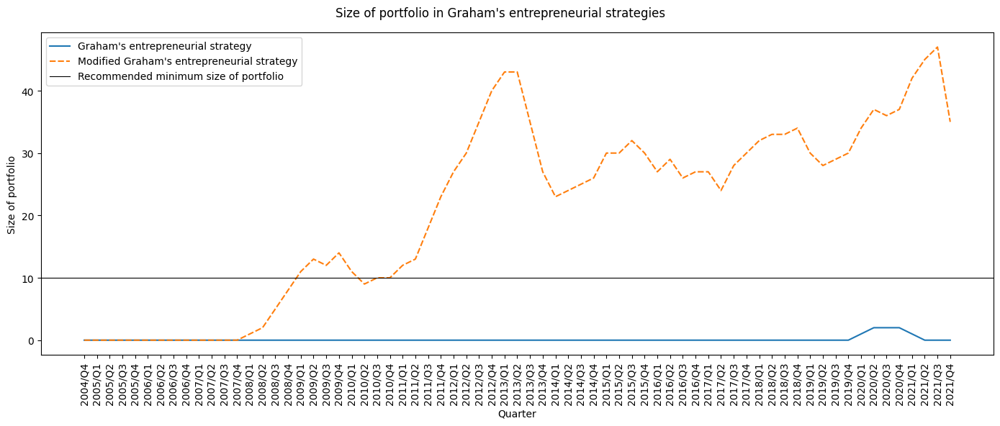

In [288]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=graham_ent_portfolio_df,
    ax=ax
)

ax.axhline(
    10, color='black', linewidth=.8,
    label='Recommended minimum size of portfolio'
)

ax.tick_params(axis='x', labelrotation=90)

ax.set_xlabel('Quarter')
ax.set_ylabel('Size of portfolio')

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = list(graham_ent_portfolio_df.columns) + ['Recommended minimum size of portfolio']
)

plt.suptitle('Size of portfolio in Graham\'s entrepreneurial strategies')

plt.tight_layout();

# Summary

At the start of the analysis, we assumed that the preferred strategy would minimise losses, even if this came at the expense of higher returns. In general, however, a low percentage of missed investments or quarters with a loss went hand in hand with a high average return.

Of the gurus' strategies analysed, only one of them - Zweig's - was able to fill the portfolio to a minimal degree without any modification. Nevertheless, it was only marginally better than the zero effort strategy, i.e. simply investing in the WIG stock index. The strategy recorded the highest percentage of buy signals that resulted in a loss (percentage of loss-making investments in the table below) - 51%. Likewise, it performed similarly poorly in selecting companies that delivered growth above 50% (percentage of profitable investments (50%) in the table below) - only 17% of buy signals, yielded such high returns.

Graham's modified strategies fared better and only just over a third of their buy signals would result in a loss. However, at the same time, these strategies performed very poorly in finding observations yielding returns above 50% - in both cases, around 16% of the buy signals would have yielded such a high return. The strategies primarily targeted companies that were profitable but less than 50%. Nevertheless, the biggest problem is the poor portfolio fill in these strategies. In contrast, Greenblatt's modified strategy performed better in selecting high-yielding investments and was also able to fill the portfolio correctly, but made losses in more than one-third of the quarters analysed and ultimately produced comparable returns to Graham's strategies.

Of the top four strategies, the modified Kirkpatrick strategy stands out decisively. Not only did it achieve the lowest percentage of missed investments (30%), it also produced the highest average return (18%). The biggest competitors were the modified Zweig's strategy, which was profitable in more than 80% of quarters and the outperformed zero effort strategy in almost 70% of quarters. However, it achieved a slightly worse average return (almost 15%).

Comparing the winning strategy with the zero effort strategy, we can see that, in general, in quarters when the latter was making losses, Kirkpatrick's modified strategy was able to stay afloat, or at least achieve lower losses. The exception was the period between Q4 2010 and Q2 2011.

In [289]:
# Filter data
summary_df = dataset.filter([
    'quarter', 'company_code', 'interesting_investment',
    'final_price_dynamics', 'adj_best_price_dynamics_y', 'adj_price_dynamics_y',
    'best_price_dynamics_in_q', 'price_dynamics_y_in_q',
    'final_wig_dynamics', 'adj_best_wig_dynamics_y', 'adj_wig_dynamics_y',
    # Greenblatt
    'capitalization_usd', 'ev_ebit', 'roic',
    # Zweig
    'net_earnings_yy', 'net_earnings_1Q', 'net_earnings_2Q', 'net_earnings_5Q', 'net_earnings_6Q',
    'sales_revenues_yy', 'sales_revenues_1Q', 'sales_revenues_2Q', 'sales_revenues_5Q',
    'sales_revenues_6Q', 'relative_strength_6m', 'price_earnings', 'avg_price_earnings',
    # Kirkpatrick
    'rank_ebit_yy', 'rank_price_sales_revenues',
    #Lynch
    'price_earnings_net_earnings_yy',
    # PPD
    'price_book_value', 'roce', 'net_debt_ebit',
    # Graham defensive
    'sales_revenues_1Y_usd', 'long_term_liabilities_net_working_capital', 'continuous_price_growth',
    'continuous_dividend', 'sum_earnings_share_1Y_earnings_per_share', 'price_graham_book_value',
    # Graham entrepreneurial
    'pos_net_earnings_1Y', 'net_earnings', 'net_earnings_1Y'
])

# Add column 'buy' for observations, which meet strategy conditions
summary_df['mod_greenblatt_buy'] = np.where(
    (summary_df.capitalization_usd < 50000000) &
    (summary_df.ev_ebit > 0) &
    (summary_df.ev_ebit < 3.8) &
    (summary_df.roic > .05),
    'Yes', 'No'
)
summary_df['zweig_buy'] = np.where(
    (summary_df.net_earnings_yy > 0.15) &
    (summary_df.sales_revenues_yy > 0.15) &
    (summary_df.net_earnings_1Q > summary_df.net_earnings_5Q) &
    (summary_df.net_earnings_2Q > summary_df.net_earnings_6Q) &
    (summary_df.sales_revenues_1Q > summary_df.sales_revenues_5Q) &
    (summary_df.sales_revenues_2Q > summary_df.sales_revenues_6Q) &
    (summary_df.relative_strength_6m > 0) &
    (summary_df.price_earnings < 2 * summary_df.avg_price_earnings),
    'Yes', 'No'
)
summary_df['mod_zweig_buy'] = np.where(
    (summary_df.net_earnings_yy > 1) &
    (summary_df.sales_revenues_yy > 0) &
    (summary_df.sales_revenues_yy < .5) &
    (summary_df.relative_strength_6m > 0) &
    (summary_df.price_earnings < 12),
    'Yes', 'No'
)
summary_df['mod_kirkpatrick_buy'] = np.where(
    (summary_df.relative_strength_6m > 0) &
    (summary_df.rank_ebit_yy <= 40) &
    (summary_df.rank_price_sales_revenues <= 30) &
    (summary_df.capitalization_usd < 4e7),
    'Yes', 'No'
)
summary_df['mod_lynch_buy'] = np.where(
    (summary_df.price_earnings_net_earnings_yy > 0) &
    (summary_df.price_earnings_net_earnings_yy < 3) &
    (summary_df.net_earnings_yy > 0) &
    (summary_df.capitalization_usd < 25e6),
    'Yes', 'No'
)
summary_df['mod_ppd_buy'] = np.where(
    (summary_df.price_book_value < 1) &
    (summary_df.price_earnings < 13) &
    (summary_df.roce > .07) &
    (summary_df.net_debt_ebit > -15000) &
    (summary_df.net_debt_ebit < 15000),
    'Yes', 'No'
)
summary_df['mod_graham_def_buy'] = np.where(
    (summary_df.sales_revenues_1Y_usd > 0) &
    (summary_df.long_term_liabilities_net_working_capital > 0) &
    (summary_df.long_term_liabilities_net_working_capital <= .0006) &
    (summary_df.continuous_dividend >= 1) &
    (summary_df.sum_earnings_share_1Y_earnings_per_share <= 70) &
    (summary_df.price_graham_book_value <= 4) &
    (summary_df.price_earnings <= 15),
    'Yes', 'No'
)
summary_df['mod_graham_ent_buy'] = np.where(
    (summary_df.long_term_liabilities_net_working_capital > 0) &
    (summary_df.long_term_liabilities_net_working_capital <= .0002) &
    (summary_df.pos_net_earnings_1Y == 1) &
    (summary_df.net_earnings > summary_df.net_earnings_1Y) &
    (summary_df.price_graham_book_value <= 4) &
    (summary_df.price_earnings <= 15),
    'Yes', 'No'
)

In [290]:
# Data frame with return on investment
summary_return_df = pd.DataFrame({
    'Zero effort strategy':dataset.groupby('quarter').final_wig_dynamics.mean(),
    'Modified Greenblatt\'s strategy':summary_df[
        summary_df.mod_greenblatt_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Zweig\'s strategy':summary_df[
        summary_df.zweig_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified Zweig\'s strategy':summary_df[
        summary_df.mod_zweig_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified Kirkpatrick\'s strategy':summary_df[
        summary_df.mod_kirkpatrick_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified Lynch\'s strategy':summary_df[
        summary_df.mod_lynch_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified PPD strategy':summary_df[
        summary_df.mod_ppd_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified Graham\'s defensive strategy':summary_df[
        summary_df.mod_graham_def_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
    'Modified Graham\'s entrepreneurial strategy':summary_df[
        summary_df.mod_graham_ent_buy == 'Yes'].groupby('quarter').final_price_dynamics.mean(),
})

In [291]:
# Final statistics
statistics_df = pd.DataFrame(index=[
    'Percentage of loss-making investments',
    'Percentage of profitable investments (below 50%)',
    'Percentage of profitable investments (50%)',
    'Percentage of loss-making quarters',
    'Percentage of profitable quarters',
    'Average return (%)',
    'Percentage of quarters in which strategy outperformed zero effort strategy'
])

buy_names = [
    'mod_greenblatt_buy', 'zweig_buy', 'mod_zweig_buy', 'mod_kirkpatrick_buy', 'mod_lynch_buy',
    'mod_ppd_buy', 'mod_graham_def_buy', 'mod_graham_ent_buy'
]

for i, strategy in enumerate(summary_return_df.columns):
    values = []

    if strategy == 'Zero effort strategy':
        values.append('-')
        values.append('-')
        values.append('-')
    else:
        signals = summary_df[buy_names[i-1]].value_counts()[1]
        ctab = pd.crosstab(
            summary_df.interesting_investment,
            summary_df[buy_names[i-1]],
        ).reindex(['No', 'Maybe', 'Yes'], axis=0)
        # Percentage of loss-making investments
        values.append(round(100 * ctab.iloc[0, 1] / signals, 2))
        # Percentage of profitable investments < 50%
        values.append(round(100 * ctab.iloc[1, 1] / signals, 2))
        # Percentage of profitable investments == 50%
        values.append(round(100 * ctab.iloc[2, 1] / signals, 2))

    # Number of NaNs in summary_return_df
    nan_num = summary_return_df[strategy].isna().sum()

    # Percentage of loss-making quarters
    values.append(
        round(
            100 * summary_return_df[
                summary_return_df[strategy] < 0][strategy].count() / (69 - nan_num), 2
        )
    )
    # Percentage of profitable quarters
    values.append(
        round(
            100 * summary_return_df[
                summary_return_df[strategy] > 0][strategy].count() / (69 - nan_num), 2
        )
    )
    # Average return
    values.append((100 * summary_return_df[strategy].mean()).round(2))

    if strategy == 'Zero effort strategy':
        values.append('-')
    else:
        # Percentage of quarters in which strategy outperformed zero effort strategy
        values.append(
            round(
                100 * summary_return_df[summary_return_df[strategy] > 0][strategy].count() / 69, 2)
        )

    statistics_df[strategy] = values

statistics_df

,Zero effort strategy,Modified Greenblatt's strategy,Zweig's strategy,Modified Zweig's strategy,Modified Kirkpatrick's strategy,Modified Lynch's strategy,Modified PPD strategy,Modified Graham's defensive strategy,Modified Graham's entrepreneurial strategy
Percentage of loss-making investments,-,36.62,51.14,34.37,30.36,34.69,35.33,38.15,36.12
Percentage of profitable investments (below 50%),-,30.43,31.35,36.61,30.69,28.96,40.38,44.95,47.44
Percentage of profitable investments (50%),-,32.94,17.51,29.02,38.94,36.35,24.29,16.90,16.44
Percentage of loss-making quarters,37.68,35.48,36.07,18.64,23.33,24.19,26.23,31.03,30.91
Percentage of profitable quarters,62.32,64.52,63.93,81.36,76.67,75.81,73.77,68.97,69.09
Average return (%),5.60,9.71,6.69,14.94,18.02,12.06,12.21,8.50,9.45
Percentage of quarters in which strategy outperformed zero effort strategy,-,57.97,56.52,69.57,66.67,68.12,65.22,57.97,55.07


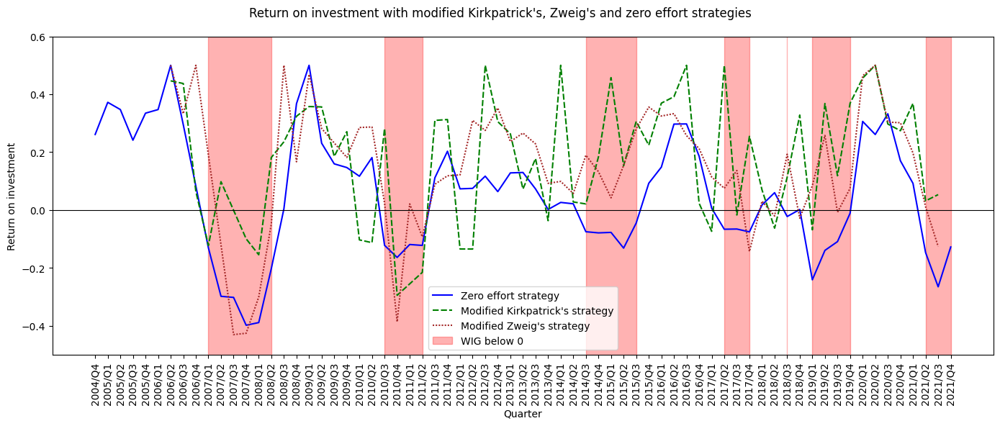

In [295]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.lineplot(
    data=summary_return_df.filter([
        'Zero effort strategy',
        'Modified Kirkpatrick\'s strategy',
        'Modified Zweig\'s strategy'
    ]),
    palette=['blue', 'green', 'brown'],
    ax=ax
)

ax.fill_between(
    range(69), -0.5, 1,
    where=summary_return_df['Zero effort strategy'] < 0,
    color='red', alpha=0.3, transform=ax.get_xaxis_transform(),
    label='WIG below 0'
)

ax.axhline(0, color='black', linewidth=.8)

ax.tick_params(axis='x', labelrotation=90)

ax.set_ylim([-.5, .6])

handles, _ = ax.get_legend_handles_labels()
plt.legend(
    handles = handles,
    labels = [
        'Zero effort strategy',
        'Modified Kirkpatrick\'s strategy',
        'Modified Zweig\'s strategy',
        'WIG below 0'
    ]
)

ax.set_ylabel('Return on investment')
ax.set_xlabel('Quarter')

plt.suptitle(
    'Return on investment with modified Kirkpatrick\'s, Zweig\'s and zero effort strategies')

plt.tight_layout();